# T cells mapped to T2T version 2.0
# Day 6 post EP for CRISPoff and unedited
# Pipeline to Extract and Analyze mC profiles from BAM files and look at Forward & Reverse strands

Date: Aug. 2, 2025
Modify the window of the input size

In [ ]:

import sys
from pathlib import Path
from datetime import datetime

from matplotlib import pyplot as plt 
import seaborn as sns
import pandas as pd
import numpy as np
# import time
# import shap


# Add the folder containing 'my_functions.py' to sys.path
sys.path.append("/home/michalula/code/epiCausality/epiCode/utils/") # str(Path(__file__).parent / 'utils'))

# Import the module or specific functions
# from /home/michalula/code/epiCausality/epiCode/utils/funcs_extract_mC_profiles_from_BAMs.py
# from funcs_extract_mC_profiles_from_BAMs import system_info, extract_from_bam
from funcs_extract_mC_profiles_from_BAMs import (
    system_info,
    get_reference_sequence,
    create_output_directory,
    extract_from_bam,
    process_extracted_reads,
    visualize_data,
    create_padded_reads,
    plot_padded_reads,
    save_padded_reads,
    remove_low_methylated_reads,
    process_extracted_reads_no_fully_unmethylated,
    create_padded_reads_no_fully_unmethylated
    # main,
)
from funcs_analize_forward_reverse_extracted_mC_reads import analize_forward_reverse_CGs_pipeline

In [ ]:
system_info()
date_today = datetime.today().strftime('%Y-%m-%d')
ref_genome_path = Path('/home/michalula/data/ref_genomes/t2t_v2_0/up_chm13v2.0.fasta')
reg_genome_version = "t2t_v2_0"
region_chr = 'chr1'

# 6500bps: EXACT cutting region  
# chr1:206,583,334-206,589,873
region_start = 206583334    + 20
region_end = 206589874      - 20 
# CD55 TSS start: chr1:206586828-206606065 (+)
# (before TSS: 3474, after TSS: 3026 bps)

region_str = region_chr + ":" + str(region_start) + "-" + str(region_end) #'chr1:206586162-206586192'
region_length = region_end - region_start
print("region_length", region_length)


motifs=['CG,0']
ref_seq_list = get_reference_sequence(ref_genome_path, region_chr, region_start, region_end)

print('region_chr', region_chr)
print('region_start', region_start)
print('region_end', region_end)
print(f'{region_chr}:{region_start}-{region_end}') 

# Look at Silenced (NT = Not Treated) T cells at day 6 post EP (with no proteins)


In [33]:
unedit_bam_path = "/home/michalula/data/cas9_nanopore/data/20241226_MR_nCATs_TcellsPrES_unedit_P2R9/passed_fast5/5mCG/to_t2t_v2_0/sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"

#  "/home/michalula/data/cas9_nanopore/data/20250721_nCATs_Tcells_UNEDITED_Day28/merged_outputs/5mCG/to_t2t_v2_0/sort_align_t2t_v2_0_trim_20250721_nCATs_Tcells_UNEDITED_Day28_minion_merged_flowcells_output.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"

# day 6:  "/home/michalula/data/cas9_nanopore/data/20241226_MR_nCATs_TcellsPrES_unedit_P2R9/passed_fast5/5mCG/to_t2t_v2_0/sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.dna_r9.4.1_e8_sup@v3.3.5mCG.bam"
unedit_bam_path

'/home/michalula/data/cas9_nanopore/data/20241226_MR_nCATs_TcellsPrES_unedit_P2R9/passed_fast5/5mCG/to_t2t_v2_0/sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.dna_r9.4.1_e8_sup@v3.3.5mCG.bam'

experiment_name =  day6_unedited_Tcells_Thr0.7_NoFullyUnmethylated_T2Tv2
Region length: 6500
No specified number of cores requested. 24 available on machine, allocating all.
Modification threshold of 0.7 will be treated as coming from range 0-1.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 3539 from reads.CG,0.txt into reads.combined_basemods.h5, new size 3539   0% | 00:00<…

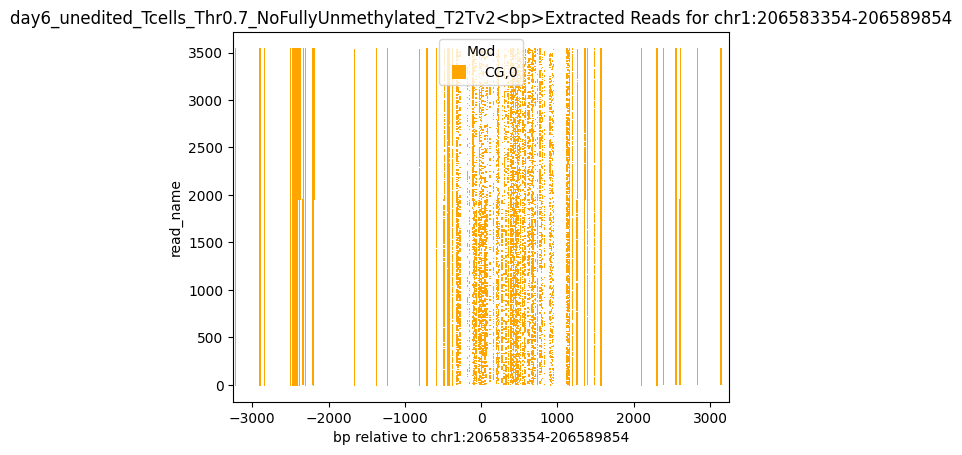

Found read coordinates: 3539 reads
Unique read names with methylation: 3522
Found 1601 reads with full coverage
Reads with methylation data: 3522
Overlap between full coverage and methylation: 1594
After full coverage filtering: 40875 reads with methylation data
Final result: 40875 reads with methylation information out of 3539 total reads


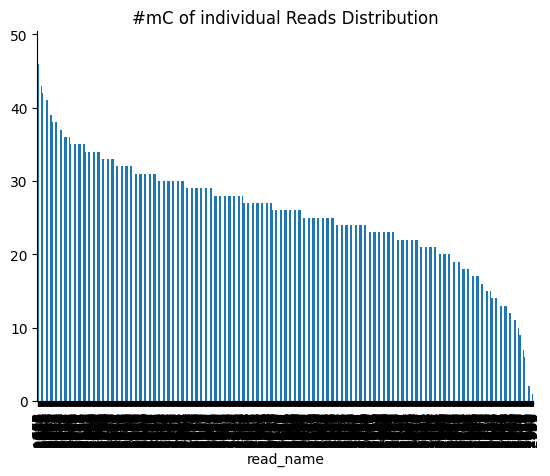

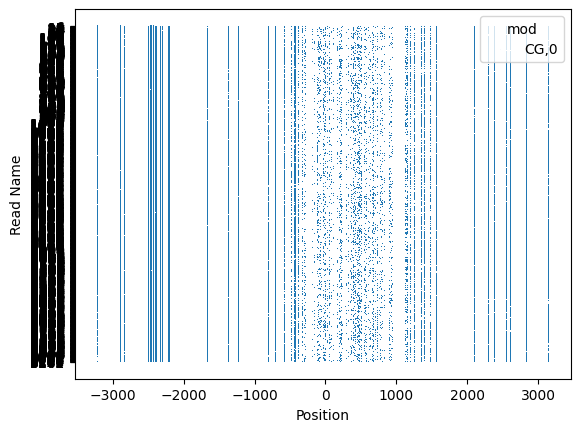

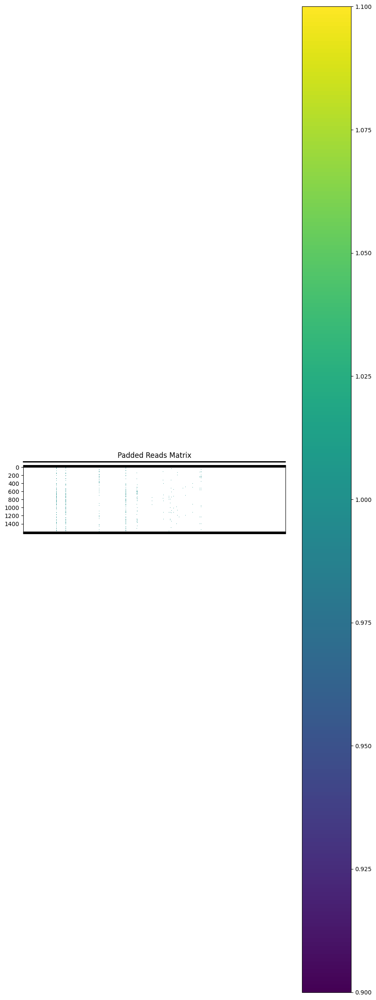

Padded reads saved to padded_reads_day6_unedited_Tcells_Thr0.7_NoFullyUnmethylated_T2Tv2_mCthresh0.7_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


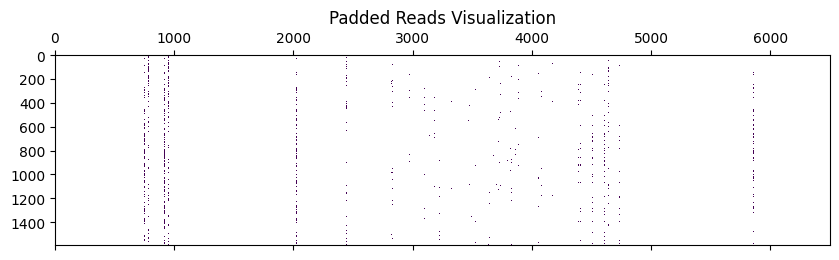

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

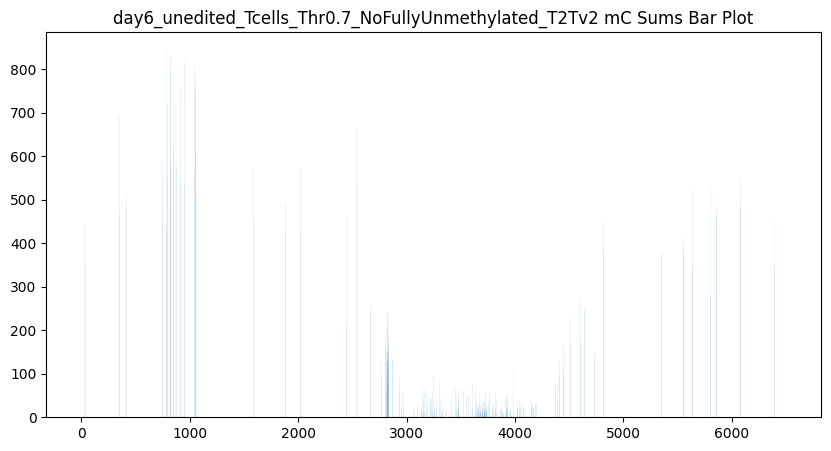

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


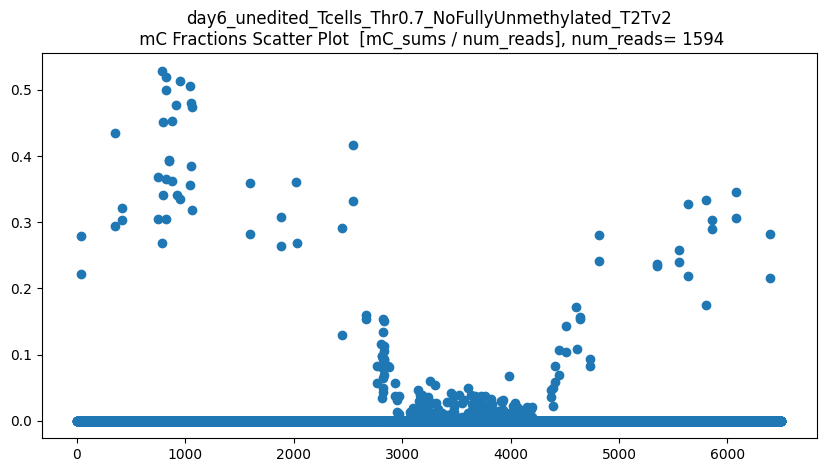

len(CGs_all) = 1594
CGs_all.shape = (1594, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


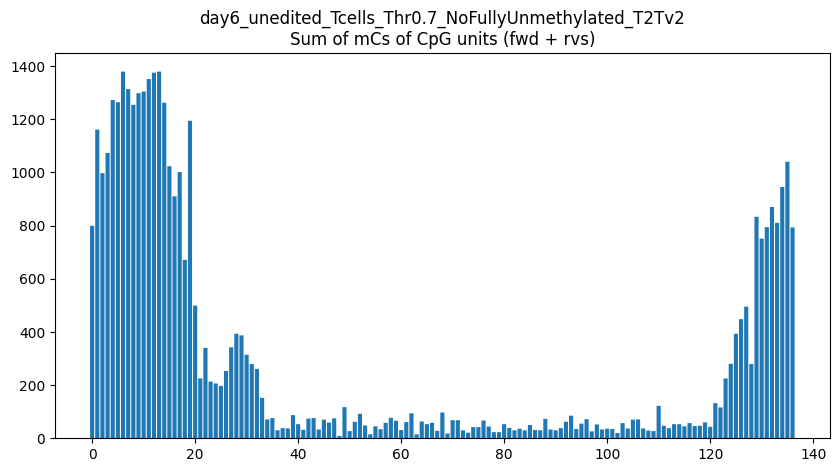

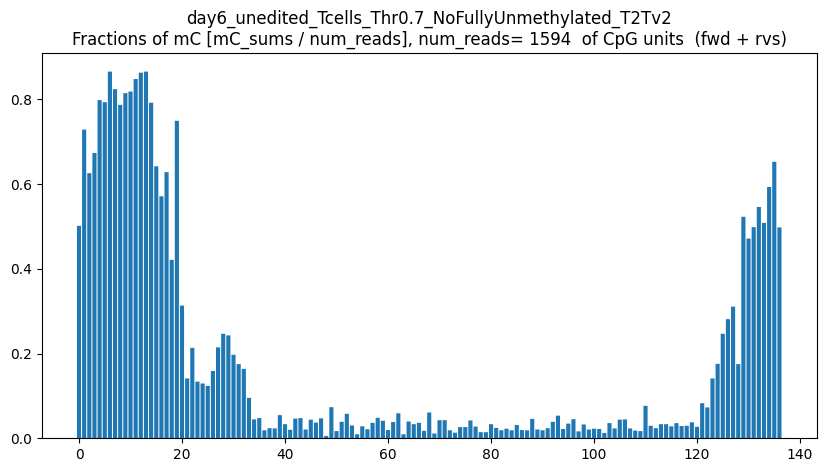

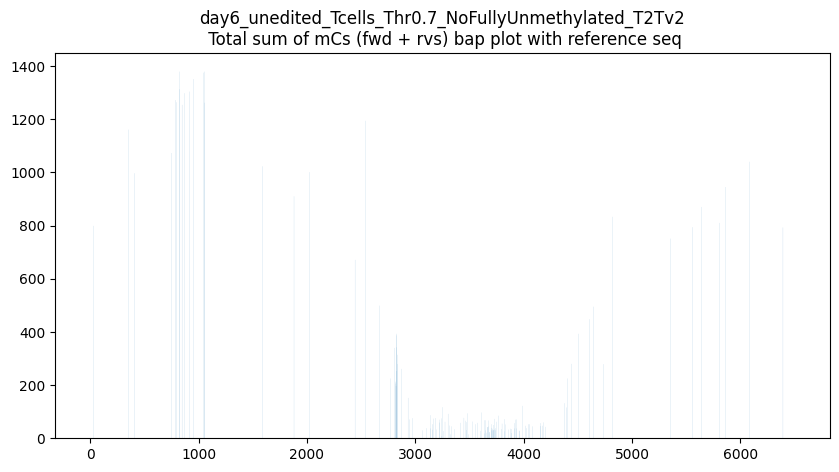

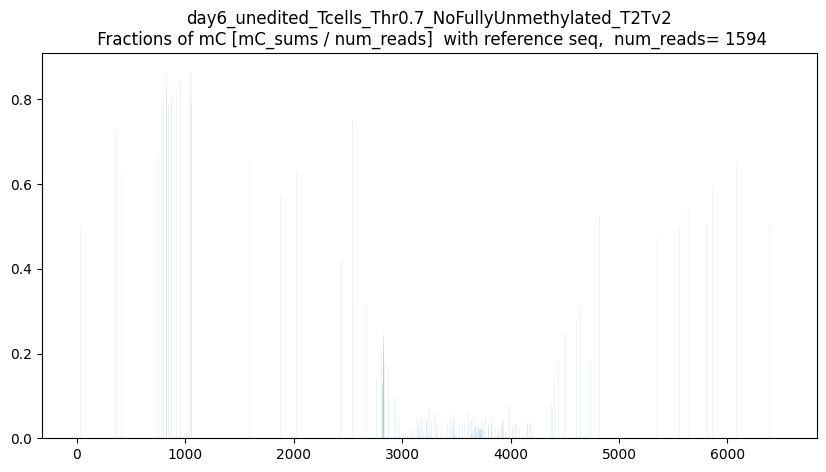

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



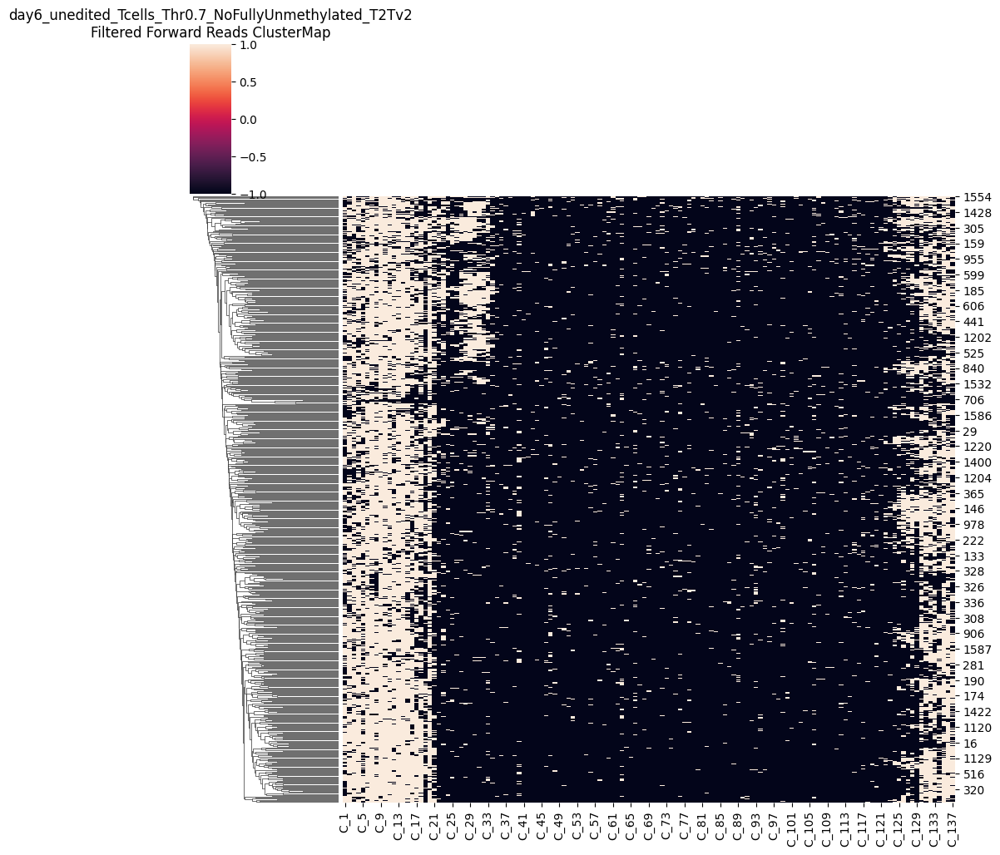

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



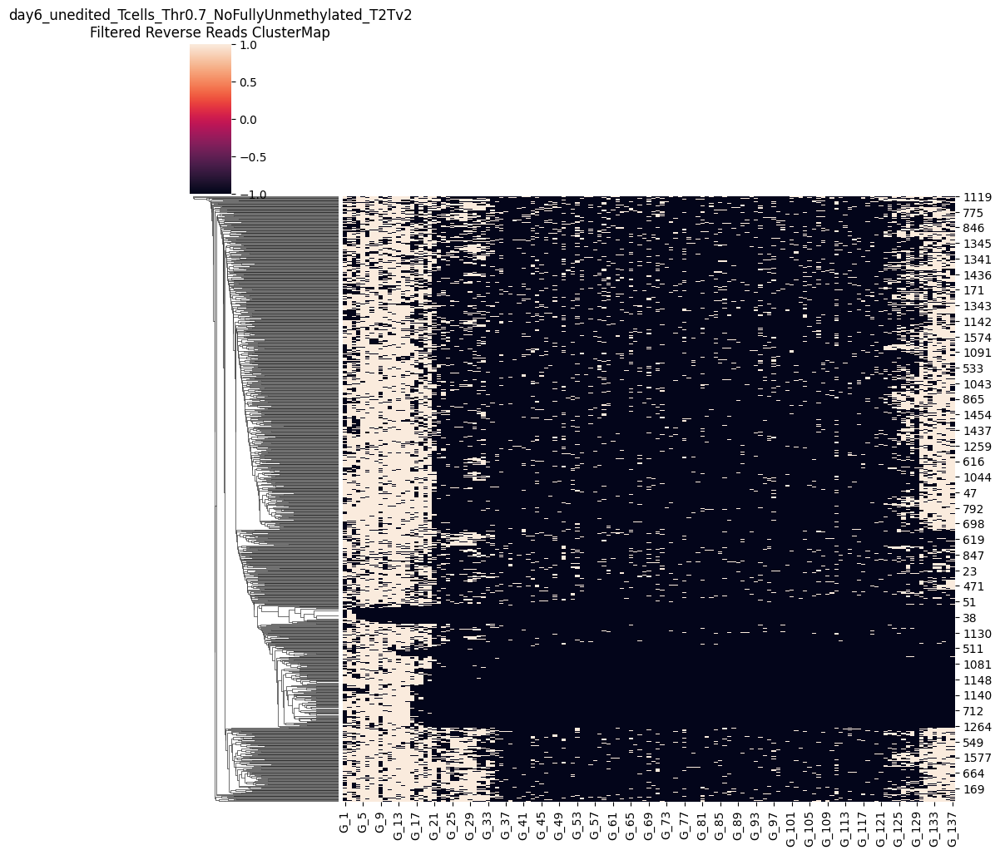

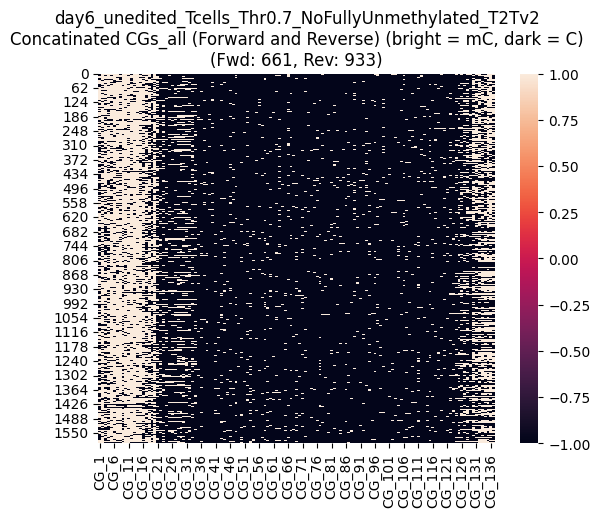

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



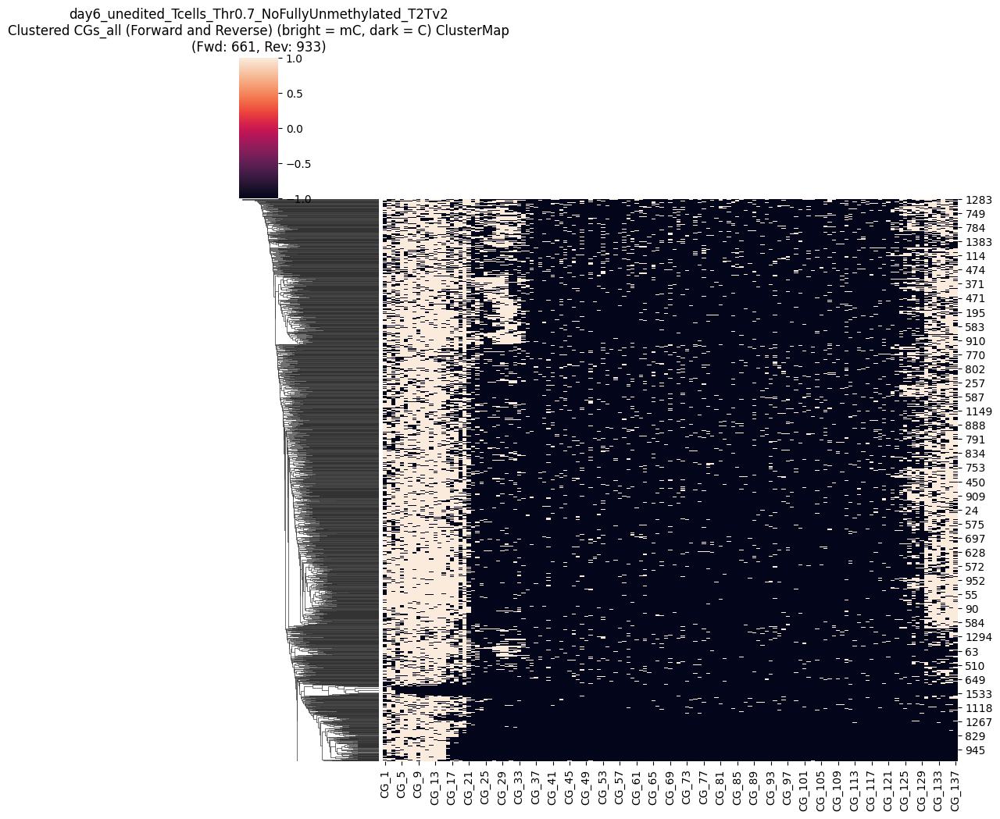

CGs_all saved as CG_137_padded_reads_day6_unedited_Tcells_Thr0.7_NoFullyUnmethylated_T2Tv2_mCthresh0.7_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD661_numRVS933.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


In [34]:


threshold_mC =  0.7 #  0.9 #0.99
experiment_name = "day6_unedited_Tcells_Thr0.7_NoFullyUnmethylated_T2Tv2"
bam_path = unedit_bam_path

print('experiment_name = ', experiment_name)

save_padded_reads_name_np = f"padded_reads_{experiment_name}_mCthresh{threshold_mC}_{reg_genome_version}_{region_str}_{date_today}.npy"
output_dir = create_output_directory("./dimelo_v2_output")

extract_file, extract_regions = extract_from_bam(
    experiment_name = experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
keep_full_coverage_reads_only=True

if extract_file:
    reads_df, regions_dict = process_extracted_reads(extract_file, region_str, motifs, ref_seq_list, 
    keep_full_coverage_reads_only=keep_full_coverage_reads_only)
    visualize_data(reads_df)

    padded_reads = create_padded_reads(reads_df, regions_dict, region_length)
    if padded_reads is not None:
        plot_padded_reads(padded_reads, ref_seq_list)
        save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np)

# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")


In [35]:
reads_df

,read_name_str,read_name,read_id_number,mod,pos,pos_shifted
166,c61ac05e-213d-4e45-9a15-49925f652534,6,6,"CG,0",-3217,33
167,c61ac05e-213d-4e45-9a15-49925f652534,6,6,"CG,0",-2897,353
168,c61ac05e-213d-4e45-9a15-49925f652534,6,6,"CG,0",-2467,783
169,c61ac05e-213d-4e45-9a15-49925f652534,6,6,"CG,0",-2453,797
170,c61ac05e-213d-4e45-9a15-49925f652534,6,6,"CG,0",-2428,822
...,...,...,...,...,...,...
81428,33604bfb-7745-4a6e-beba-43acf1893e4a,3175,3175,"CG,0",1485,4735
81429,33604bfb-7745-4a6e-beba-43acf1893e4a,3175,3175,"CG,0",2387,5637
81430,33604bfb-7745-4a6e-beba-43acf1893e4a,3175,3175,"CG,0",2609,5859
81431,33604bfb-7745-4a6e-beba-43acf1893e4a,3175,3175,"CG,0",2833,6083


In [36]:
threshold_percent = 50
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

Mean methylated CGs per read: 26.0
Maximum methylated CGs per read: 48.0
Threshold (50% of max): 13.00
Original number of reads: 1594
Number of reads after filtering: 1512
Removed 82 reads


,read_name_str,read_name,read_id_number,mod,pos,pos_shifted,num_CG_methylated
172,7d30168d-6731-4643-ab9a-46eaa22bfb24,7,7,"CG,0",-2897,353,1.0
173,7d30168d-6731-4643-ab9a-46eaa22bfb24,7,7,"CG,0",-2467,783,1.0
174,7d30168d-6731-4643-ab9a-46eaa22bfb24,7,7,"CG,0",-2453,797,1.0
175,7d30168d-6731-4643-ab9a-46eaa22bfb24,7,7,"CG,0",-2428,822,1.0
176,7d30168d-6731-4643-ab9a-46eaa22bfb24,7,7,"CG,0",-2426,824,1.0
...,...,...,...,...,...,...,...
81428,33604bfb-7745-4a6e-beba-43acf1893e4a,3175,3175,"CG,0",1485,4735,1.0
81429,33604bfb-7745-4a6e-beba-43acf1893e4a,3175,3175,"CG,0",2387,5637,1.0
81430,33604bfb-7745-4a6e-beba-43acf1893e4a,3175,3175,"CG,0",2609,5859,1.0
81431,33604bfb-7745-4a6e-beba-43acf1893e4a,3175,3175,"CG,0",2833,6083,1.0


In [ ]:
# methylation_counts

In [ ]:
# visualize_data(reads_df)
# visualize_data(filtered_reads_df)

In [ ]:
# methylation_counts['methylation_count'].max()

In [ ]:
# mean_methylation = methylation_counts['methylation_count'].mean()
# mean_methylation

In [ ]:
# methylation_counts['methylation_count'].median()

In [ ]:
# threshold_percent 
# threshold = mean_methylation * (threshold_percent / 100)

In [ ]:
# threshold_percent = 70

# save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np

# padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
# if padded_reads is not None:
#     plot_padded_reads(padded_reads, ref_seq_list)
#     save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)



In [ ]:

# # Processing and visualizing CpG units on forward and reverse strands 
# try: 

#     # Process pipeline
#     CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
#         experiment_name=experiment_name, save_folder_path=output_dir, 
#         save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
#         ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
#     )

#     print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
#     # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

# except Exception as e:
#     print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")


In [ ]:
CGs_all

In [ ]:
# 70% * (mean)
# CGs_all

In [ ]:
# CGs_all

In [37]:
CGs_all_unedited_mc07_original = CGs_all
CGs_all_unedited_mc07_original


,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,1.0
1,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
2,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0
3,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
4,NaN,1.0,1.0,1.0,1.0,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1589,NaN,1.0,1.0,NaN,1.0,1.0,NaN,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN
1590,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1591,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0
1592,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,NaN


Mean methylated CGs per read: 26.0
Maximum methylated CGs per read: 48.0
Threshold (80% of max): 20.80
Original number of reads: 1594
Number of reads after filtering: 1282
Removed 312 reads


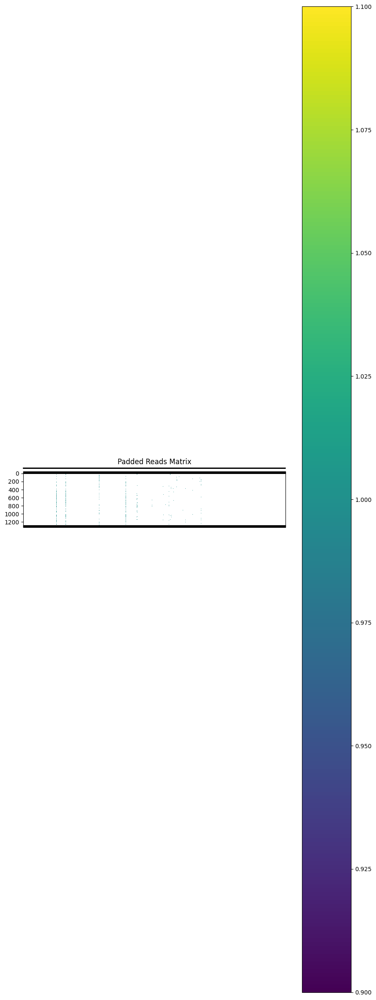

Padded reads saved to removed_low80_methylated_padded_reads_day6_unedited_Tcells_Thr0.7_NoFullyUnmethylated_T2Tv2_mCthresh0.7_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


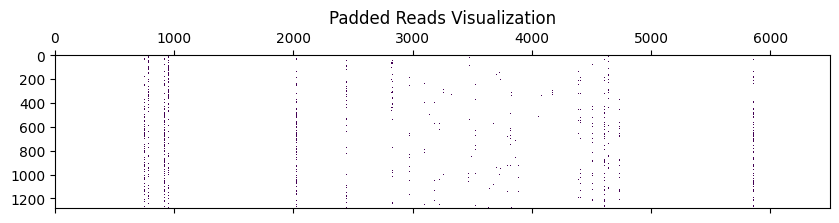

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

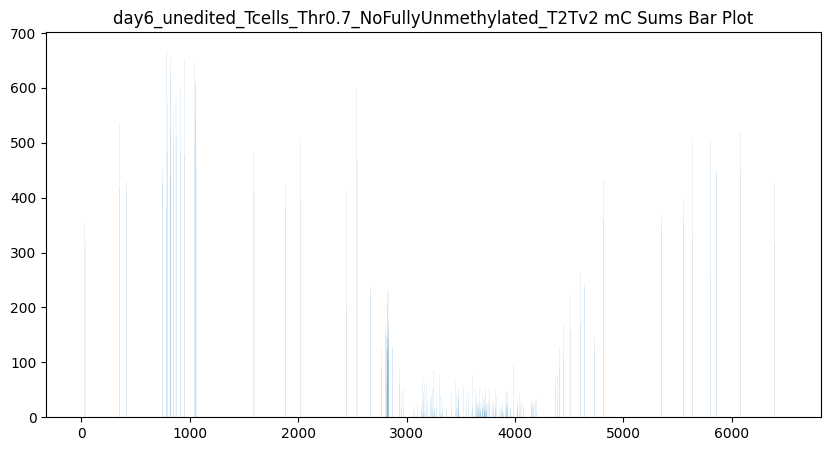

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


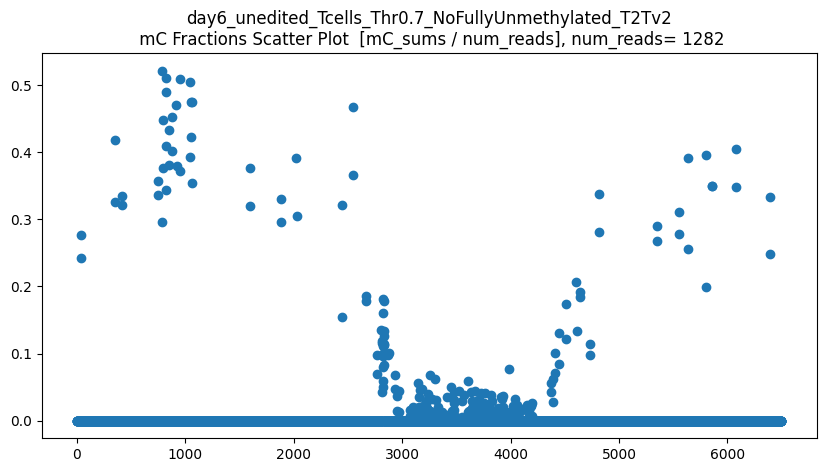

len(CGs_all) = 1282
CGs_all.shape = (1282, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


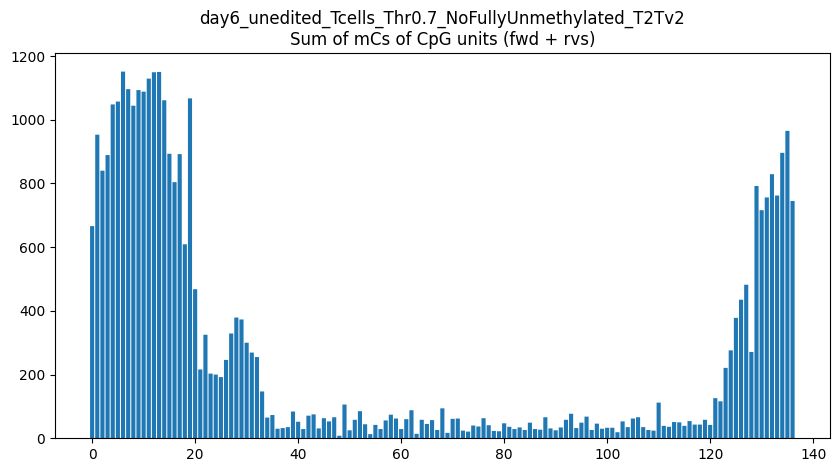

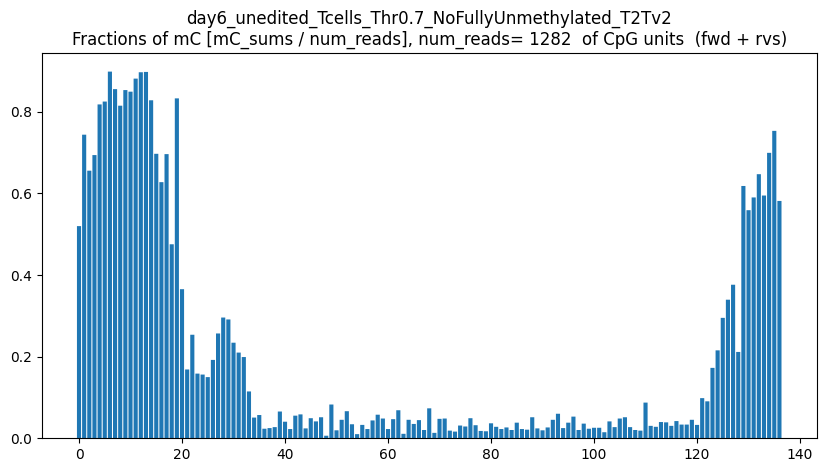

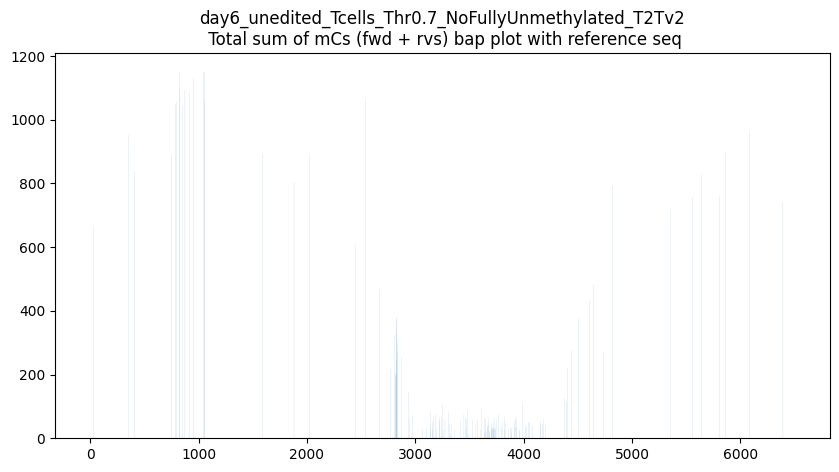

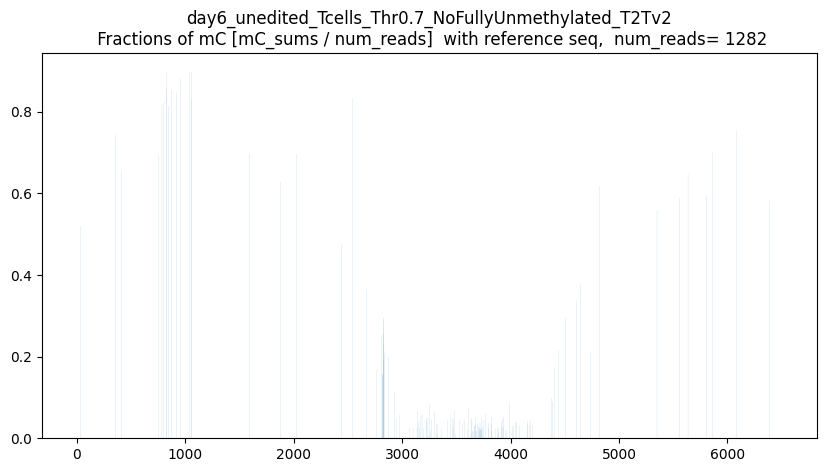

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



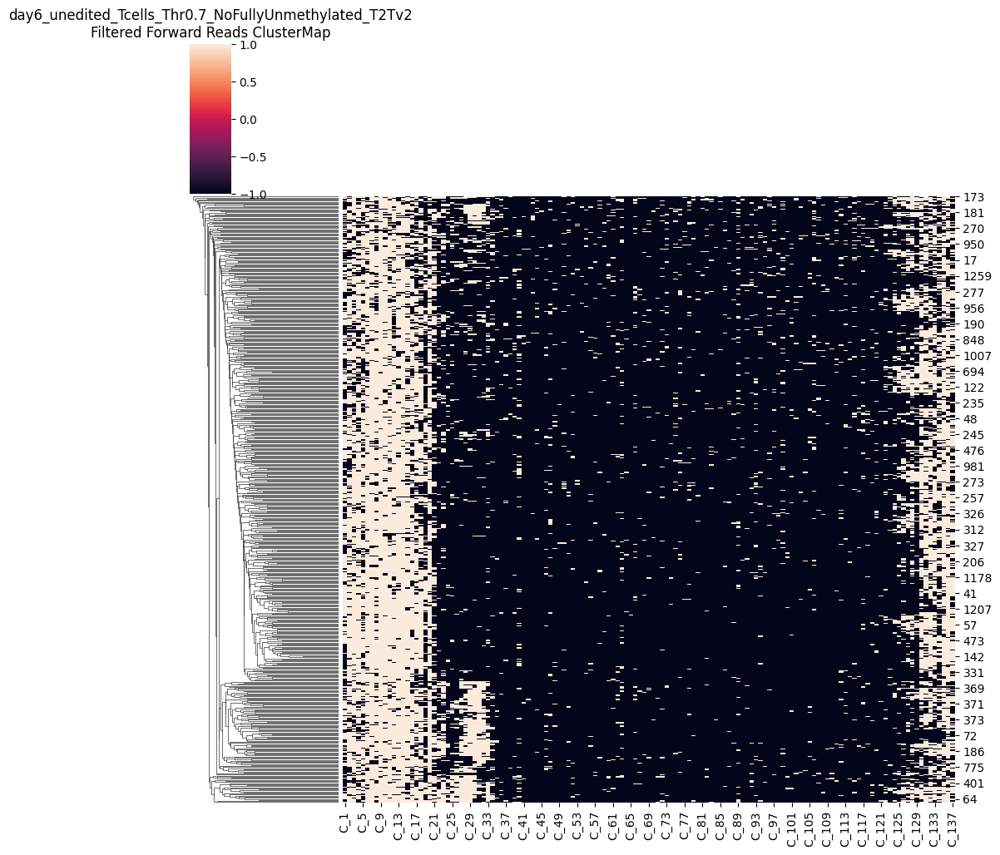

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



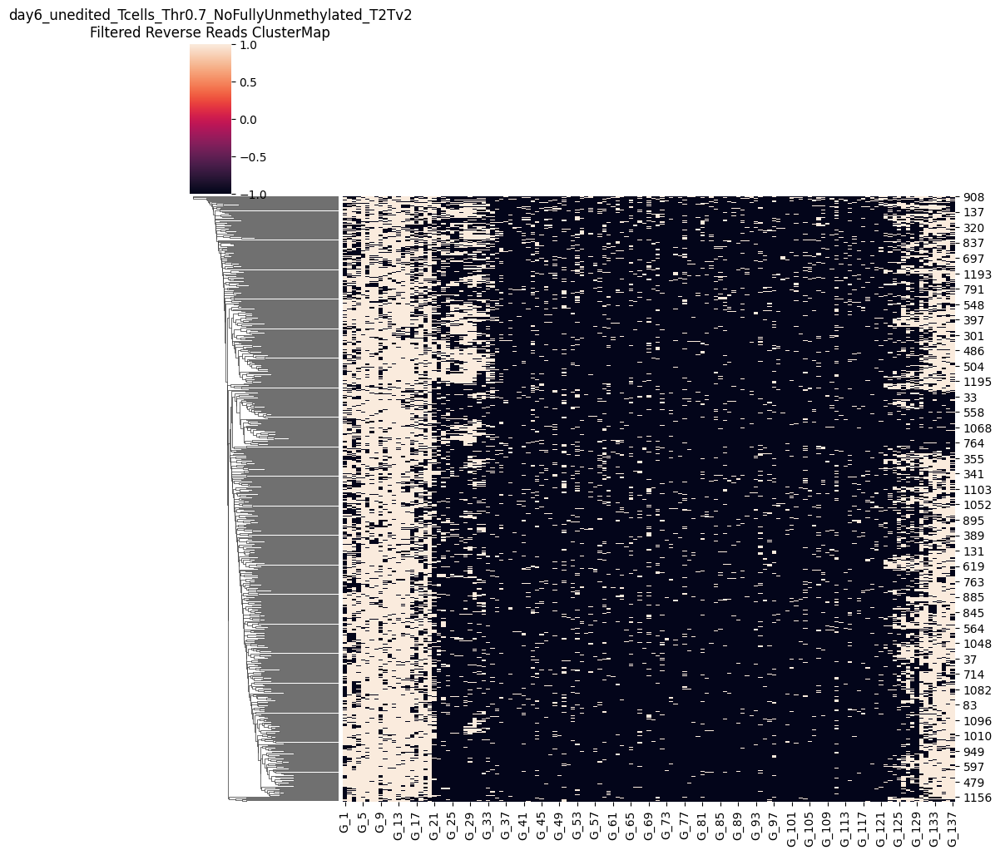

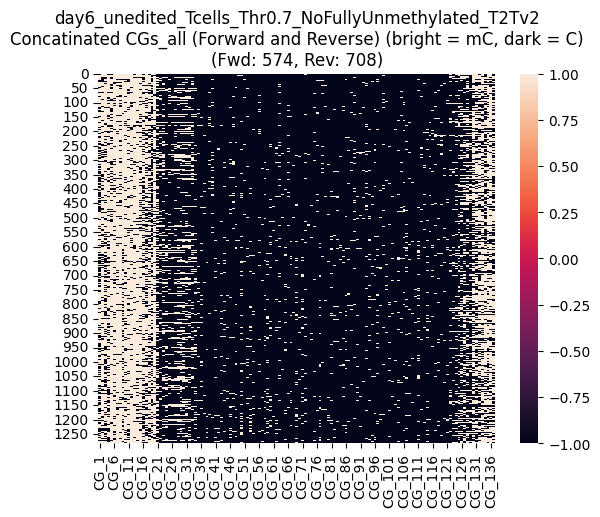

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



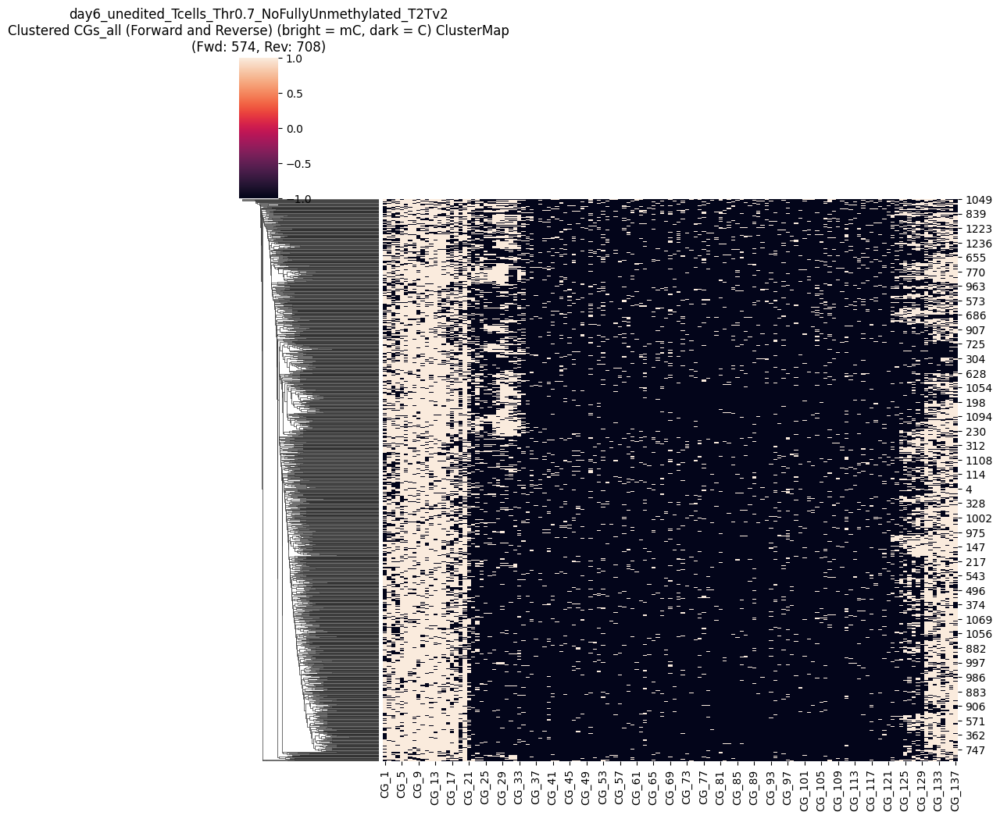

CGs_all saved as CG_137_removed_low80_methylated_padded_reads_day6_unedited_Tcells_Thr0.7_NoFullyUnmethylated_T2Tv2_mCthresh0.7_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD574_numRVS708.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,1.0
1,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
2,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0
3,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
4,NaN,1.0,1.0,1.0,1.0,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1277,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,NaN
1278,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,NaN,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,NaN,NaN
1279,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,NaN,...,1.0,NaN,1.0,1.0,1.0,1.0,1.0,NaN,1.0,NaN
1280,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [38]:
threshold_percent = 80
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np

padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
if padded_reads is not None:
    plot_padded_reads(padded_reads, ref_seq_list)
    save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)


# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")

CGs_all_unedited_mc07_remove_low80 = CGs_all
CGs_all_unedited_mc07_remove_low80


Mean methylated CGs per read: 26.0
Maximum methylated CGs per read: 48.0
Threshold (70% of max): 18.20
Original number of reads: 1594
Number of reads after filtering: 1361
Removed 233 reads


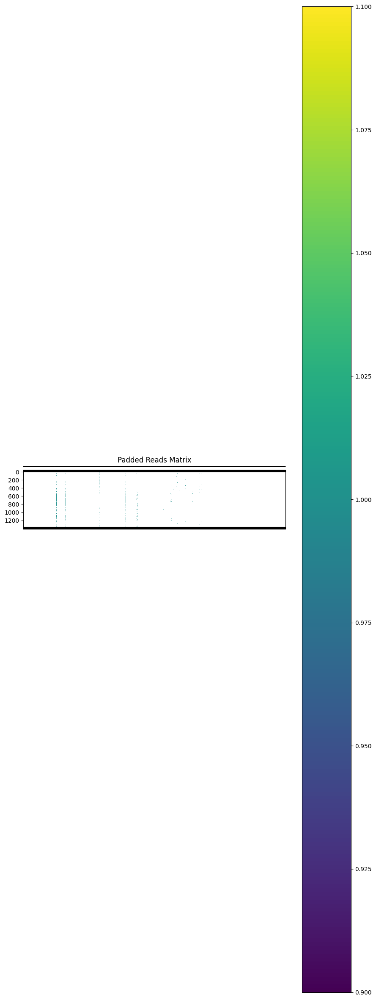

Padded reads saved to removed_low70_methylated_padded_reads_day6_unedited_Tcells_Thr0.7_NoFullyUnmethylated_T2Tv2_mCthresh0.7_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


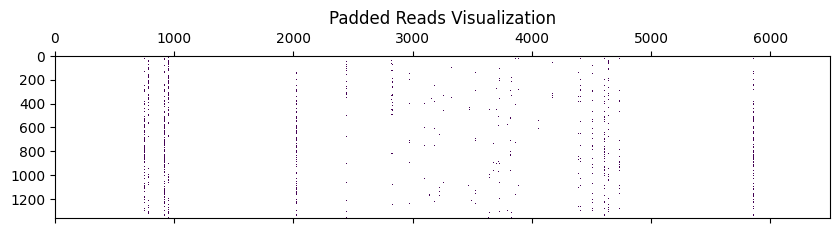

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

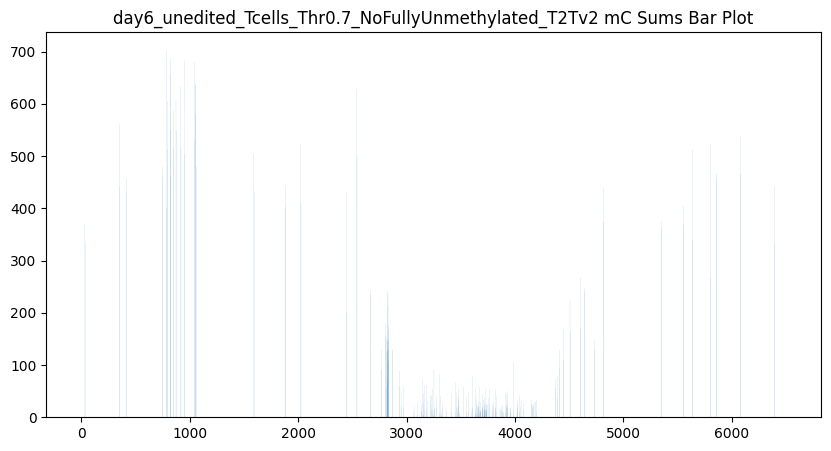

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


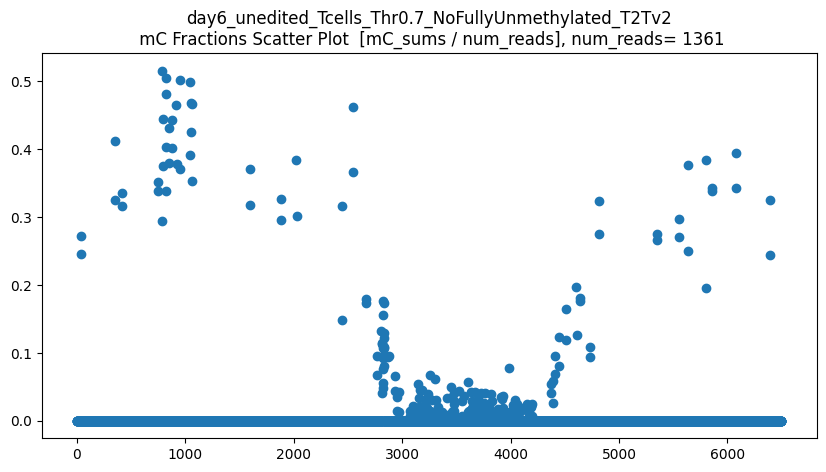

len(CGs_all) = 1361
CGs_all.shape = (1361, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


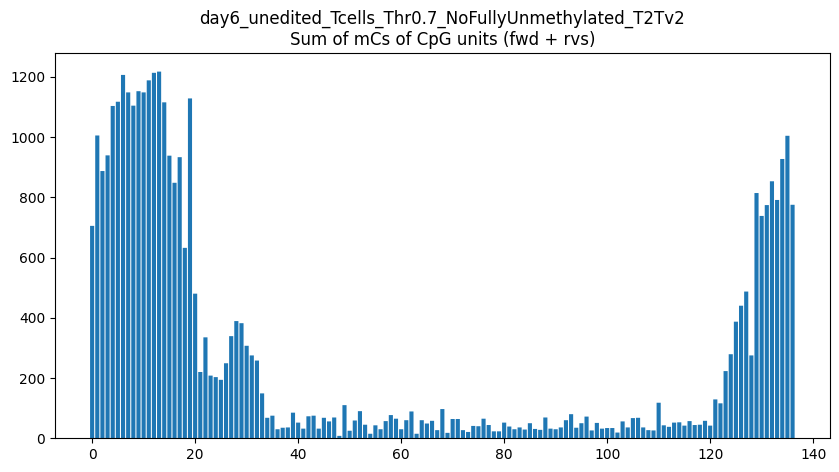

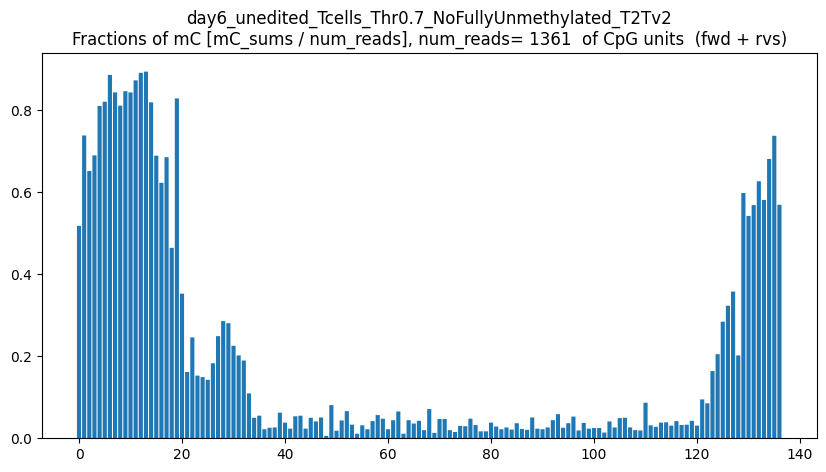

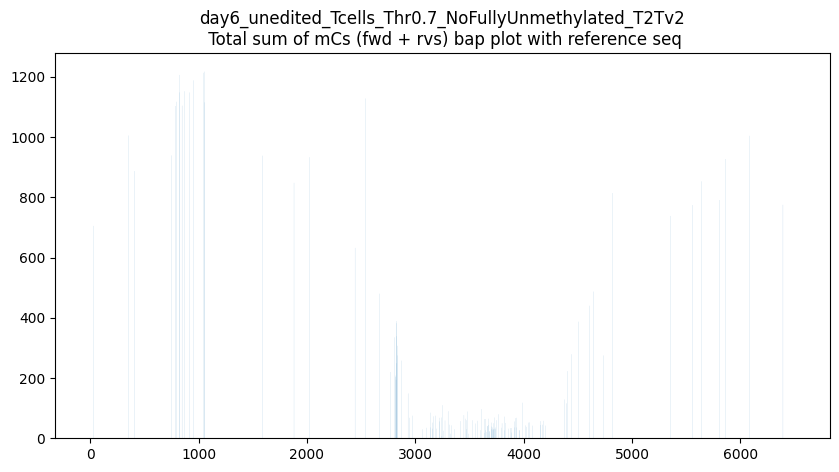

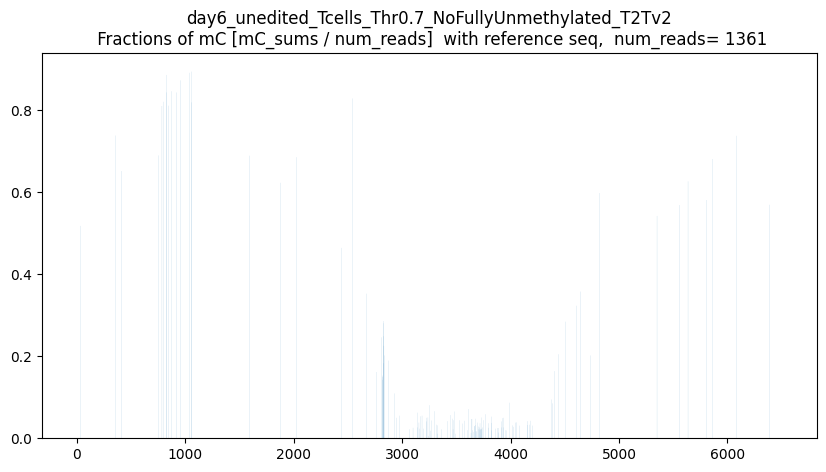

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



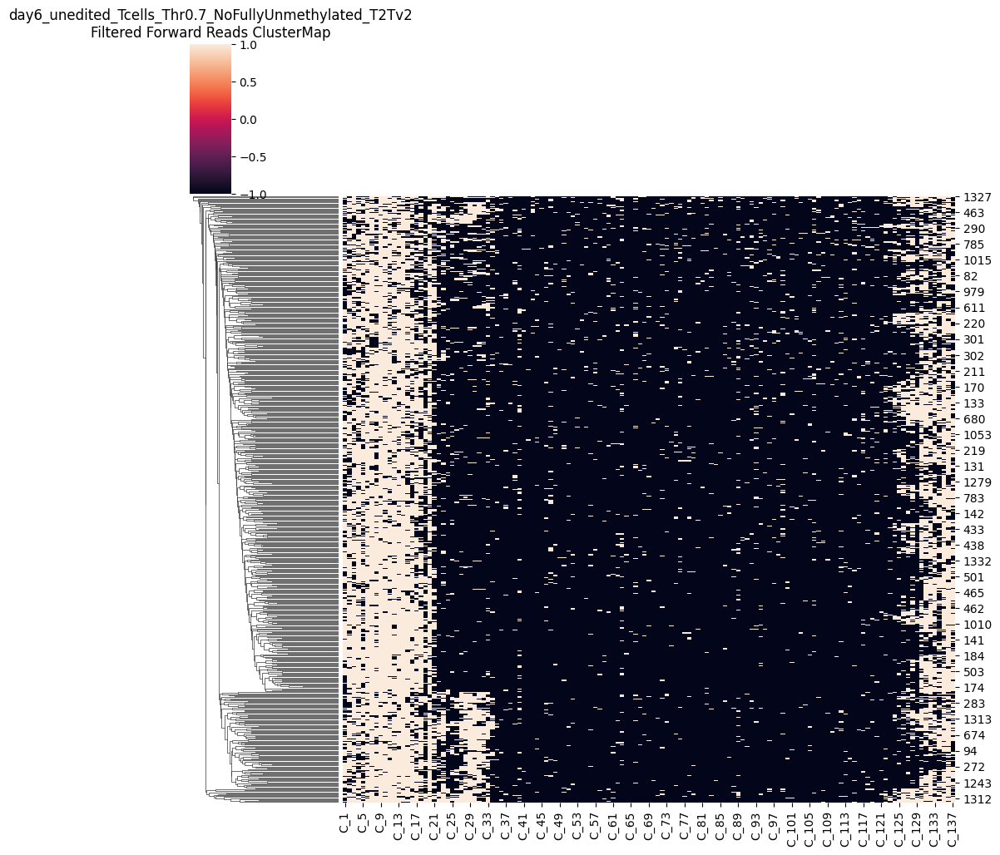

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



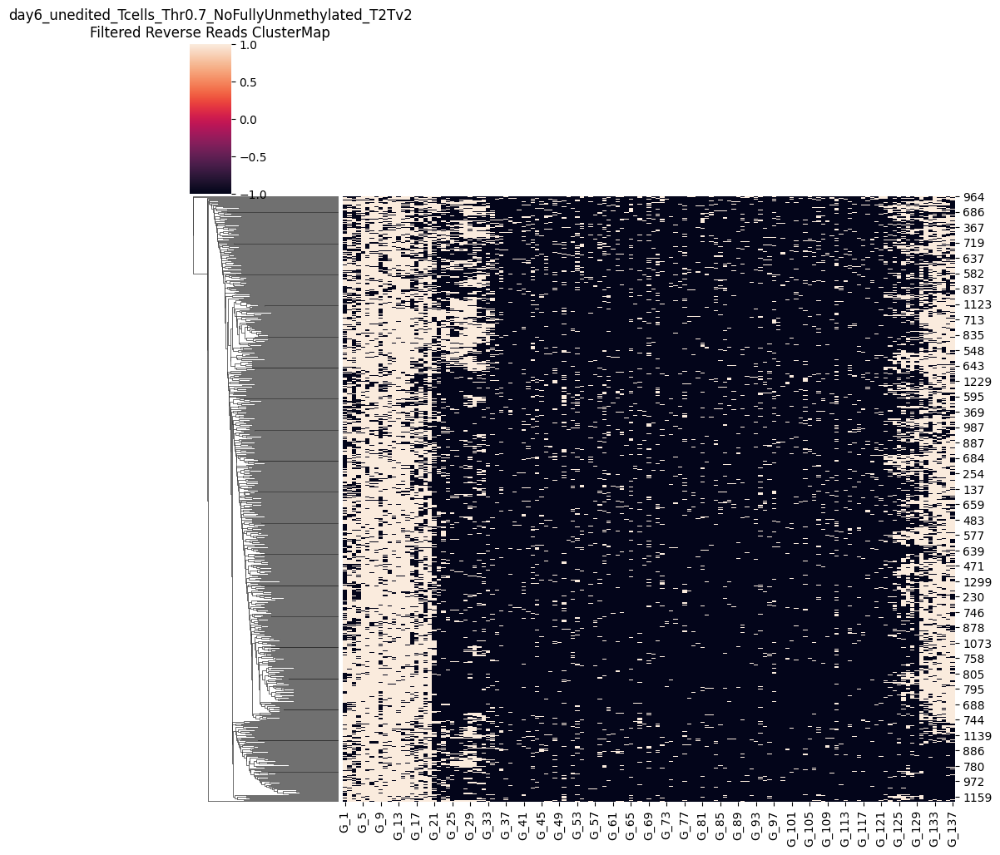

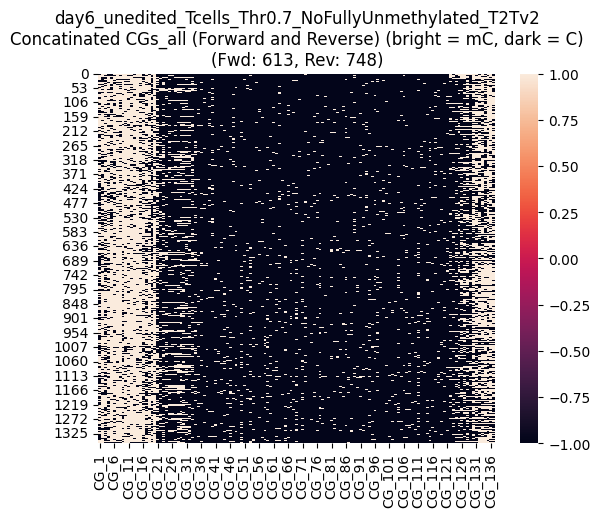

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



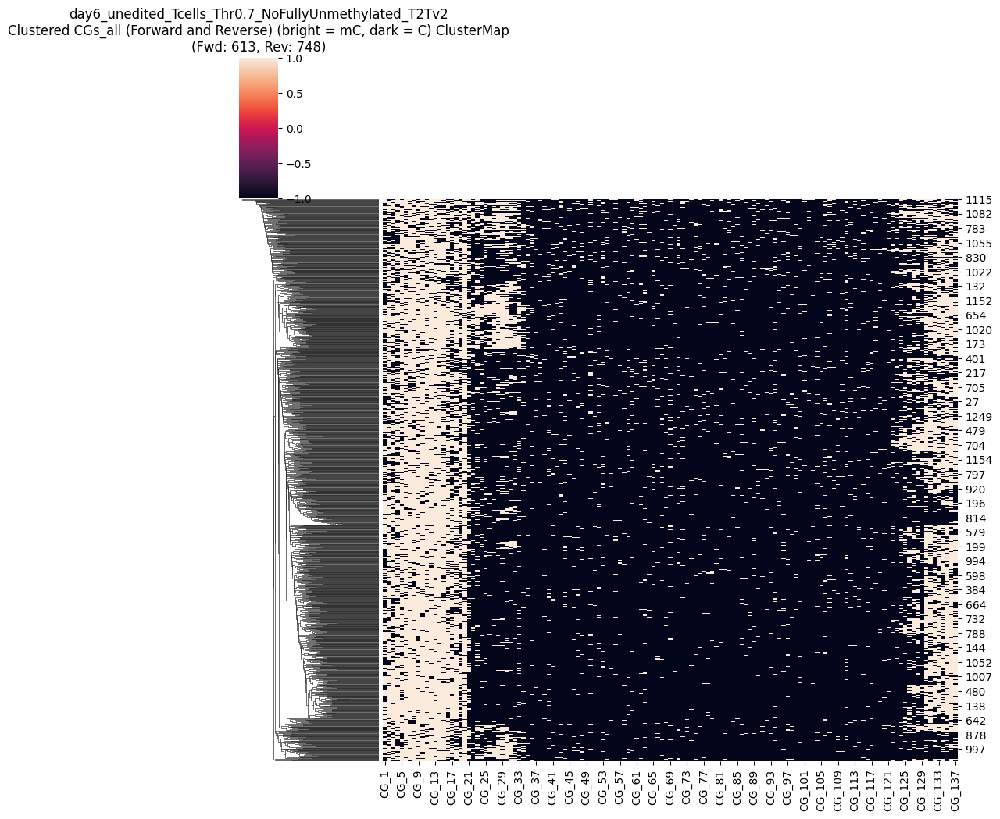

CGs_all saved as CG_137_removed_low70_methylated_padded_reads_day6_unedited_Tcells_Thr0.7_NoFullyUnmethylated_T2Tv2_mCthresh0.7_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD613_numRVS748.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,1.0
1,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
2,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0
3,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
4,NaN,1.0,1.0,1.0,1.0,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1356,NaN,1.0,1.0,NaN,1.0,1.0,NaN,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN
1357,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1358,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0
1359,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,NaN


In [39]:
threshold_percent = 70
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np

padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
if padded_reads is not None:
    plot_padded_reads(padded_reads, ref_seq_list)
    save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)


# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")

CGs_all_unedited_mc07_remove_low70 = CGs_all
CGs_all_unedited_mc07_remove_low70


Mean methylated CGs per read: 26.0
Maximum methylated CGs per read: 48.0
Threshold (50% of max): 13.00
Original number of reads: 1594
Number of reads after filtering: 1512
Removed 82 reads


Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7d16bc903710>>
Traceback (most recent call last):
  File "/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 


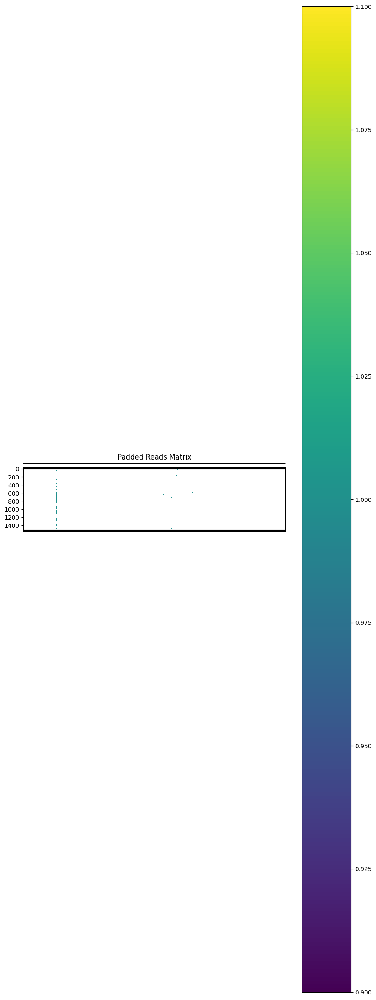

Padded reads saved to removed_low50_methylated_padded_reads_day6_unedited_Tcells_Thr0.7_NoFullyUnmethylated_T2Tv2_mCthresh0.7_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


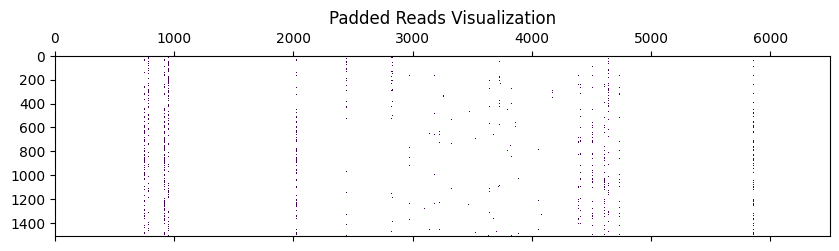

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

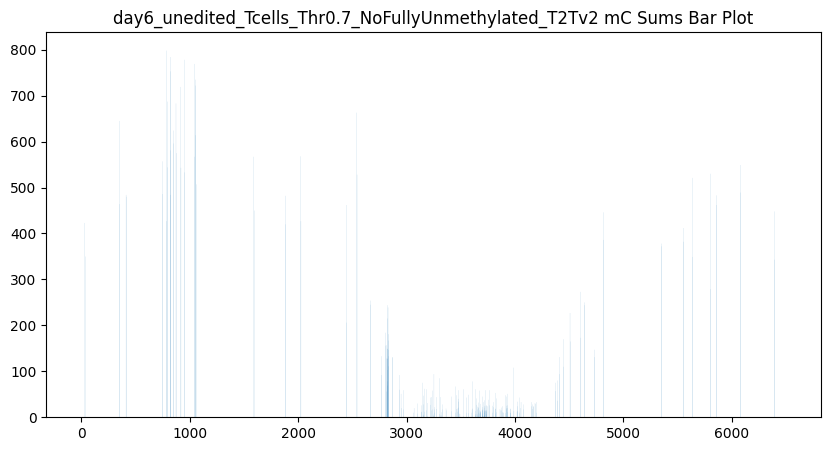

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


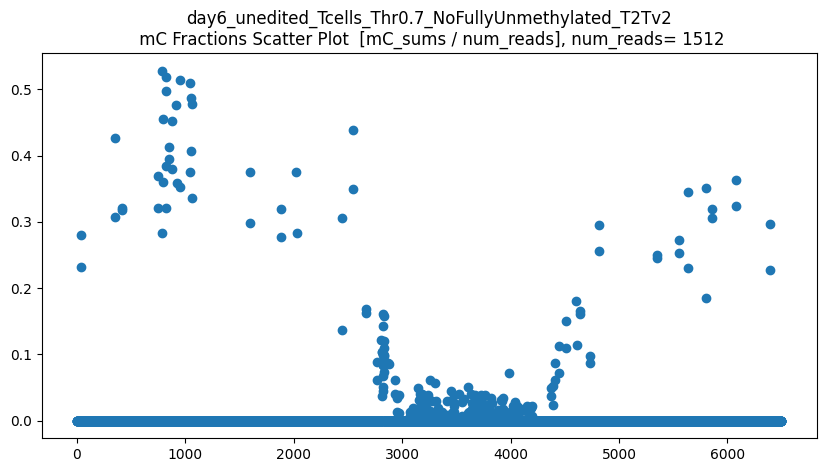

len(CGs_all) = 1512
CGs_all.shape = (1512, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


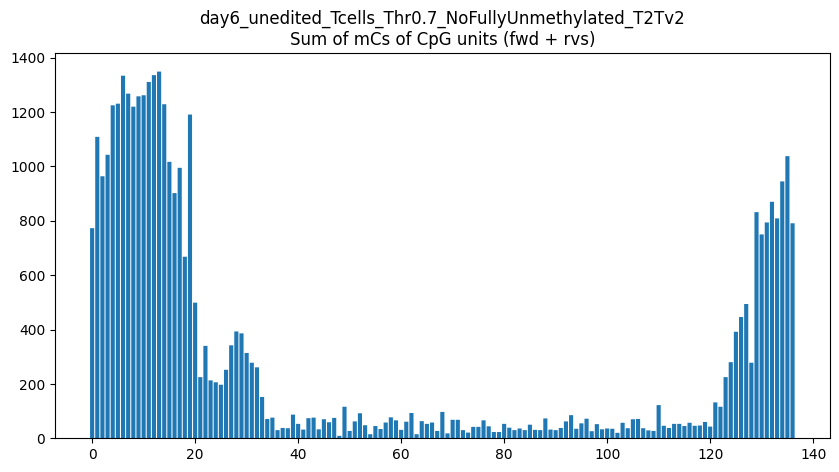

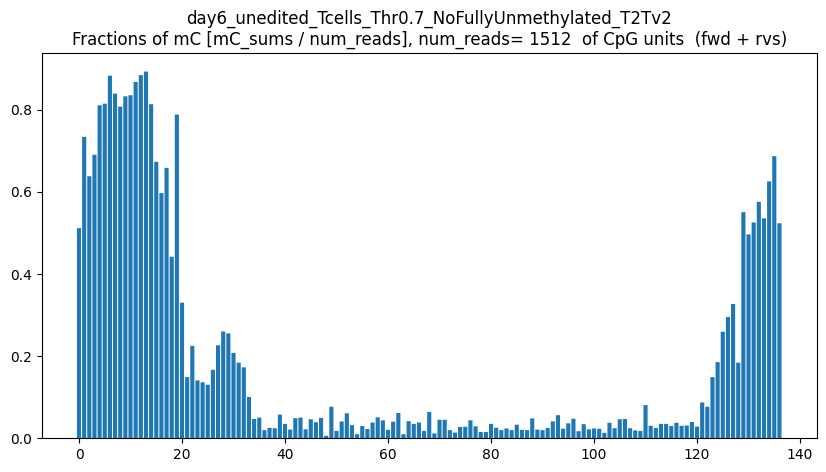

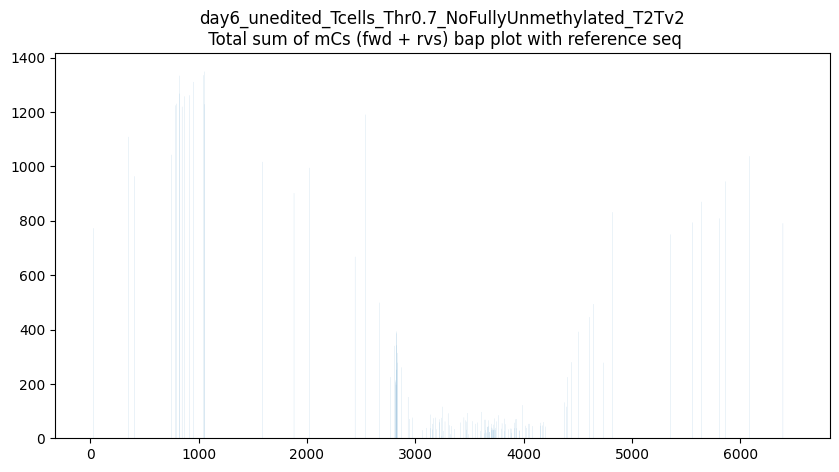

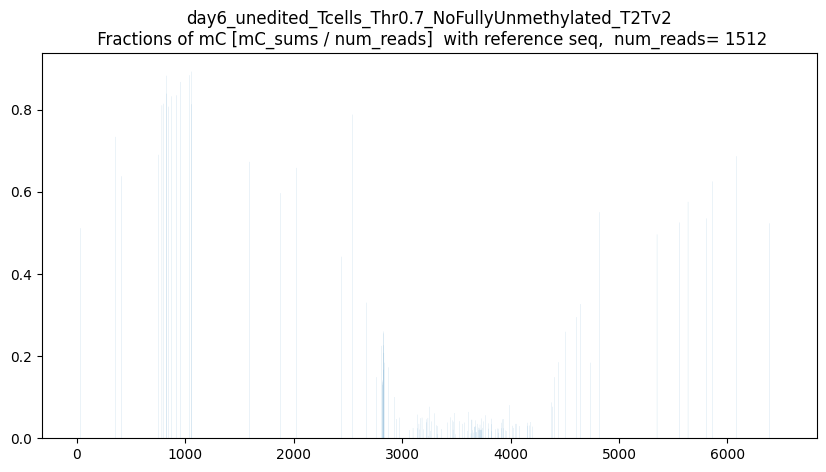

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



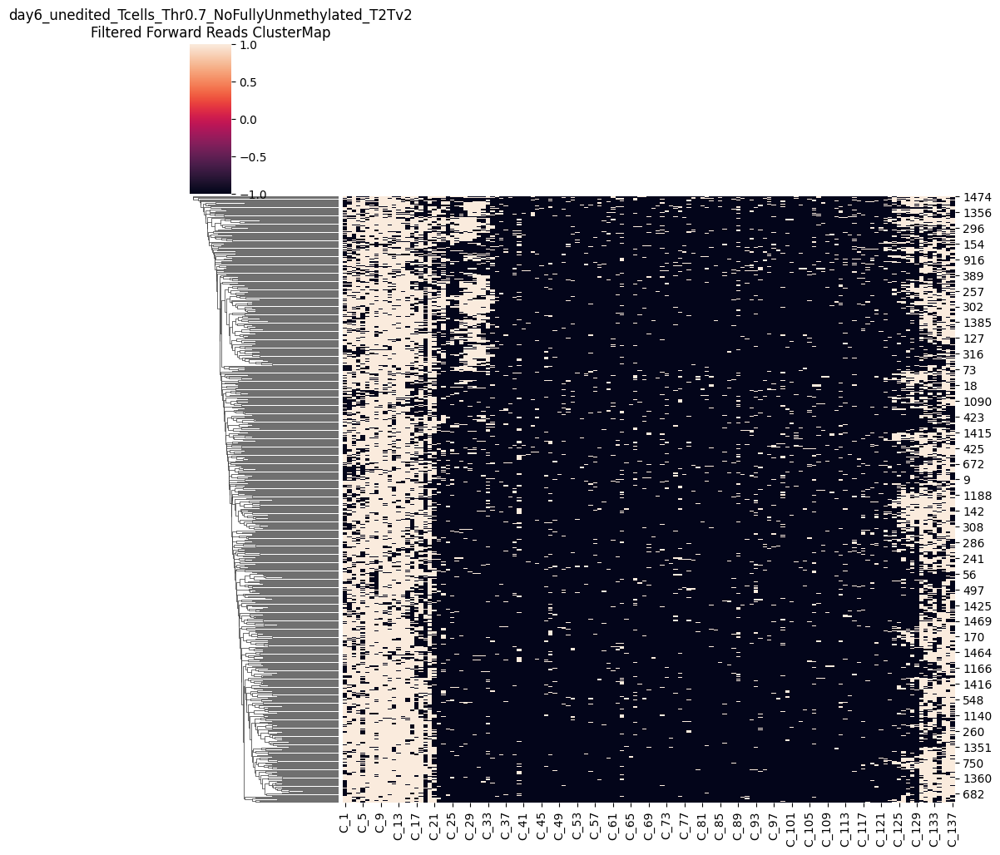

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



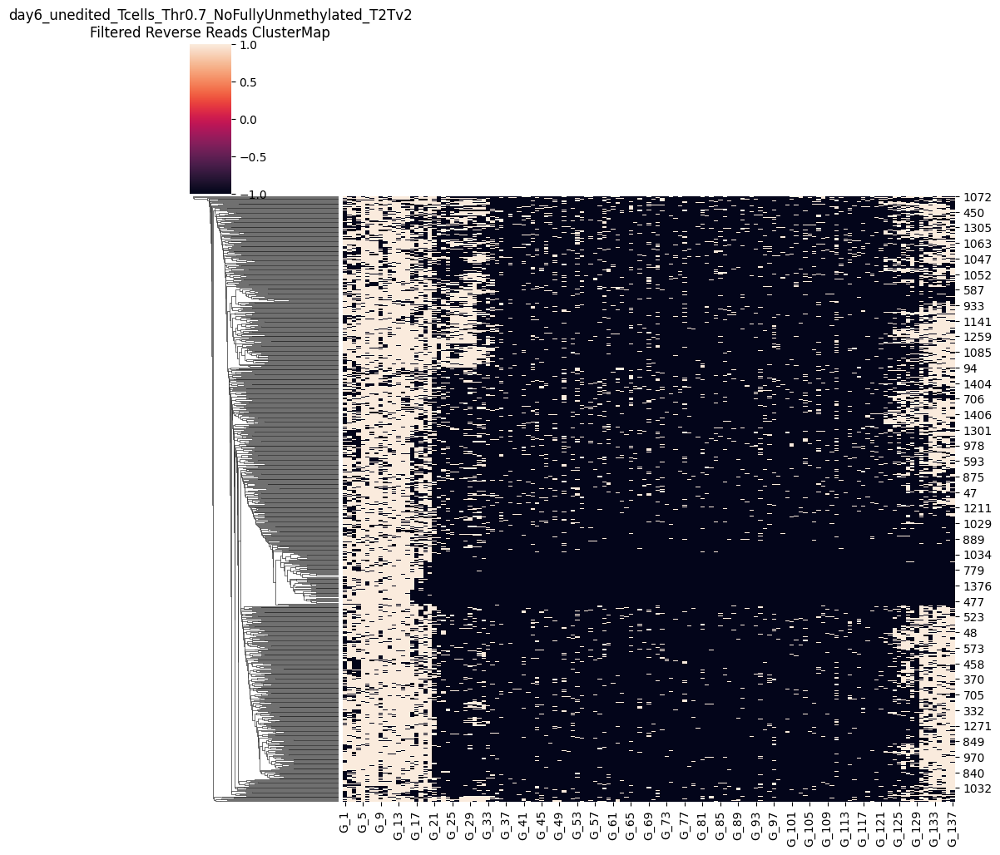

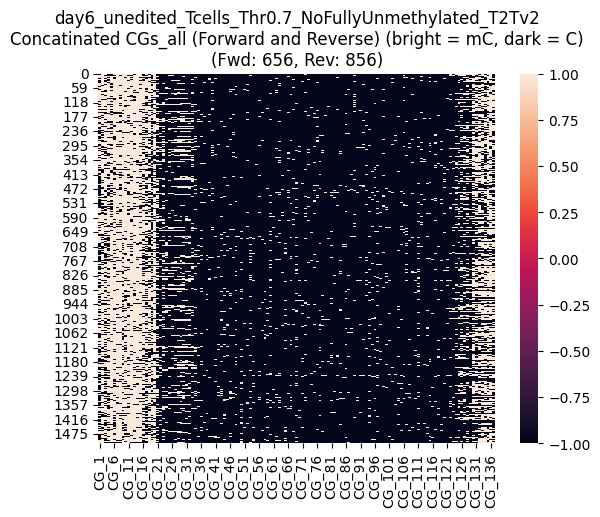

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



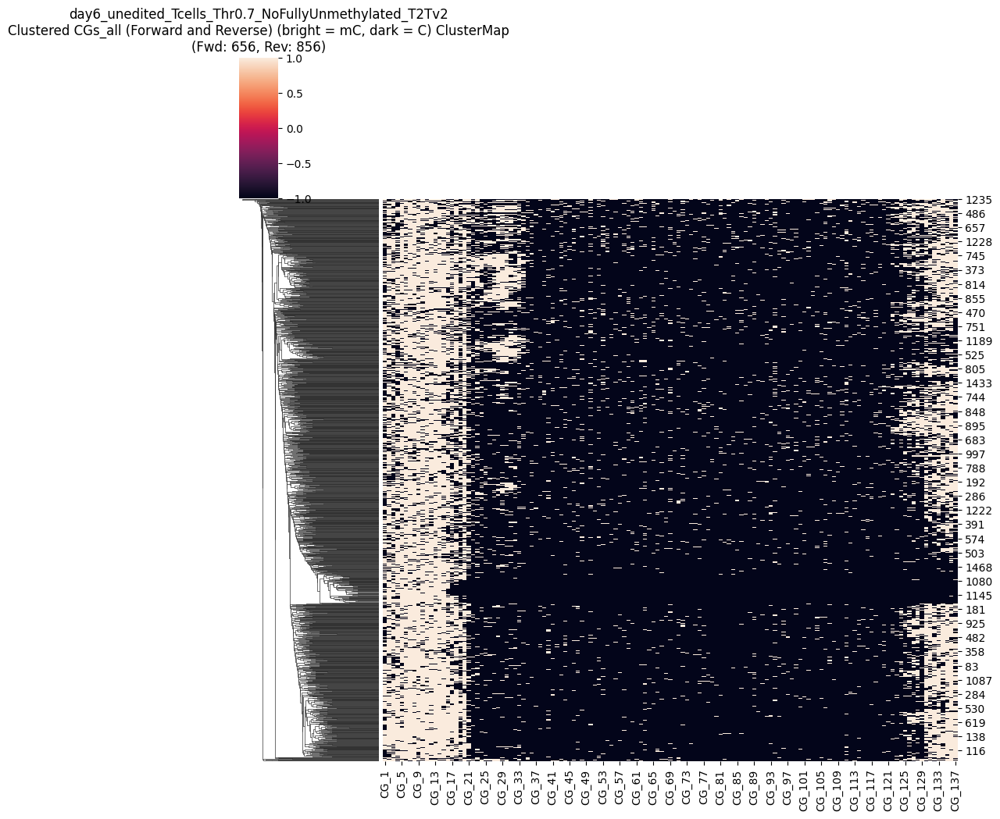

CGs_all saved as CG_137_removed_low50_methylated_padded_reads_day6_unedited_Tcells_Thr0.7_NoFullyUnmethylated_T2Tv2_mCthresh0.7_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD656_numRVS856.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,1.0
1,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
2,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0
3,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
4,NaN,1.0,1.0,1.0,1.0,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1507,NaN,1.0,1.0,NaN,1.0,1.0,NaN,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN
1508,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1509,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0
1510,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,NaN


In [40]:
threshold_percent = 50
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np

padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
if padded_reads is not None:
    plot_padded_reads(padded_reads, ref_seq_list)
    save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)


# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")

CGs_all_unedited_mc07_remove_low50 = CGs_all
CGs_all_unedited_mc07_remove_low50


Mean methylated CGs per read: 26.0
Maximum methylated CGs per read: 48.0
Threshold (10% of max): 2.60
Original number of reads: 1594
Number of reads after filtering: 1576
Removed 18 reads


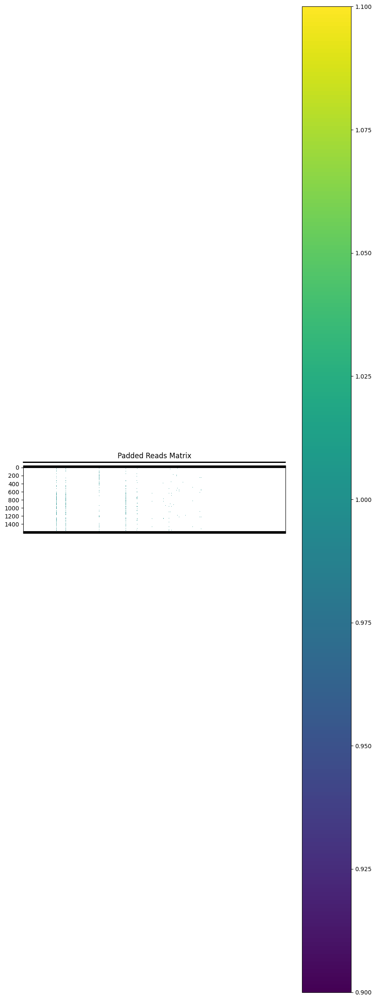

Padded reads saved to removed_low10_methylated_padded_reads_day6_unedited_Tcells_Thr0.7_NoFullyUnmethylated_T2Tv2_mCthresh0.7_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


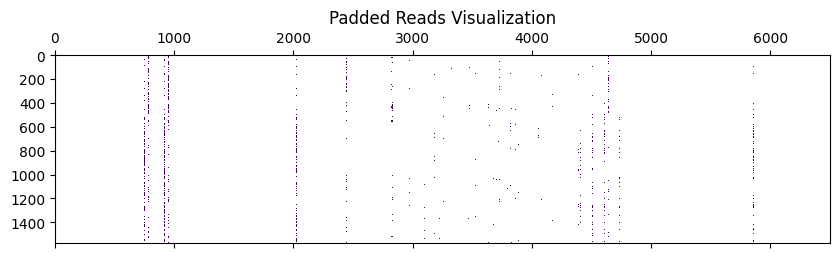

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

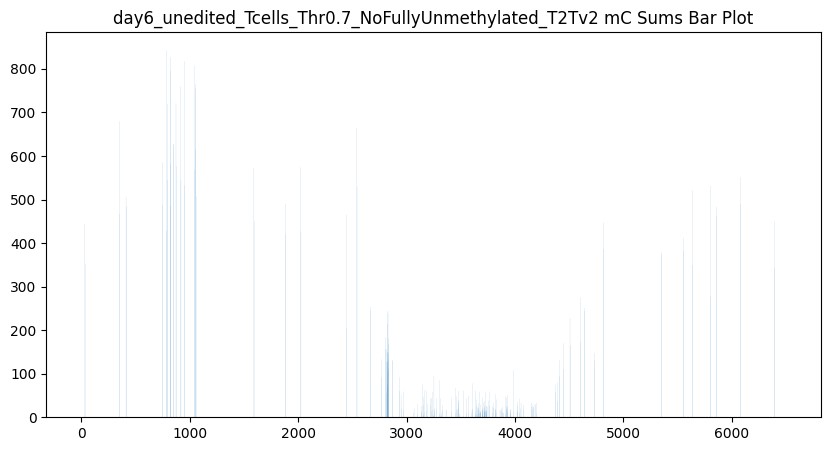

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


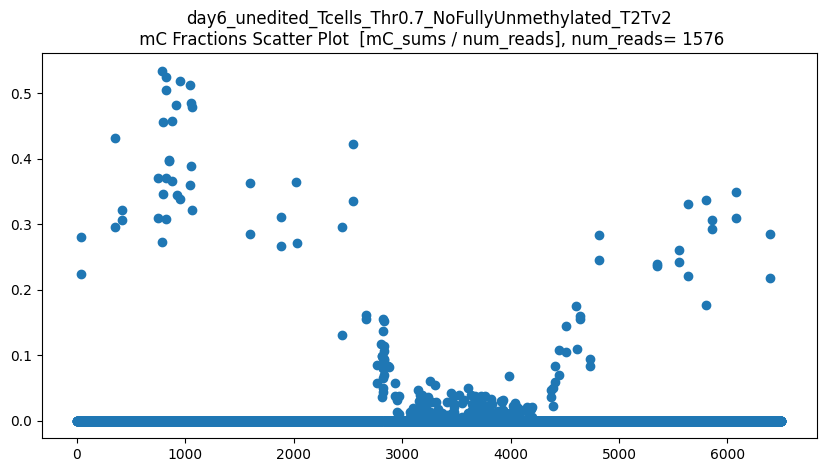

len(CGs_all) = 1576
CGs_all.shape = (1576, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


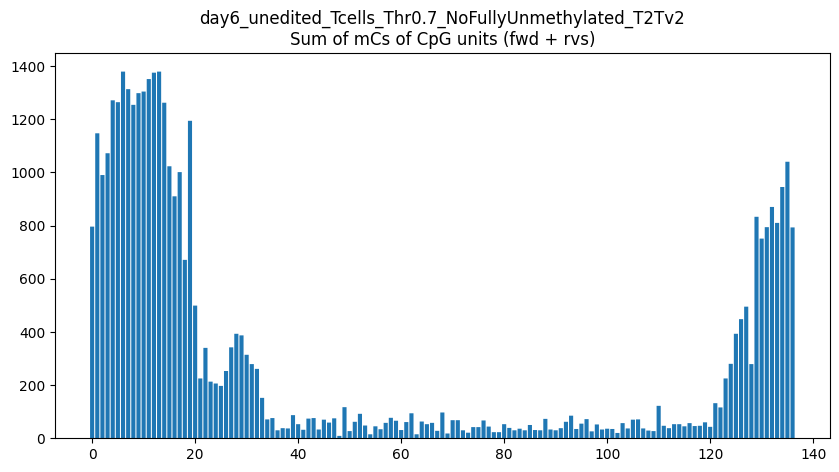

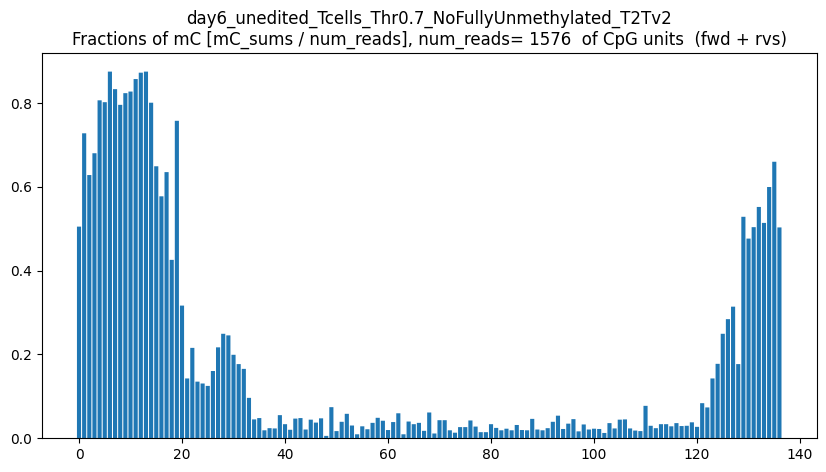

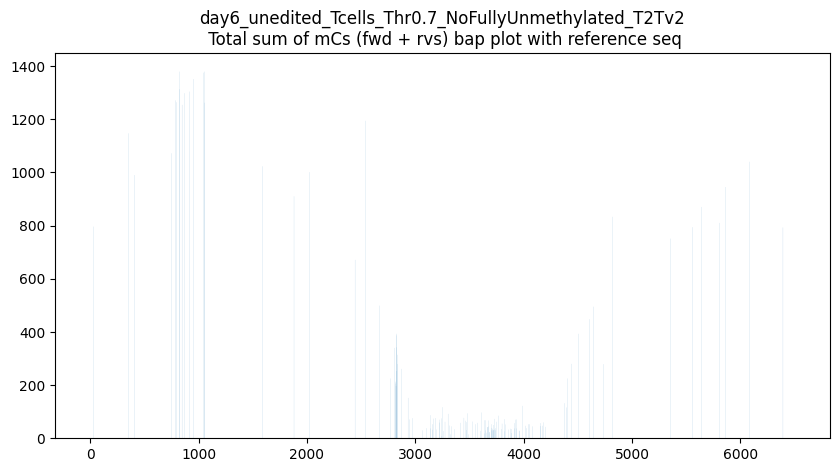

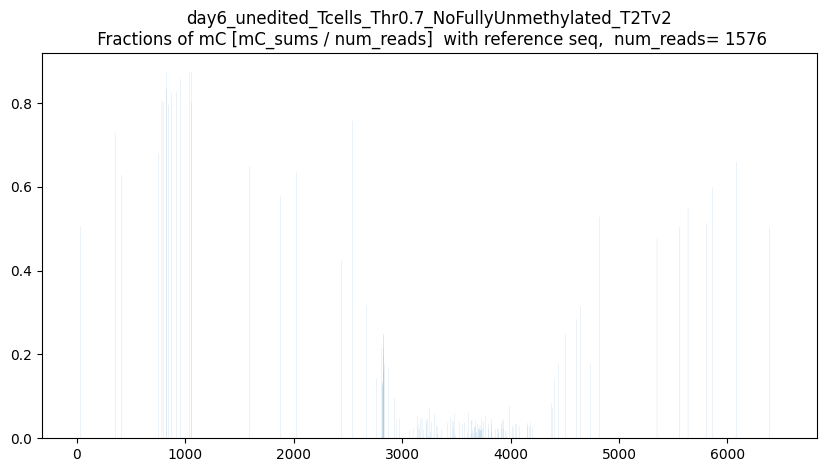

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



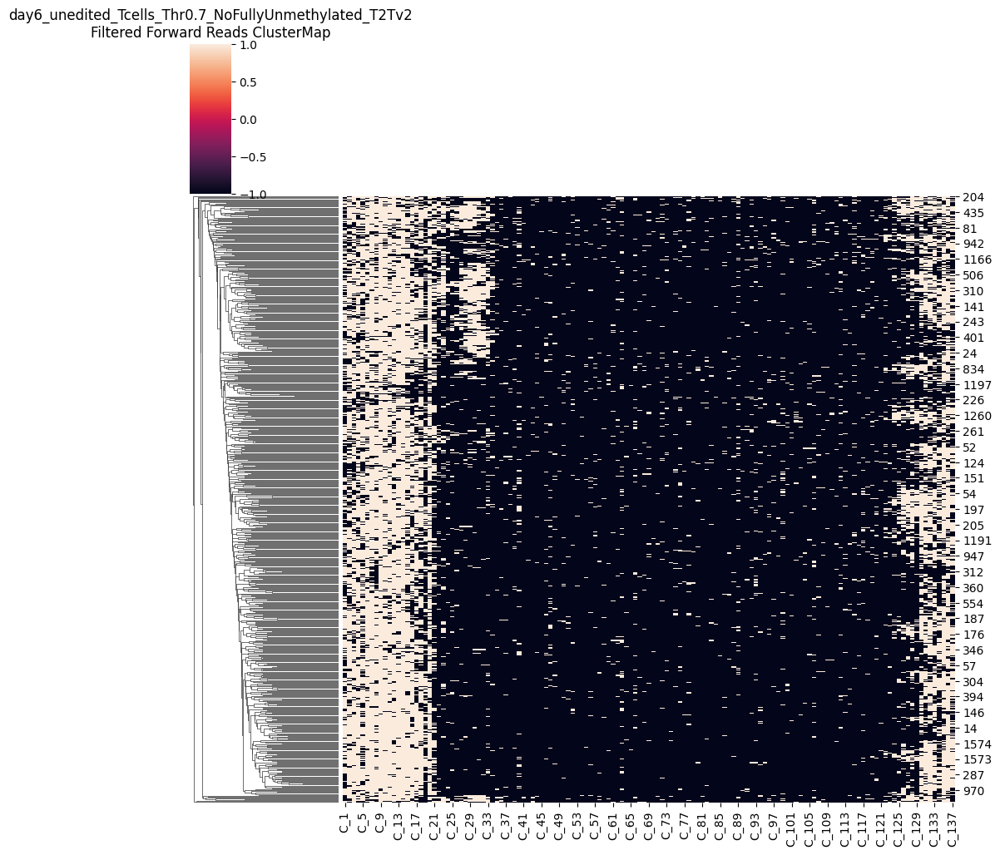

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



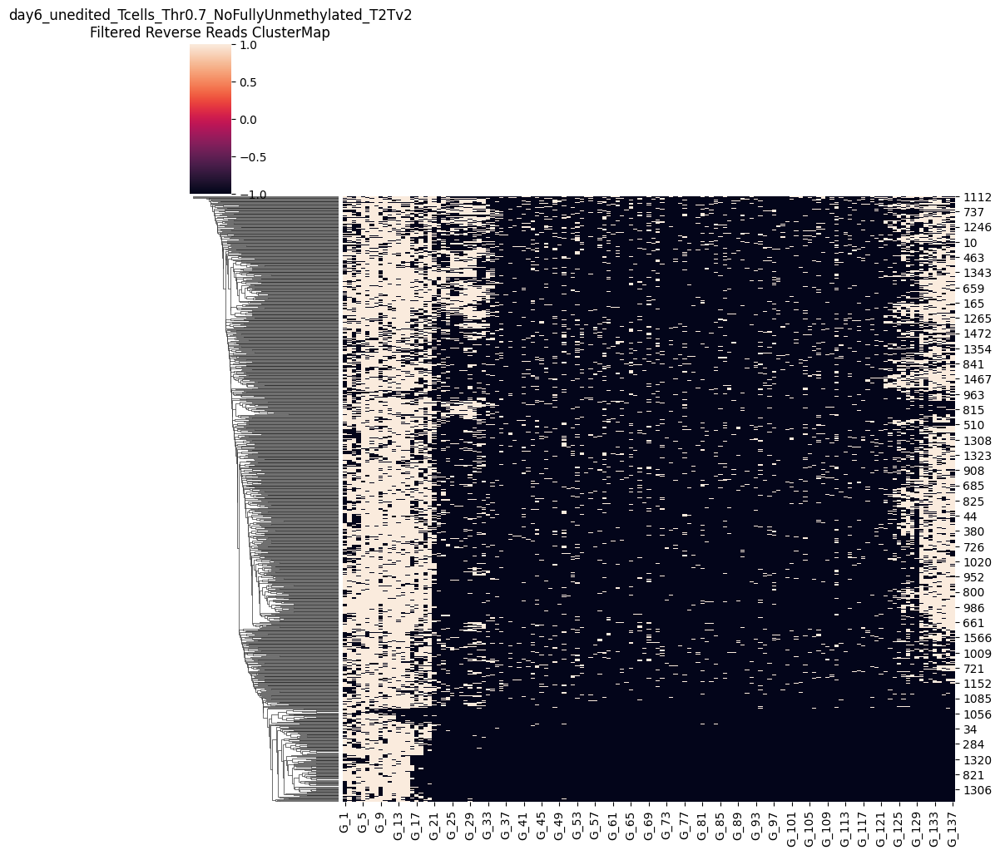

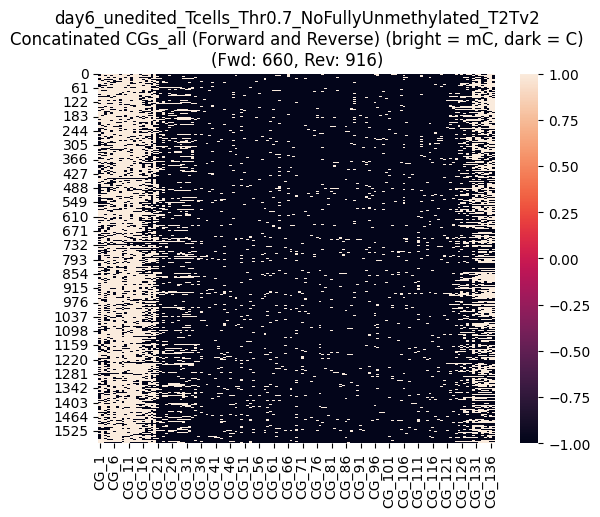

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



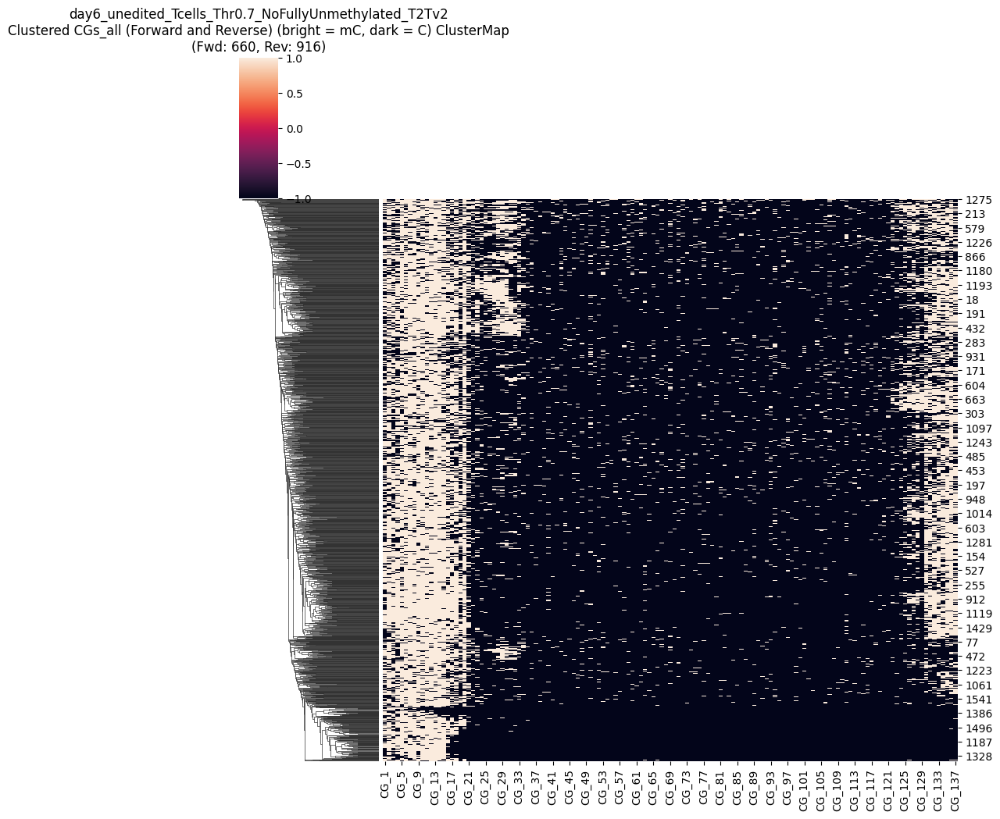

CGs_all saved as CG_137_removed_low10_methylated_padded_reads_day6_unedited_Tcells_Thr0.7_NoFullyUnmethylated_T2Tv2_mCthresh0.7_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD660_numRVS916.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,1.0
1,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
2,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0
3,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
4,NaN,1.0,1.0,1.0,1.0,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1571,NaN,1.0,1.0,NaN,1.0,1.0,NaN,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN
1572,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1573,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0
1574,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,NaN


In [41]:
threshold_percent = 10
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np

padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
if padded_reads is not None:
    plot_padded_reads(padded_reads, ref_seq_list)
    save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)


# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")

CGs_all_unedited_mc07_remove_low10 = CGs_all
CGs_all_unedited_mc07_remove_low10


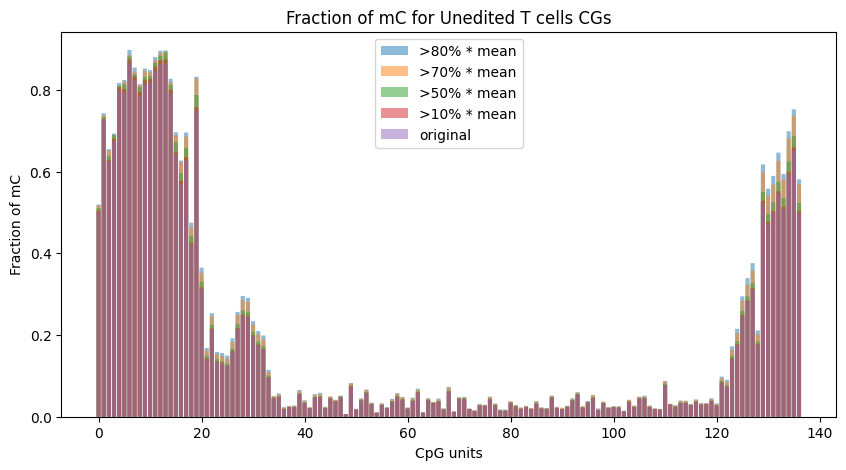

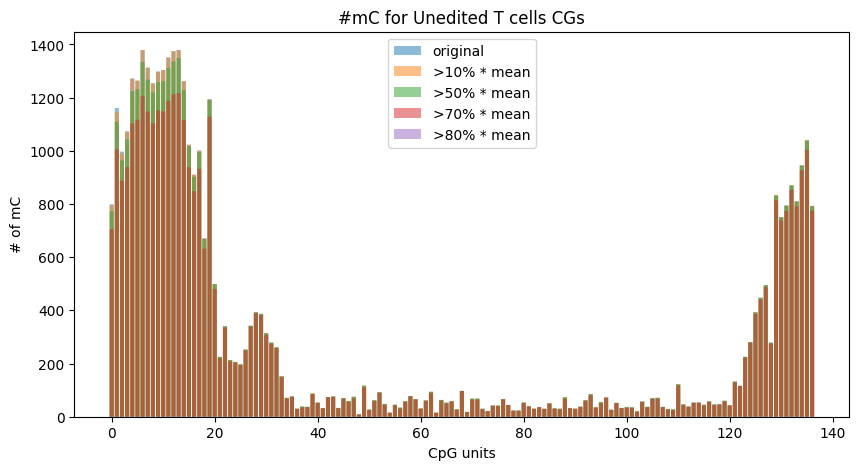

In [45]:
# CGs_all_unedited_remove_low80 vs. CGs_all_unedited_remove_low50 

# import matplotlib.pyplot as plt

# # Calculate the fraction of mC for both DataFrames
# CGs_all_unedited_cut['fraction_mC'] = CGs_all_unedited_cut['mC_sums'] / CGs_all_unedited_cut['num_reads']
# CGs_all_silenced_cut['fraction_mC'] = CGs_all_silenced_cut['mC_sums'] / CGs_all_silenced_cut['num_reads']


CGs_all_unedited_cut_sums = np.nansum(CGs_all_unedited_mc07_remove_low80.values, axis=0) 
CGs_all_unedited_cut_frac = CGs_all_unedited_cut_sums  / len(CGs_all_unedited_mc07_remove_low80) 


CGs_all_unedited_remove_low70_sums = np.nansum(CGs_all_unedited_mc07_remove_low70.values, axis=0) 
CGs_all_unedited_remove_low70_frac = CGs_all_unedited_remove_low70_sums  / len(CGs_all_unedited_mc07_remove_low70) 


CGs_all_silenced_cut_sums = np.nansum(CGs_all_unedited_mc07_remove_low50.values, axis=0) 
CGs_all_silenced_cut_frac = CGs_all_silenced_cut_sums  /len(CGs_all_unedited_mc07_remove_low50) 


CGs_all_unedited_remove_low10_sums = np.nansum(CGs_all_unedited_mc07_remove_low10.values, axis=0) 
CGs_all_unedited_remove_low10_frac = CGs_all_unedited_remove_low10_sums  / len(CGs_all_unedited_mc07_remove_low10) 

CGs_all_silenced_full_sums = np.nansum(CGs_all_unedited_mc07_original.values, axis=0) 
CGs_all_silenced_full_frac = CGs_all_silenced_full_sums / len(CGs_all_unedited_mc07_original) 



# Plot the fraction mC for CGs_all_unedited_cut
# plt.bar(CGs_all_unedited_cut.index, CGs_all_unedited_cut_frac, alpha=0.5, label='Unedited')

plt.figure(figsize=(10, 5))
# Plot the fraction mC for CGs_all_silenced_cut



plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_unedited_cut_frac, snap=False, alpha=0.5, label='>80% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low70_sums)), CGs_all_unedited_remove_low70_frac, snap=False, alpha=0.5, label='>70% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_silenced_cut_frac, snap=False, alpha=0.5, label='>50% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low10_sums)), CGs_all_unedited_remove_low10_frac, snap=False, alpha=0.5, label='>10% * mean')
plt.bar(np.arange(len(CGs_all_silenced_full_sums)), CGs_all_silenced_full_frac, snap=False, alpha=0.5, label='original')


# plt.title(f"{experiment_name}\nSum of mCs of CpG units (fwd + rvs)")
# plt.show()

# Add labels and title
plt.xlabel('CpG units')
plt.ylabel('Fraction of mC')
plt.title('Fraction of mC for Unedited T cells CGs')
plt.legend()

# Show the plot
plt.show()
 

CGs_all_unedited_remove_low70_sums = np.nansum(CGs_all_unedited_mc07_remove_low70.values, axis=0) 
CGs_all_unedited_remove_low70_frac = CGs_all_unedited_remove_low70_sums # / len(CGs_all_unedited_mc07_remove_low70) 


CGs_all_silenced_cut_sums = np.nansum(CGs_all_unedited_mc07_remove_low50.values, axis=0) 
CGs_all_silenced_cut_frac = CGs_all_silenced_cut_sums # /len(CGs_all_unedited_mc07_remove_low50) 


CGs_all_unedited_remove_low10_sums = np.nansum(CGs_all_unedited_mc07_remove_low10.values, axis=0) 
CGs_all_unedited_remove_low10_frac = CGs_all_unedited_remove_low10_sums # / len(CGs_all_unedited_mc07_remove_low10) 

CGs_all_silenced_full_sums = np.nansum(CGs_all_unedited_mc07_original.values, axis=0) 
CGs_all_silenced_full_frac = CGs_all_silenced_full_sums # / len(CGs_all_unedited_mc07_original) 



# Plot the fraction mC for CGs_all_unedited_cut
# plt.bar(CGs_all_unedited_cut.index, CGs_all_unedited_cut_frac, alpha=0.5, label='Unedited')

plt.figure(figsize=(10, 5))
# Plot the fraction mC for CGs_all_silenced_cut


plt.bar(np.arange(len(CGs_all_silenced_full_sums)), CGs_all_silenced_full_frac, snap=False, alpha=0.5, label='original')
plt.bar(np.arange(len(CGs_all_unedited_remove_low10_sums)), CGs_all_unedited_remove_low10_frac, snap=False, alpha=0.5, label='>10% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_silenced_cut_frac, snap=False, alpha=0.5, label='>50% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low70_sums)), CGs_all_unedited_remove_low70_frac, snap=False, alpha=0.5, label='>70% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_unedited_cut_frac, snap=False, alpha=0.5, label='>80% * mean')



# plt.title(f"{experiment_name}\nSum of mCs of CpG units (fwd + rvs)")
# plt.show()

# Add labels and title
plt.xlabel('CpG units')
plt.ylabel('# of mC')
plt.title('#mC for Unedited T cells CGs')
plt.legend()

# Show the plot
plt.show()

# 0.95

experiment_name =  day6_unedited_Tcells_Thr0.95_NoFullyUnmethylated_T2Tv2
Region length: 6500
No specified number of cores requested. 24 available on machine, allocating all.
Modification threshold of 0.95 will be treated as coming from range 0-1.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 3539 from reads.CG,0.txt into reads.combined_basemods.h5, new size 3539   0% | 00:00<…

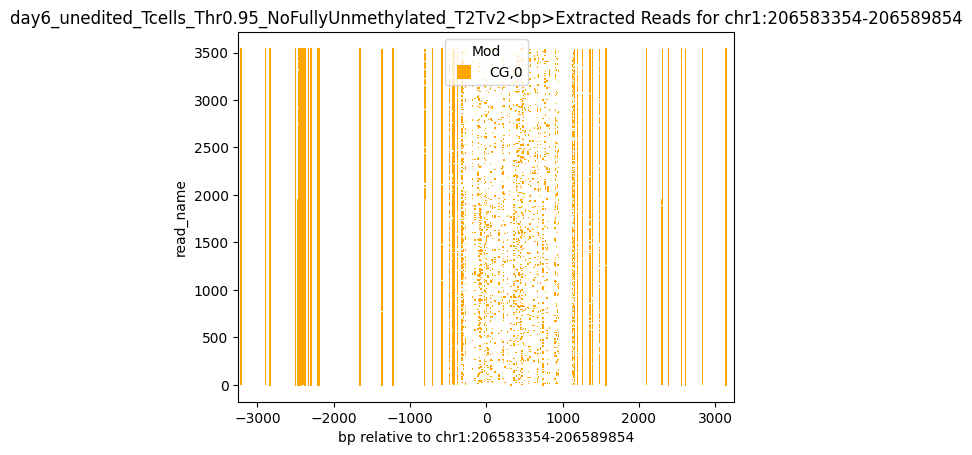

Found read coordinates: 3539 reads
Unique read names with methylation: 3513
Found 1601 reads with full coverage
Reads with methylation data: 3513
Overlap between full coverage and methylation: 1592
After full coverage filtering: 31303 reads with methylation data
Final result: 31303 reads with methylation information out of 3539 total reads


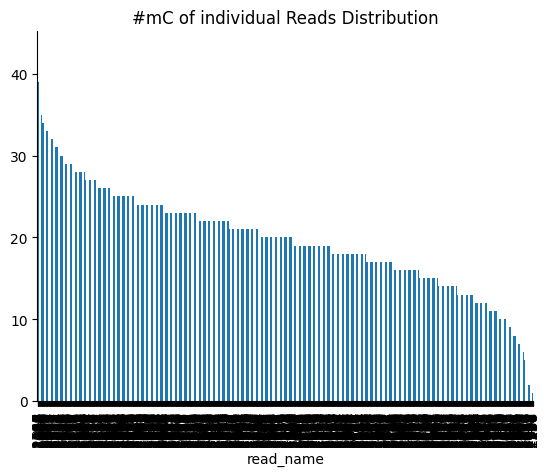

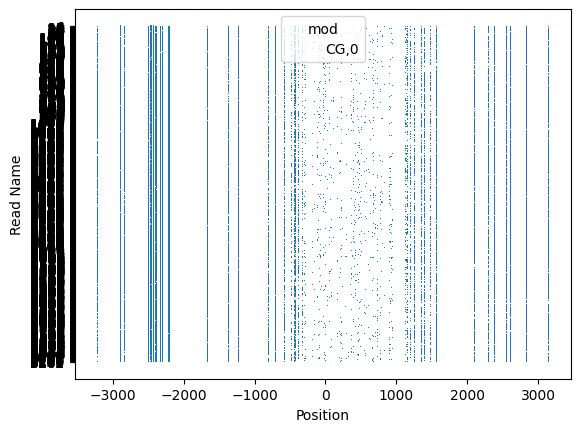

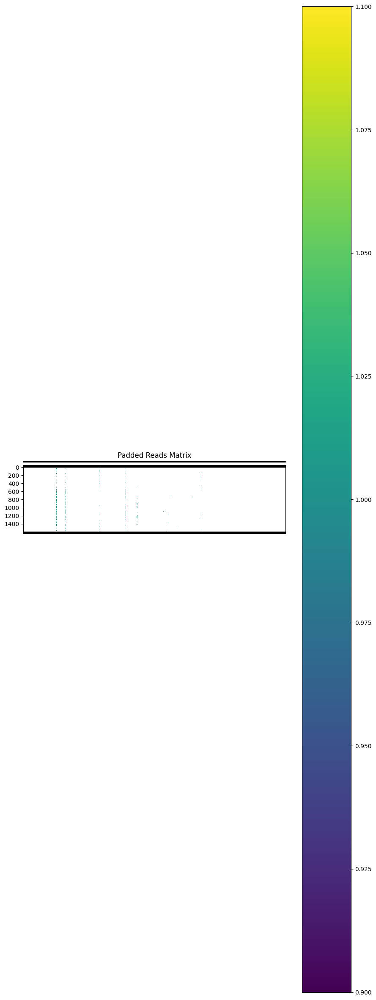

Padded reads saved to padded_reads_day6_unedited_Tcells_Thr0.95_NoFullyUnmethylated_T2Tv2_mCthresh0.95_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


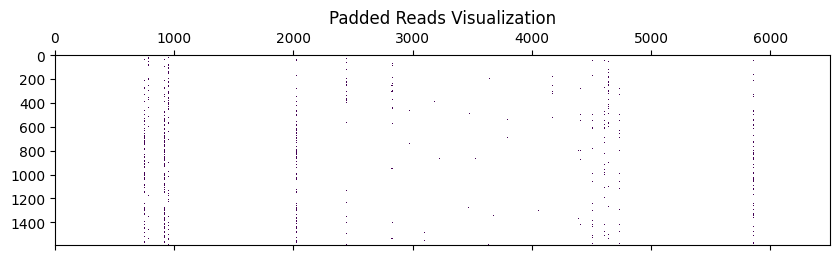

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

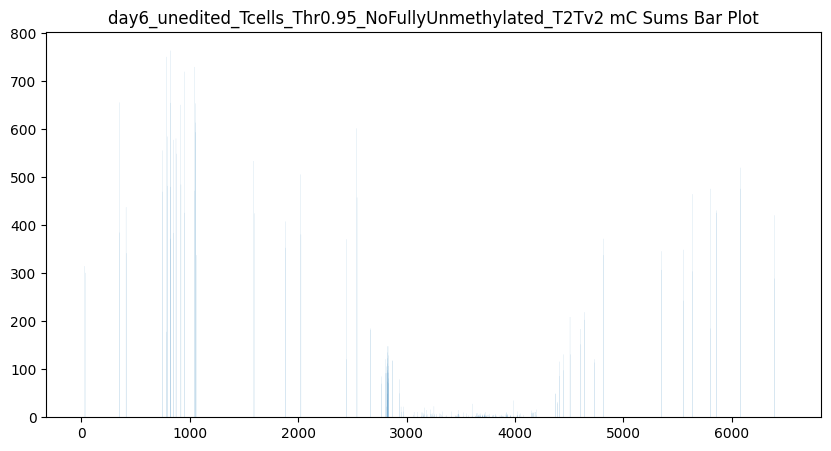

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


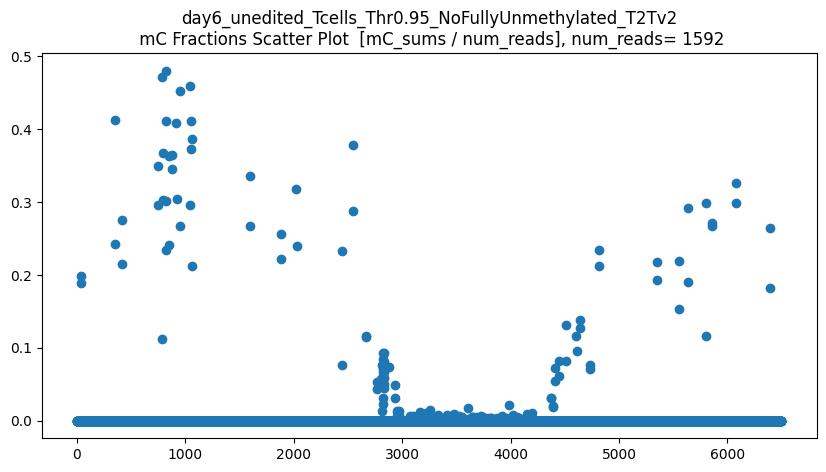

len(CGs_all) = 1592
CGs_all.shape = (1592, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


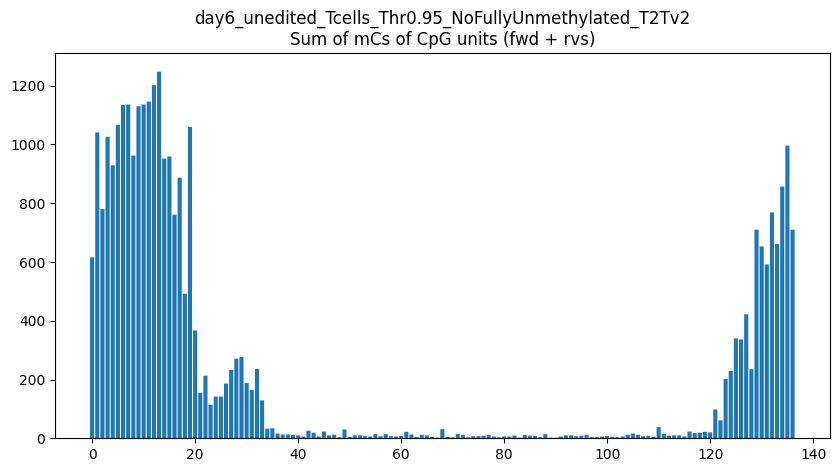

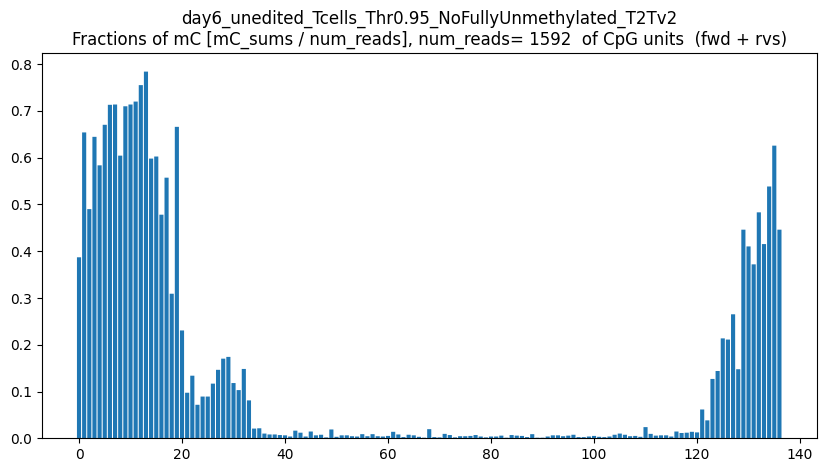

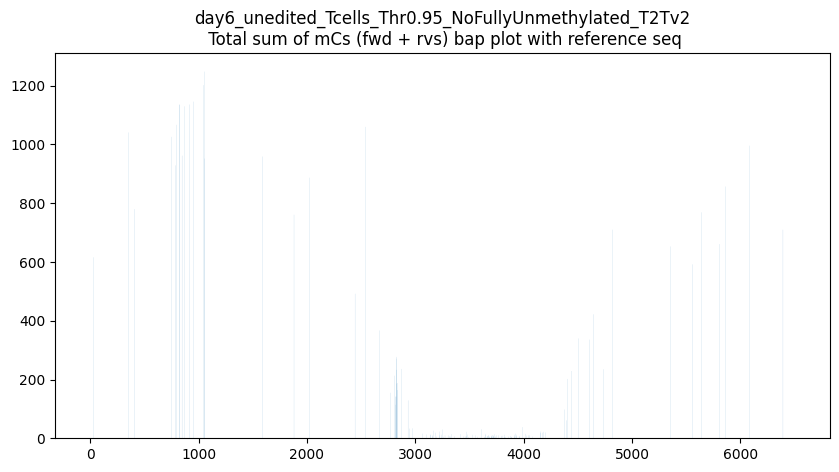

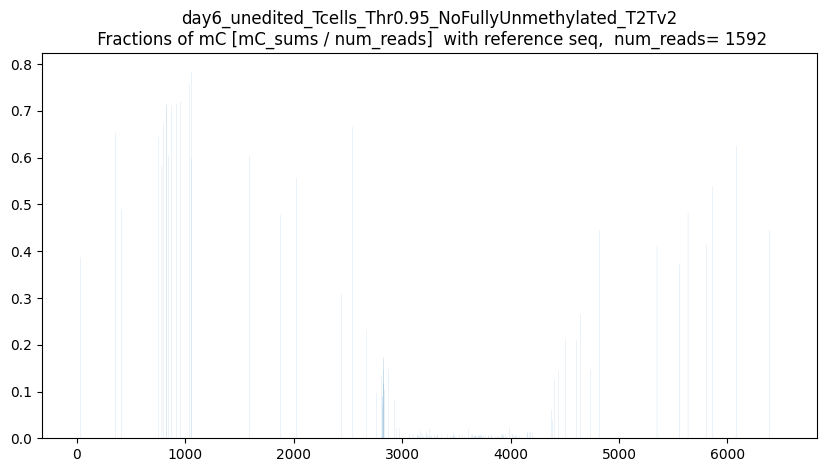

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



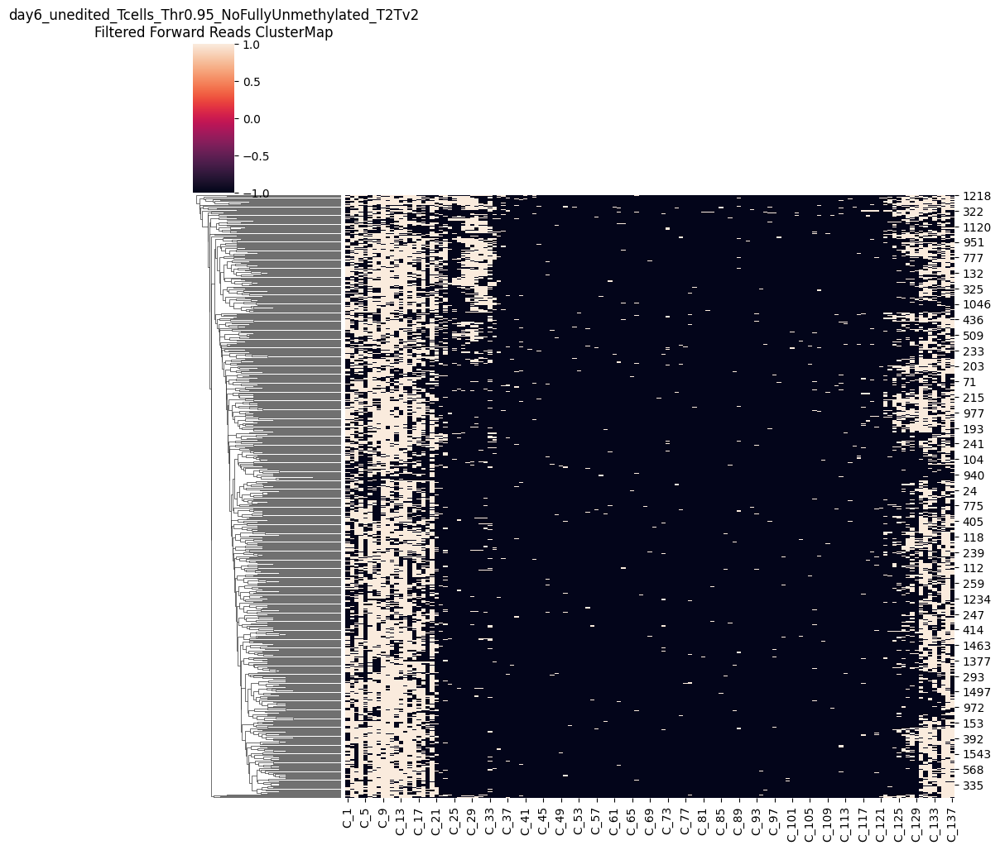

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



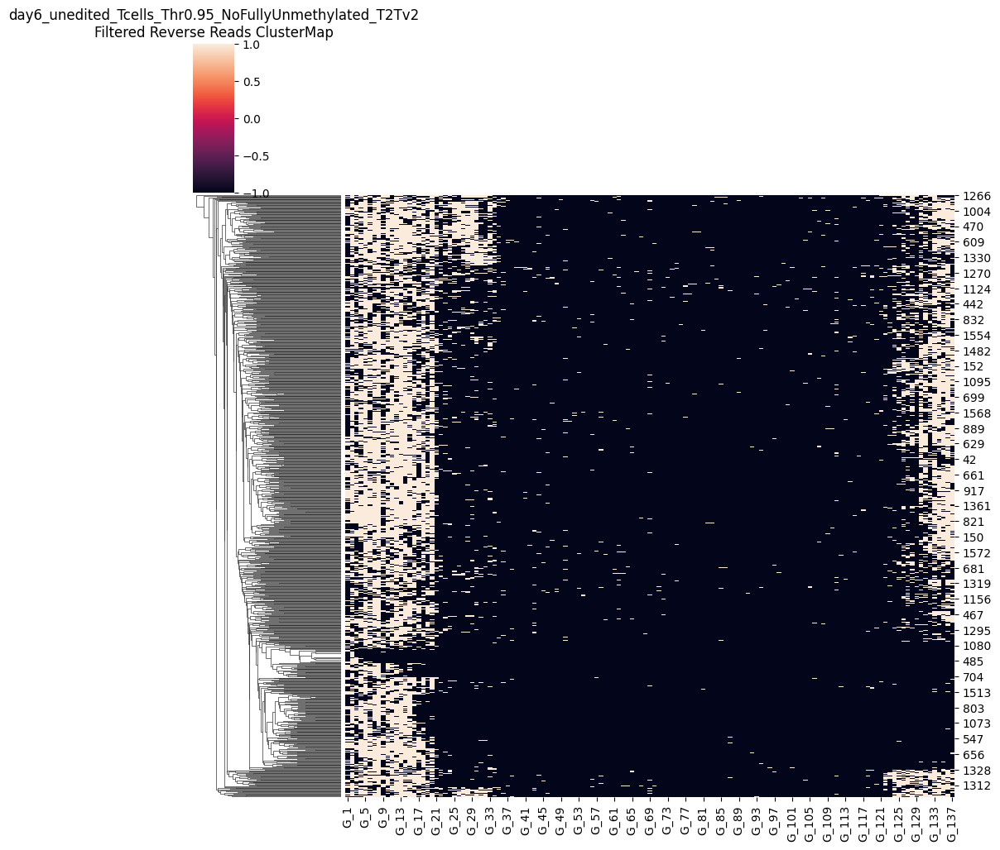

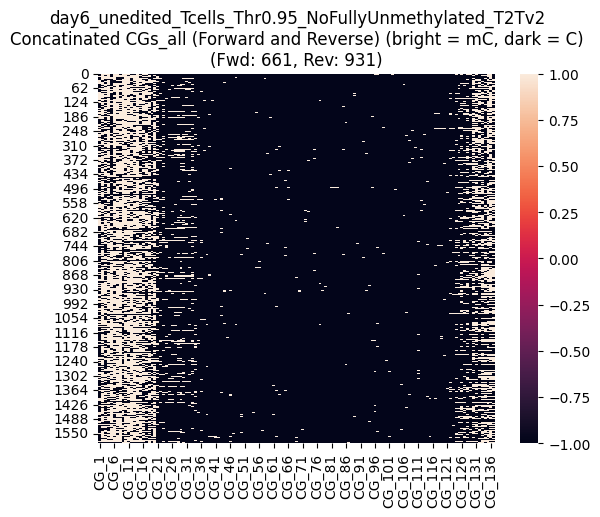

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



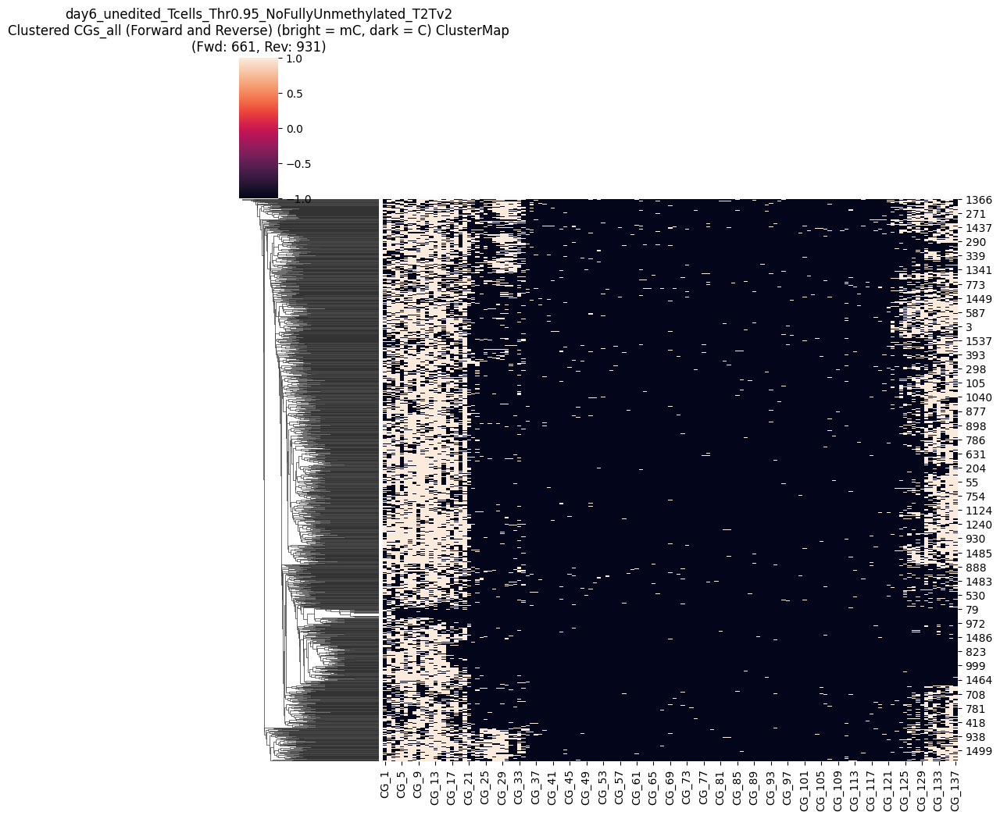

CGs_all saved as CG_137_padded_reads_day6_unedited_Tcells_Thr0.95_NoFullyUnmethylated_T2Tv2_mCthresh0.95_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD661_numRVS931.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


In [61]:
threshold_mC =  0.95 # 0.7 #  0.9 #0.99
experiment_name = "day6_unedited_Tcells_Thr"+str(threshold_mC)+"_NoFullyUnmethylated_T2Tv2"
bam_path = unedit_bam_path

print('experiment_name = ', experiment_name)

save_padded_reads_name_np = f"padded_reads_{experiment_name}_mCthresh{threshold_mC}_{reg_genome_version}_{region_str}_{date_today}.npy"
output_dir = create_output_directory("./dimelo_v2_output")

extract_file, extract_regions = extract_from_bam(
    experiment_name = experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
keep_full_coverage_reads_only=True

if extract_file:
    reads_df, regions_dict = process_extracted_reads(extract_file, region_str, motifs, ref_seq_list, 
    keep_full_coverage_reads_only=keep_full_coverage_reads_only)
    visualize_data(reads_df)

    padded_reads = create_padded_reads(reads_df, regions_dict, region_length)
    if padded_reads is not None:
        plot_padded_reads(padded_reads, ref_seq_list)
        save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np)

# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")


In [62]:

CGs_all_unedited_mc095_original = CGs_all
CGs_all_unedited_mc095_original

,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,1.0,1.0,NaN,1.0,NaN,1.0,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN
1,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,NaN,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,1.0,NaN
2,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0
3,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
4,NaN,1.0,1.0,1.0,NaN,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,NaN,NaN,NaN,1.0,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1587,NaN,1.0,1.0,NaN,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN
1588,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
1589,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0
1590,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN


Mean methylated CGs per read: 20.0
Maximum methylated CGs per read: 43.0
Threshold (80% of max): 16.00
Original number of reads: 1592
Number of reads after filtering: 1224
Removed 368 reads


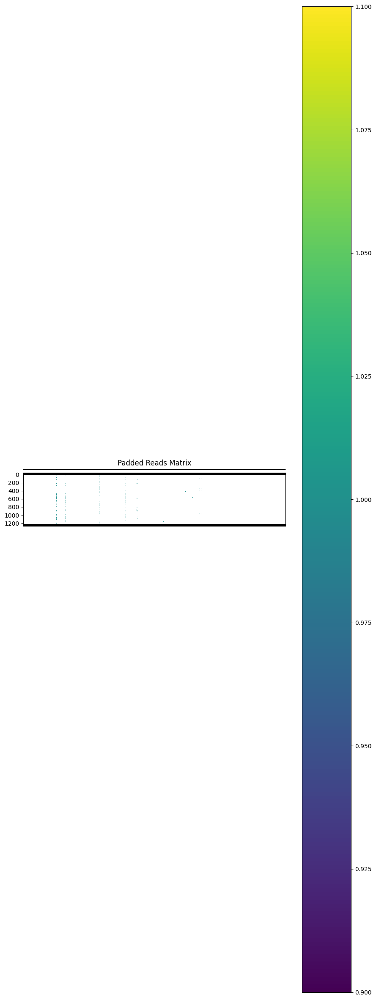

Padded reads saved to removed_low80_methylated_padded_reads_day6_unedited_Tcells_Thr0.95_NoFullyUnmethylated_T2Tv2_mCthresh0.95_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


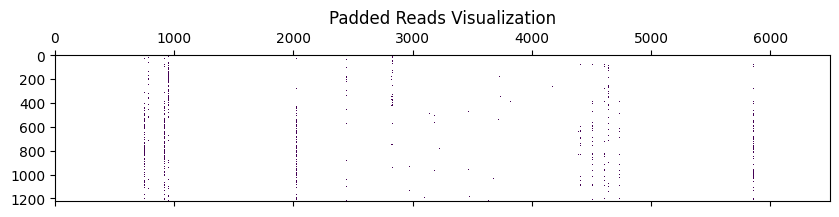

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

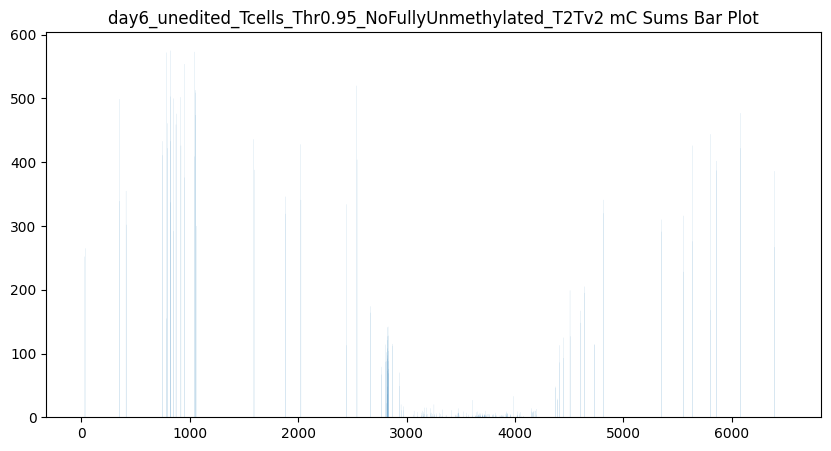

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


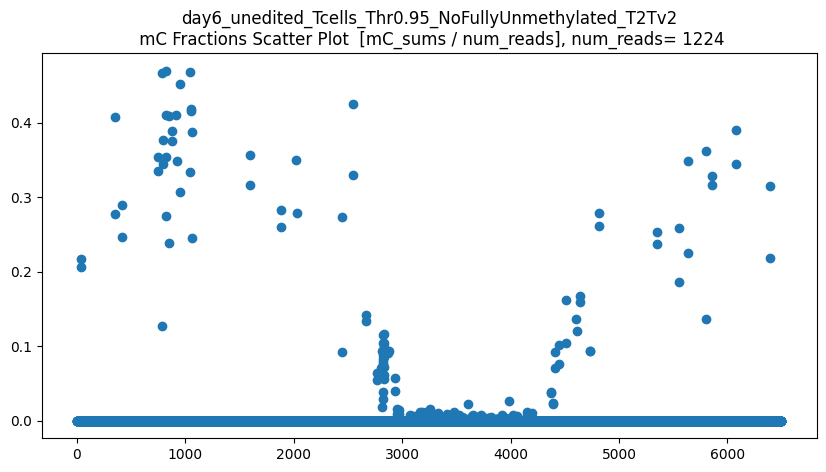

len(CGs_all) = 1224
CGs_all.shape = (1224, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


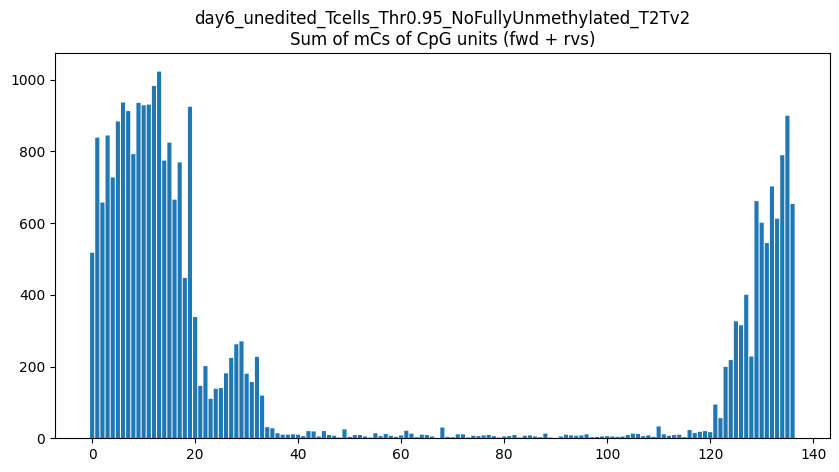

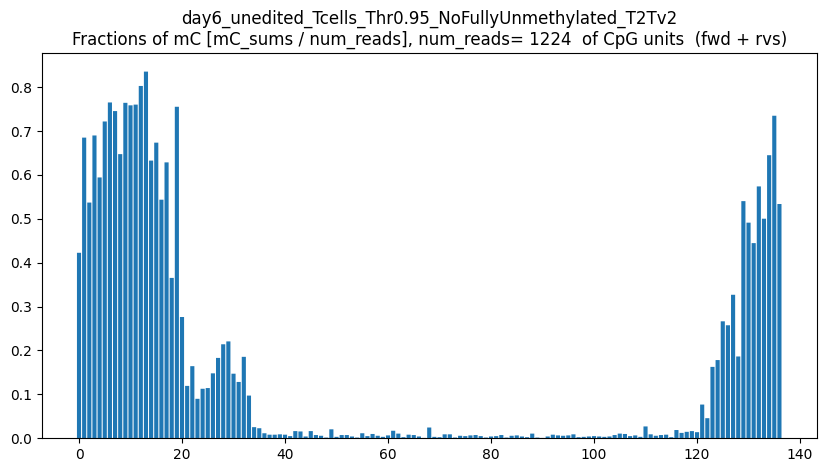

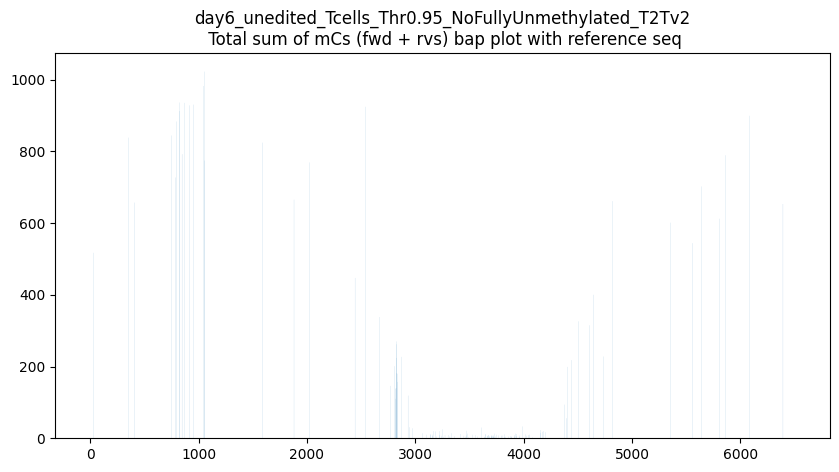

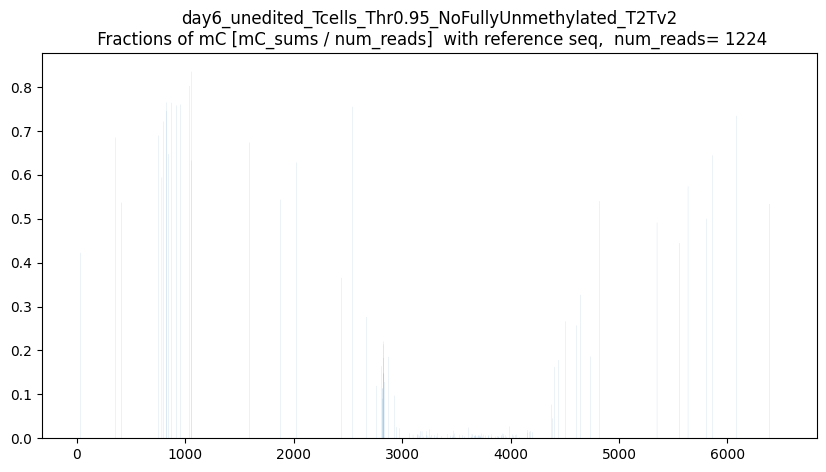

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



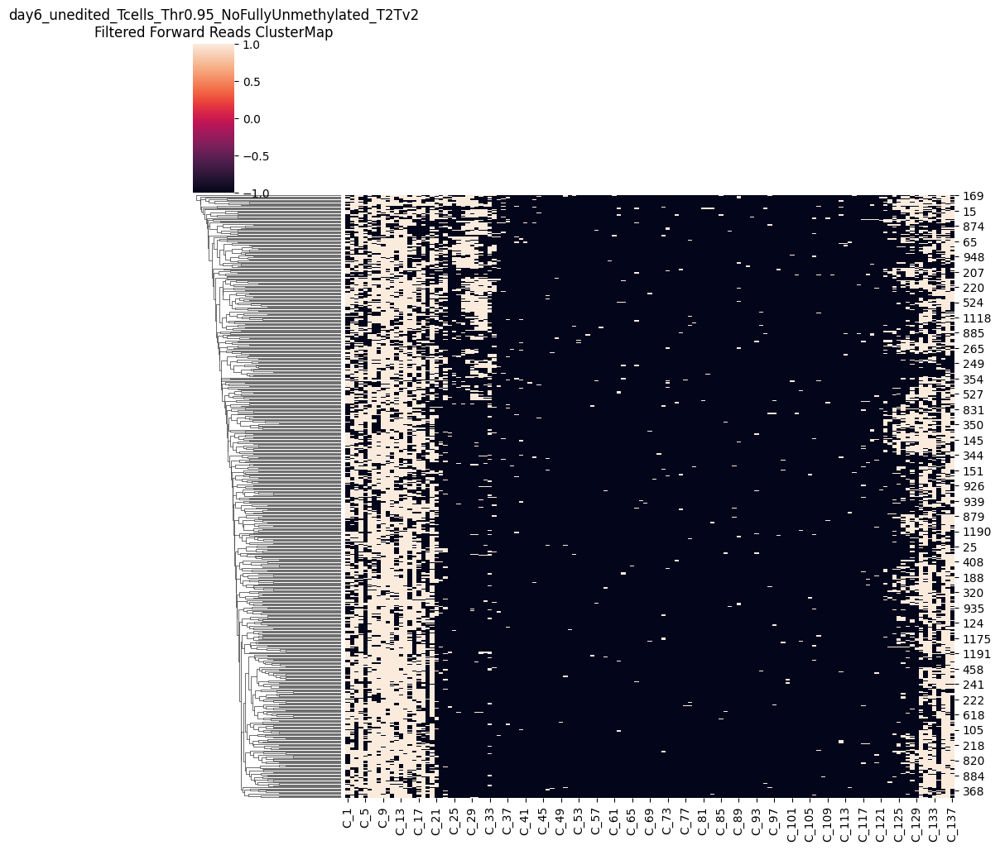

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



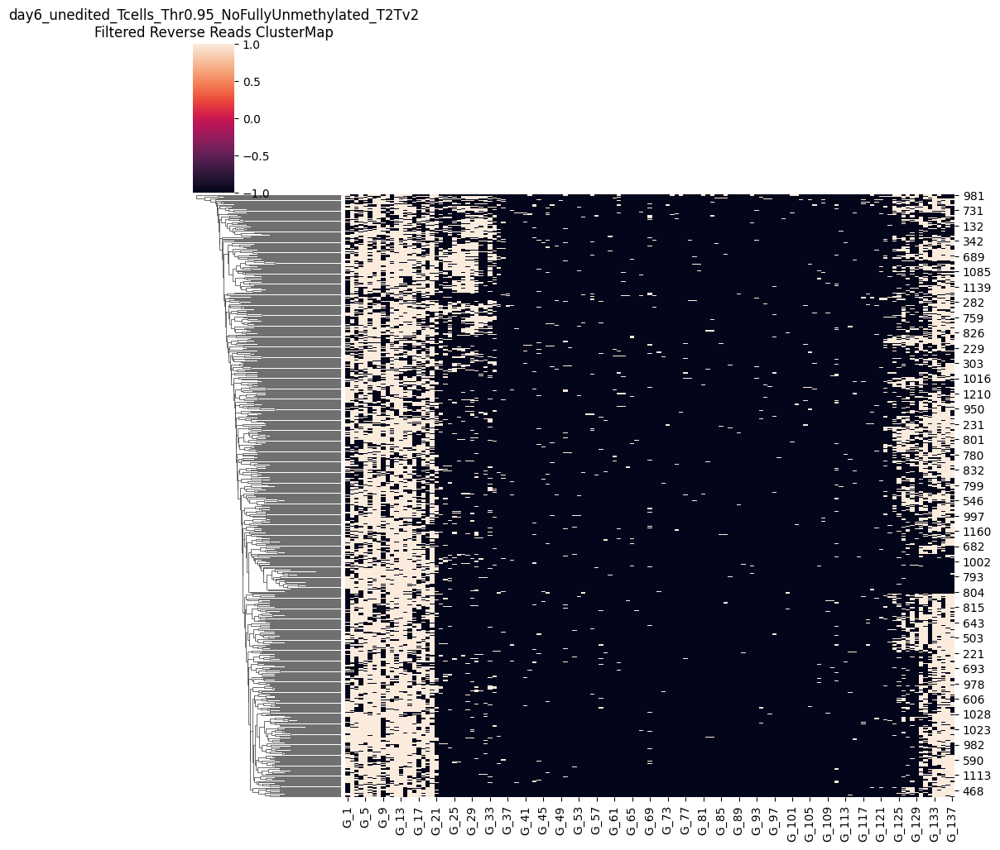

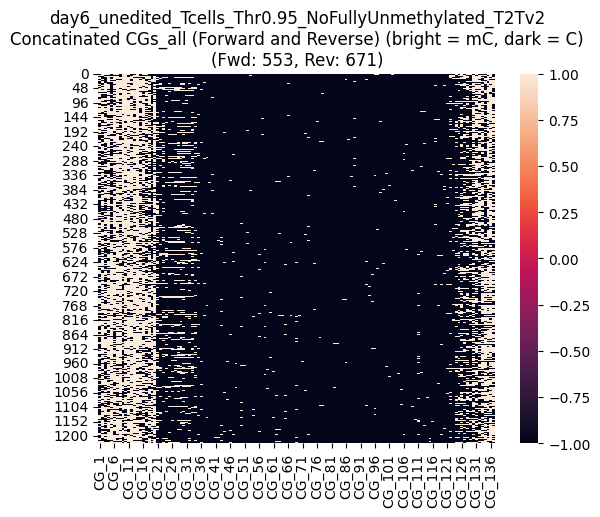

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



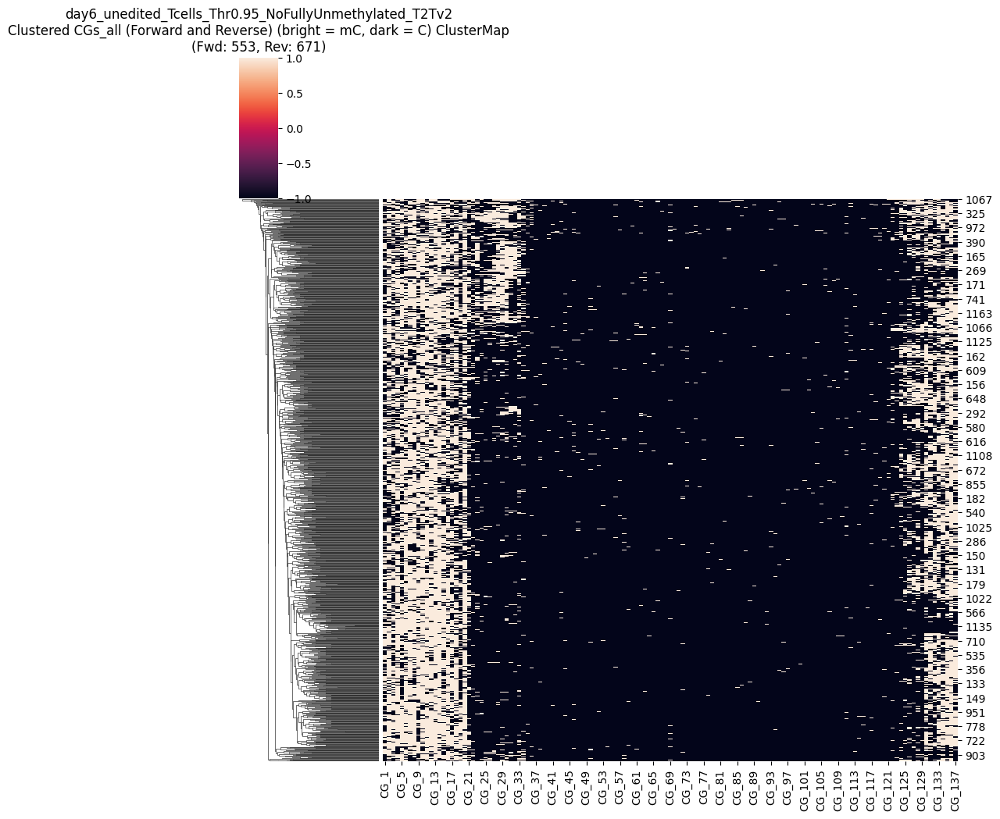

CGs_all saved as CG_137_removed_low80_methylated_padded_reads_day6_unedited_Tcells_Thr0.95_NoFullyUnmethylated_T2Tv2_mCthresh0.95_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD553_numRVS671.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,NaN,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,1.0,NaN
1,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0
2,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
3,NaN,1.0,1.0,1.0,NaN,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,NaN,NaN,NaN,1.0,1.0,NaN
4,NaN,1.0,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,NaN,1.0,1.0,NaN,1.0,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1219,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,NaN,NaN,...,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0
1220,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,NaN
1221,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,NaN,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,1.0,1.0,NaN,NaN
1222,NaN,1.0,1.0,1.0,1.0,1.0,NaN,1.0,NaN,NaN,...,1.0,NaN,1.0,1.0,1.0,1.0,1.0,NaN,1.0,NaN


In [63]:
threshold_percent = 80
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np

padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
if padded_reads is not None:
    plot_padded_reads(padded_reads, ref_seq_list)
    save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)


# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")

CGs_all_unedited_mc095_remove_low80 = CGs_all
CGs_all_unedited_mc095_remove_low80


Mean methylated CGs per read: 20.0
Maximum methylated CGs per read: 43.0
Threshold (70% of max): 14.00
Original number of reads: 1592
Number of reads after filtering: 1347
Removed 245 reads


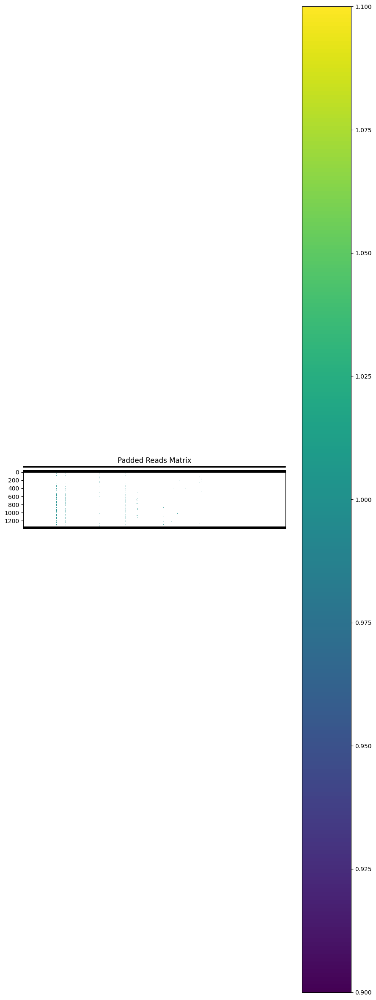

Padded reads saved to removed_low70_methylated_padded_reads_day6_unedited_Tcells_Thr0.95_NoFullyUnmethylated_T2Tv2_mCthresh0.95_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


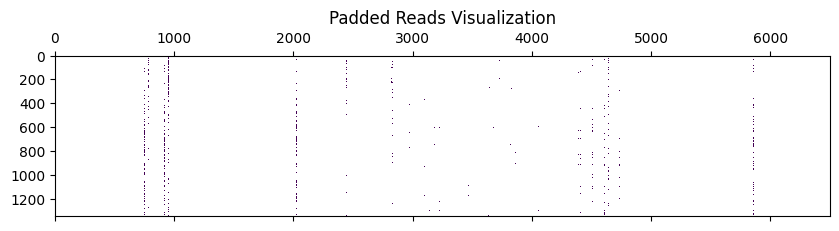

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

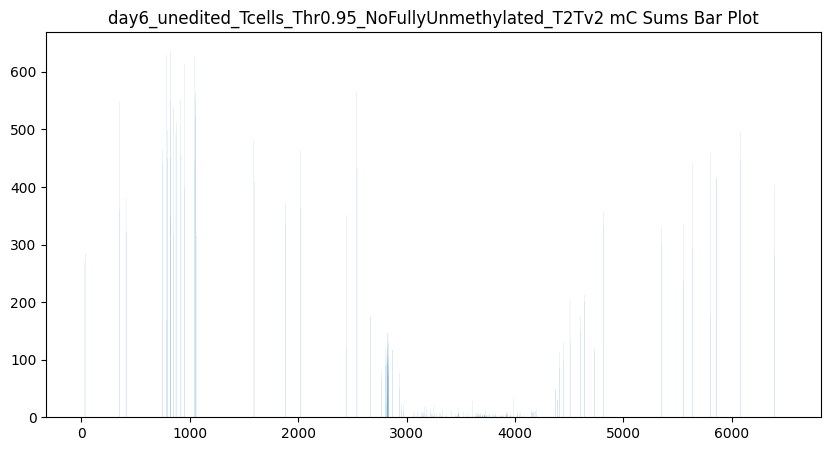

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


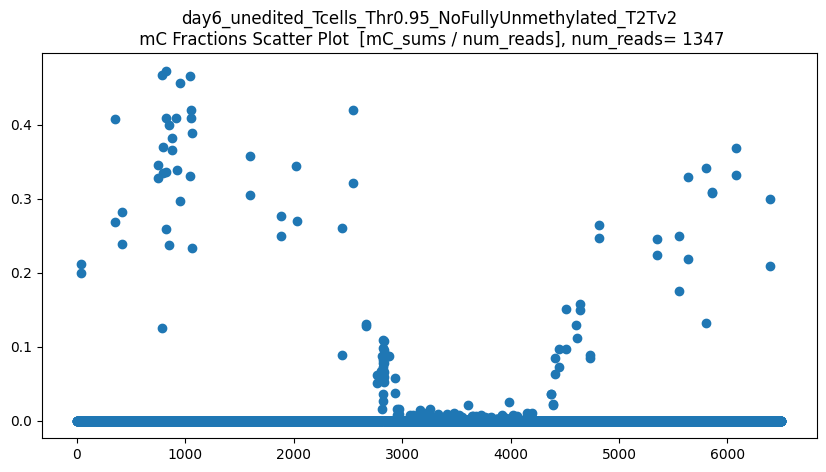

len(CGs_all) = 1347
CGs_all.shape = (1347, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


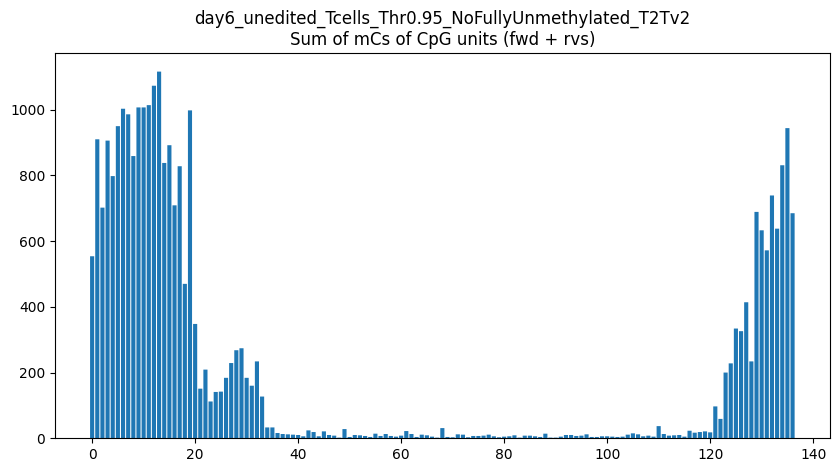

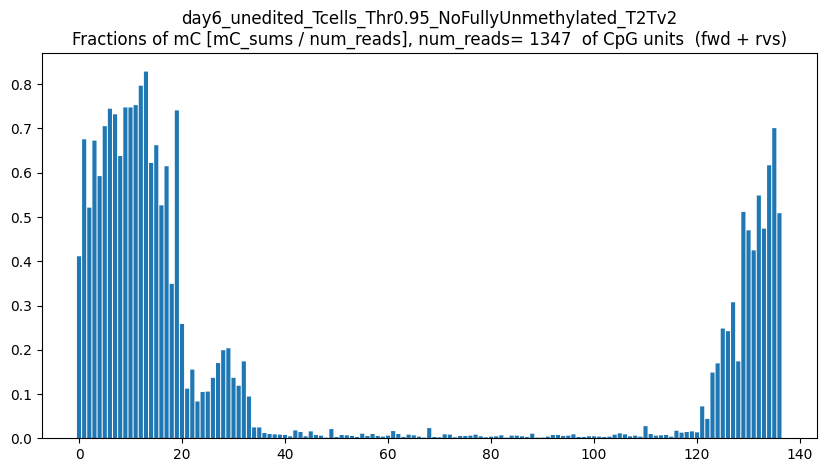

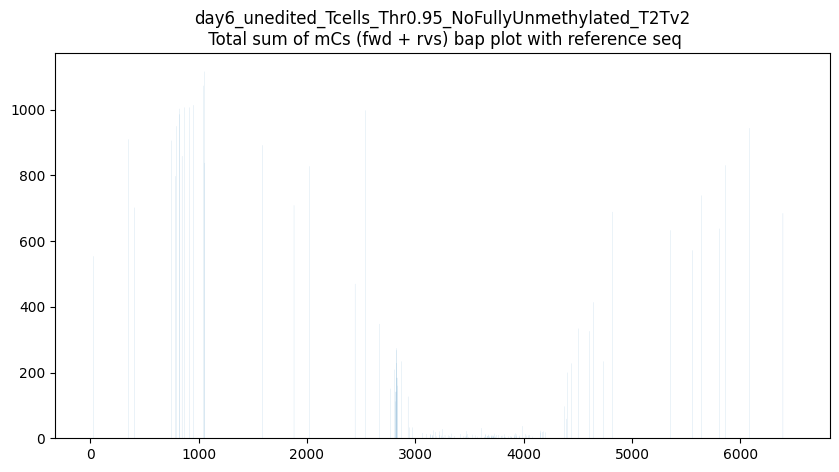

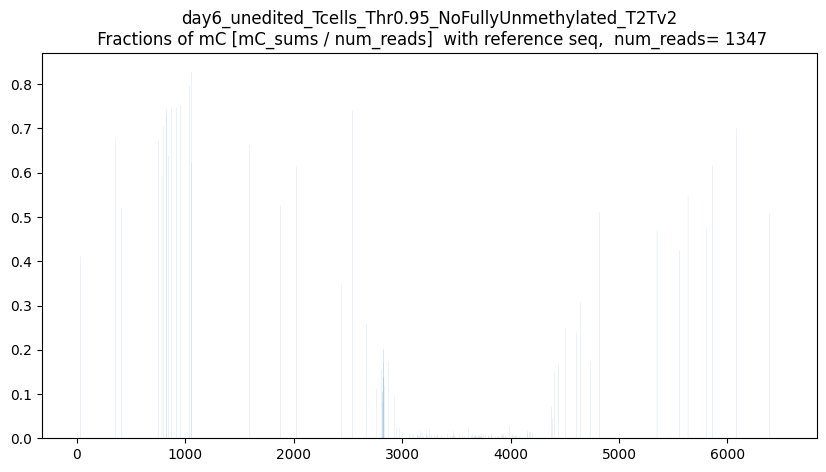

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



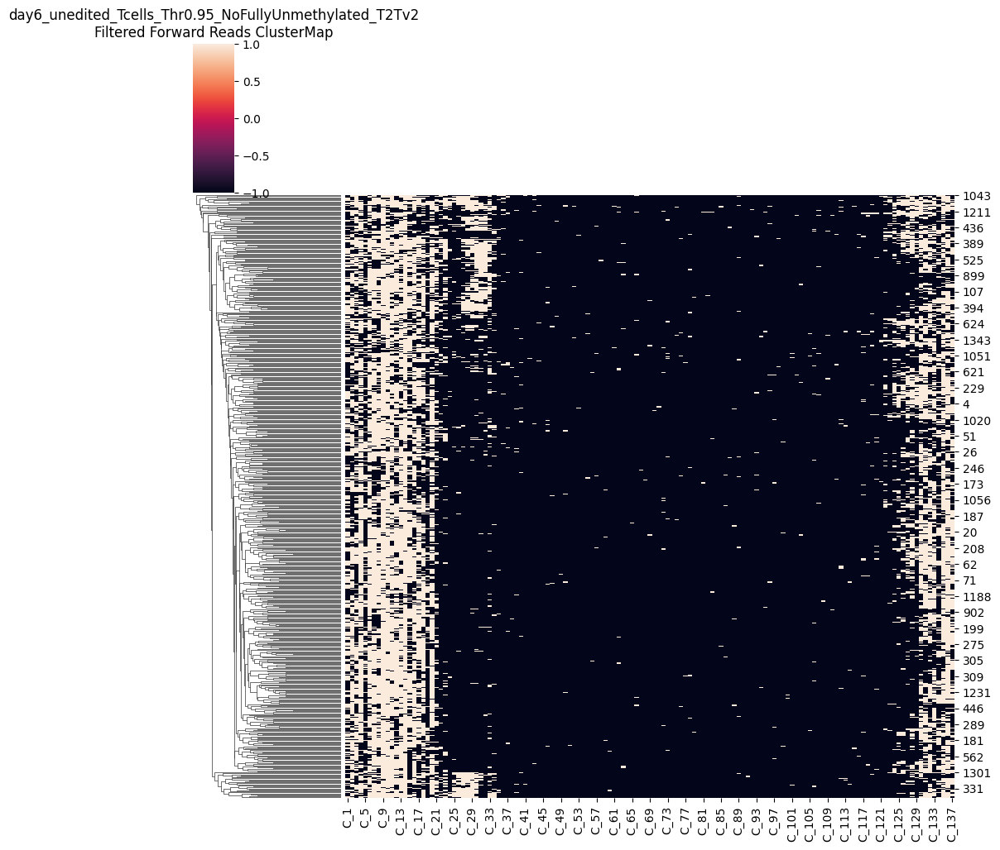

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



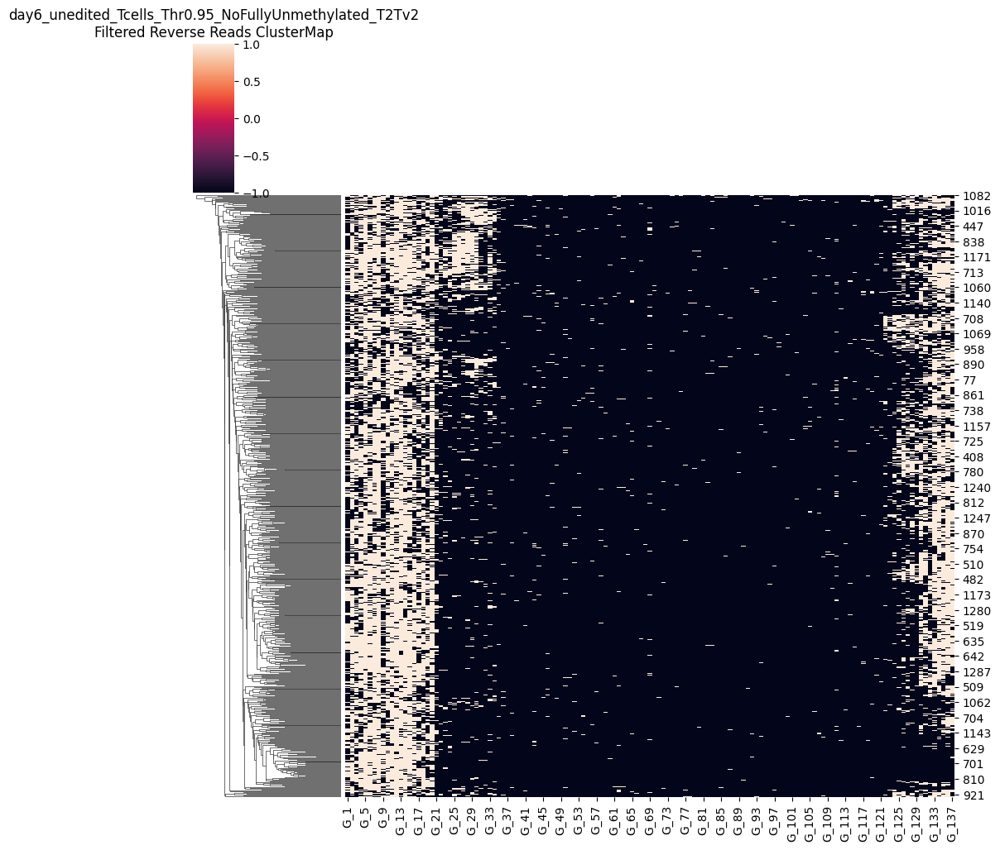

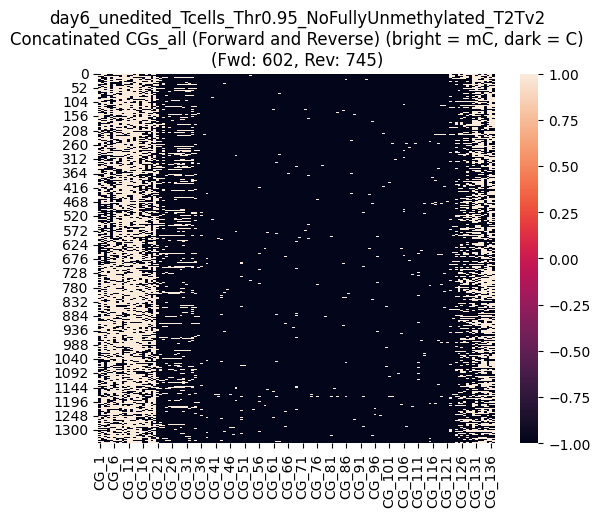

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



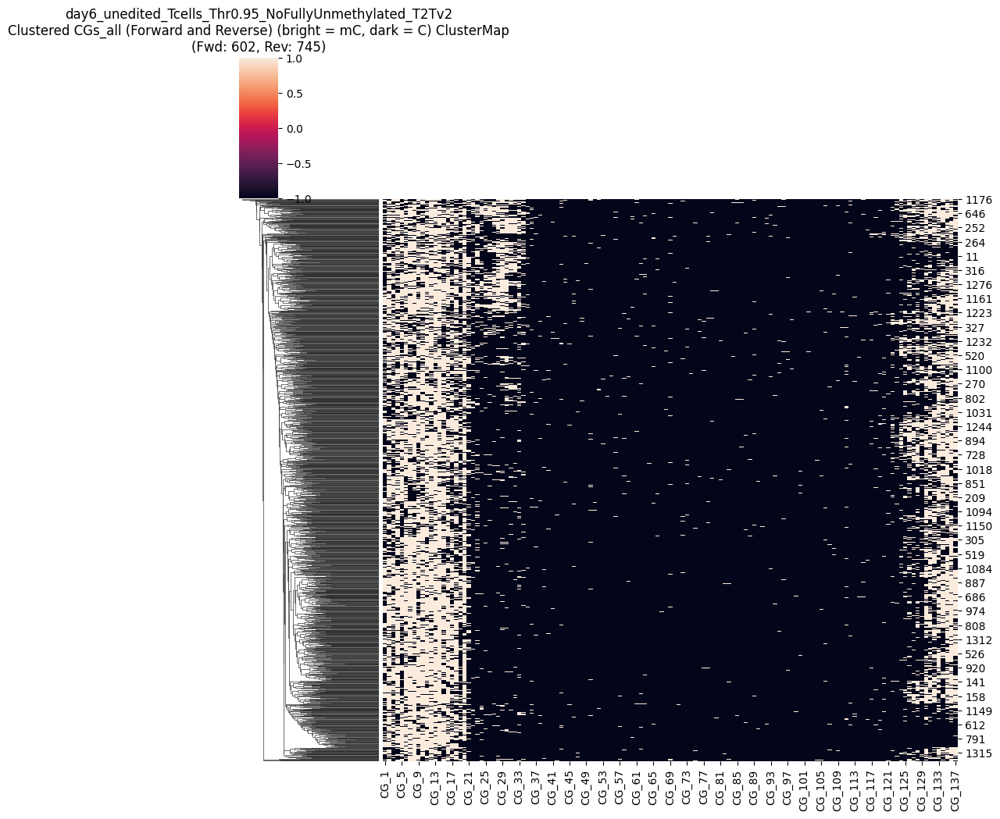

CGs_all saved as CG_137_removed_low70_methylated_padded_reads_day6_unedited_Tcells_Thr0.95_NoFullyUnmethylated_T2Tv2_mCthresh0.95_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD602_numRVS745.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,1.0,1.0,NaN,1.0,NaN,1.0,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN
1,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,NaN,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,1.0,NaN
2,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0
3,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
4,NaN,1.0,1.0,1.0,NaN,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,NaN,NaN,NaN,1.0,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1342,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,NaN
1343,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,NaN,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,1.0,1.0,NaN,NaN
1344,NaN,1.0,1.0,1.0,1.0,1.0,NaN,1.0,NaN,NaN,...,1.0,NaN,1.0,1.0,1.0,1.0,1.0,NaN,1.0,NaN
1345,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0


In [64]:
threshold_percent = 70
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np

padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
if padded_reads is not None:
    plot_padded_reads(padded_reads, ref_seq_list)
    save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)


# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")

CGs_all_unedited_mc095_remove_low70 = CGs_all
CGs_all_unedited_mc095_remove_low70


Mean methylated CGs per read: 20.0
Maximum methylated CGs per read: 43.0
Threshold (50% of max): 10.00
Original number of reads: 1592
Number of reads after filtering: 1515
Removed 77 reads


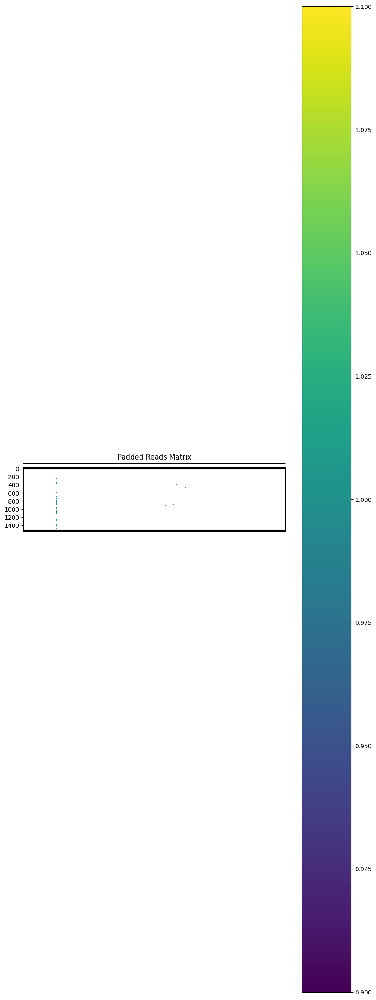

Padded reads saved to removed_low50_methylated_padded_reads_day6_unedited_Tcells_Thr0.95_NoFullyUnmethylated_T2Tv2_mCthresh0.95_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


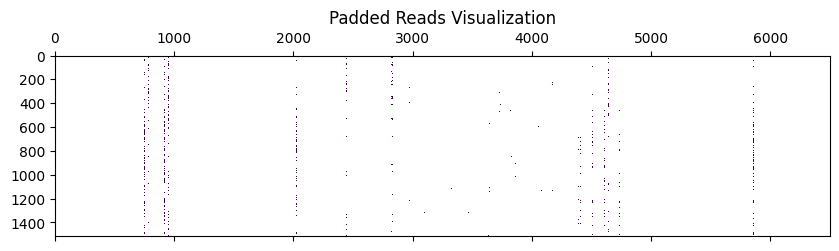

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

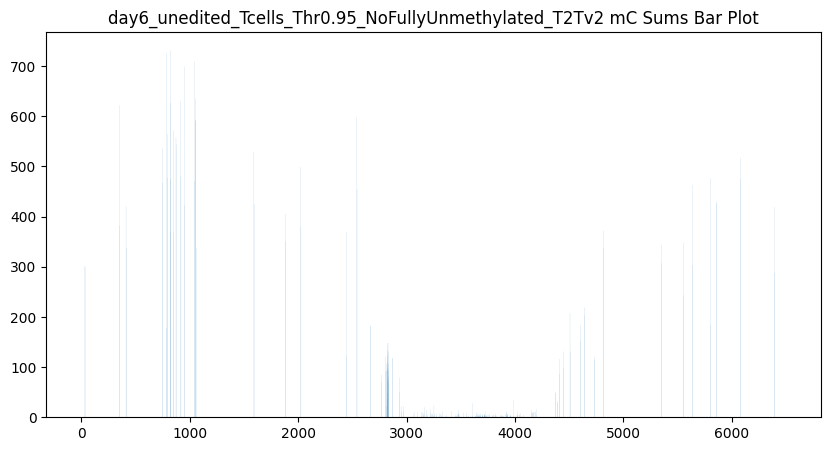

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


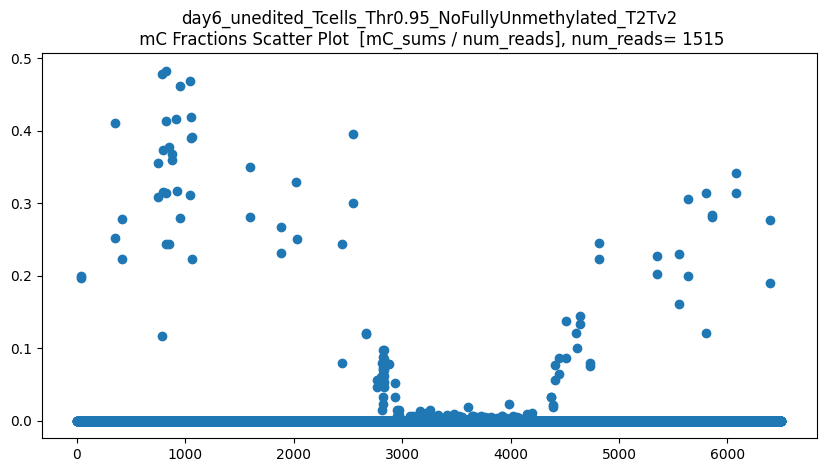

len(CGs_all) = 1515
CGs_all.shape = (1515, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


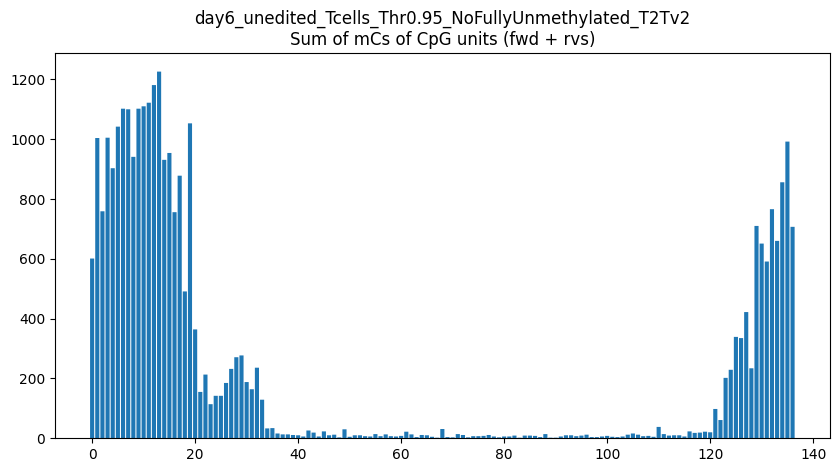

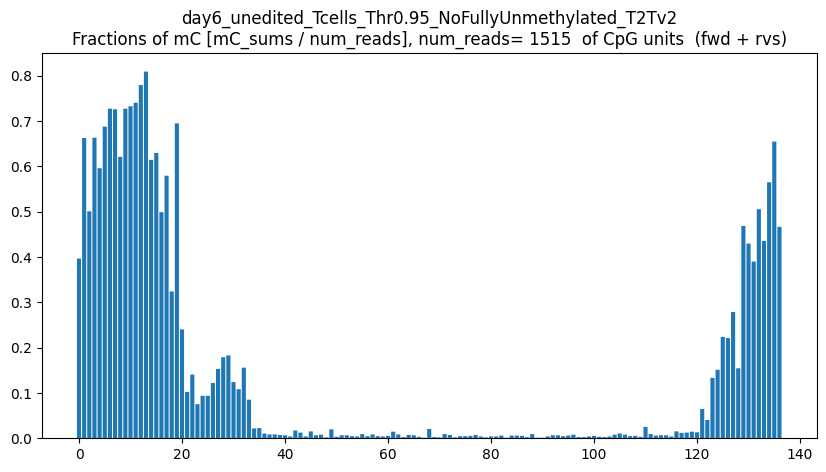

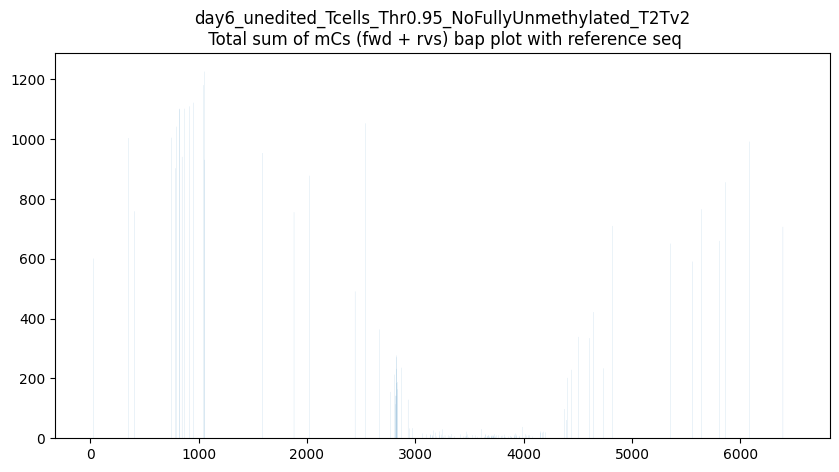

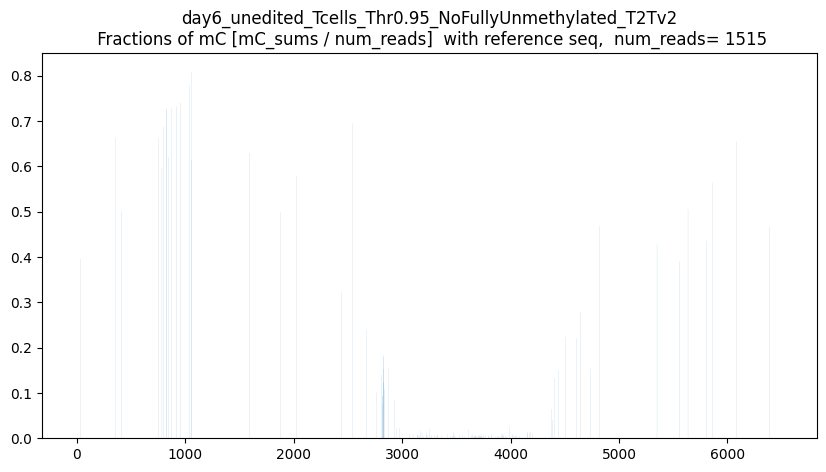

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



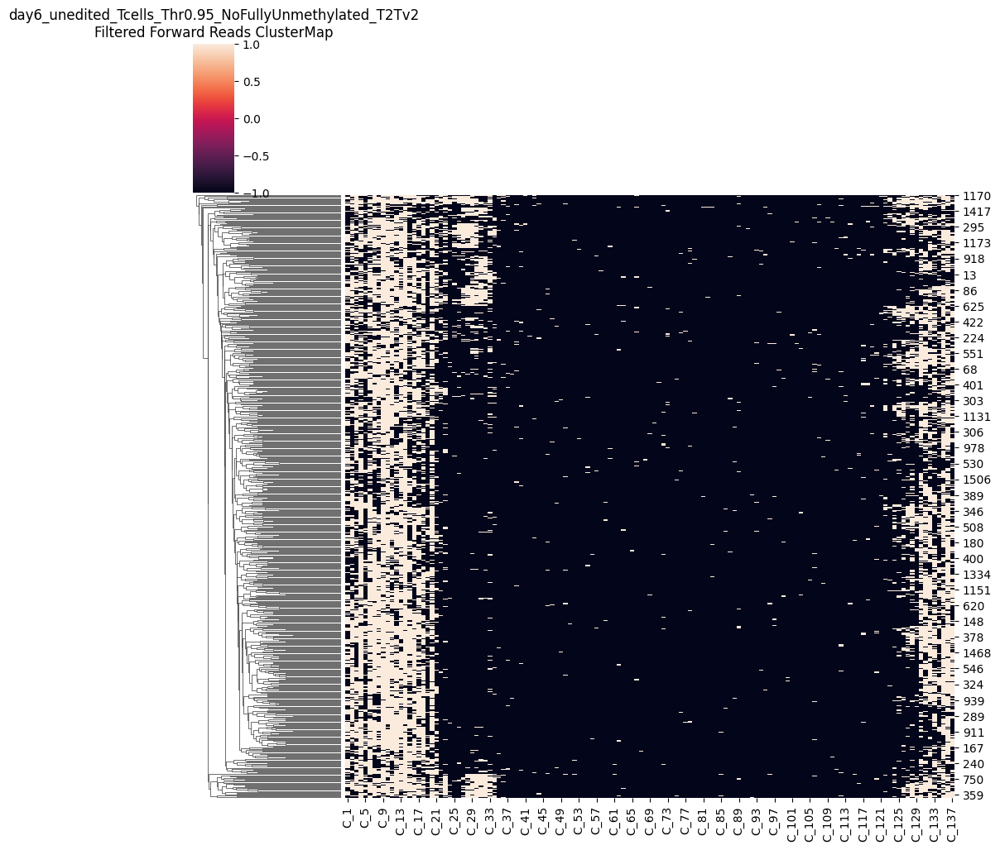

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



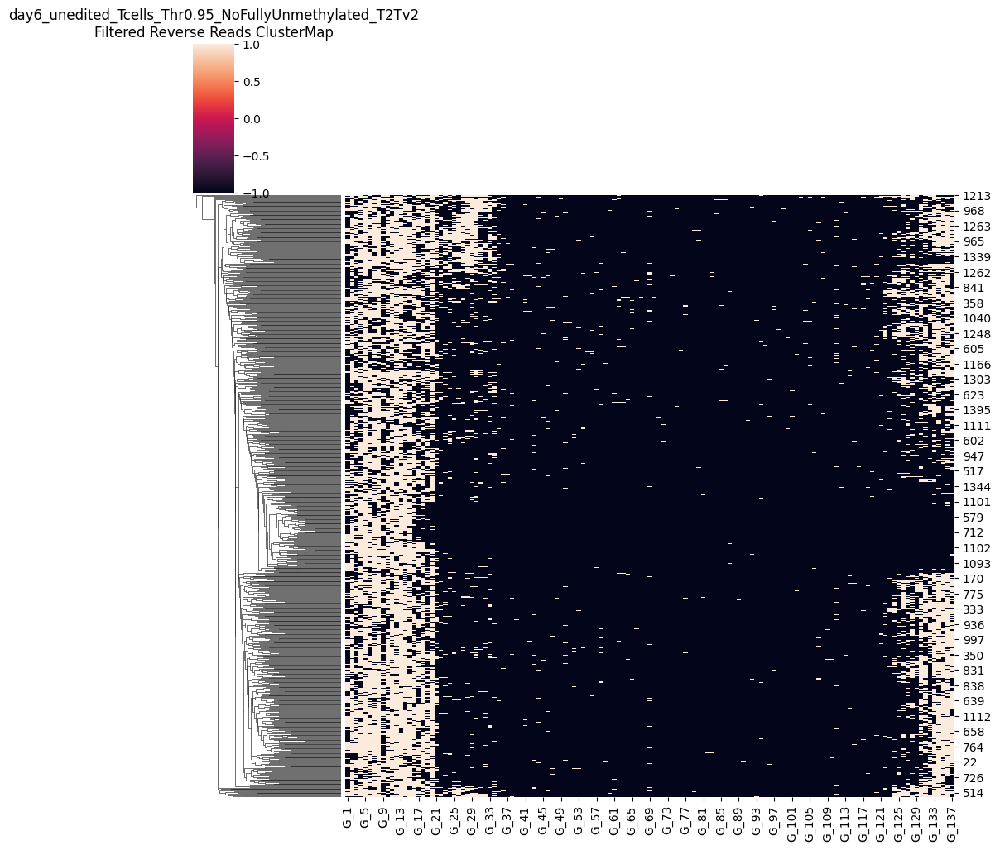

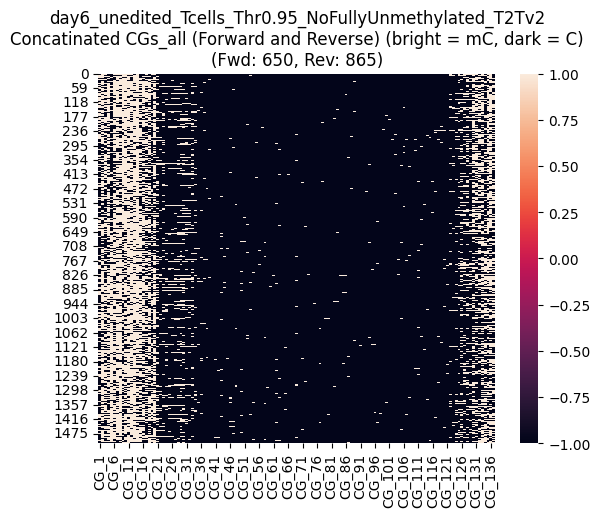

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



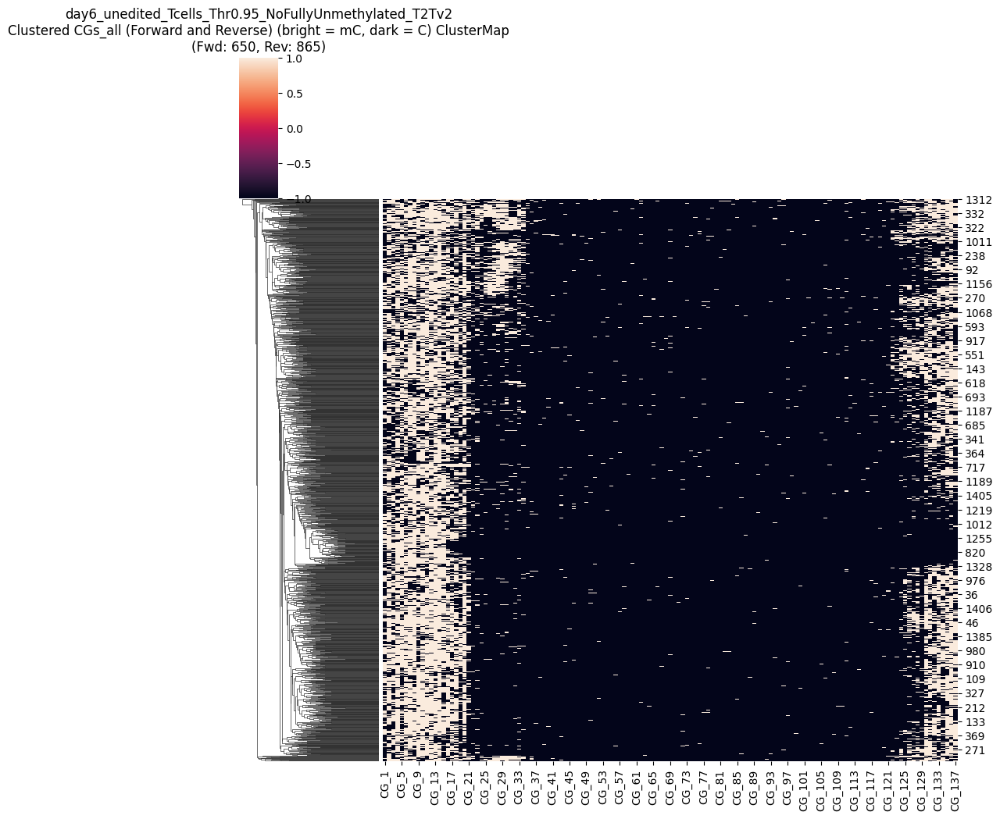

CGs_all saved as CG_137_removed_low50_methylated_padded_reads_day6_unedited_Tcells_Thr0.95_NoFullyUnmethylated_T2Tv2_mCthresh0.95_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD650_numRVS865.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,1.0,1.0,NaN,1.0,NaN,1.0,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN
1,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,NaN,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,1.0,NaN
2,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0
3,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
4,NaN,1.0,1.0,1.0,NaN,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,NaN,NaN,NaN,1.0,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1510,NaN,1.0,1.0,NaN,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN
1511,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
1512,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0
1513,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN


In [65]:
threshold_percent = 50
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np

padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
if padded_reads is not None:
    plot_padded_reads(padded_reads, ref_seq_list)
    save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)


# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")

CGs_all_unedited_mc095_remove_low50 = CGs_all
CGs_all_unedited_mc095_remove_low50


Mean methylated CGs per read: 20.0
Maximum methylated CGs per read: 43.0
Threshold (10% of max): 2.00
Original number of reads: 1592
Number of reads after filtering: 1580
Removed 12 reads


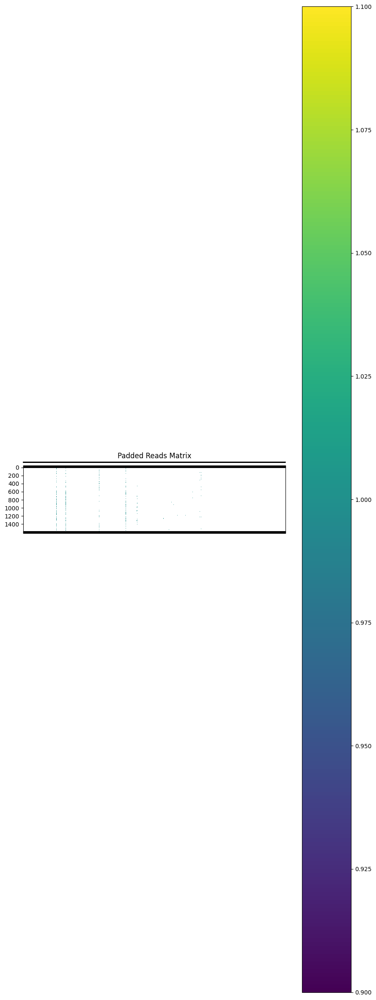

Padded reads saved to removed_low10_methylated_padded_reads_day6_unedited_Tcells_Thr0.95_NoFullyUnmethylated_T2Tv2_mCthresh0.95_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


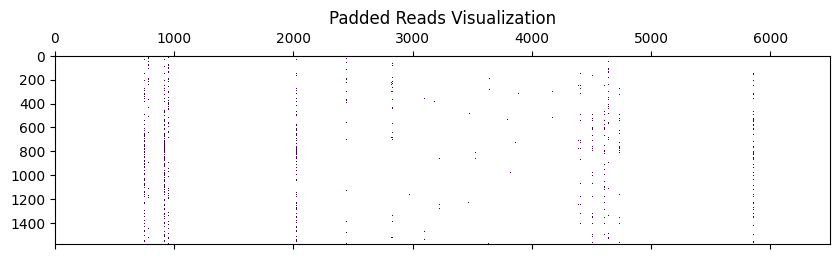

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

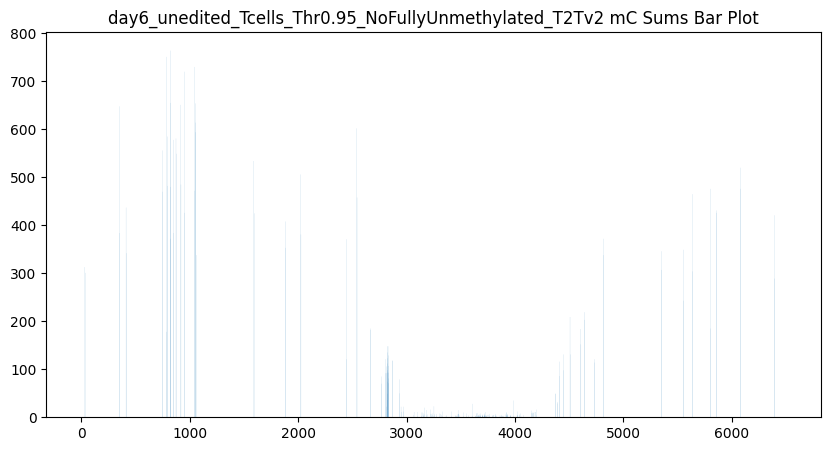

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


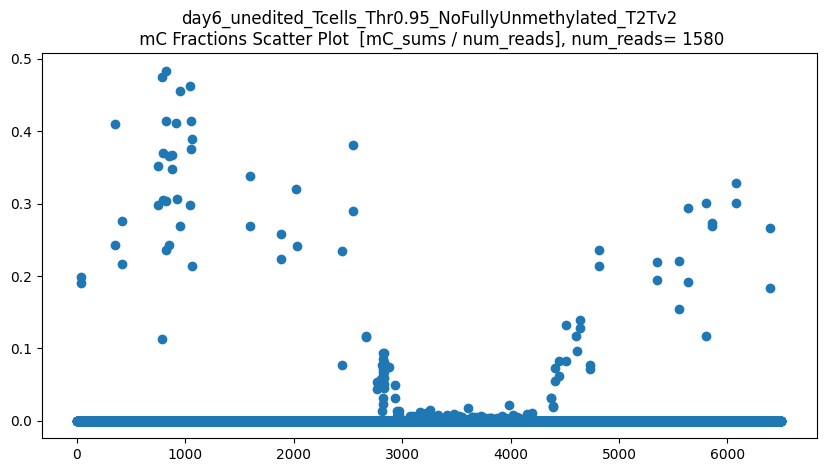

len(CGs_all) = 1580
CGs_all.shape = (1580, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


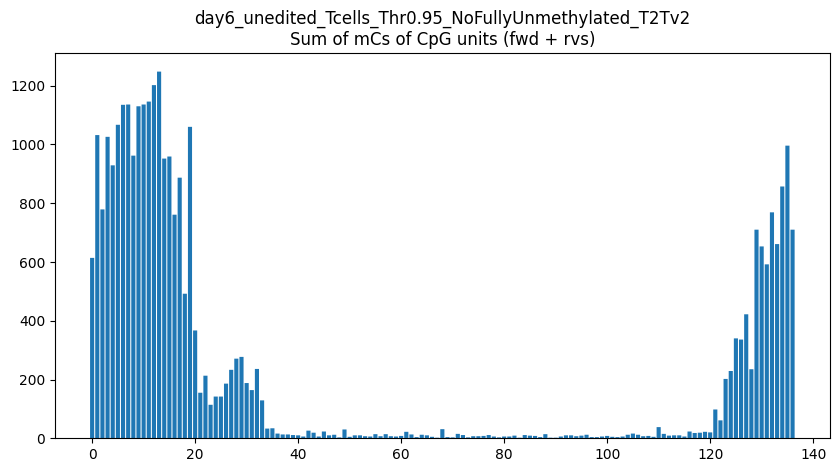

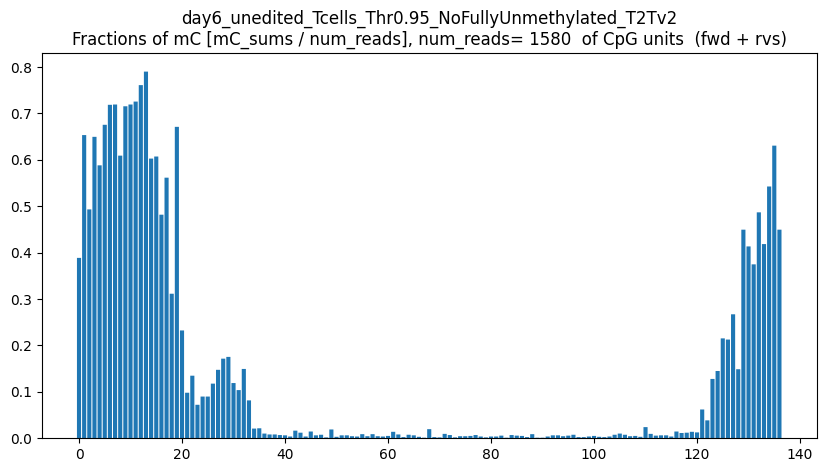

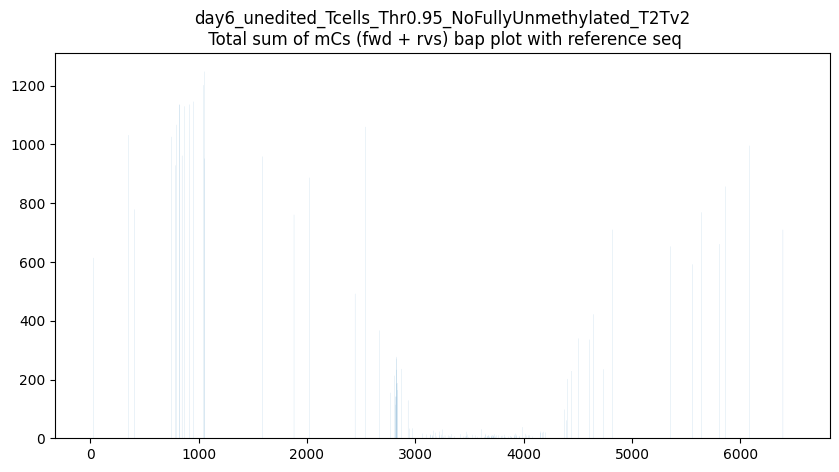

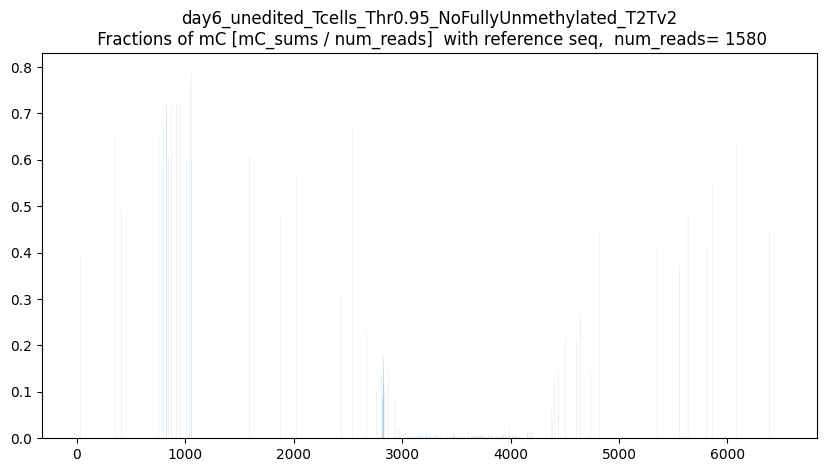

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



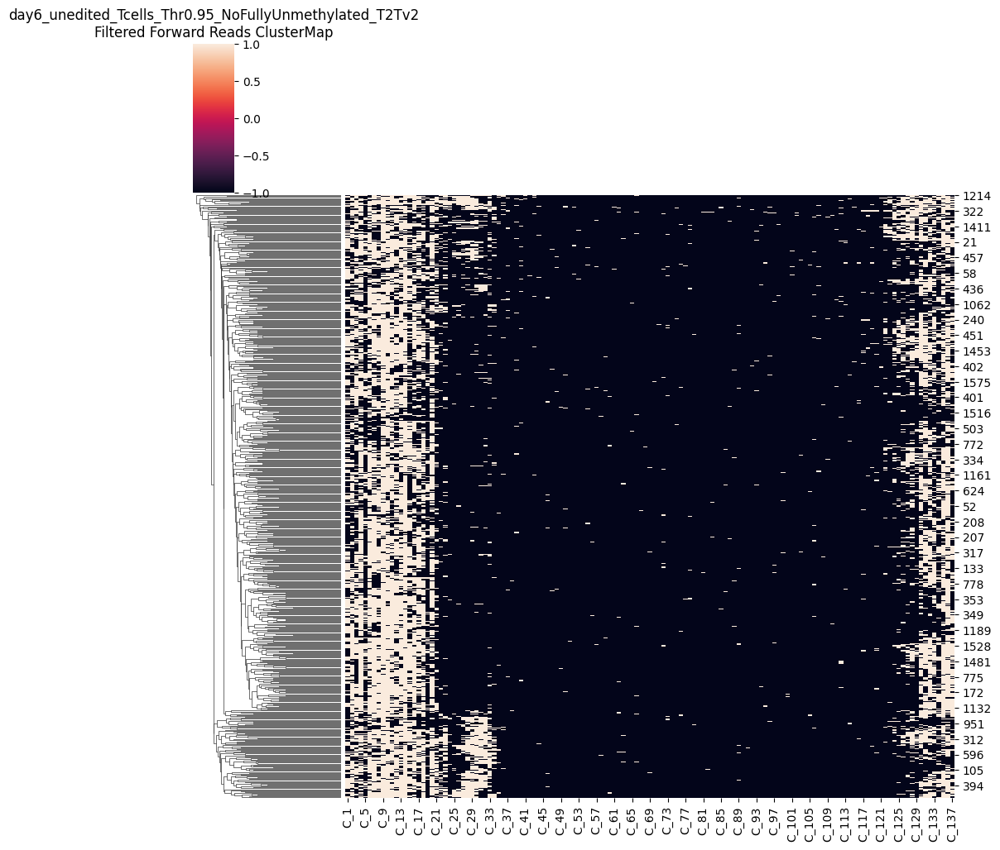

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



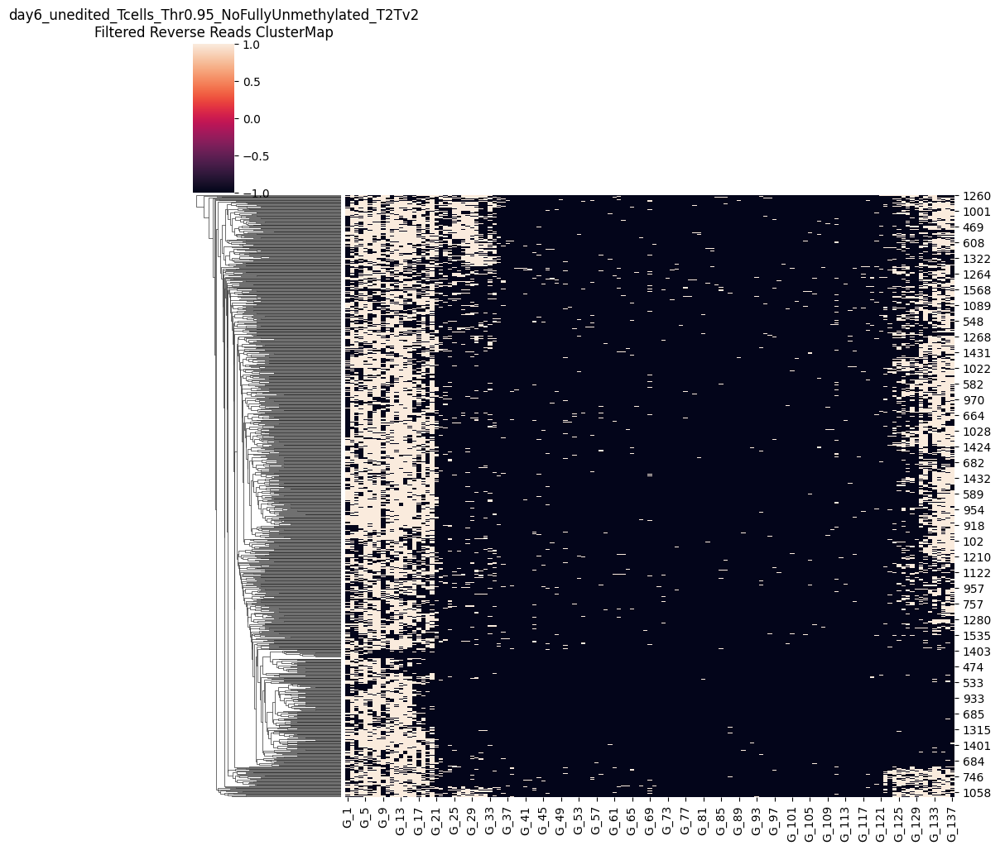

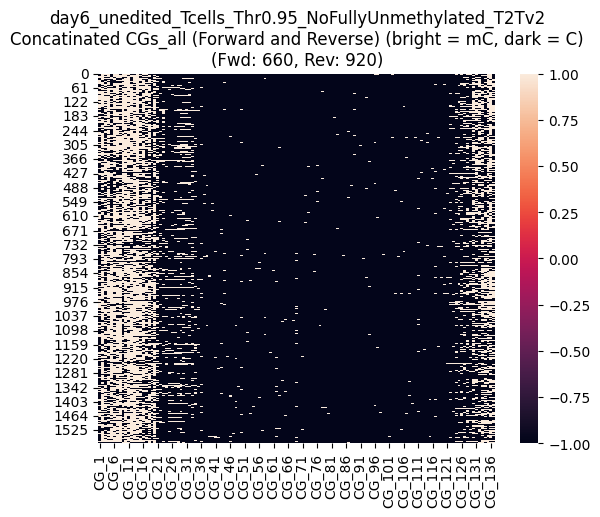

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



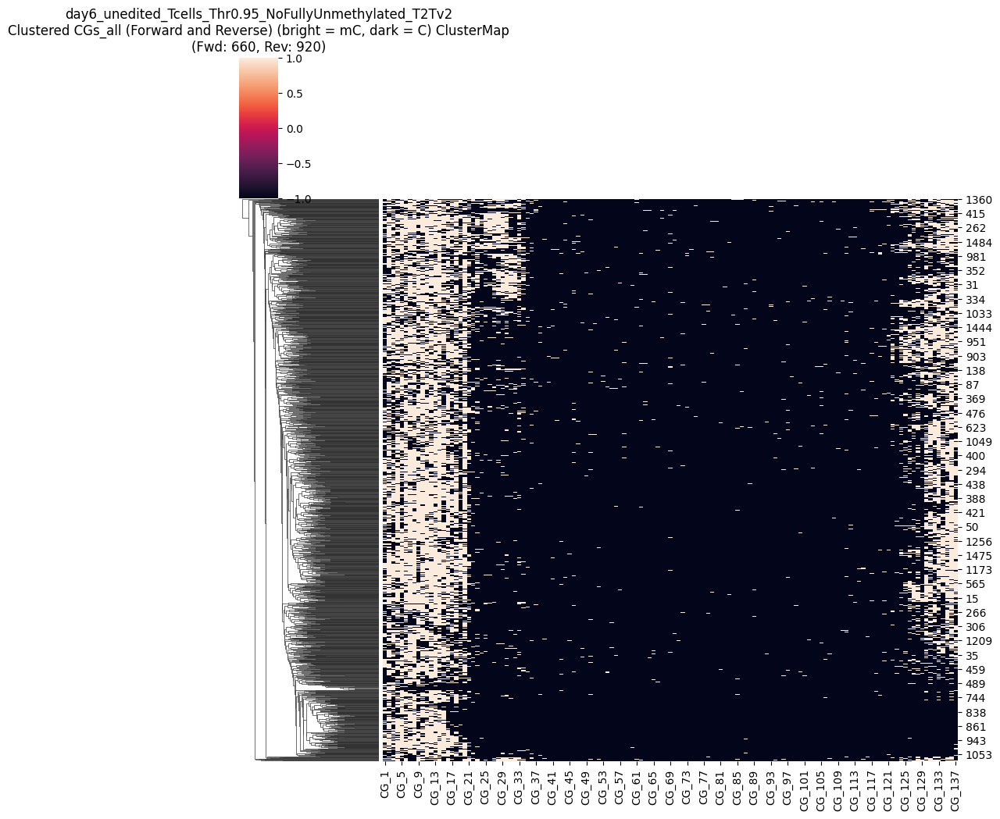

CGs_all saved as CG_137_removed_low10_methylated_padded_reads_day6_unedited_Tcells_Thr0.95_NoFullyUnmethylated_T2Tv2_mCthresh0.95_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD660_numRVS920.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,1.0,1.0,NaN,1.0,NaN,1.0,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN
1,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,NaN,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,1.0,NaN
2,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0
3,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
4,NaN,1.0,1.0,1.0,NaN,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,NaN,NaN,NaN,1.0,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1575,NaN,1.0,1.0,NaN,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN
1576,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,1.0,1.0
1577,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0
1578,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN


In [66]:
threshold_percent = 10
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np

padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
if padded_reads is not None:
    plot_padded_reads(padded_reads, ref_seq_list)
    save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)


# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")

CGs_all_unedited_mc095_remove_low10 = CGs_all
CGs_all_unedited_mc095_remove_low10


# 0.995

In [60]:
! pwd

/home/michalula/code/epiCausality/epiCode/analyze_ont_data/T2T_v2.0_mapped/T_cells/day_6


In [59]:
unedit_bam_path

'/home/michalula/data/cas9_nanopore/data/20241226_MR_nCATs_TcellsPrES_unedit_P2R9/passed_fast5/5mCG/to_t2t_v2_0/sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.dna_r9.4.1_e8_sup@v3.3.5mCG.bam'

experiment_name =  day6_unedited_Tcells_Thr0.995_NoFullyUnmethylated_T2Tv2
Region length: 6500
No specified number of cores requested. 24 available on machine, allocating all.
Modification threshold of 0.995 will be treated as coming from range 0-1.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 3539 from reads.CG,0.txt into reads.combined_basemods.h5, new size 3539   0% | 00:00<…

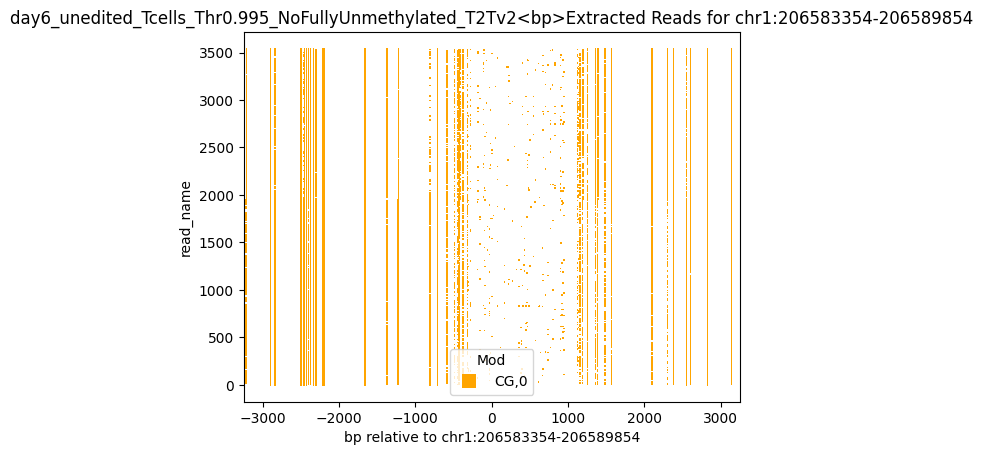

Found read coordinates: 3539 reads
Unique read names with methylation: 3484
Found 1601 reads with full coverage
Reads with methylation data: 3484
Overlap between full coverage and methylation: 1582
After full coverage filtering: 21042 reads with methylation data
Final result: 21042 reads with methylation information out of 3539 total reads


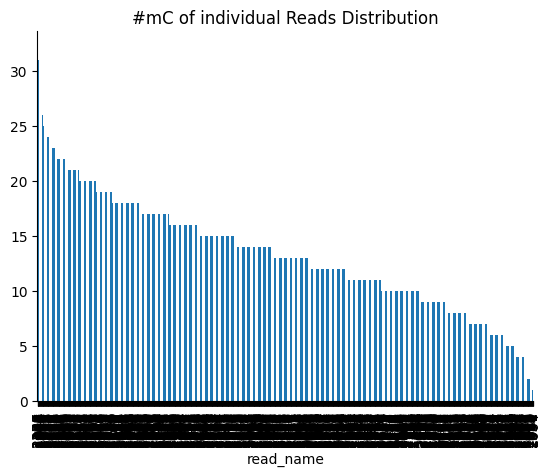

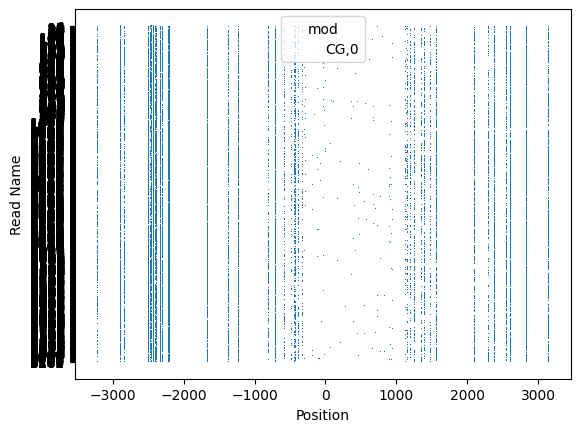

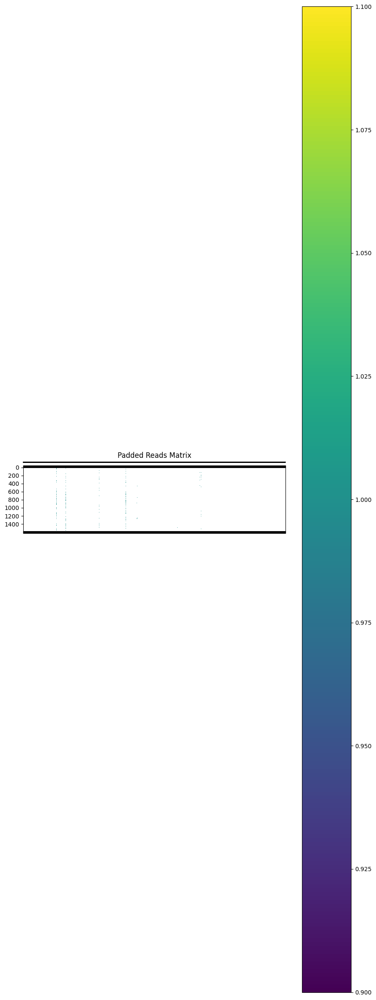

Padded reads saved to padded_reads_day6_unedited_Tcells_Thr0.995_NoFullyUnmethylated_T2Tv2_mCthresh0.995_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


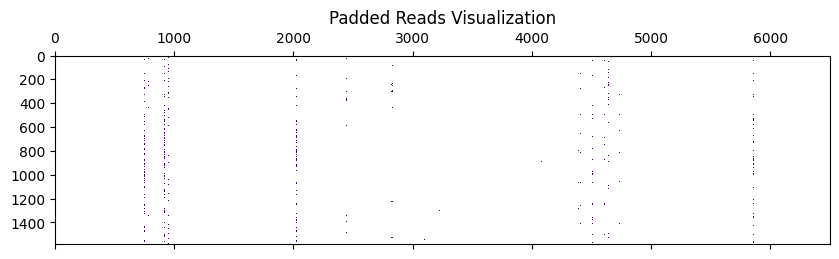

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

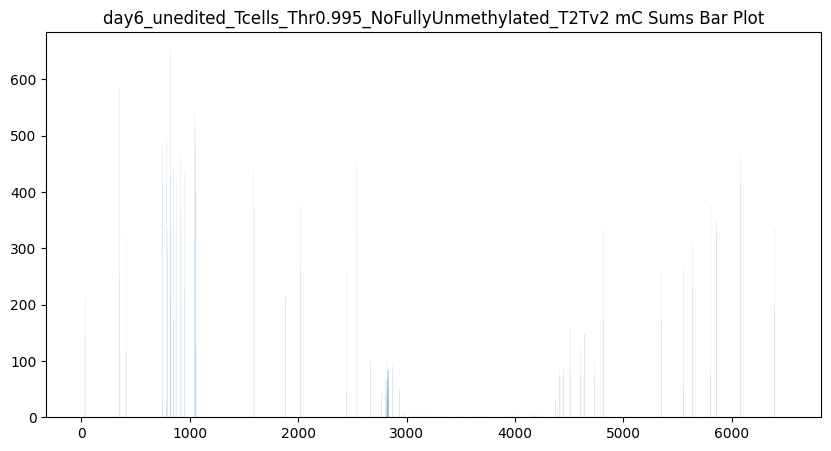

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


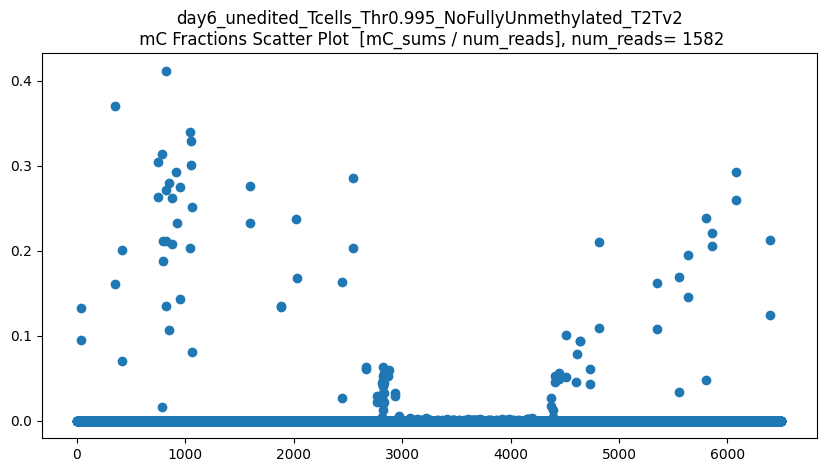

len(CGs_all) = 1582
CGs_all.shape = (1582, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


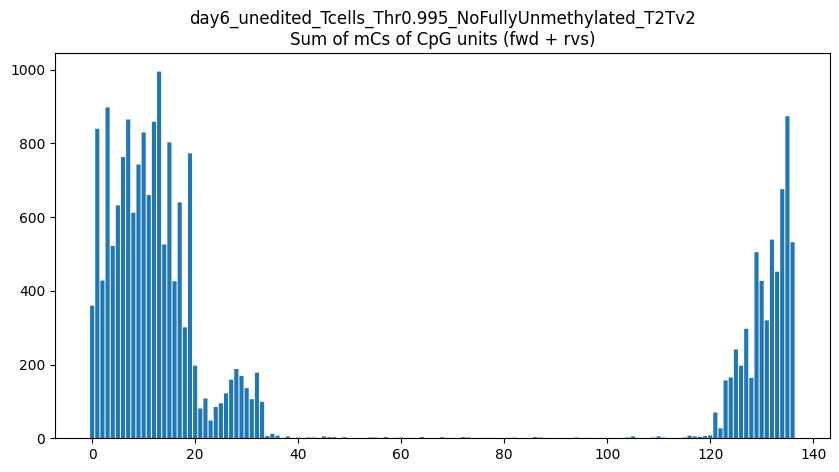

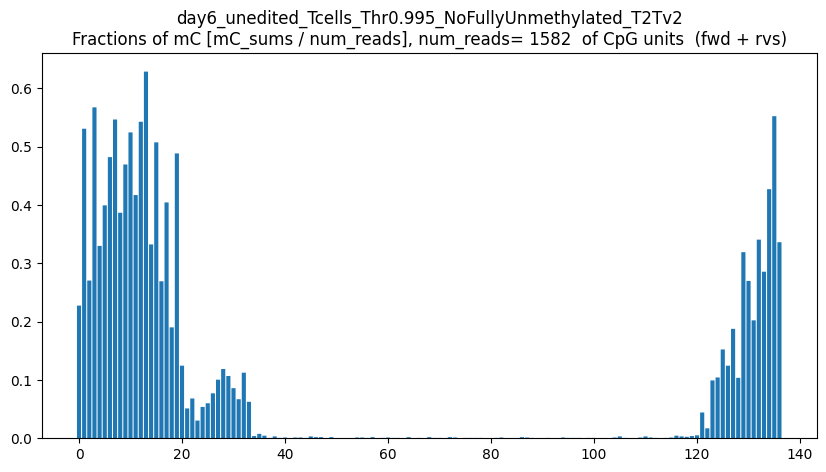

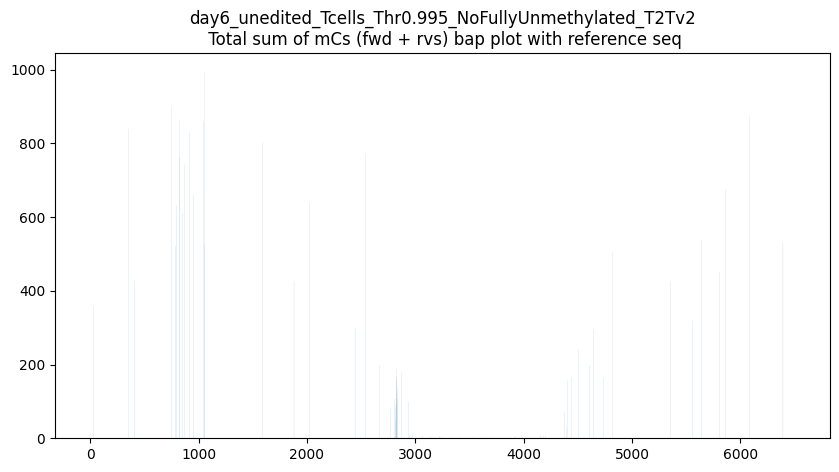

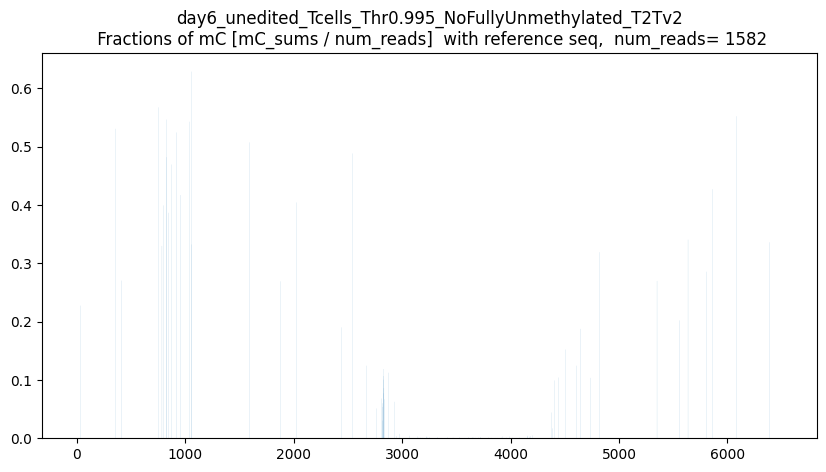

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



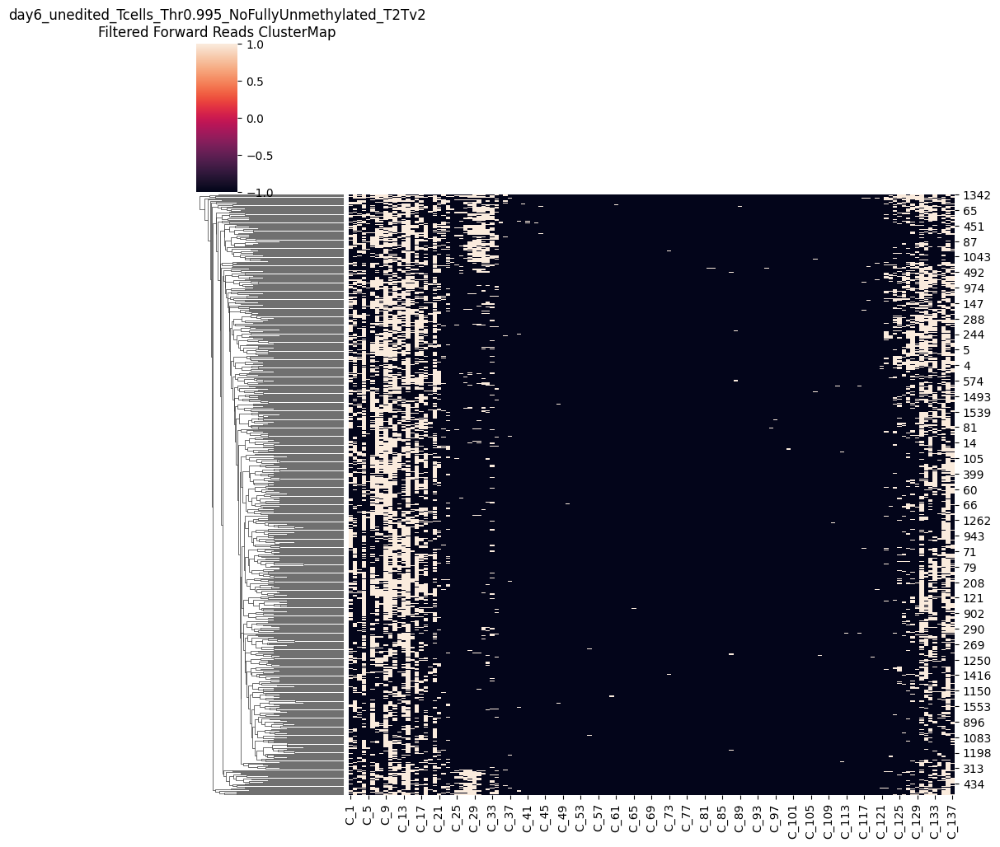

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



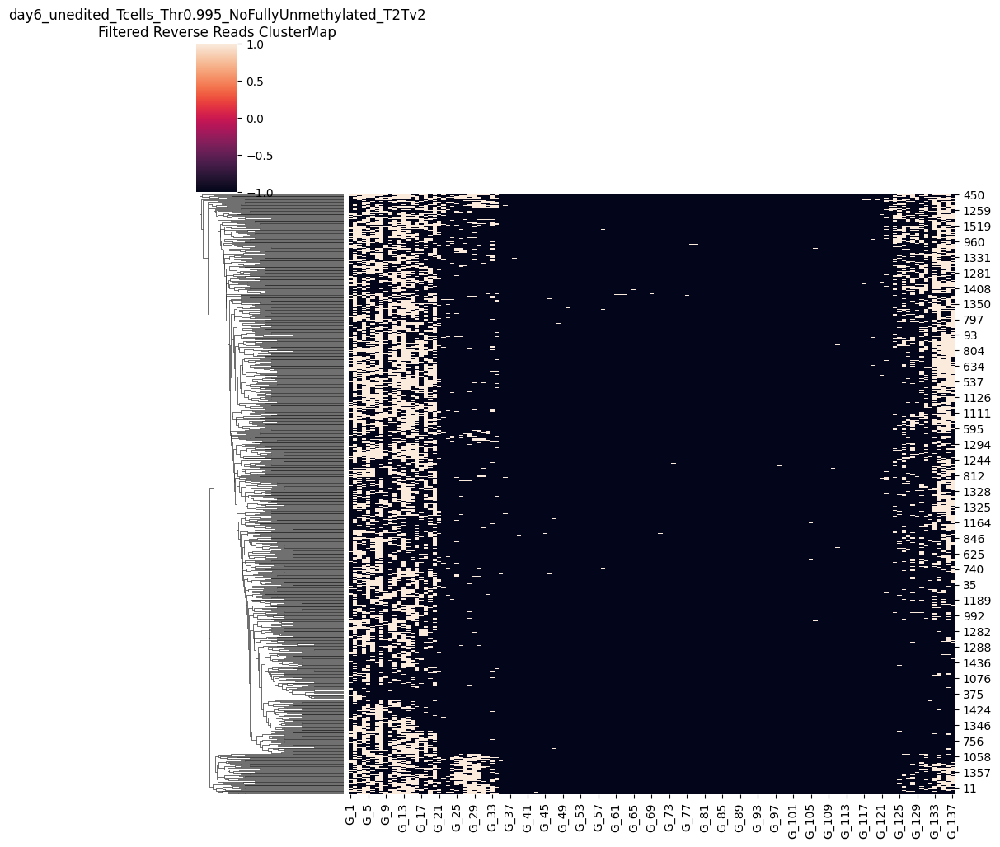

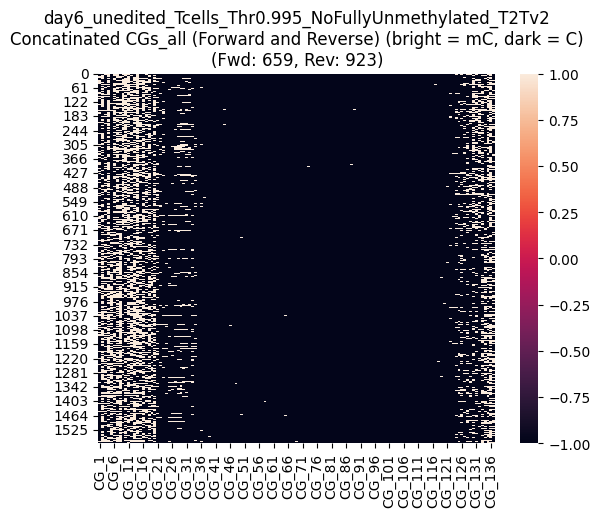

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



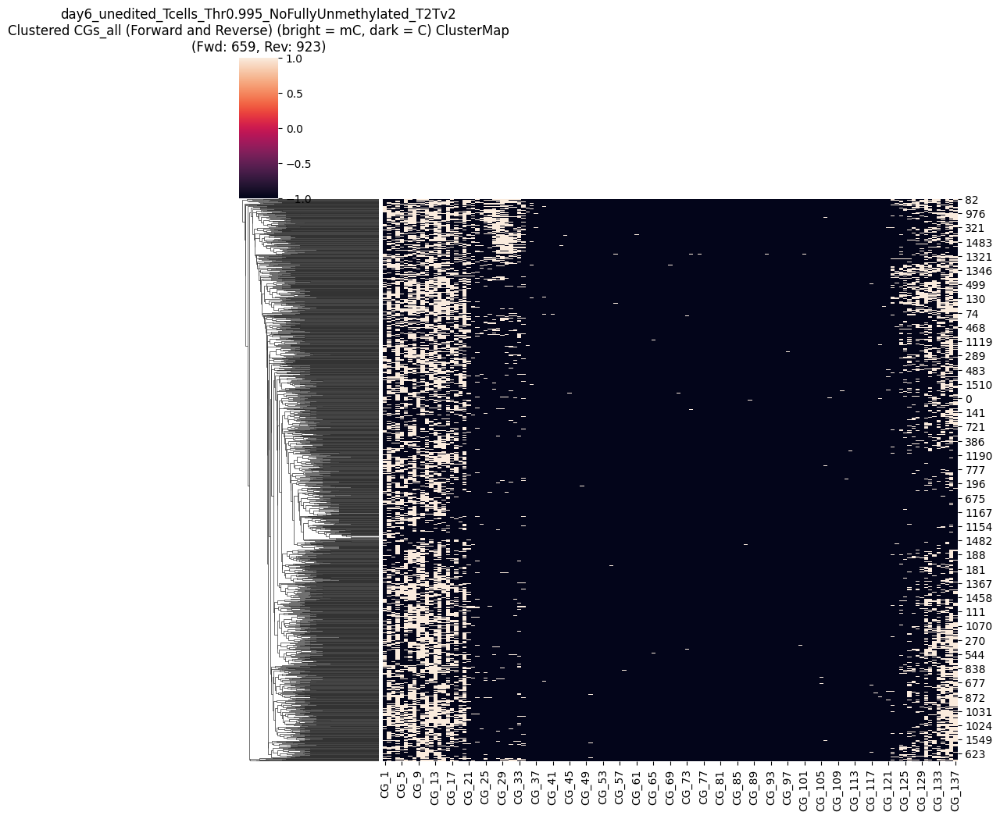

CGs_all saved as CG_137_padded_reads_day6_unedited_Tcells_Thr0.995_NoFullyUnmethylated_T2Tv2_mCthresh0.995_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD659_numRVS923.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


In [17]:


threshold_mC =  0.995 # 0.7 #  0.9 #0.99
experiment_name = "day6_unedited_Tcells_Thr"+str(threshold_mC)+"_NoFullyUnmethylated_T2Tv2"
bam_path = unedit_bam_path

print('experiment_name = ', experiment_name)

save_padded_reads_name_np = f"padded_reads_{experiment_name}_mCthresh{threshold_mC}_{reg_genome_version}_{region_str}_{date_today}.npy"
output_dir = create_output_directory("./dimelo_v2_output")

extract_file, extract_regions = extract_from_bam(
    experiment_name = experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
keep_full_coverage_reads_only=True

if extract_file:
    reads_df, regions_dict = process_extracted_reads(extract_file, region_str, motifs, ref_seq_list, 
    keep_full_coverage_reads_only=keep_full_coverage_reads_only)
    visualize_data(reads_df)

    padded_reads = create_padded_reads(reads_df, regions_dict, region_length)
    if padded_reads is not None:
        plot_padded_reads(padded_reads, ref_seq_list)
        save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np)

# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")


In [19]:
CGs_all_unedited_mc0995_original = CGs_all
CGs_all_unedited_mc0995_original

,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,1.0,NaN,NaN,1.0,NaN,1.0,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN,NaN
1,NaN,1.0,1.0,1.0,NaN,NaN,1.0,NaN,NaN,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
2,NaN,1.0,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,NaN,1.0,1.0,1.0,1.0,NaN
3,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
4,NaN,NaN,1.0,1.0,NaN,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,NaN,NaN,NaN,1.0,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1577,NaN,1.0,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN
1578,NaN,NaN,1.0,NaN,1.0,NaN,1.0,1.0,NaN,1.0,...,NaN,NaN,1.0,NaN,NaN,NaN,1.0,1.0,1.0,1.0
1579,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0
1580,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN


Mean methylated CGs per read: 13.0
Maximum methylated CGs per read: 32.0
Threshold (80% of max): 10.40
Original number of reads: 1582
Number of reads after filtering: 1097
Removed 485 reads


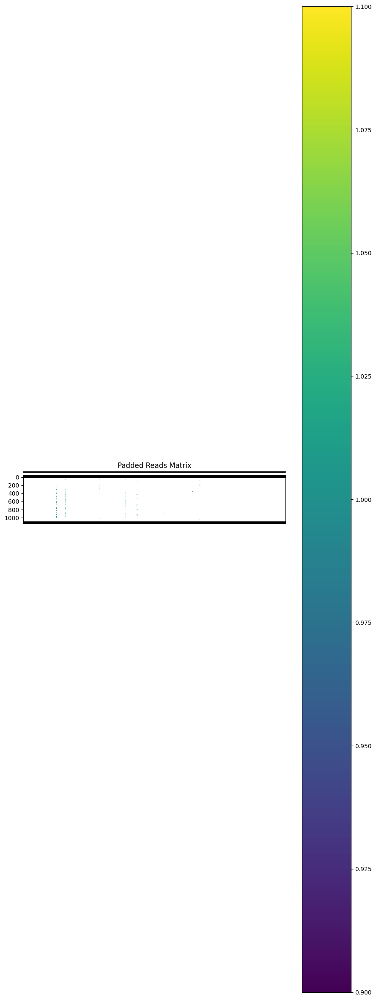

Padded reads saved to removed_low80_methylated_padded_reads_day6_unedited_Tcells_Thr0.995_NoFullyUnmethylated_T2Tv2_mCthresh0.995_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


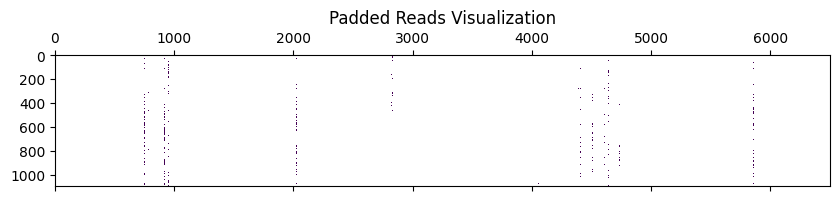

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

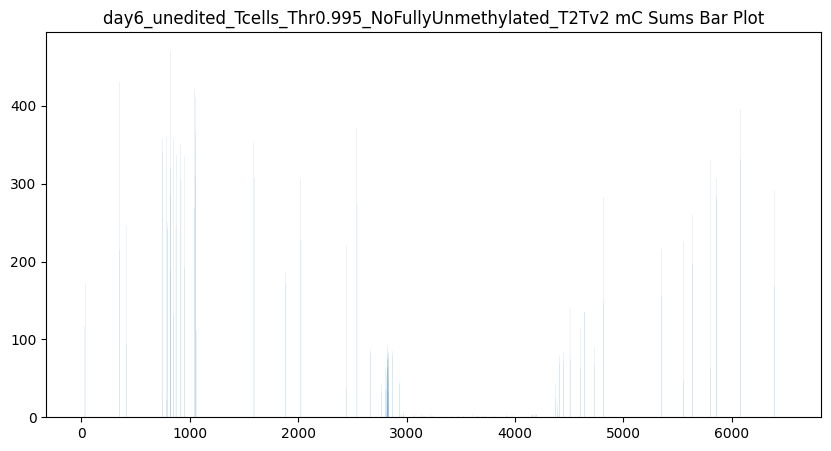

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


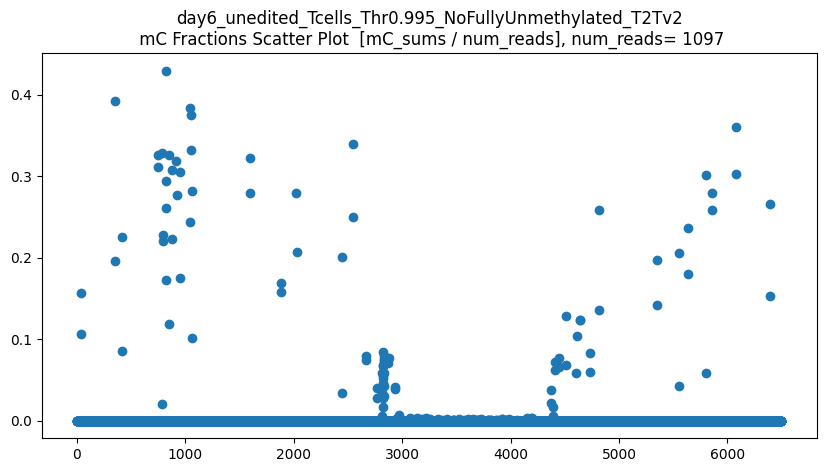

len(CGs_all) = 1097
CGs_all.shape = (1097, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


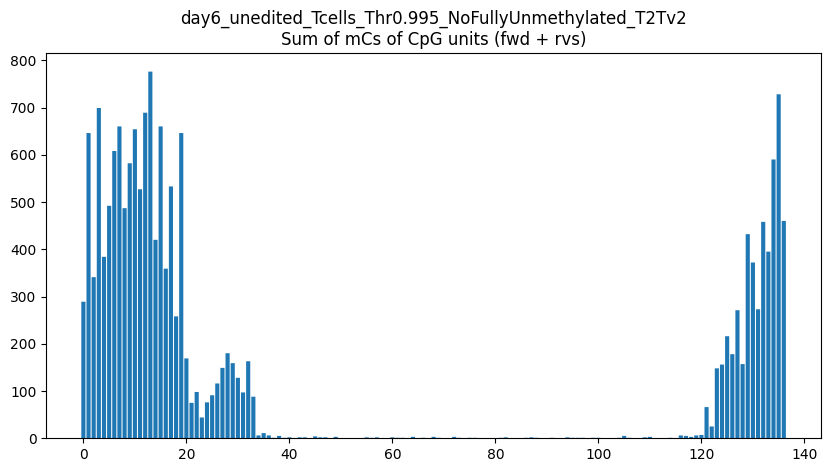

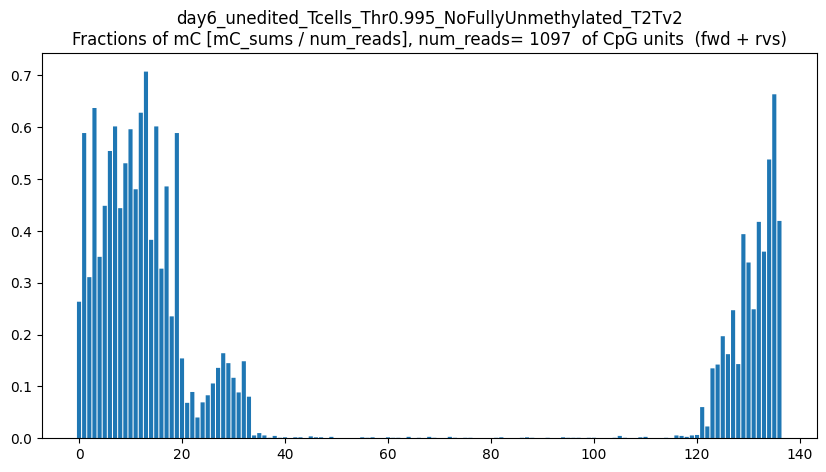

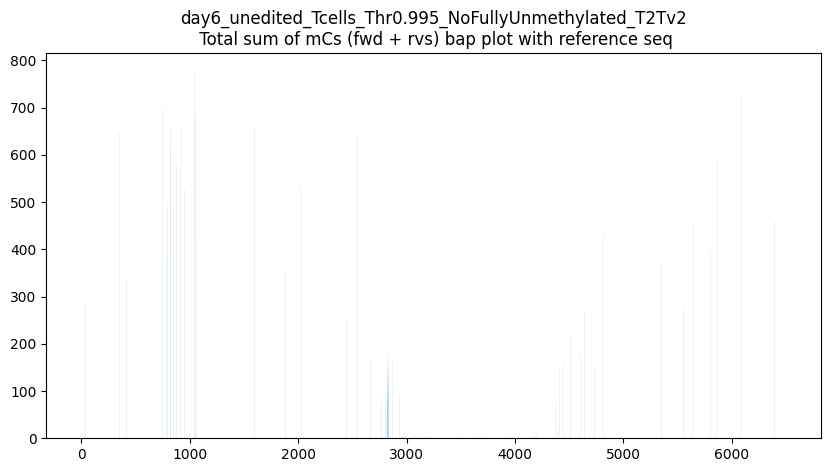

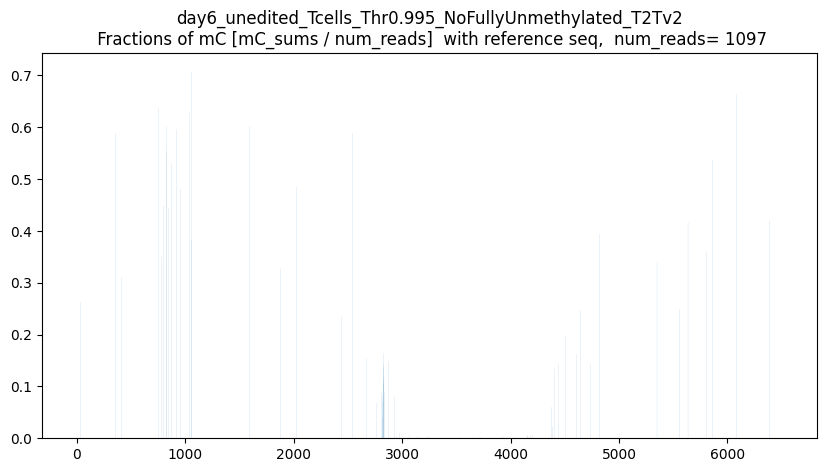

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



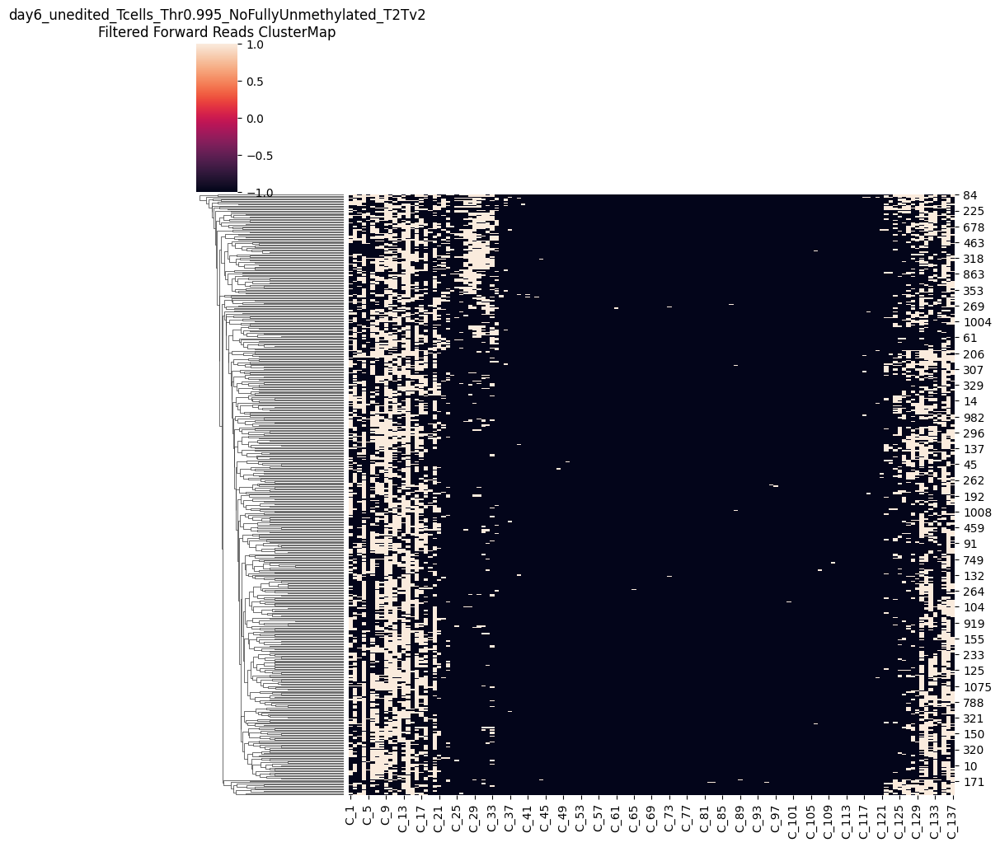

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



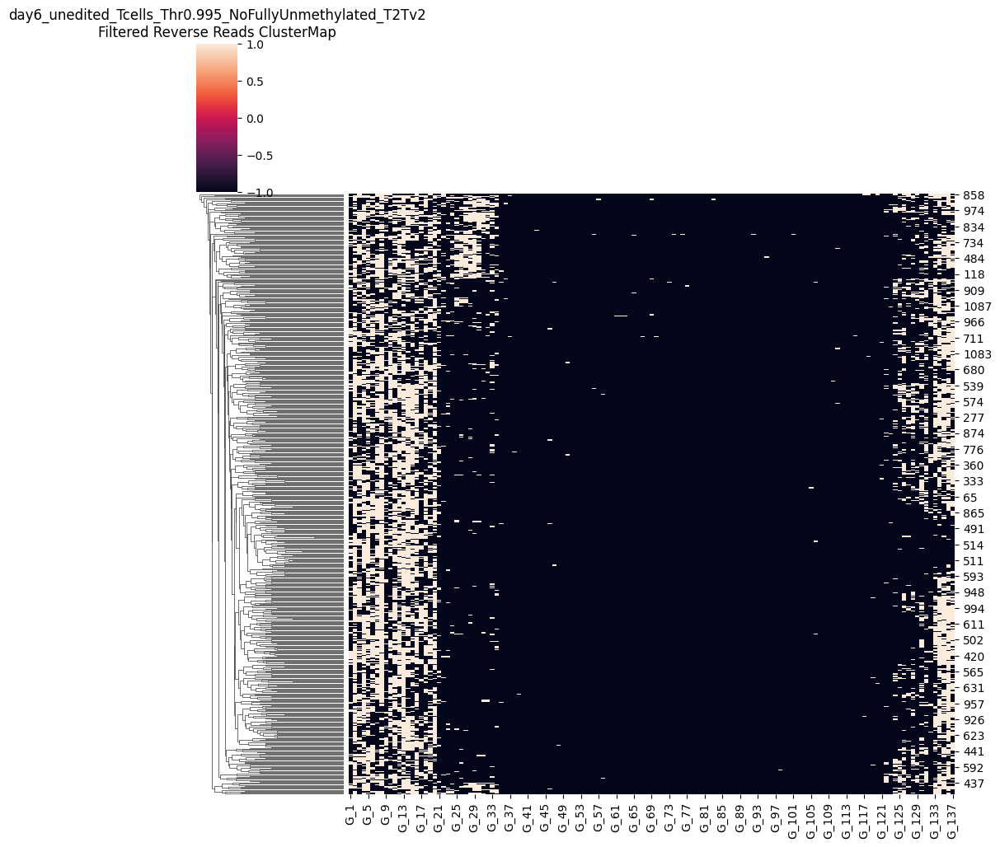

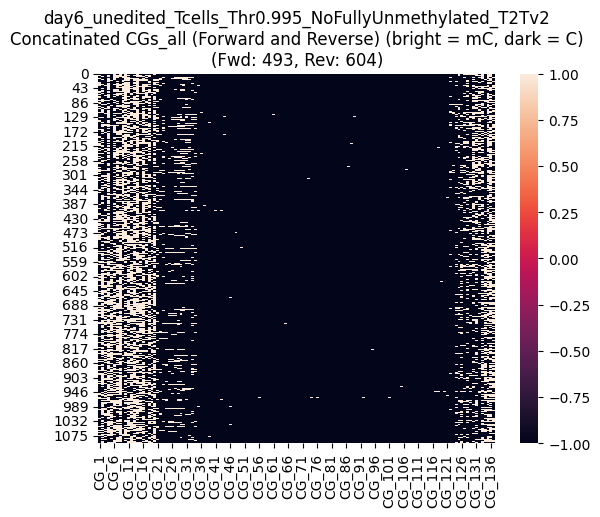

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



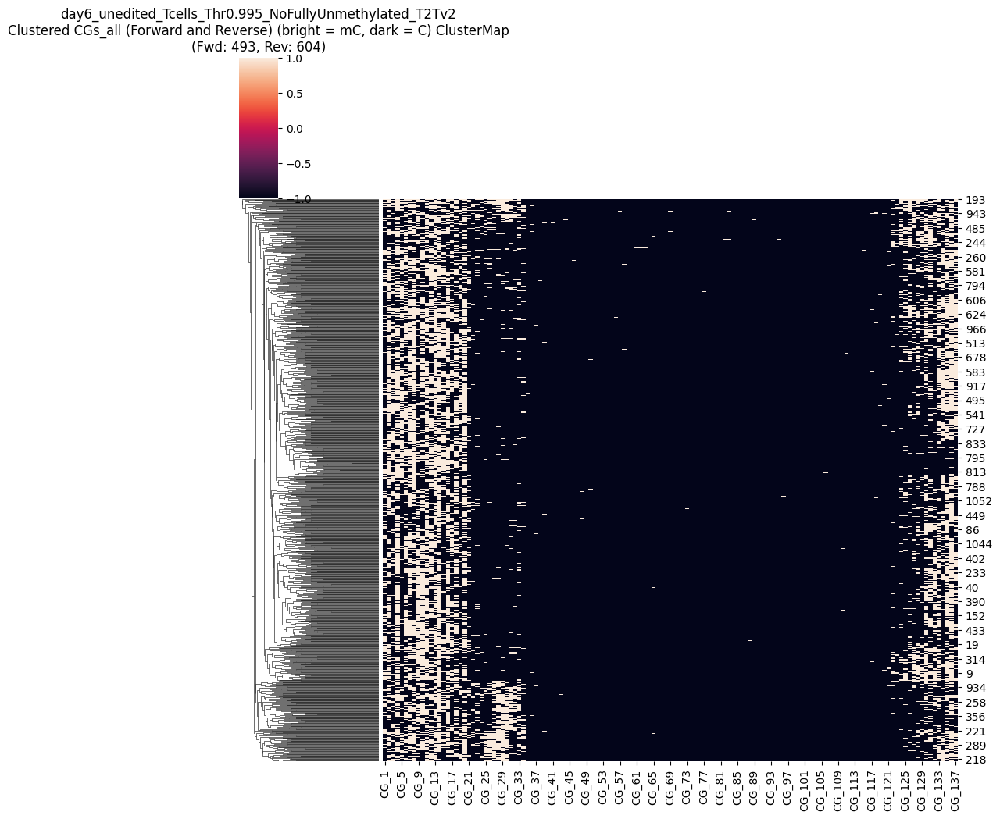

CGs_all saved as CG_137_removed_low80_methylated_padded_reads_day6_unedited_Tcells_Thr0.995_NoFullyUnmethylated_T2Tv2_mCthresh0.995_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD493_numRVS604.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,NaN,1.0,1.0,1.0,NaN,NaN,1.0,NaN,NaN,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
1,NaN,1.0,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,NaN,1.0,1.0,1.0,1.0,NaN
2,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
3,NaN,NaN,1.0,1.0,NaN,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,NaN,NaN,NaN,1.0,1.0,NaN
4,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,...,1.0,1.0,1.0,NaN,1.0,1.0,NaN,1.0,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1092,NaN,1.0,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN,...,NaN,NaN,1.0,NaN,NaN,1.0,1.0,1.0,1.0,1.0
1093,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,NaN
1094,1.0,1.0,1.0,1.0,1.0,NaN,1.0,1.0,NaN,NaN,...,1.0,1.0,NaN,1.0,NaN,1.0,NaN,1.0,NaN,NaN
1095,NaN,1.0,NaN,1.0,1.0,1.0,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN


In [20]:
threshold_percent = 80
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np

padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
if padded_reads is not None:
    plot_padded_reads(padded_reads, ref_seq_list)
    save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)


# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")

CGs_all_unedited_mc0995_remove_low80 = CGs_all
CGs_all_unedited_mc0995_remove_low80


Mean methylated CGs per read: 13.0
Maximum methylated CGs per read: 32.0
Threshold (50% of max): 6.50
Original number of reads: 1582
Number of reads after filtering: 1441
Removed 141 reads


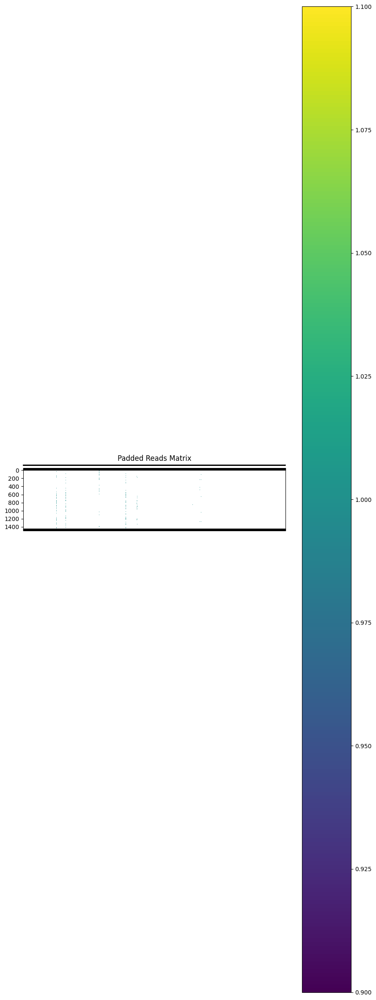

Padded reads saved to removed_low50_methylated_padded_reads_day6_unedited_Tcells_Thr0.995_NoFullyUnmethylated_T2Tv2_mCthresh0.995_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


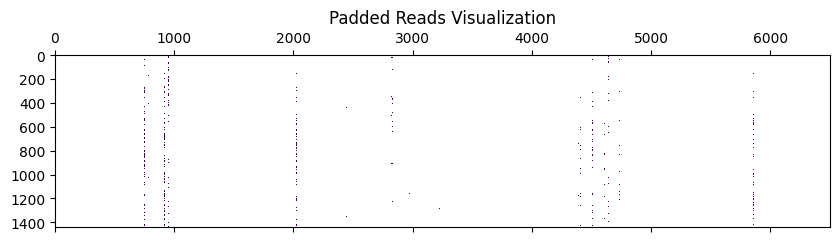

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

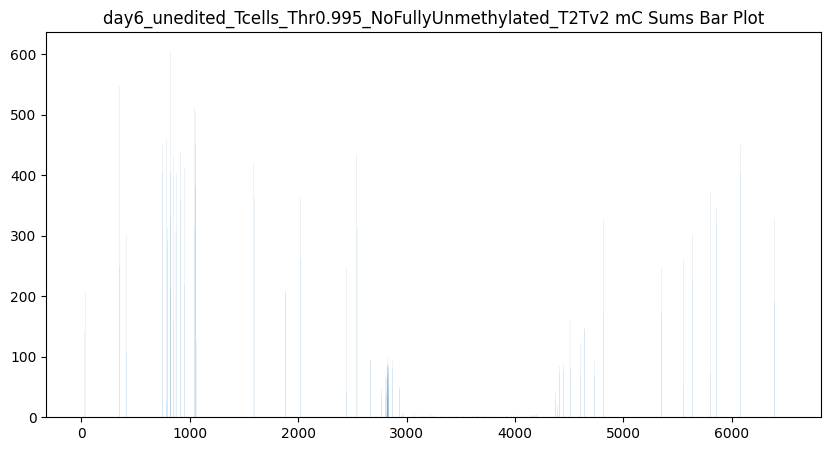

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


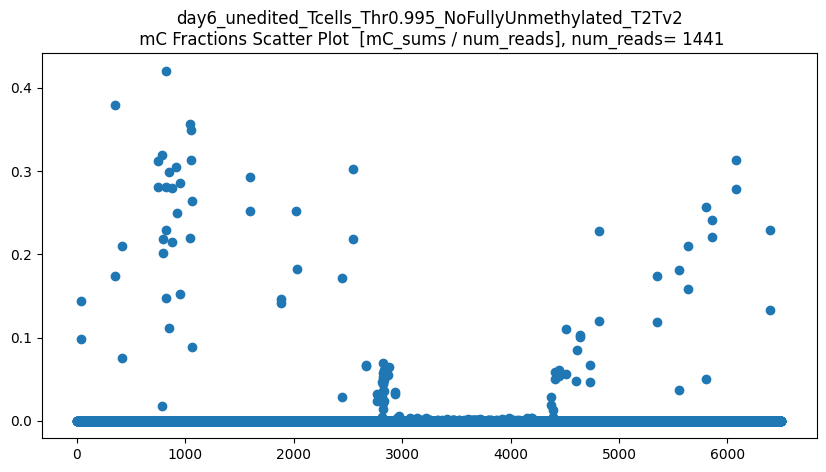

len(CGs_all) = 1441
CGs_all.shape = (1441, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


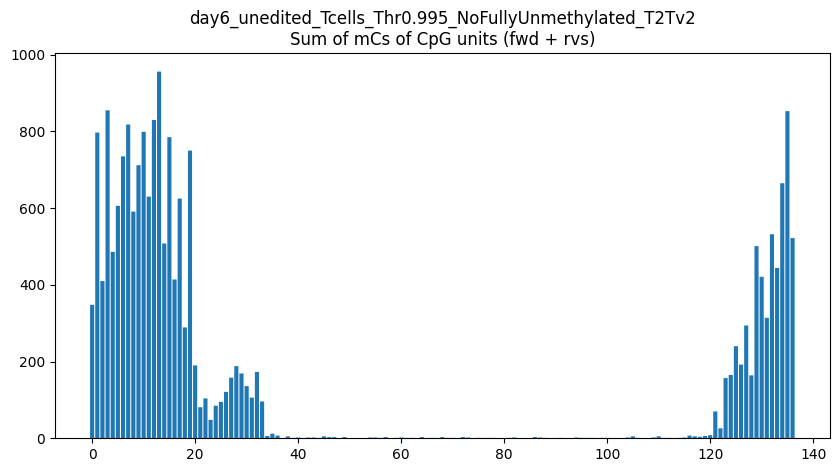

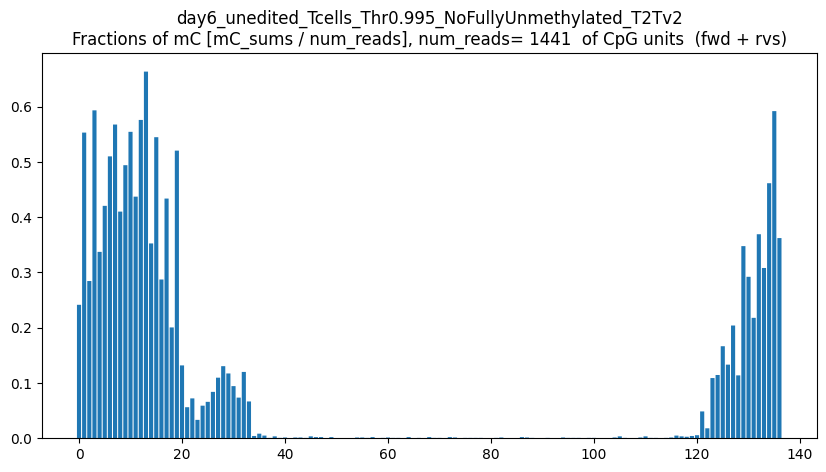

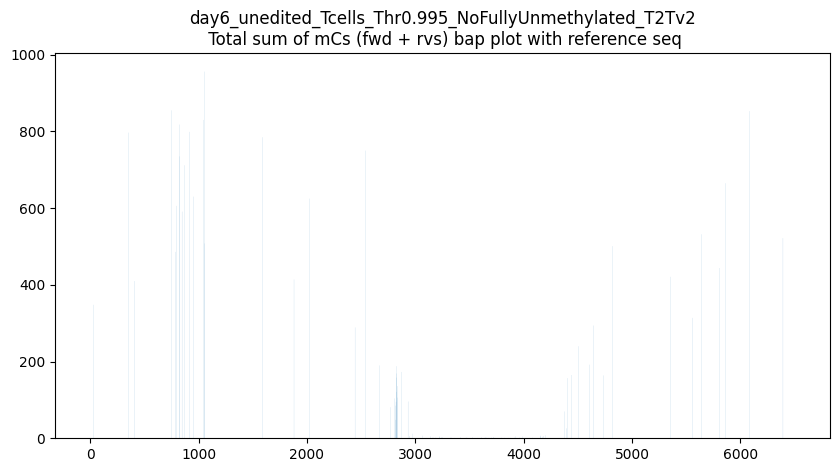

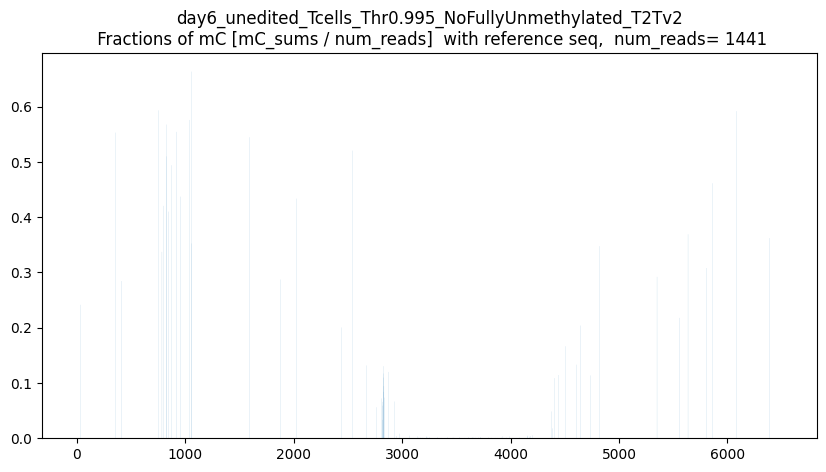

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



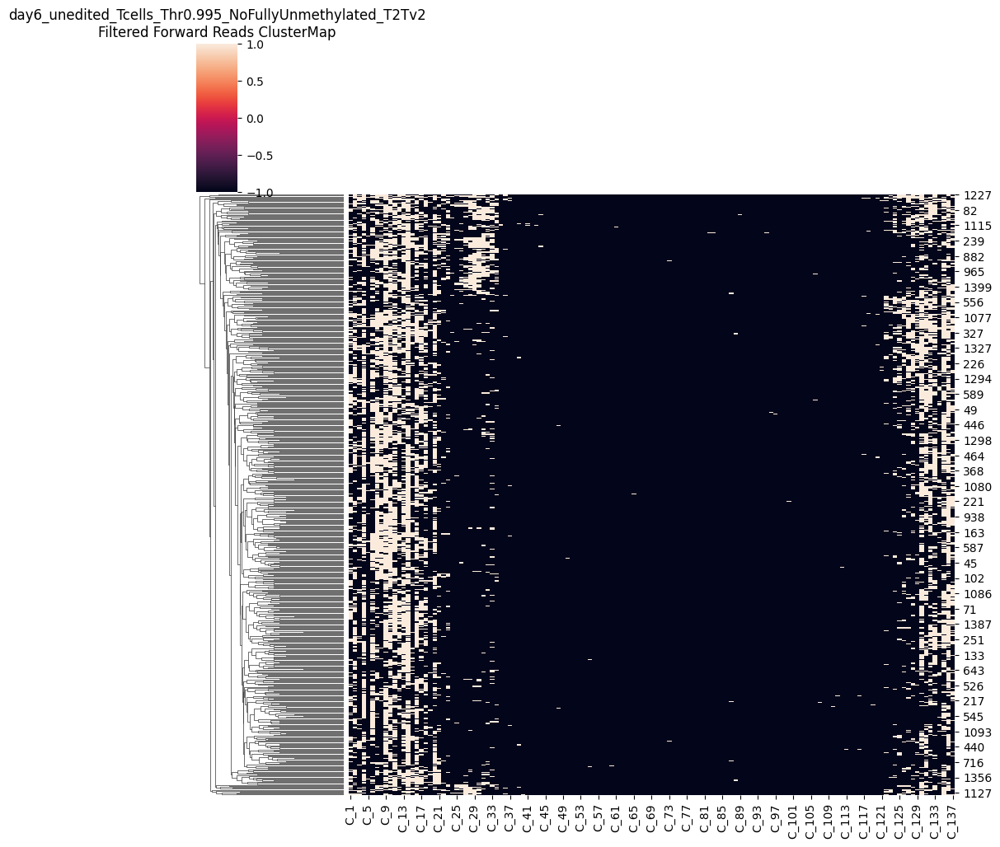

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



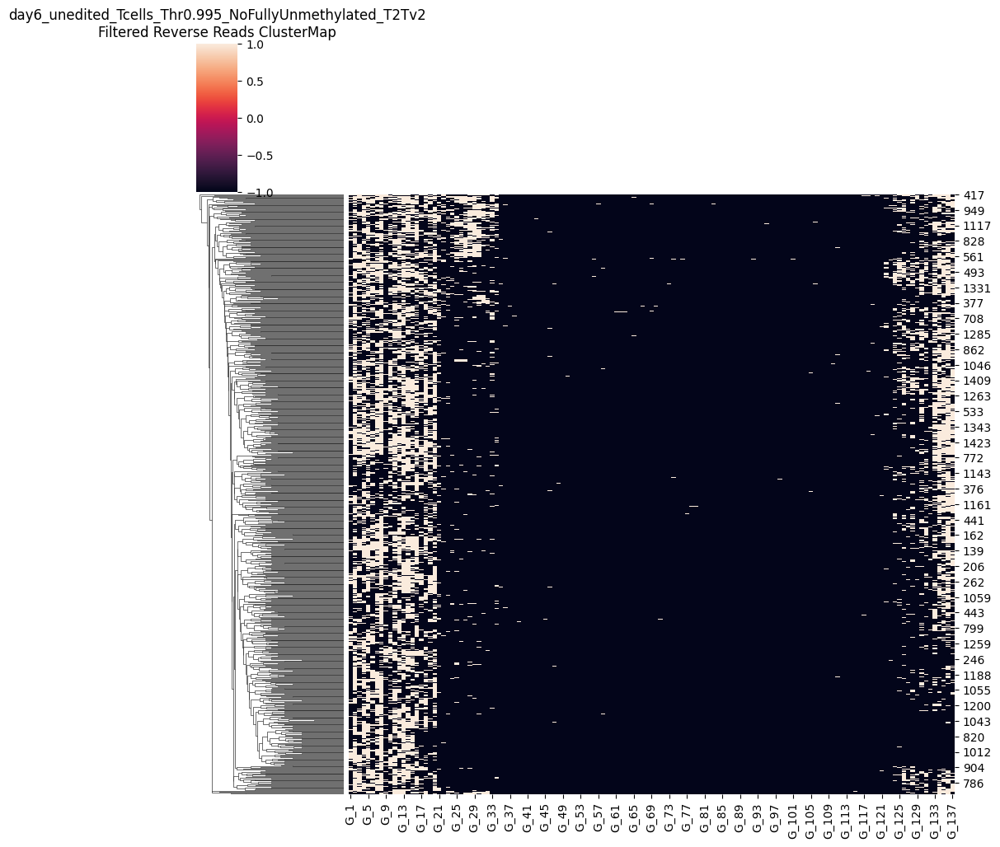

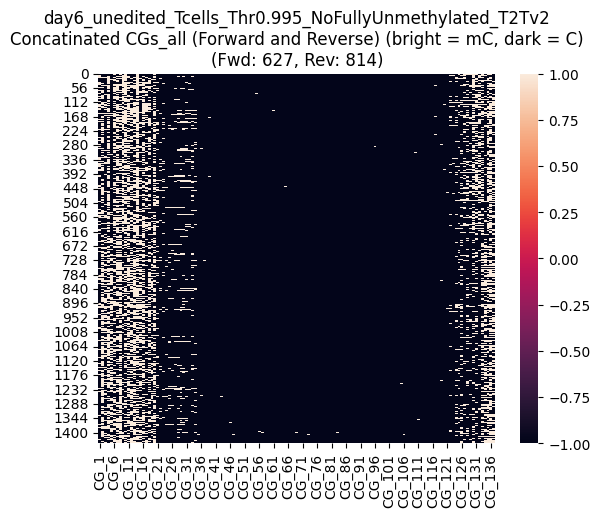

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



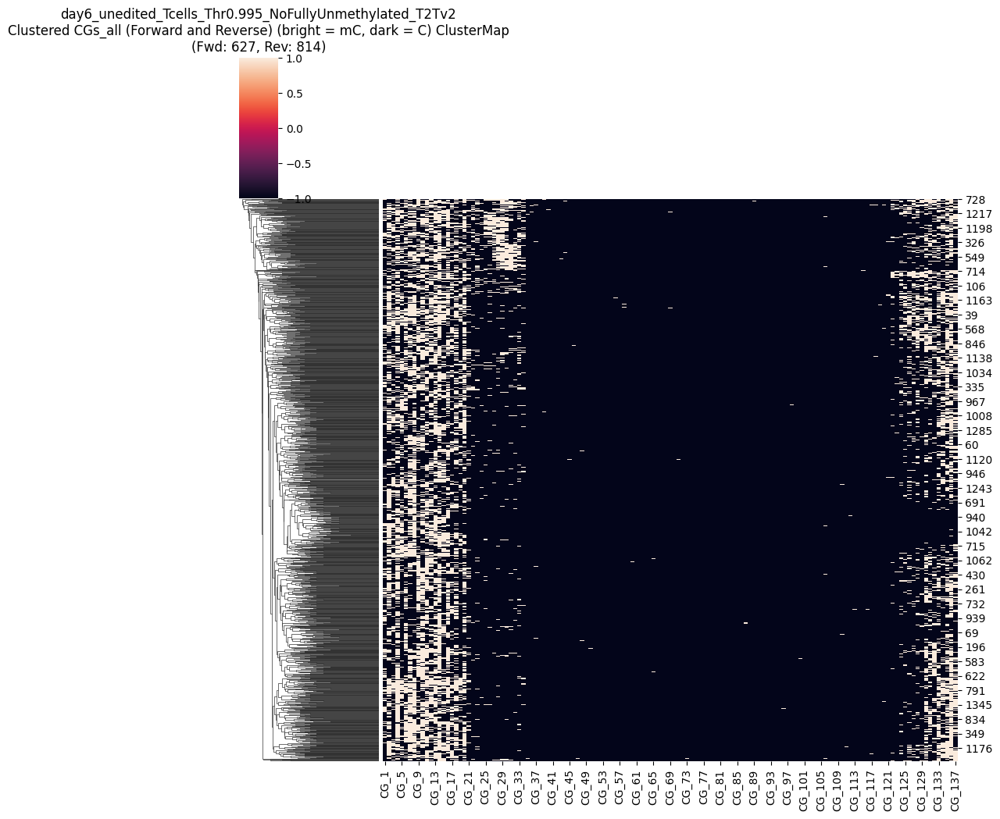

CGs_all saved as CG_137_removed_low50_methylated_padded_reads_day6_unedited_Tcells_Thr0.995_NoFullyUnmethylated_T2Tv2_mCthresh0.995_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD627_numRVS814.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,1.0,NaN,NaN,1.0,NaN,1.0,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN,NaN
1,NaN,1.0,1.0,1.0,NaN,NaN,1.0,NaN,NaN,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
2,NaN,1.0,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,NaN,1.0,1.0,1.0,1.0,NaN
3,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
4,NaN,NaN,1.0,1.0,NaN,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,NaN,NaN,NaN,1.0,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1436,1.0,1.0,1.0,1.0,1.0,NaN,1.0,1.0,NaN,NaN,...,1.0,1.0,NaN,1.0,NaN,1.0,NaN,1.0,NaN,NaN
1437,NaN,1.0,NaN,1.0,1.0,1.0,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN
1438,NaN,NaN,1.0,NaN,1.0,NaN,1.0,1.0,NaN,1.0,...,NaN,NaN,1.0,NaN,NaN,NaN,1.0,1.0,1.0,1.0
1439,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN


In [21]:
threshold_percent = 50
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np

padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
if padded_reads is not None:
    plot_padded_reads(padded_reads, ref_seq_list)
    save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)


# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")

CGs_all_unedited_mc0995_remove_low50 = CGs_all
CGs_all_unedited_mc0995_remove_low50


Mean methylated CGs per read: 13.0
Maximum methylated CGs per read: 32.0
Threshold (70% of max): 9.10
Original number of reads: 1582
Number of reads after filtering: 1219
Removed 363 reads


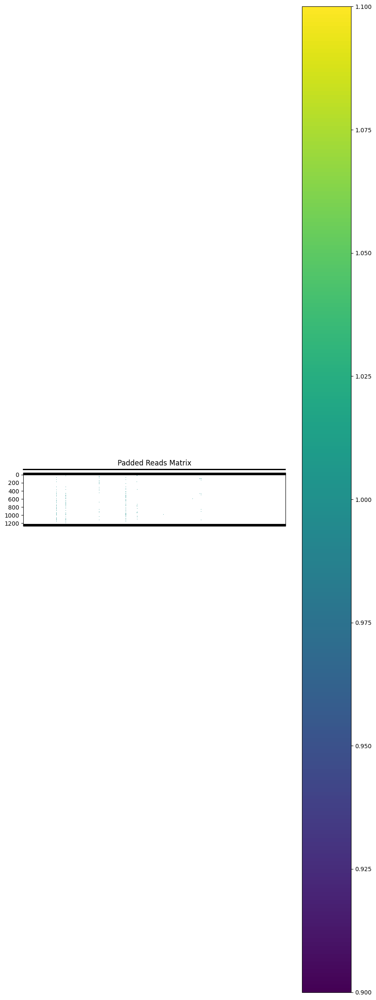

Padded reads saved to removed_low70_methylated_padded_reads_day6_unedited_Tcells_Thr0.995_NoFullyUnmethylated_T2Tv2_mCthresh0.995_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


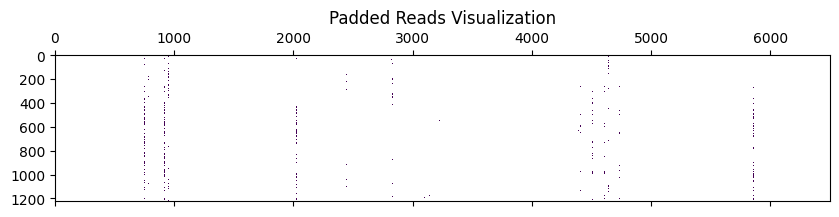

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

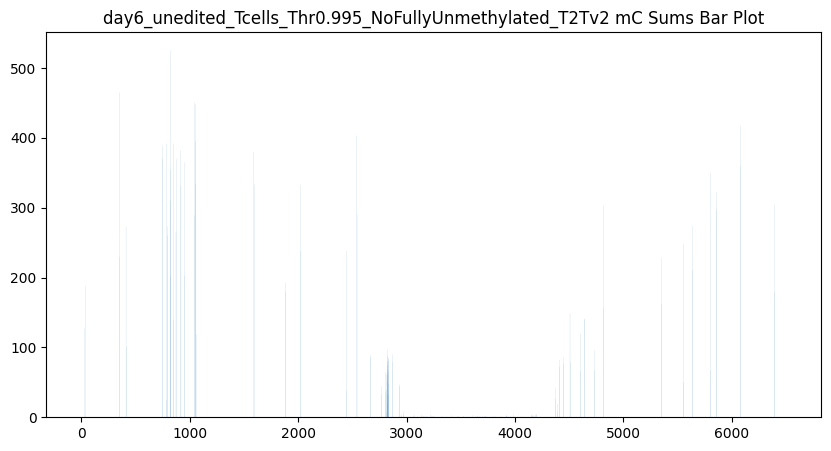

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


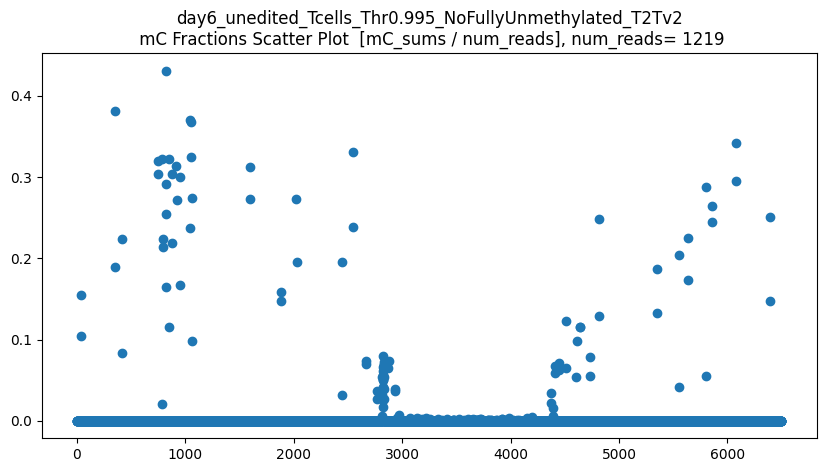

len(CGs_all) = 1219
CGs_all.shape = (1219, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


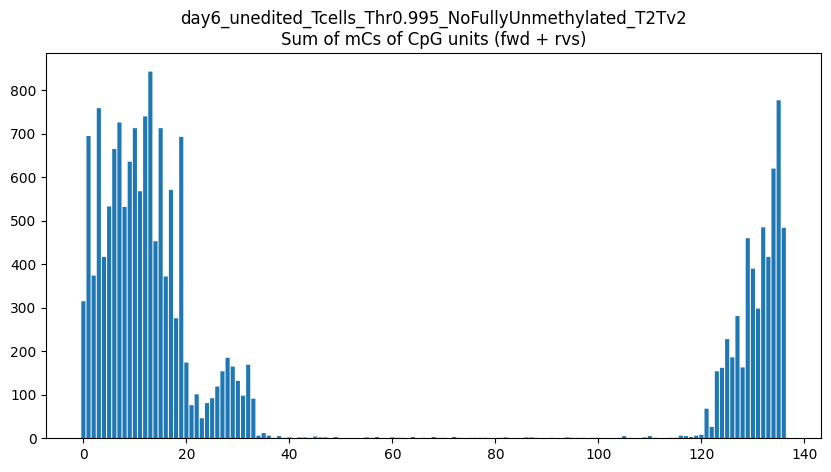

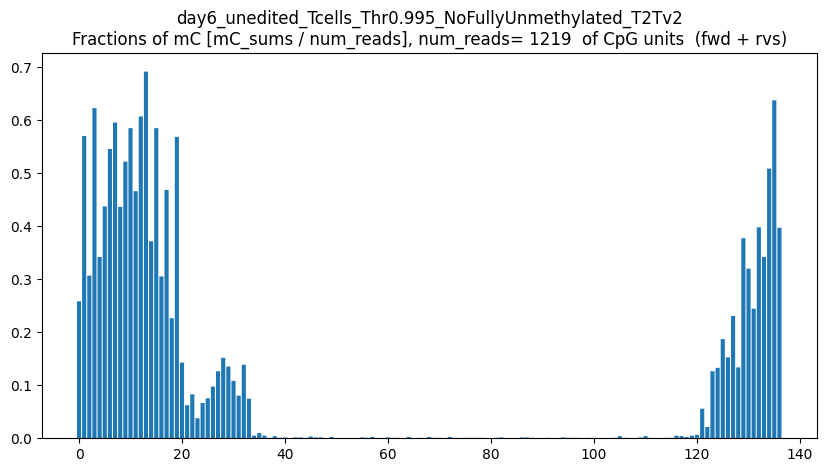

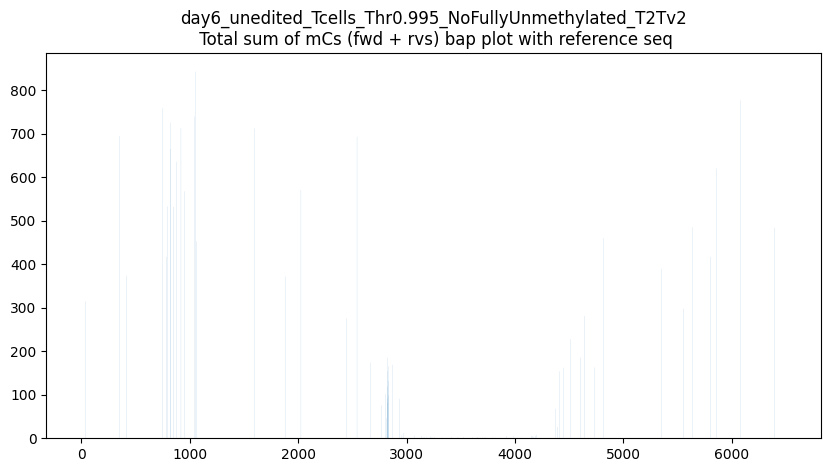

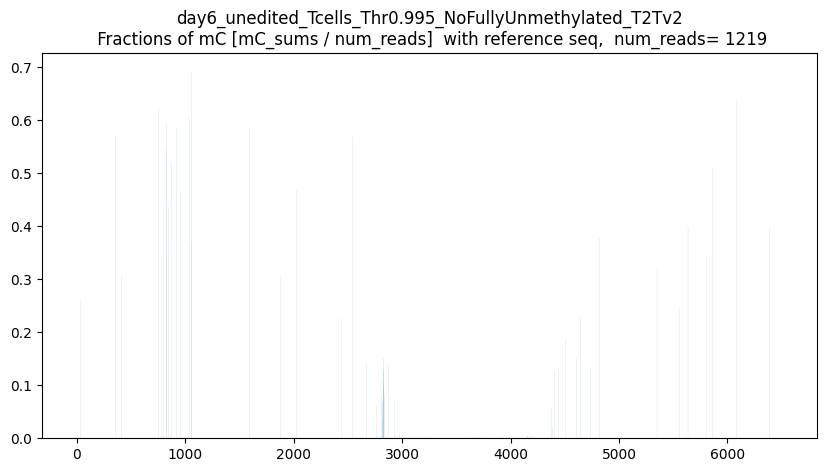

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



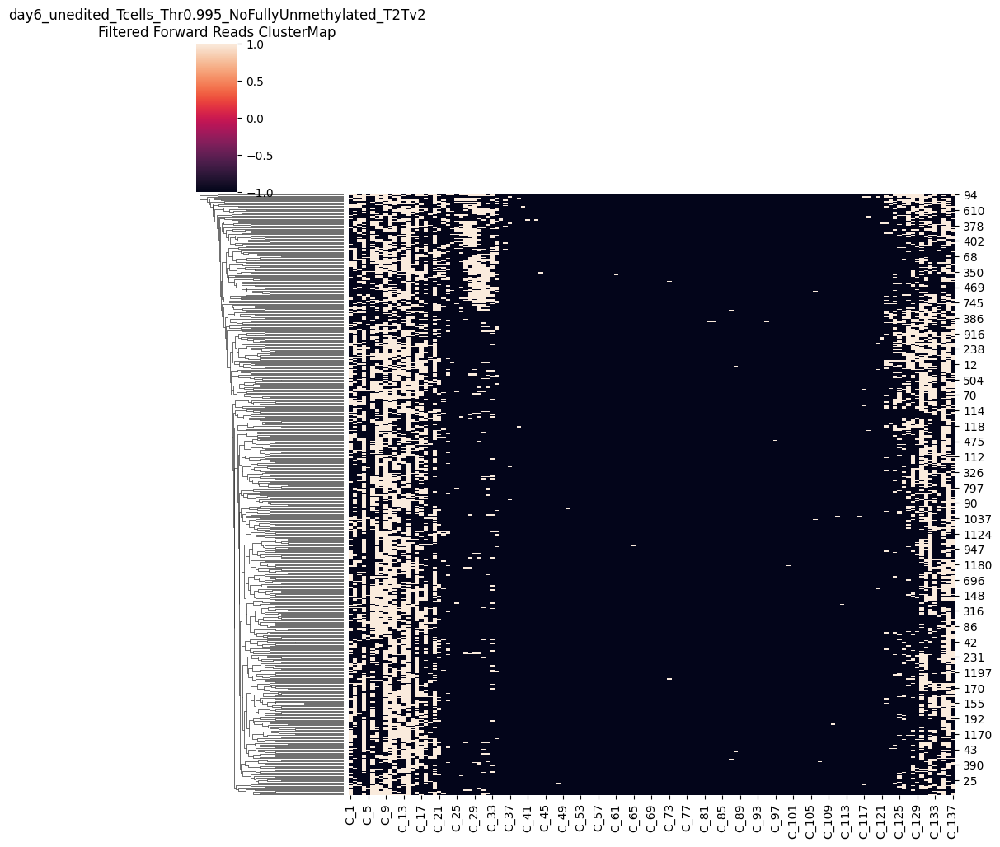

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



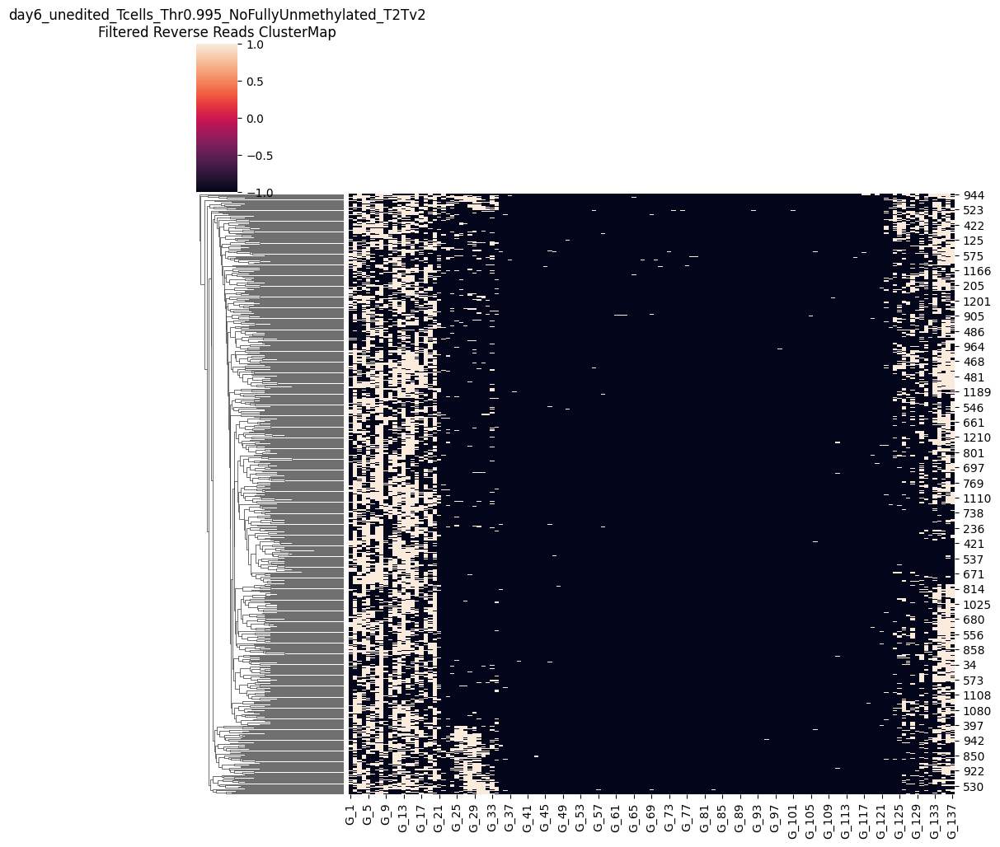

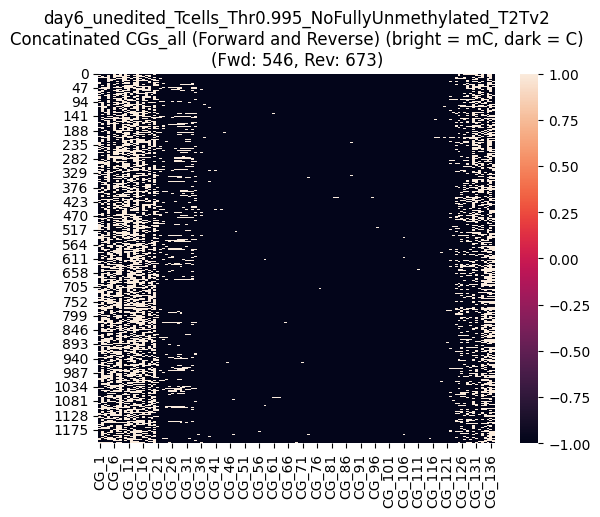

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



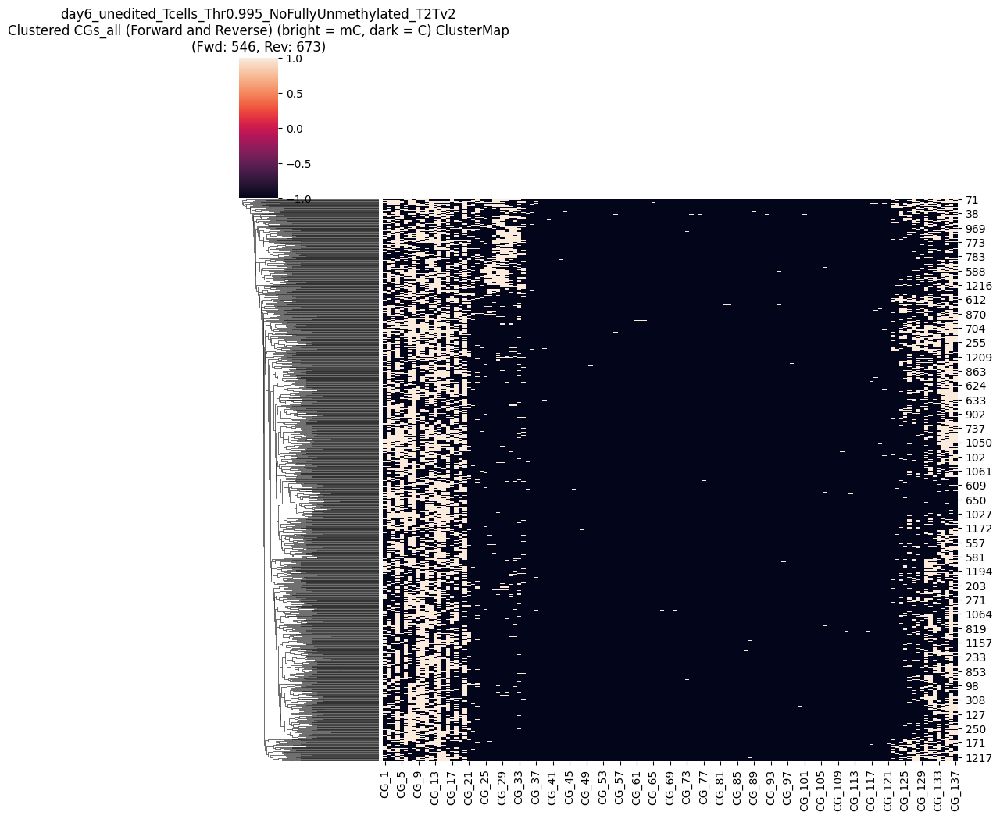

CGs_all saved as CG_137_removed_low70_methylated_padded_reads_day6_unedited_Tcells_Thr0.995_NoFullyUnmethylated_T2Tv2_mCthresh0.995_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD546_numRVS673.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,1.0,NaN,NaN,1.0,NaN,1.0,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN,NaN
1,NaN,1.0,1.0,1.0,NaN,NaN,1.0,NaN,NaN,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
2,NaN,1.0,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,NaN,1.0,1.0,1.0,1.0,NaN
3,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
4,NaN,NaN,1.0,1.0,NaN,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,NaN,NaN,NaN,1.0,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1214,NaN,1.0,NaN,NaN,NaN,1.0,1.0,1.0,NaN,NaN,...,NaN,NaN,1.0,NaN,NaN,1.0,1.0,1.0,1.0,1.0
1215,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,NaN
1216,1.0,1.0,1.0,1.0,1.0,NaN,1.0,1.0,NaN,NaN,...,1.0,1.0,NaN,1.0,NaN,1.0,NaN,1.0,NaN,NaN
1217,NaN,1.0,NaN,1.0,1.0,1.0,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN


In [29]:
threshold_percent = 70
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np

padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
if padded_reads is not None:
    plot_padded_reads(padded_reads, ref_seq_list)
    save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)


# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")

CGs_all_unedited_mc0995_remove_low70 = CGs_all
CGs_all_unedited_mc0995_remove_low70


Mean methylated CGs per read: 13.0
Maximum methylated CGs per read: 32.0
Threshold (10% of max): 1.30
Original number of reads: 1582
Number of reads after filtering: 1573
Removed 9 reads


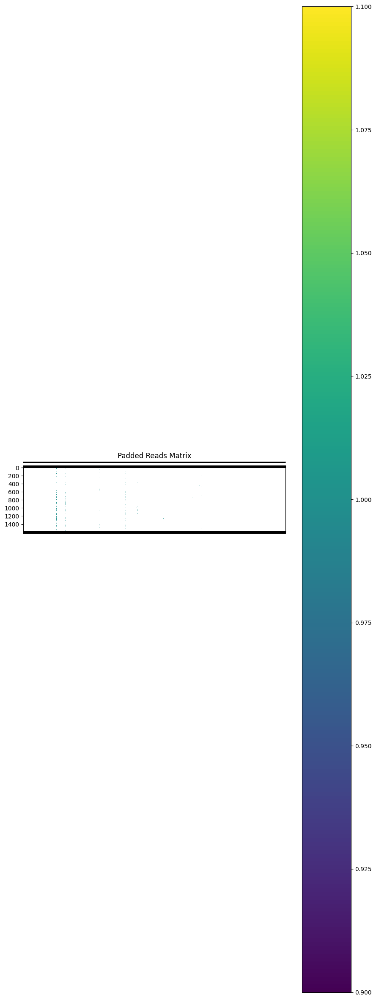

Padded reads saved to removed_low10_methylated_padded_reads_day6_unedited_Tcells_Thr0.995_NoFullyUnmethylated_T2Tv2_mCthresh0.995_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


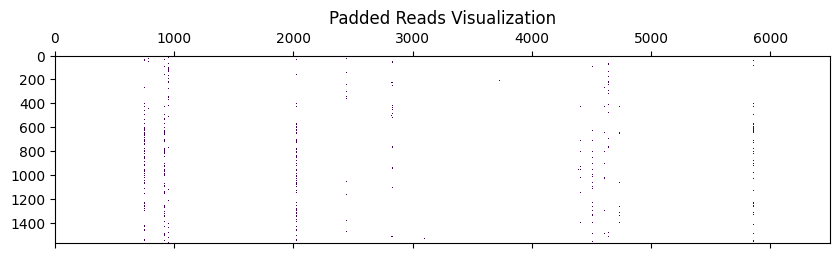

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

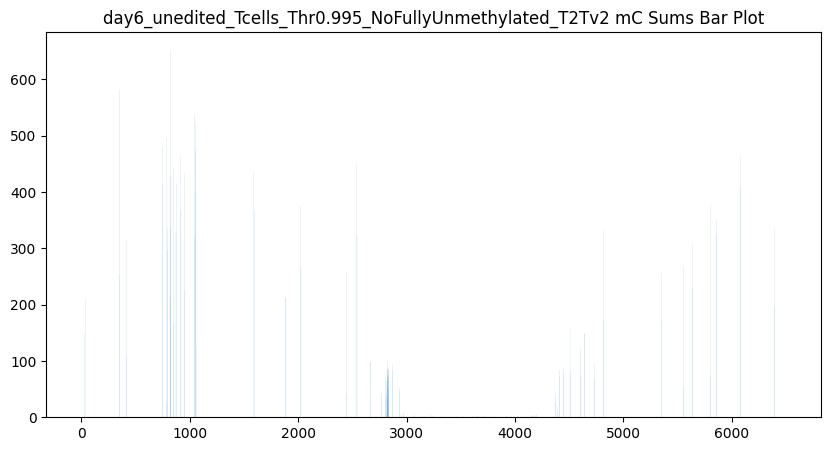

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


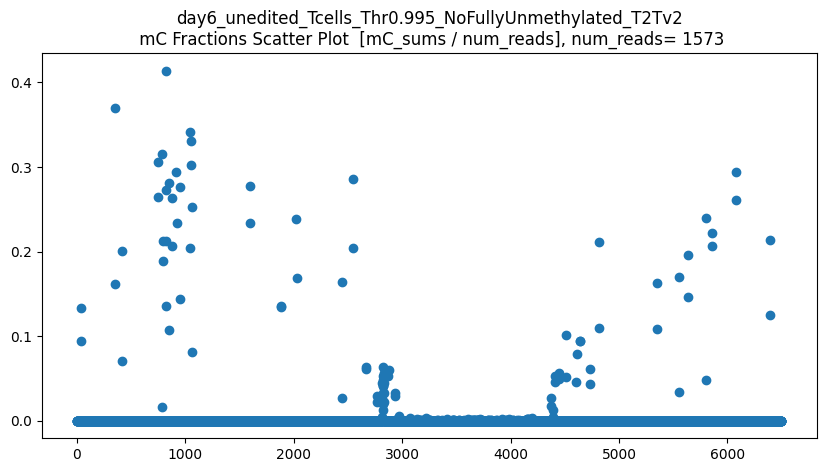

len(CGs_all) = 1573
CGs_all.shape = (1573, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


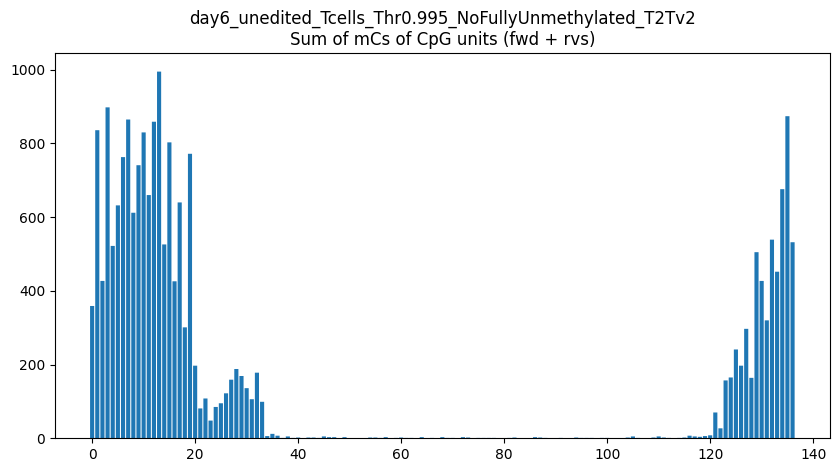

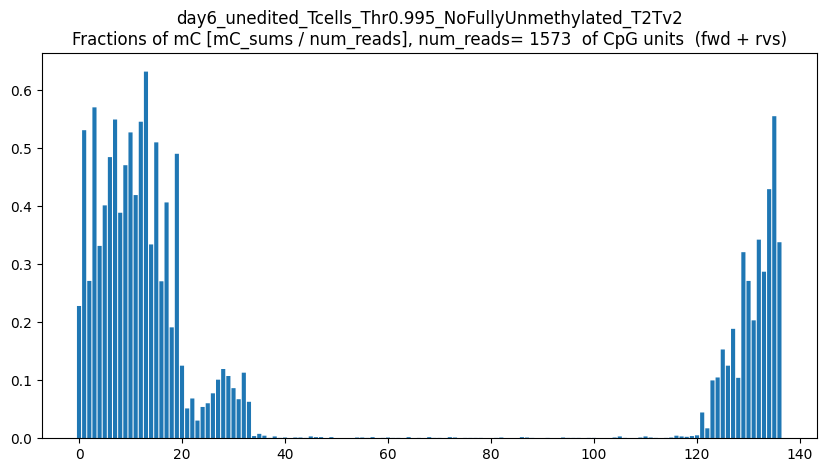

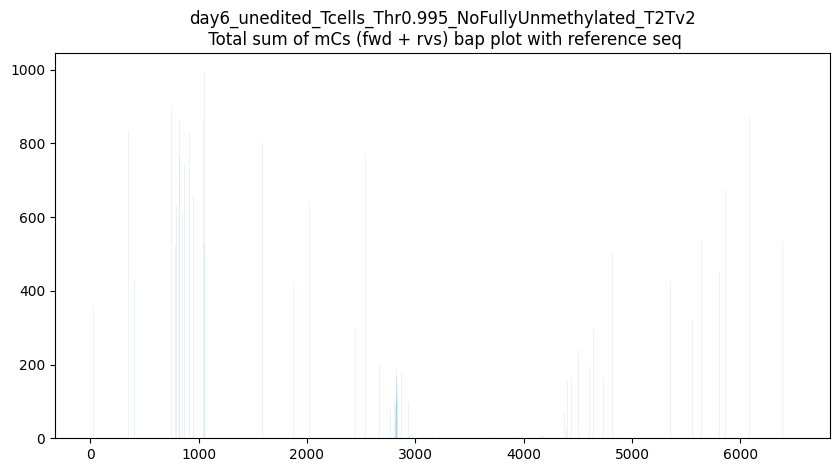

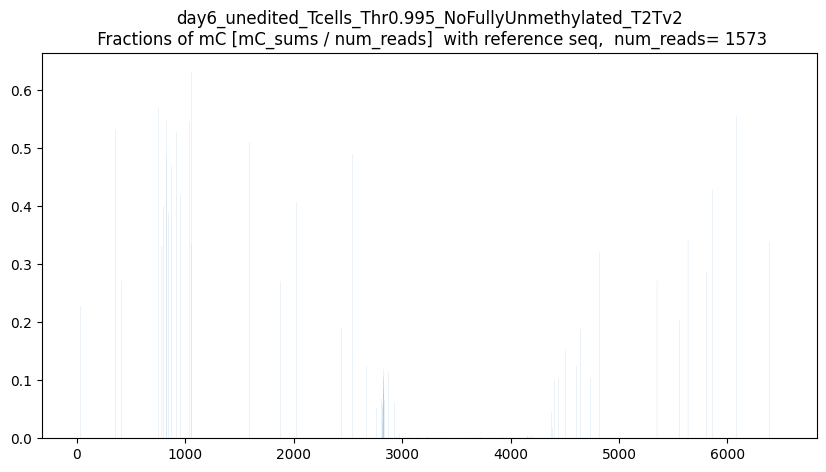

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



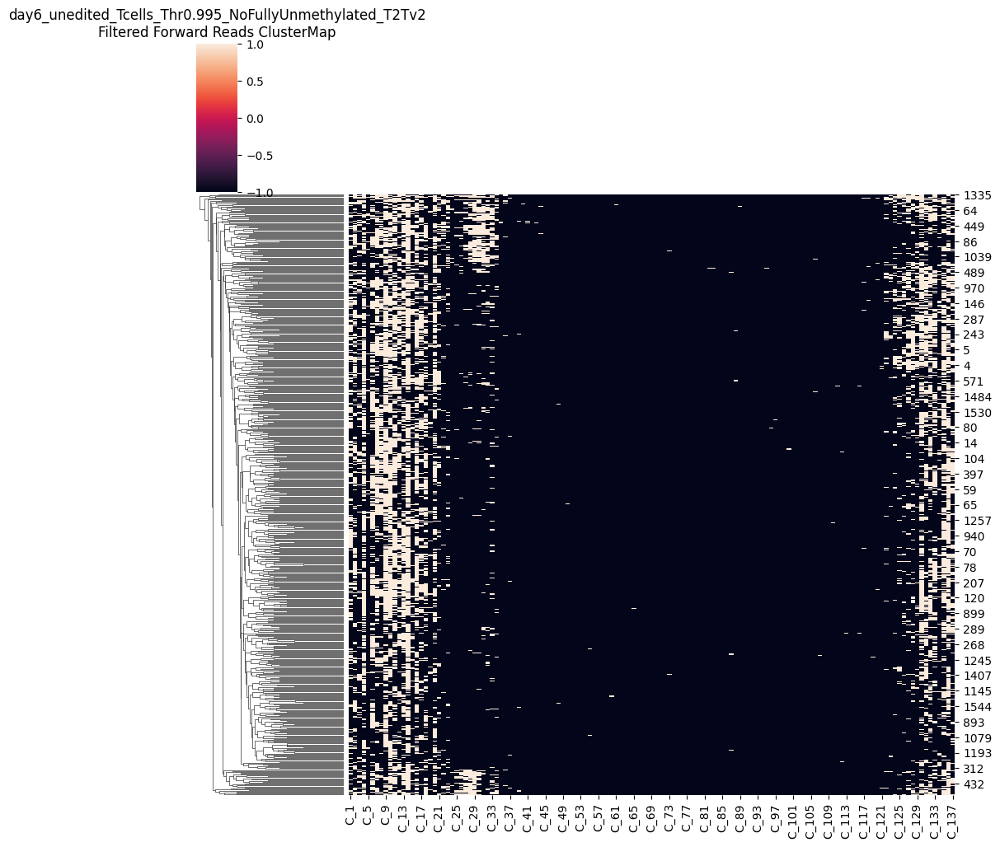

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



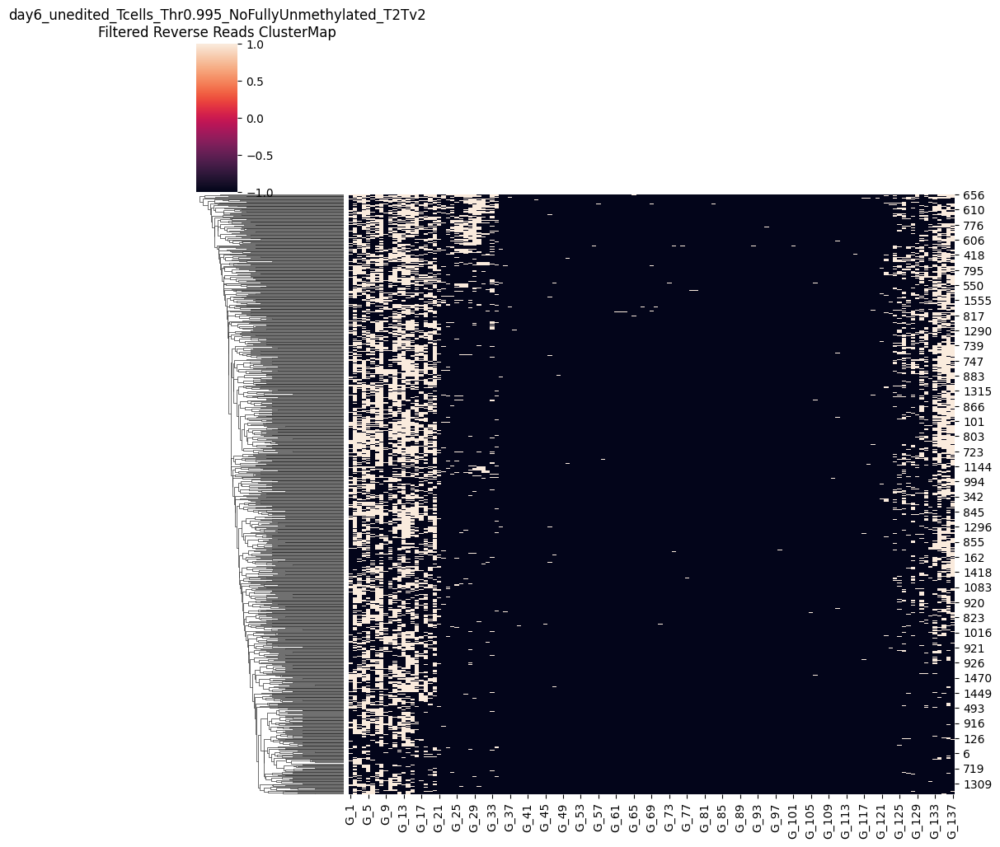

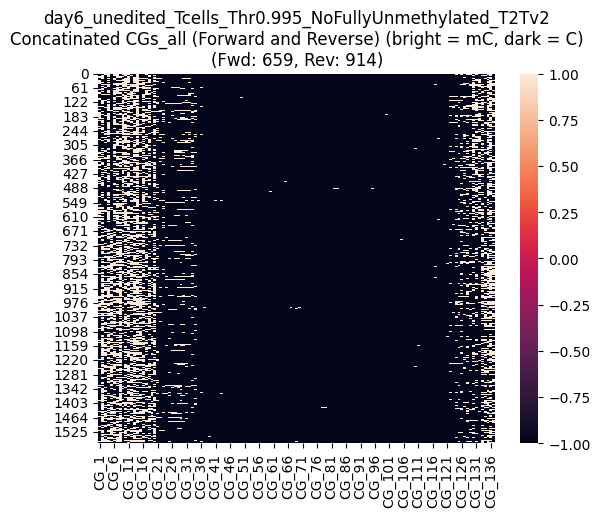

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



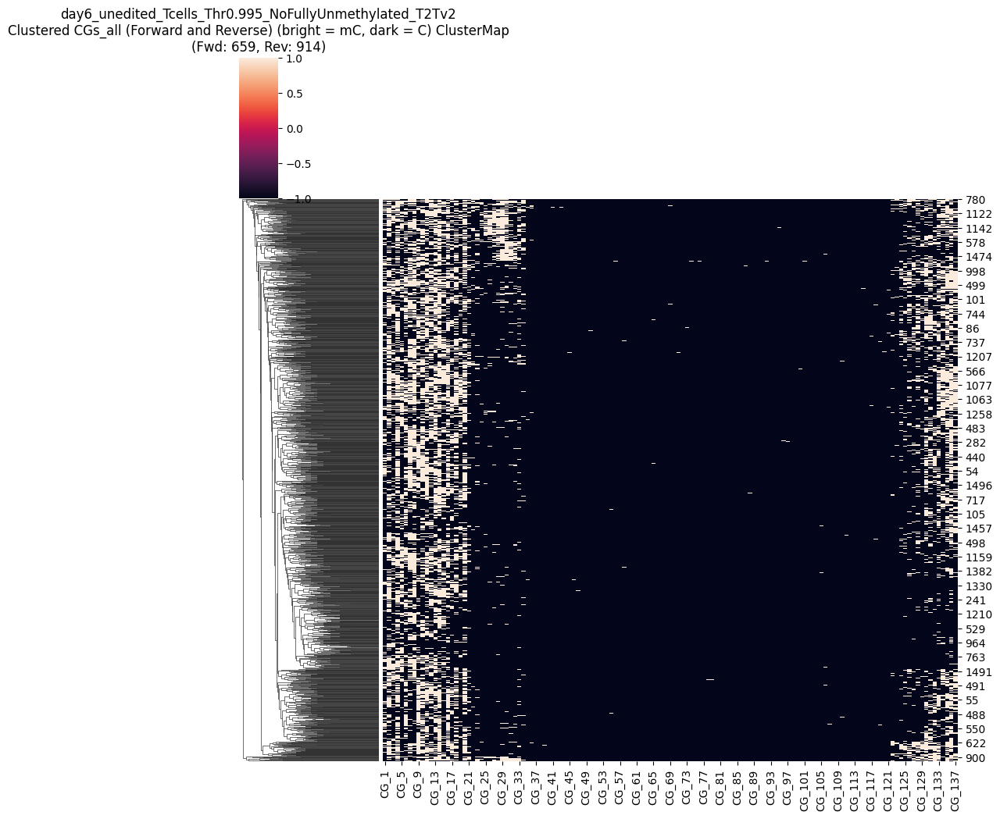

CGs_all saved as CG_137_removed_low10_methylated_padded_reads_day6_unedited_Tcells_Thr0.995_NoFullyUnmethylated_T2Tv2_mCthresh0.995_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD659_numRVS914.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,1.0,NaN,NaN,1.0,NaN,1.0,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN,NaN
1,NaN,1.0,1.0,1.0,NaN,NaN,1.0,NaN,NaN,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
2,NaN,1.0,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,NaN,1.0,1.0,1.0,1.0,NaN
3,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
4,NaN,NaN,1.0,1.0,NaN,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,NaN,NaN,NaN,1.0,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1568,NaN,1.0,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN
1569,NaN,NaN,1.0,NaN,1.0,NaN,1.0,1.0,NaN,1.0,...,NaN,NaN,1.0,NaN,NaN,NaN,1.0,1.0,1.0,1.0
1570,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0
1571,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,1.0,NaN,1.0,1.0,1.0,NaN


In [22]:
threshold_percent = 10
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np

padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
if padded_reads is not None:
    plot_padded_reads(padded_reads, ref_seq_list)
    save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)


# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")

CGs_all_unedited_mc0995_remove_low10 = CGs_all
CGs_all_unedited_mc0995_remove_low10


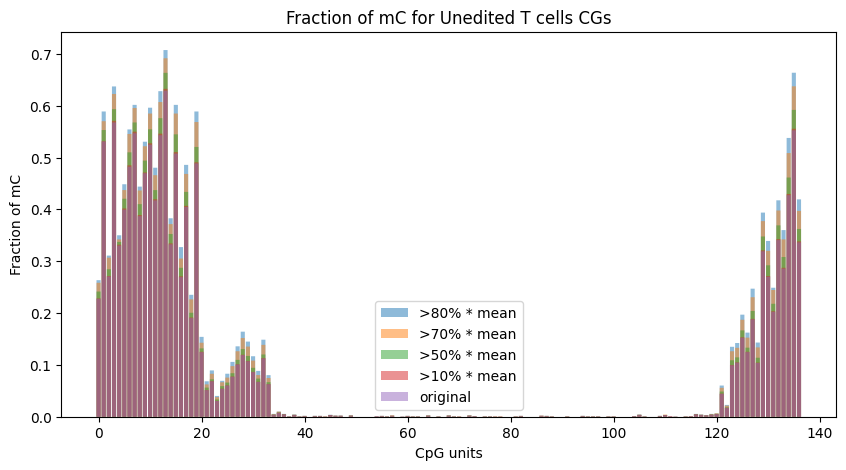

In [30]:
# CGs_all_unedited_remove_low80 vs. CGs_all_unedited_remove_low50 

# import matplotlib.pyplot as plt

# # Calculate the fraction of mC for both DataFrames
# CGs_all_unedited_cut['fraction_mC'] = CGs_all_unedited_cut['mC_sums'] / CGs_all_unedited_cut['num_reads']
# CGs_all_silenced_cut['fraction_mC'] = CGs_all_silenced_cut['mC_sums'] / CGs_all_silenced_cut['num_reads']


CGs_all_unedited_cut_sums = np.nansum(CGs_all_unedited_mc0995_remove_low80.values, axis=0) 
CGs_all_unedited_cut_frac = CGs_all_unedited_cut_sums  / len(CGs_all_unedited_mc0995_remove_low80) 


CGs_all_unedited_remove_low70_sums = np.nansum(CGs_all_unedited_mc0995_remove_low70.values, axis=0) 
CGs_all_unedited_remove_low70_frac = CGs_all_unedited_remove_low70_sums  / len(CGs_all_unedited_mc0995_remove_low70) 


CGs_all_silenced_cut_sums = np.nansum(CGs_all_unedited_mc0995_remove_low50.values, axis=0) 
CGs_all_silenced_cut_frac = CGs_all_silenced_cut_sums  /len(CGs_all_unedited_mc0995_remove_low50) 


CGs_all_unedited_remove_low10_sums = np.nansum(CGs_all_unedited_mc0995_remove_low10.values, axis=0) 
CGs_all_unedited_remove_low10_frac = CGs_all_unedited_remove_low10_sums  / len(CGs_all_unedited_mc0995_remove_low10) 

CGs_all_silenced_full_sums = np.nansum(CGs_all_unedited_mc0995_original.values, axis=0) 
CGs_all_silenced_full_frac = CGs_all_silenced_full_sums / len(CGs_all_unedited_mc0995_original) 



# Plot the fraction mC for CGs_all_unedited_cut
# plt.bar(CGs_all_unedited_cut.index, CGs_all_unedited_cut_frac, alpha=0.5, label='Unedited')

plt.figure(figsize=(10, 5))
# Plot the fraction mC for CGs_all_silenced_cut



plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_unedited_cut_frac, snap=False, alpha=0.5, label='>80% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low70_sums)), CGs_all_unedited_remove_low70_frac, snap=False, alpha=0.5, label='>70% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_silenced_cut_frac, snap=False, alpha=0.5, label='>50% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low10_sums)), CGs_all_unedited_remove_low10_frac, snap=False, alpha=0.5, label='>10% * mean')
plt.bar(np.arange(len(CGs_all_silenced_full_sums)), CGs_all_silenced_full_frac, snap=False, alpha=0.5, label='original')


# plt.title(f"{experiment_name}\nSum of mCs of CpG units (fwd + rvs)")
# plt.show()

# Add labels and title
plt.xlabel('CpG units')
plt.ylabel('Fraction of mC')
plt.title('Fraction of mC for Unedited T cells CGs')
plt.legend()

# Show the plot
plt.show()

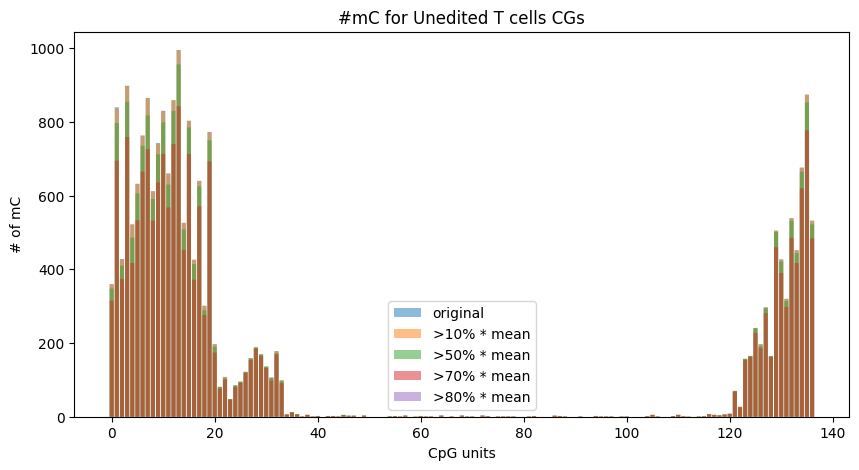

In [ ]:
CGs_all_unedited_cut_sums = np.nansum(CGs_all_unedited_mc0995_remove_low80.values, axis=0) 
CGs_all_unedited_cut_frac = CGs_all_unedited_cut_sums  / len(CGs_all_unedited_mc0995_remove_low80) 


CGs_all_unedited_remove_low70_sums = np.nansum(CGs_all_unedited_mc0995_remove_low70.values, axis=0) 
CGs_all_unedited_remove_low70_frac = CGs_all_unedited_remove_low70_sums # / len(CGs_all_unedited_mc0995_remove_low70) 


CGs_all_silenced_cut_sums = np.nansum(CGs_all_unedited_mc0995_remove_low50.values, axis=0) 
CGs_all_silenced_cut_frac = CGs_all_silenced_cut_sums  # /len(CGs_all_unedited_mc0995_remove_low50) 


CGs_all_unedited_remove_low10_sums = np.nansum(CGs_all_unedited_mc0995_remove_low10.values, axis=0) 
CGs_all_unedited_remove_low10_frac = CGs_all_unedited_remove_low10_sums # / len(CGs_all_unedited_mc0995_remove_low10) 

CGs_all_silenced_full_sums = np.nansum(CGs_all_unedited_mc0995_original.values, axis=0) 
CGs_all_silenced_full_frac = CGs_all_silenced_full_sums # / len(CGs_all_unedited_mc0995_original) 



# Plot the fraction mC for CGs_all_unedited_cut
# plt.bar(CGs_all_unedited_cut.index, CGs_all_unedited_cut_frac, alpha=0.5, label='Unedited')

plt.figure(figsize=(10, 5))
# Plot the fraction mC for CGs_all_silenced_cut




plt.bar(np.arange(len(CGs_all_silenced_full_sums)), CGs_all_silenced_full_frac, snap=False, alpha=0.5, label='original')
plt.bar(np.arange(len(CGs_all_unedited_remove_low10_sums)), CGs_all_unedited_remove_low10_frac, snap=False, alpha=0.5, label='>10% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_silenced_cut_frac, snap=False, alpha=0.5, label='>50% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low70_sums)), CGs_all_unedited_remove_low70_frac, snap=False, alpha=0.5, label='>70% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_unedited_cut_frac, snap=False, alpha=0.5, label='>80% * mean')



# plt.title(f"{experiment_name}\nSum of mCs of CpG units (fwd + rvs)")
# plt.show()

# Add labels and title
plt.xlabel('CpG units')
plt.ylabel('# of mC')
plt.title('#mC for Unedited T cells CGs')
plt.legend()

# Show the plot
plt.show()

# 0.9

experiment_name =  day6_unedited_Tcells_Thr0.9_NoFullyUnmethylated_T2Tv2
Region length: 6500
No specified number of cores requested. 24 available on machine, allocating all.
Modification threshold of 0.9 will be treated as coming from range 0-1.


          | Step 1: Identify motif locations in up_chm13v2.0.fasta   0% | 00:00

          | Step 2: Parse regions in sort_align_t2t_v2_0_trim_20241226_MR_nCATs_TcellsPrES_unedit_P2R9_passed.…

          |    0%

          | Transferring 3539 from reads.CG,0.txt into reads.combined_basemods.h5, new size 3539   0% | 00:00<…

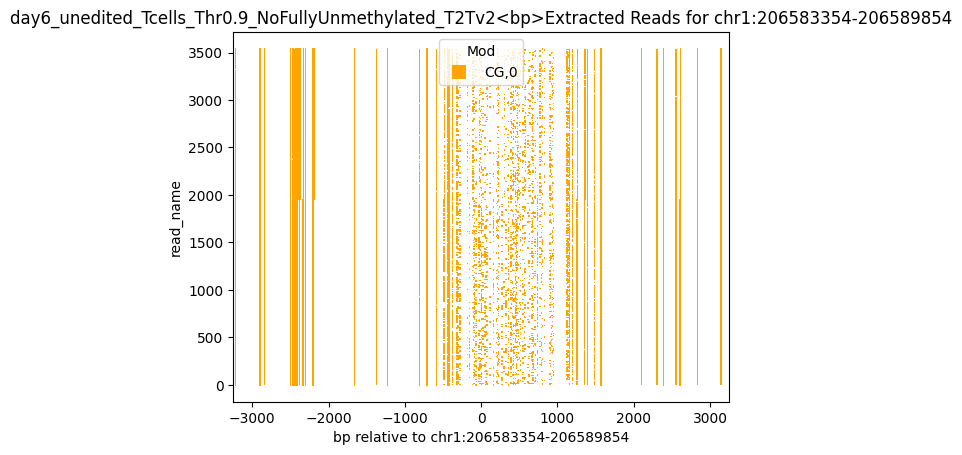

Found read coordinates: 3539 reads
Unique read names with methylation: 3516
Found 1601 reads with full coverage
Reads with methylation data: 3516
Overlap between full coverage and methylation: 1592
After full coverage filtering: 34380 reads with methylation data
Final result: 34380 reads with methylation information out of 3539 total reads


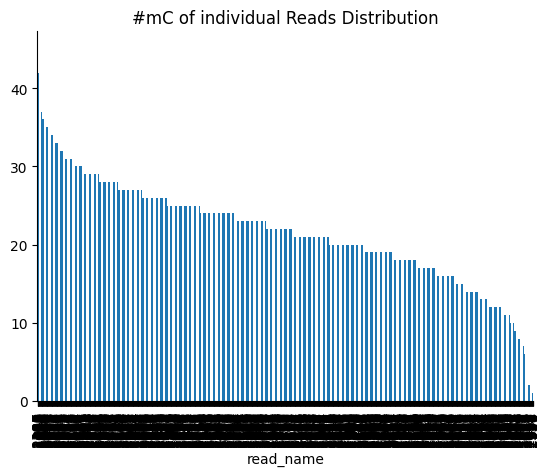

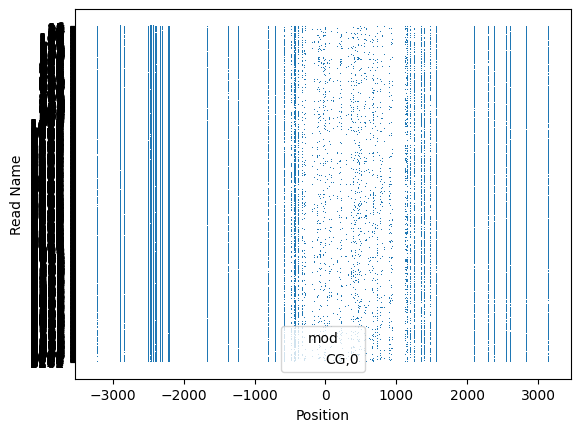

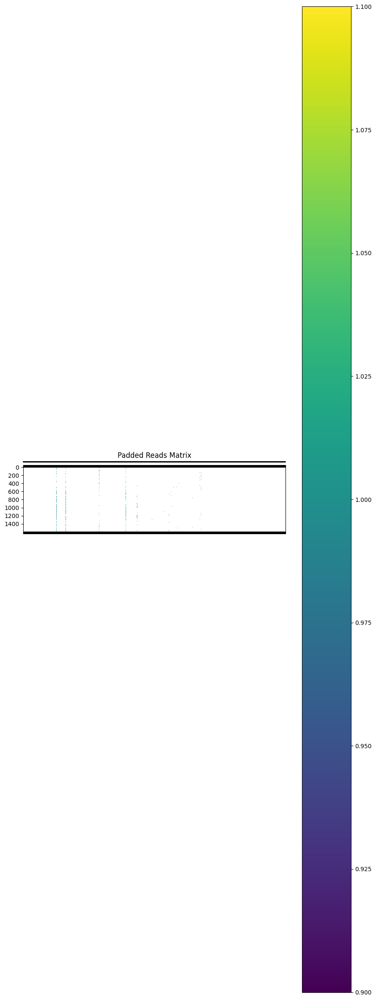

Padded reads saved to padded_reads_day6_unedited_Tcells_Thr0.9_NoFullyUnmethylated_T2Tv2_mCthresh0.9_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


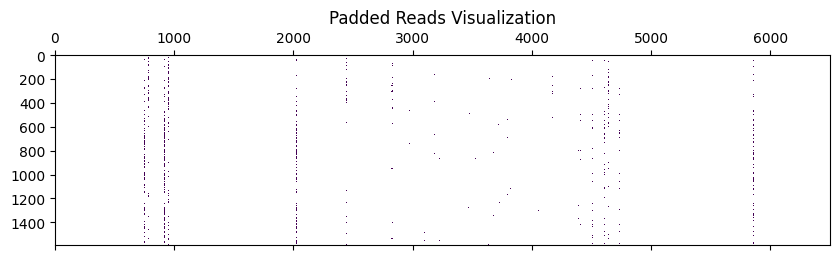

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

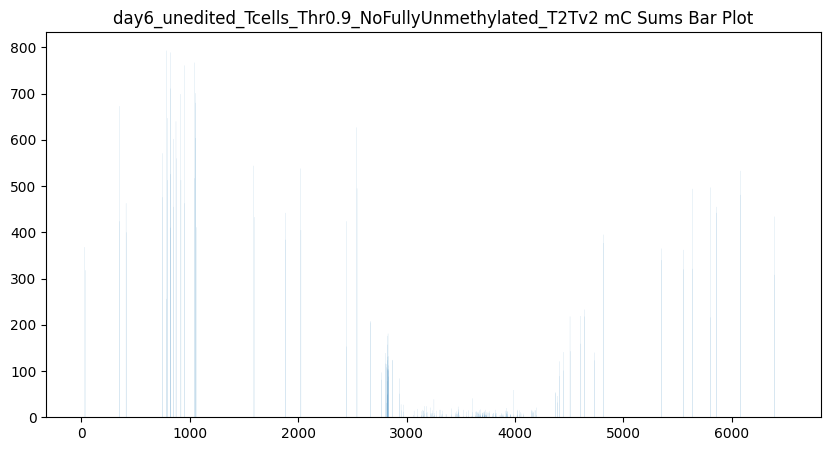

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


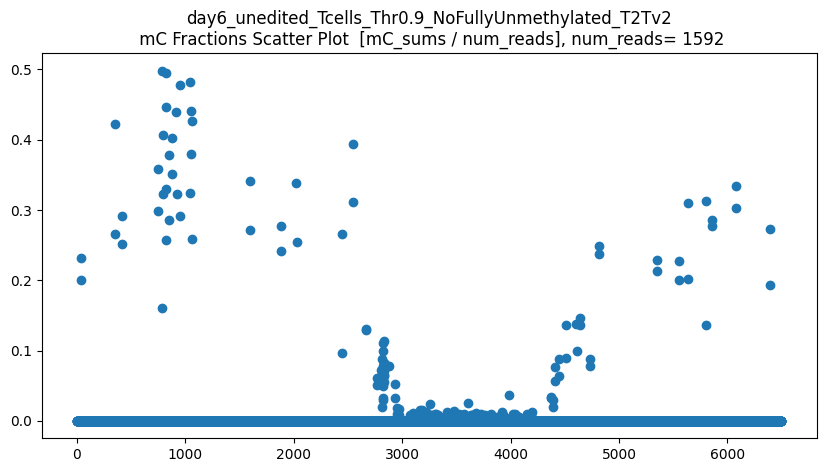

len(CGs_all) = 1592
CGs_all.shape = (1592, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


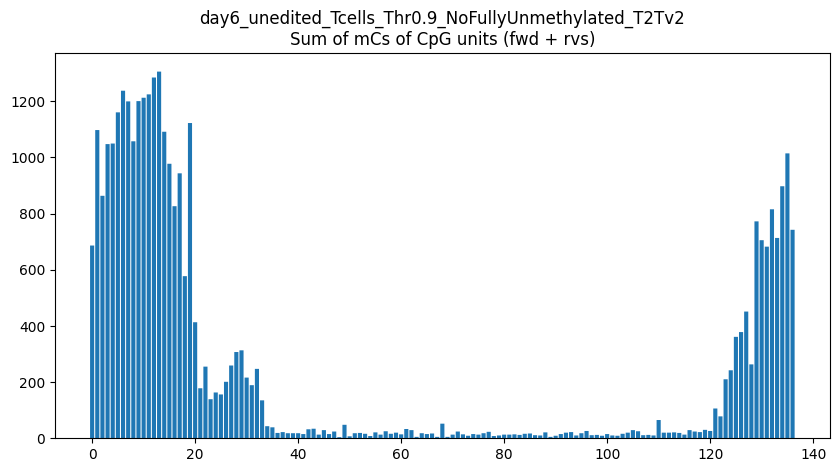

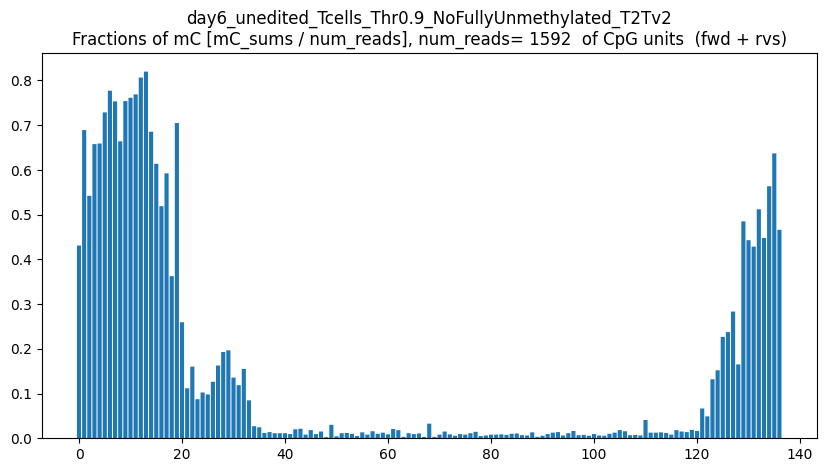

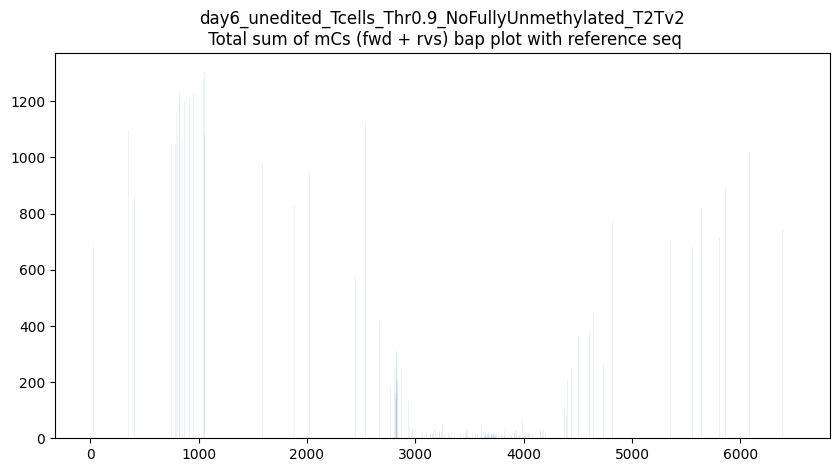

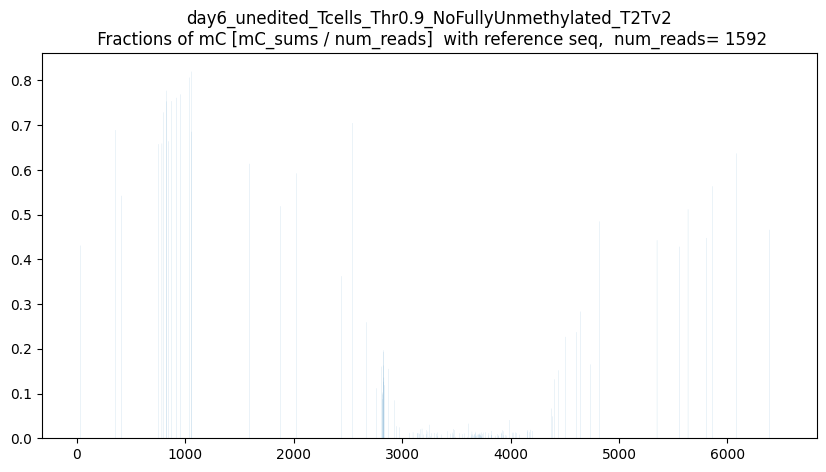

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



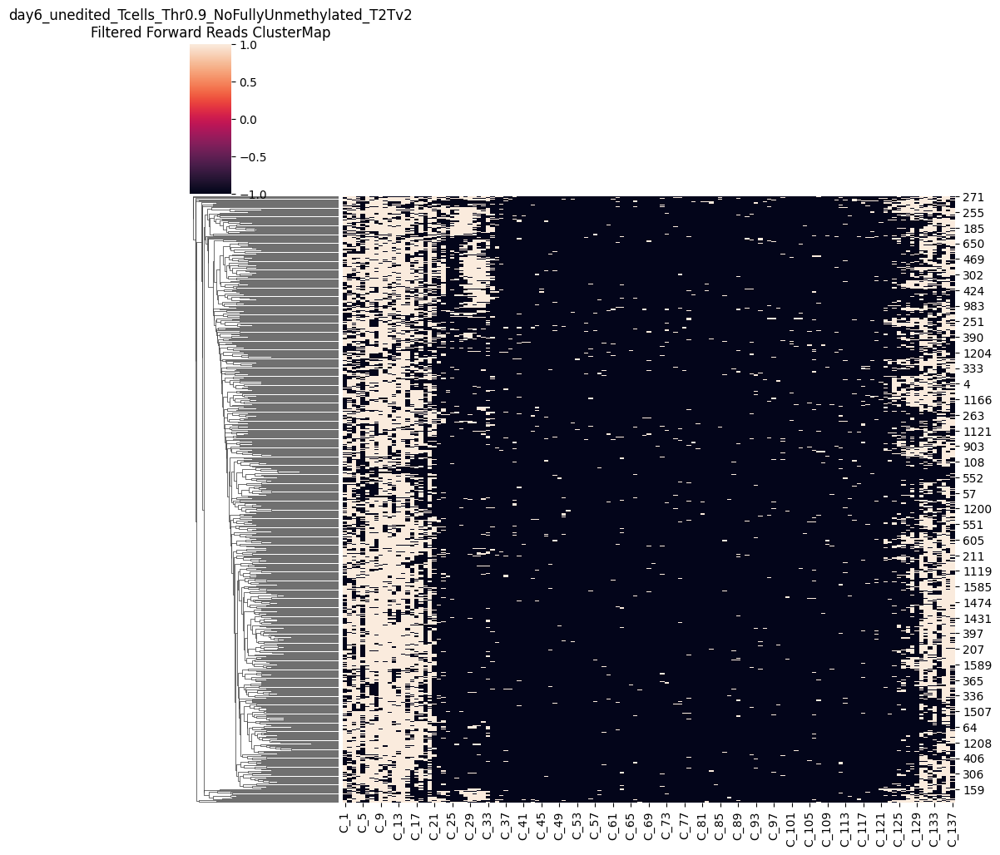

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



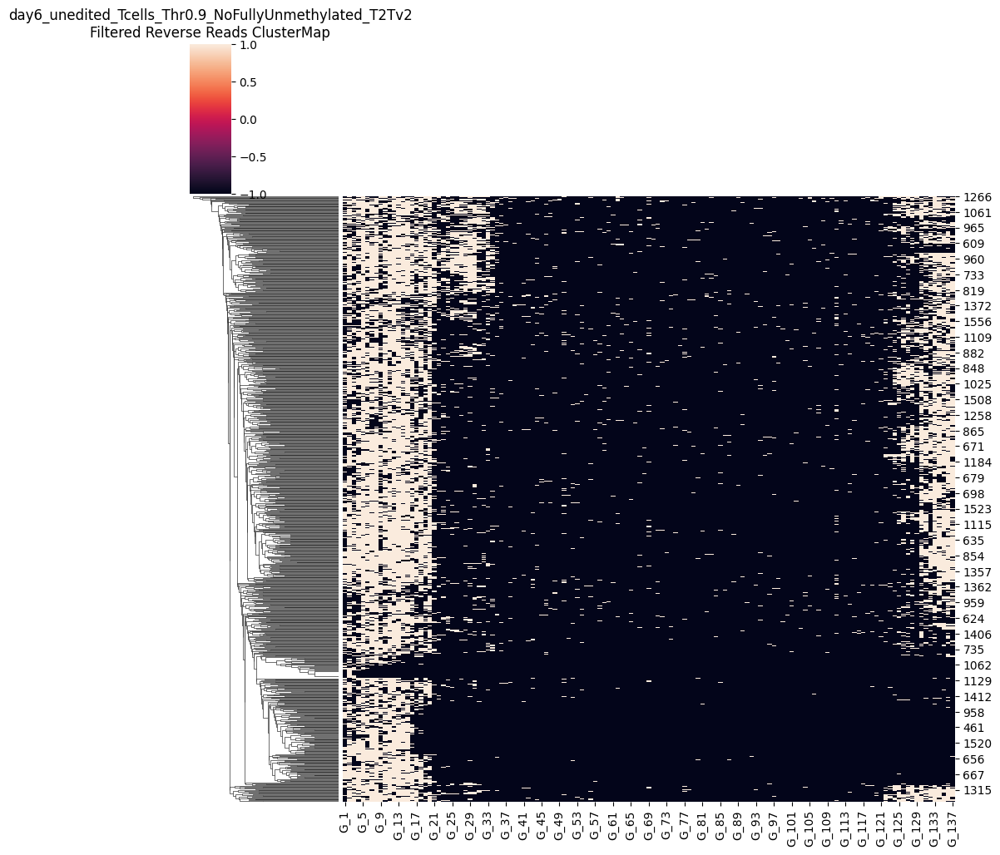

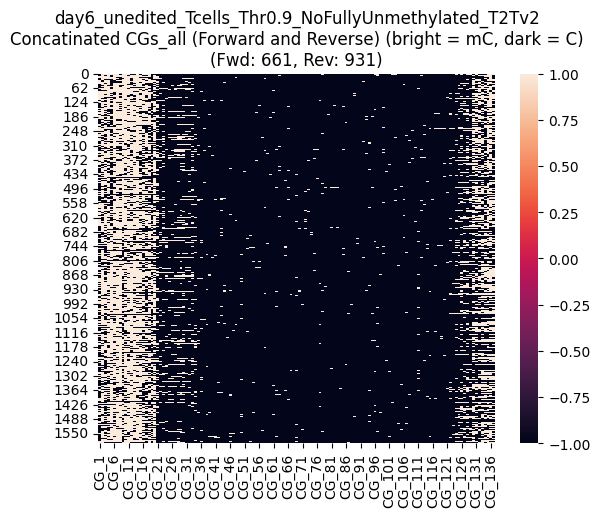

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



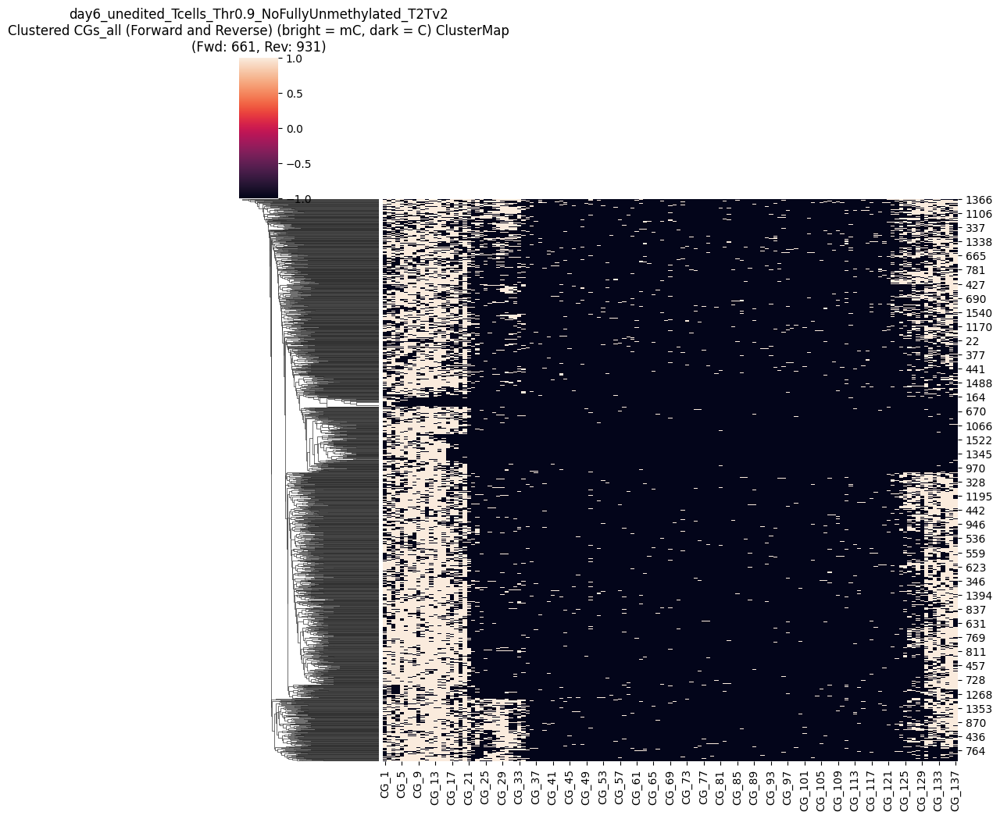

CGs_all saved as CG_137_padded_reads_day6_unedited_Tcells_Thr0.9_NoFullyUnmethylated_T2Tv2_mCthresh0.9_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD661_numRVS931.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,1.0,1.0,NaN,1.0,NaN,1.0,NaN,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN
1,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,NaN,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,1.0,NaN
2,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0
3,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
4,NaN,1.0,1.0,1.0,1.0,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,NaN,NaN,NaN,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1587,NaN,1.0,1.0,NaN,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN
1588,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1589,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0
1590,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,NaN


In [46]:


threshold_mC =  0.9 # 0.7 #  0.9 #0.99
experiment_name = "day6_unedited_Tcells_Thr"+str(threshold_mC)+"_NoFullyUnmethylated_T2Tv2"
bam_path = unedit_bam_path

print('experiment_name = ', experiment_name)

save_padded_reads_name_np = f"padded_reads_{experiment_name}_mCthresh{threshold_mC}_{reg_genome_version}_{region_str}_{date_today}.npy"
output_dir = create_output_directory("./dimelo_v2_output")

extract_file, extract_regions = extract_from_bam(
    experiment_name = experiment_name,
    bam_path=bam_path,
    ref_genome_file=ref_genome_path,
    output_dir=output_dir,
    regions=region_str,
    motifs=motifs,
    output_name='extracted_reads',
    threshold_mC=threshold_mC,
)
keep_full_coverage_reads_only=True

if extract_file:
    reads_df, regions_dict = process_extracted_reads(extract_file, region_str, motifs, ref_seq_list, 
    keep_full_coverage_reads_only=keep_full_coverage_reads_only)
    visualize_data(reads_df)

    padded_reads = create_padded_reads(reads_df, regions_dict, region_length)
    if padded_reads is not None:
        plot_padded_reads(padded_reads, ref_seq_list)
        save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np)

# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")


CGs_all_unedited_mc09_original = CGs_all
CGs_all_unedited_mc09_original


Mean methylated CGs per read: 22.0
Maximum methylated CGs per read: 45.0
Threshold (80% of max): 17.60
Original number of reads: 1592
Number of reads after filtering: 1216
Removed 376 reads


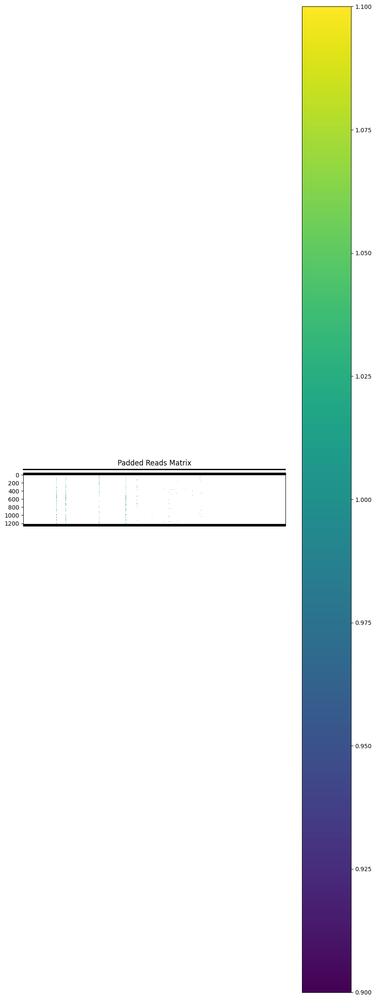

Padded reads saved to removed_low80_methylated_padded_reads_day6_unedited_Tcells_Thr0.9_NoFullyUnmethylated_T2Tv2_mCthresh0.9_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


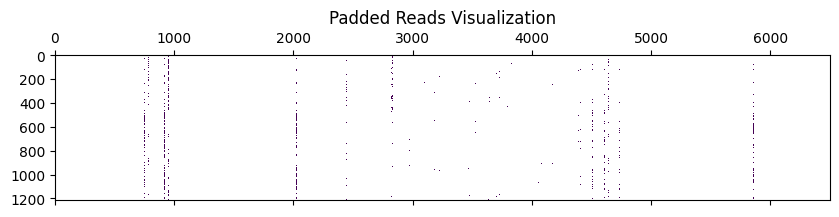

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

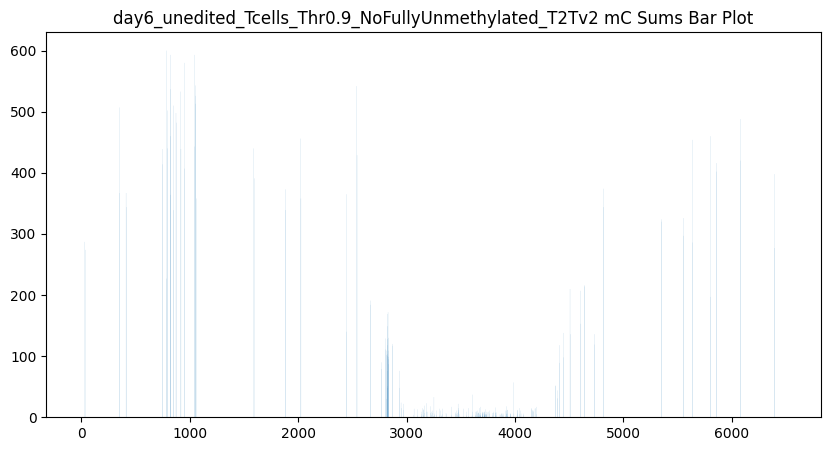

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


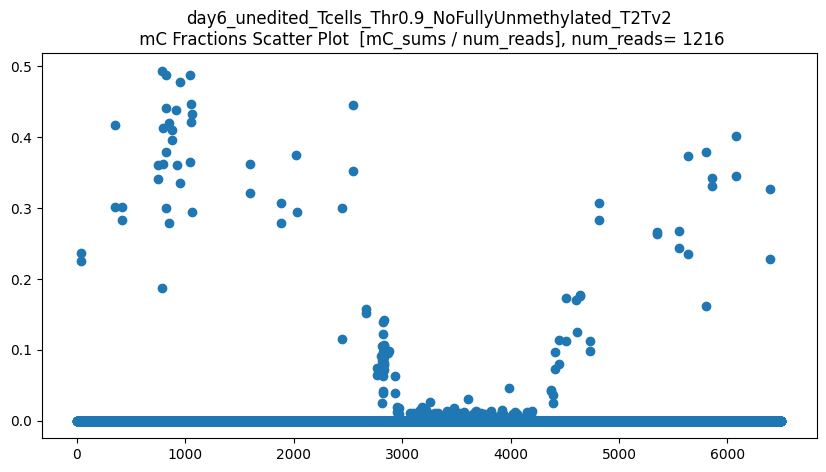

len(CGs_all) = 1216
CGs_all.shape = (1216, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


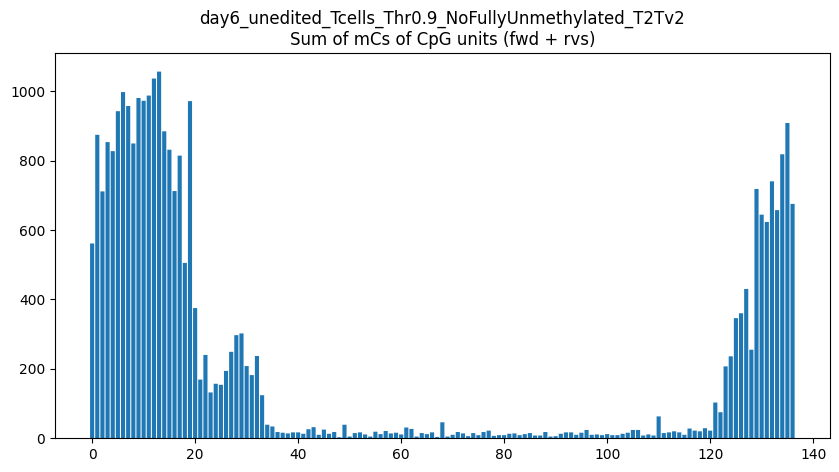

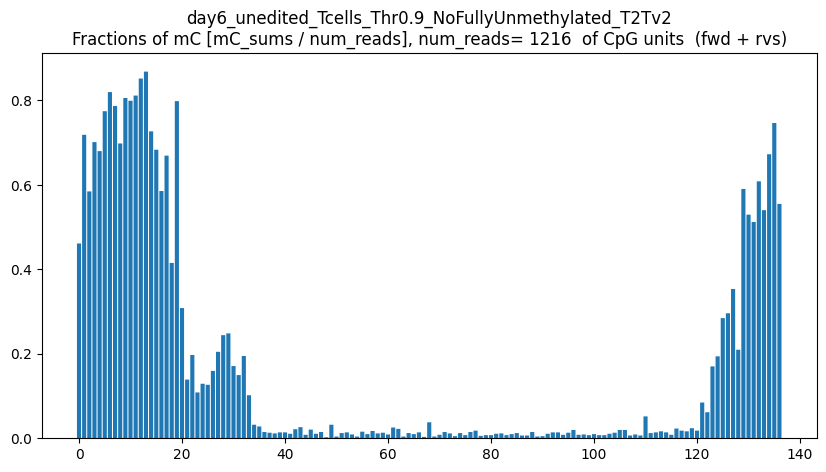

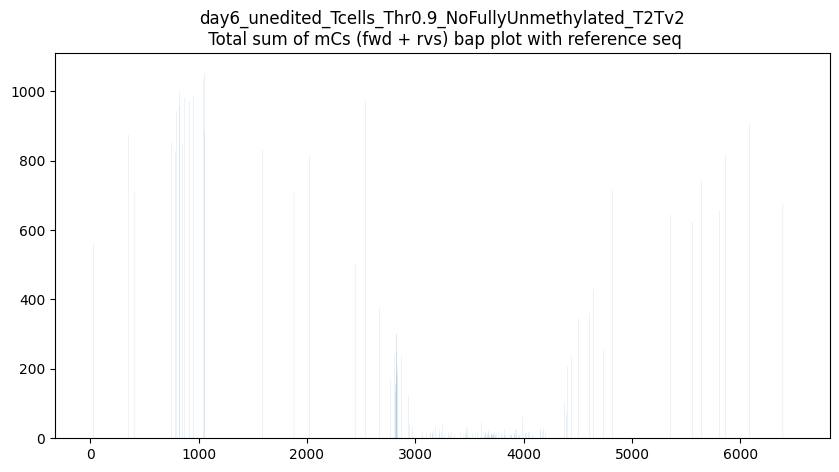

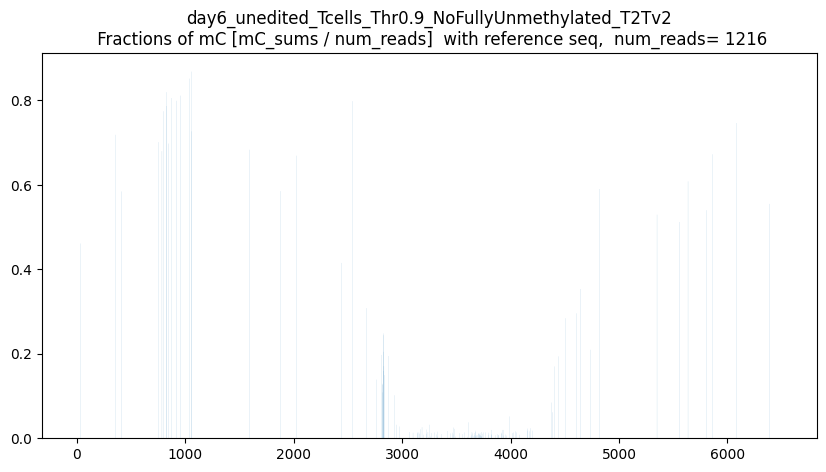

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



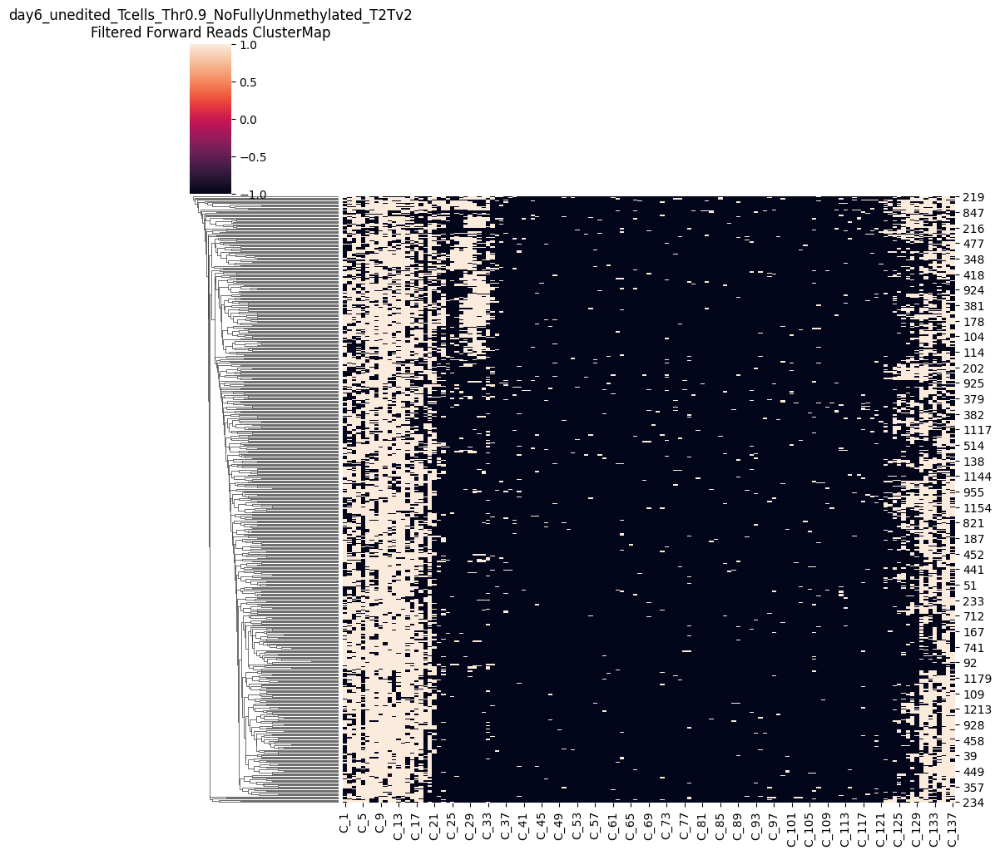

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



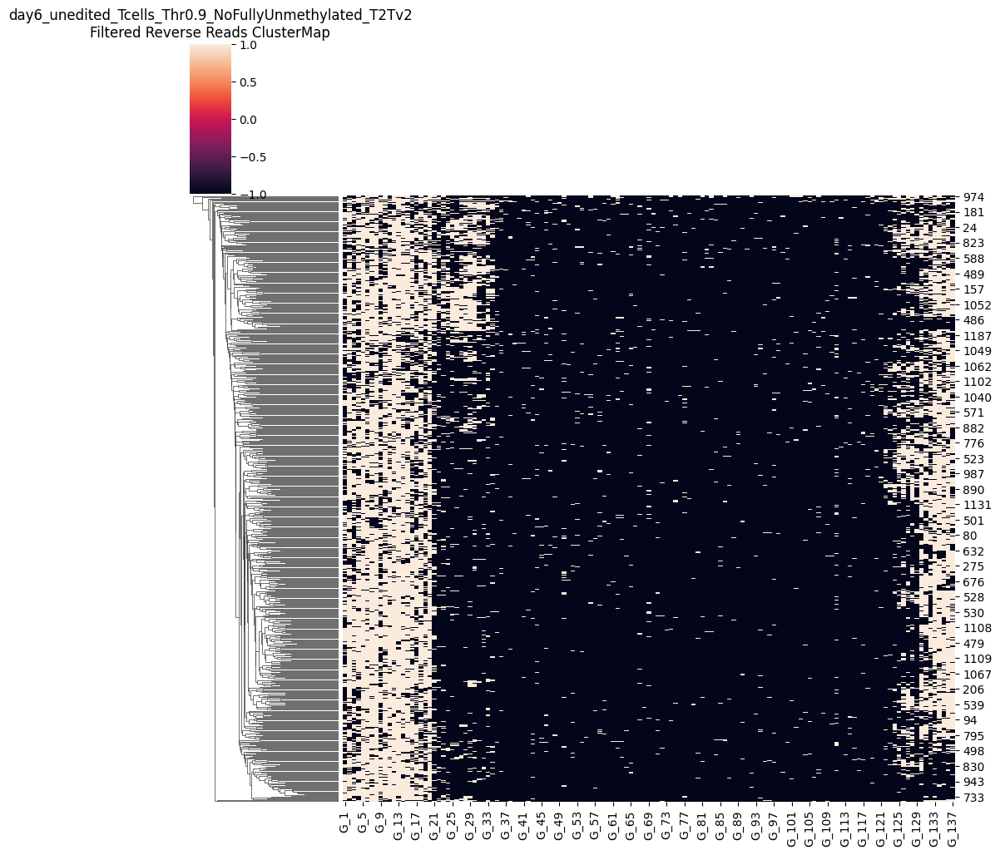

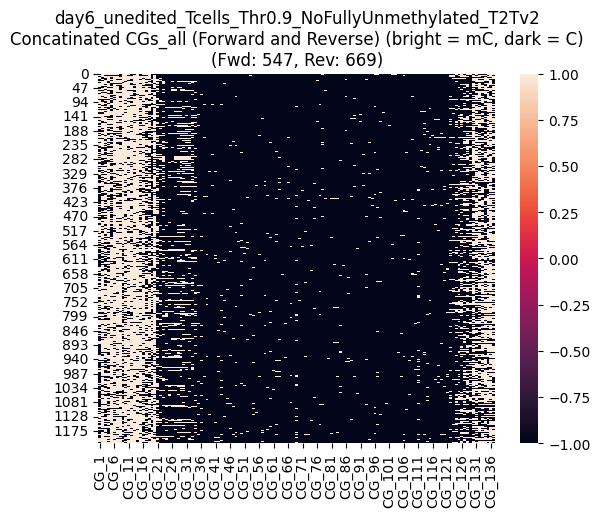

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



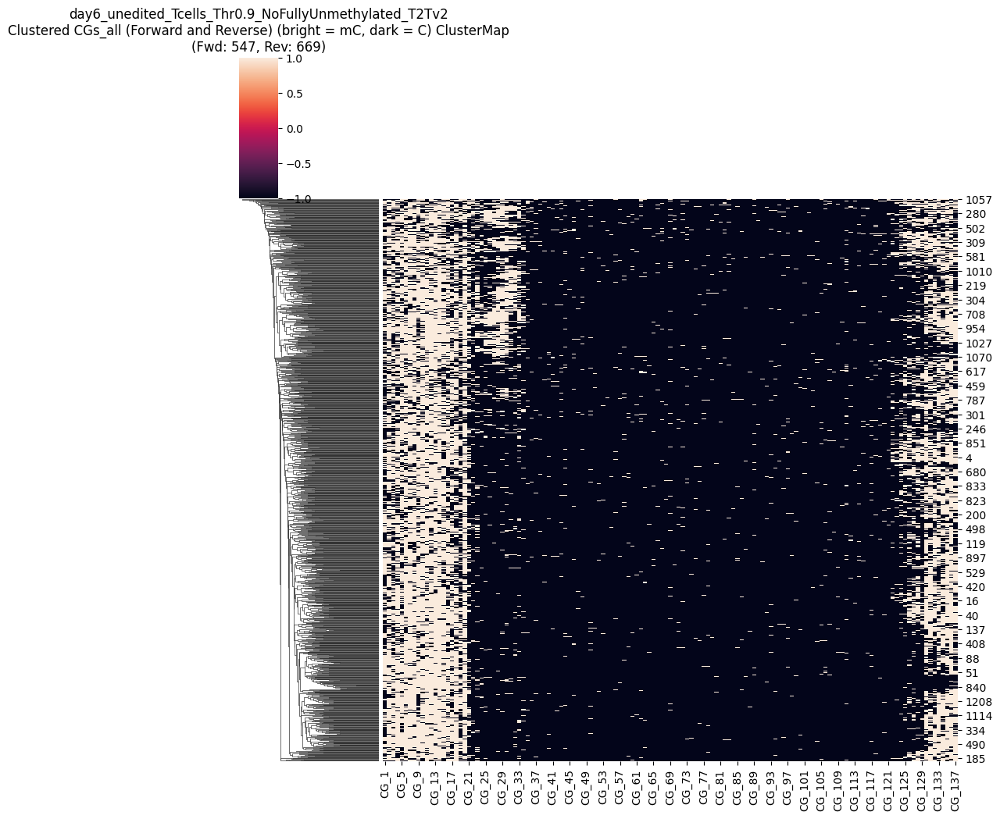

CGs_all saved as CG_137_removed_low80_methylated_padded_reads_day6_unedited_Tcells_Thr0.9_NoFullyUnmethylated_T2Tv2_mCthresh0.9_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD547_numRVS669.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


In [ ]:
threshold_percent = 80
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np
 
padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
if padded_reads is not None:
    plot_padded_reads(padded_reads, ref_seq_list)
    save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)


# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")

CGs_all_unedited_mc09_remove_low80 = CGs_all
CGs_all_unedited_mc09_remove_low80

Mean methylated CGs per read: 22.0
Maximum methylated CGs per read: 45.0
Threshold (70% of max): 15.40
Original number of reads: 1592
Number of reads after filtering: 1342
Removed 250 reads


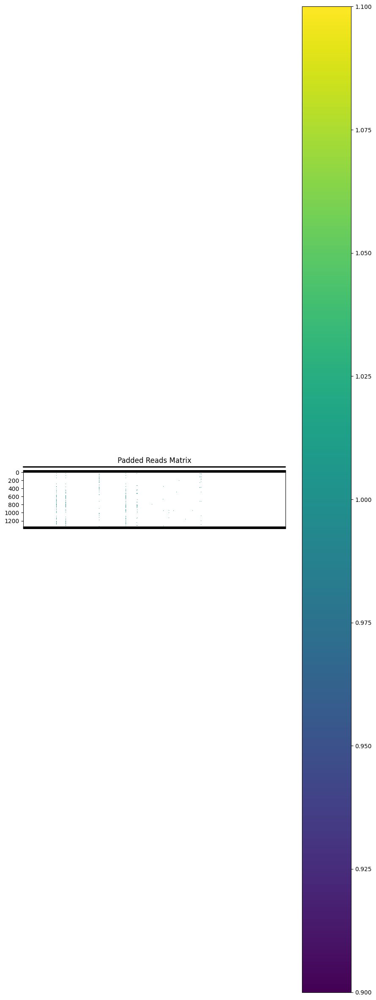

Padded reads saved to removed_low70_methylated_padded_reads_day6_unedited_Tcells_Thr0.9_NoFullyUnmethylated_T2Tv2_mCthresh0.9_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


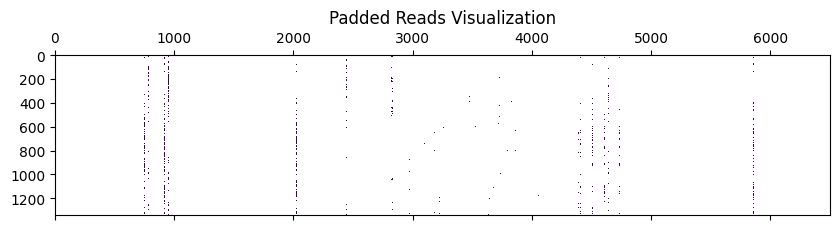

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

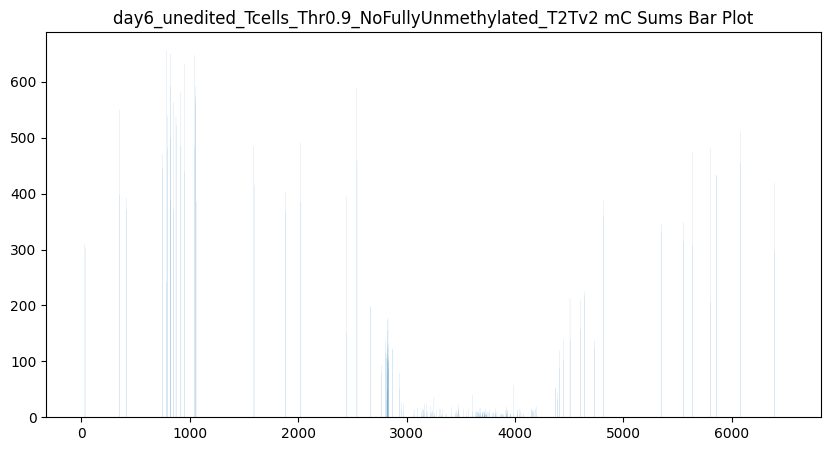

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


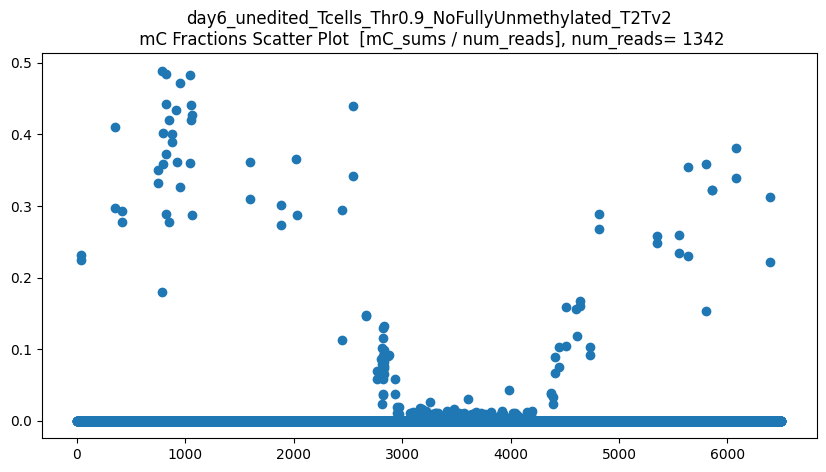

len(CGs_all) = 1342
CGs_all.shape = (1342, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


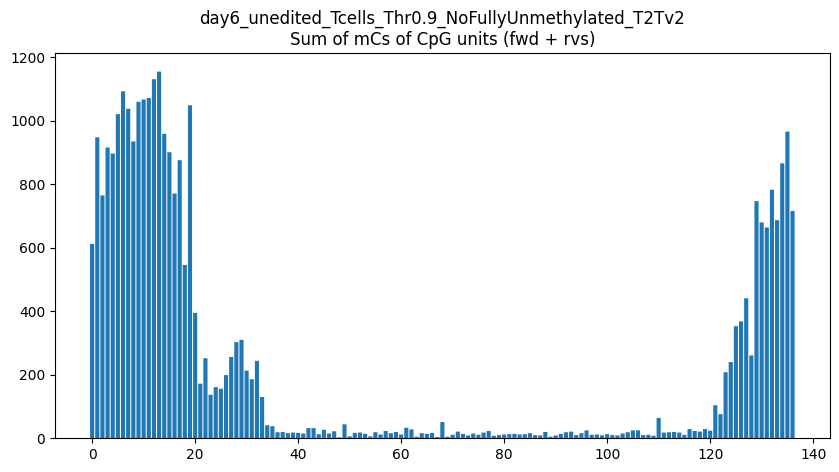

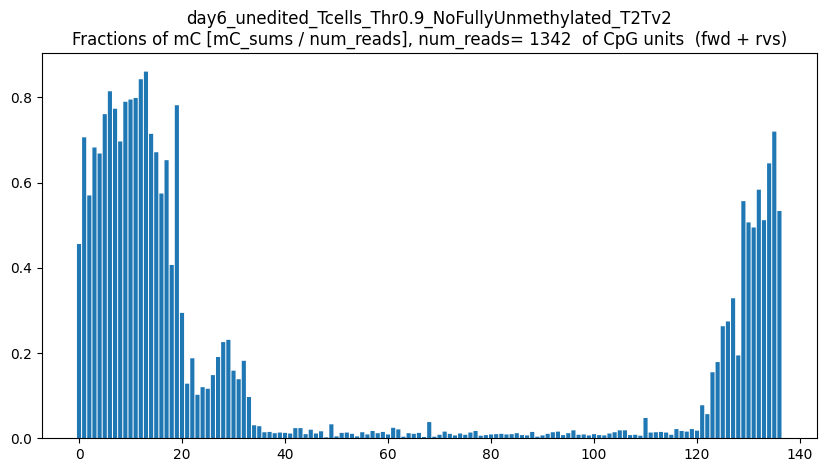

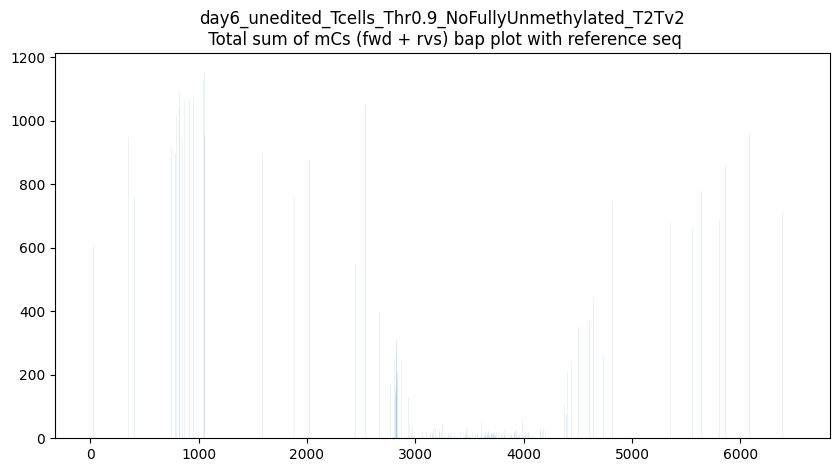

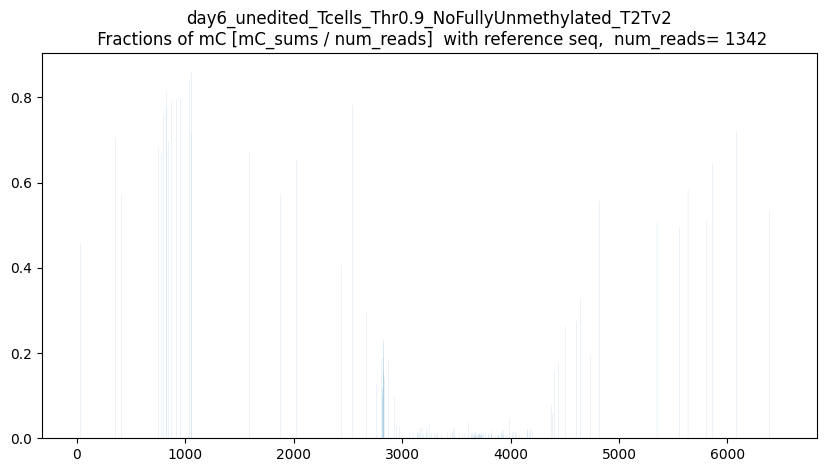

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



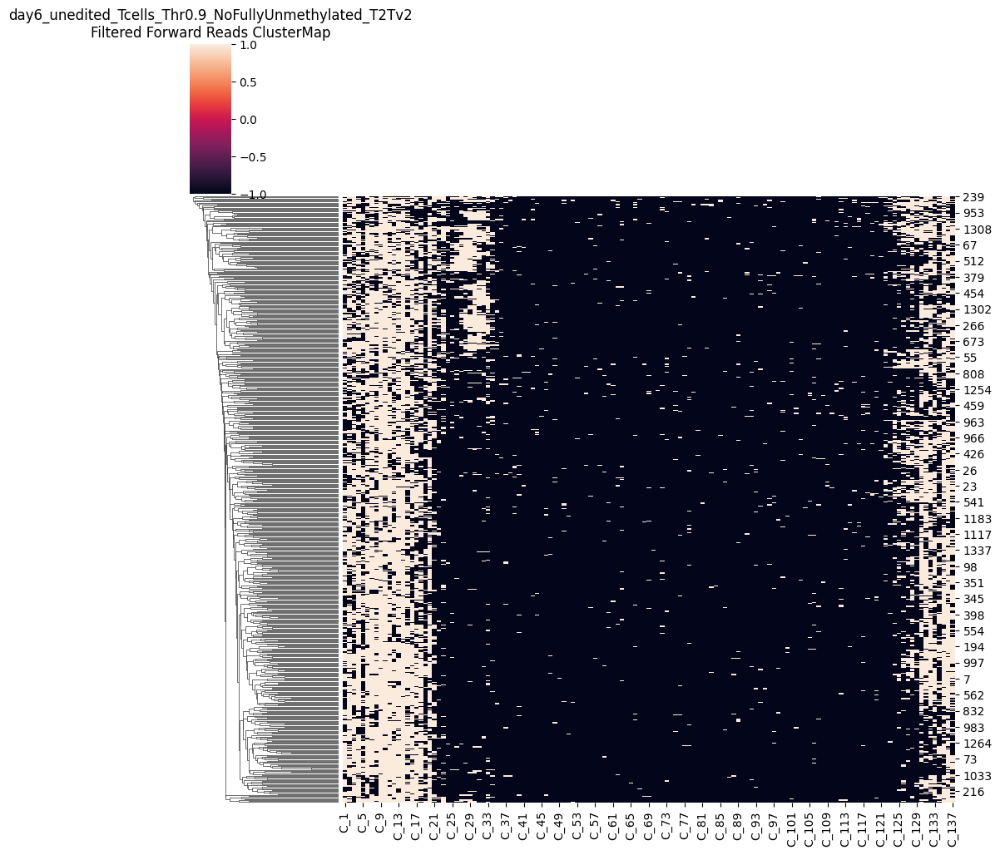

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



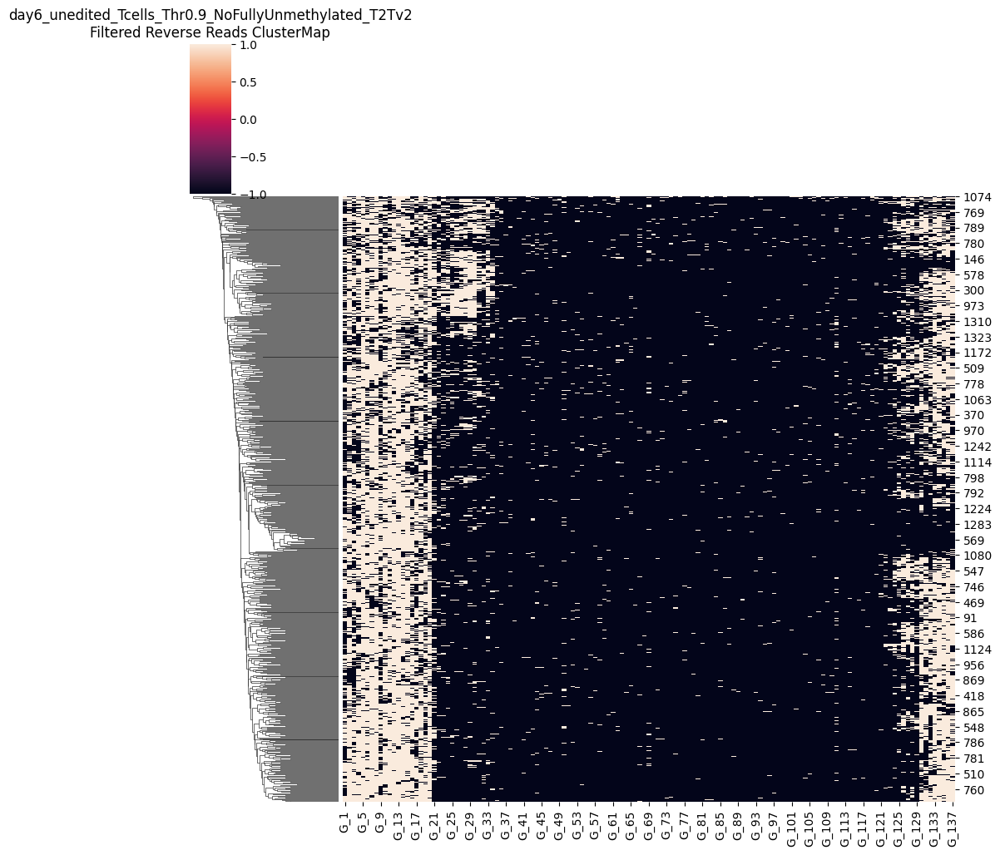

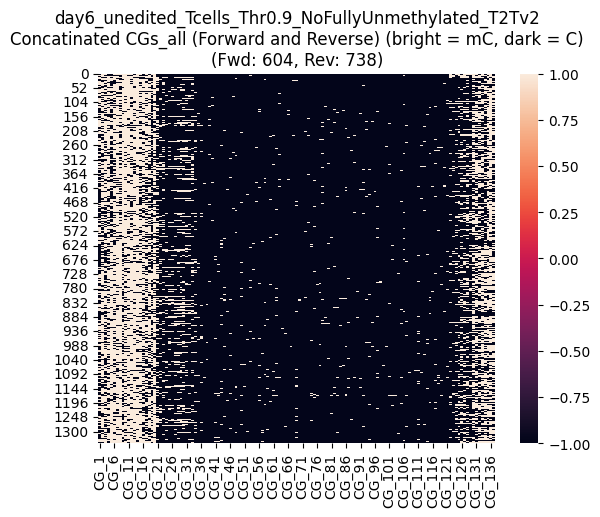

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



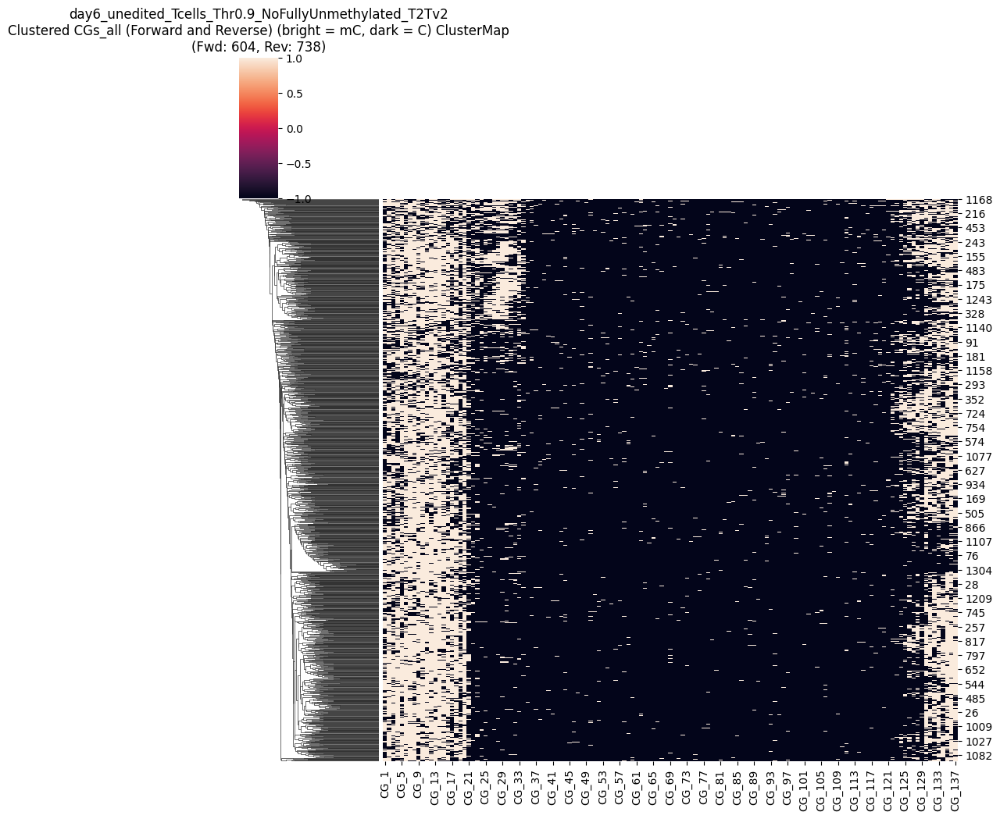

CGs_all saved as CG_137_removed_low70_methylated_padded_reads_day6_unedited_Tcells_Thr0.9_NoFullyUnmethylated_T2Tv2_mCthresh0.9_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD604_numRVS738.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


In [ ]:
threshold_percent = 70
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np
 
padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
if padded_reads is not None:
    plot_padded_reads(padded_reads, ref_seq_list)
    save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)


# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")

CGs_all_unedited_mc09_remove_low70 = CGs_all
CGs_all_unedited_mc09_remove_low70  

Mean methylated CGs per read: 22.0
Maximum methylated CGs per read: 45.0
Threshold (50% of max): 11.00
Original number of reads: 1592
Number of reads after filtering: 1517
Removed 75 reads


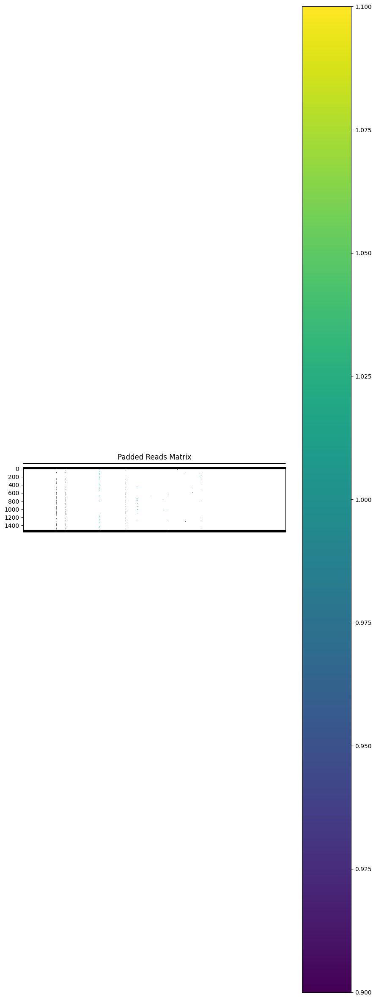

Padded reads saved to removed_low50_methylated_padded_reads_day6_unedited_Tcells_Thr0.9_NoFullyUnmethylated_T2Tv2_mCthresh0.9_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


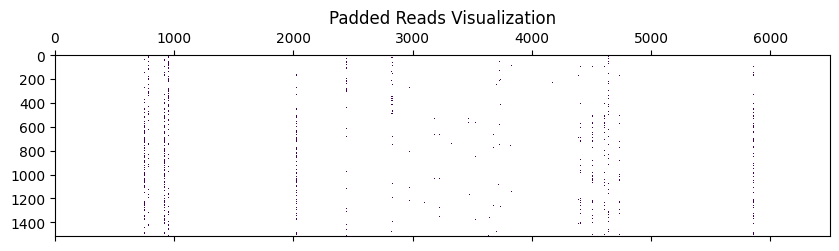

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

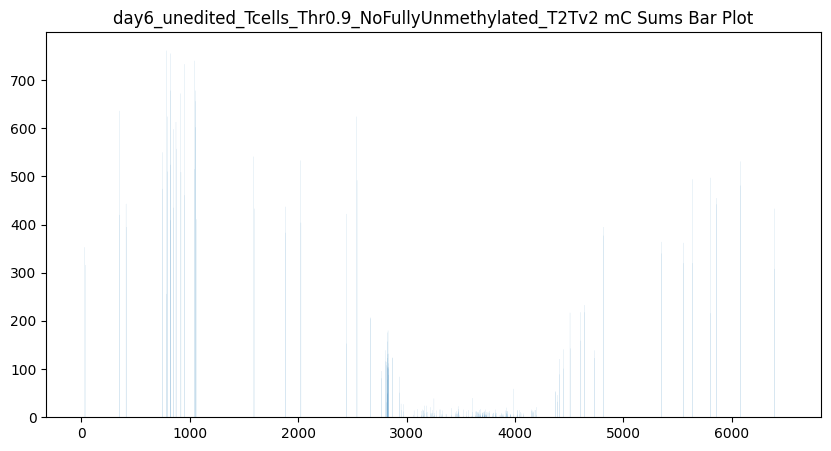

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


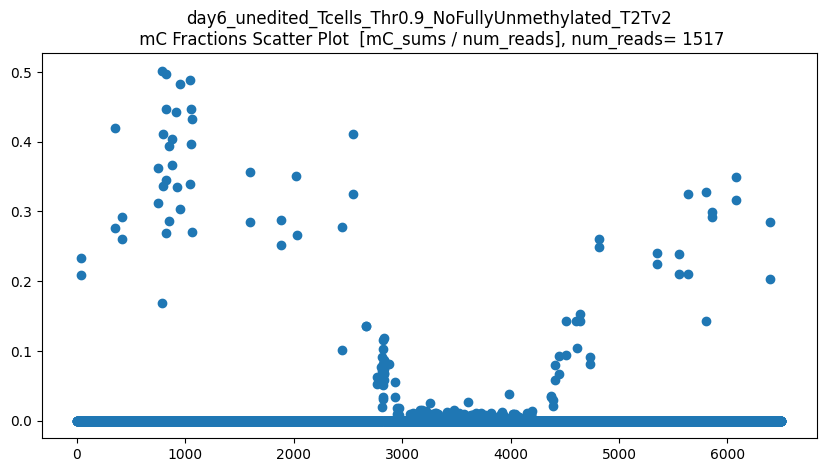

len(CGs_all) = 1517
CGs_all.shape = (1517, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


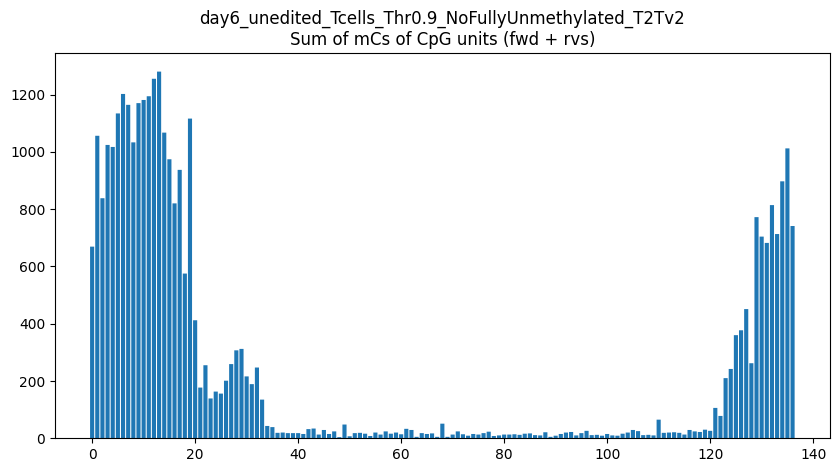

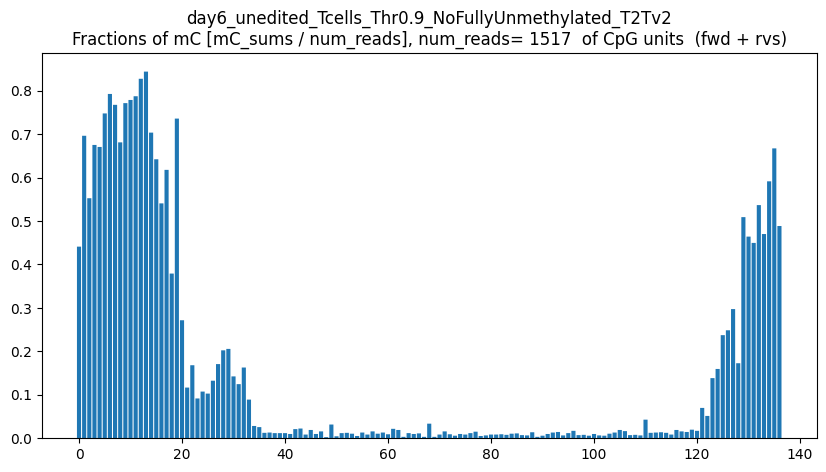

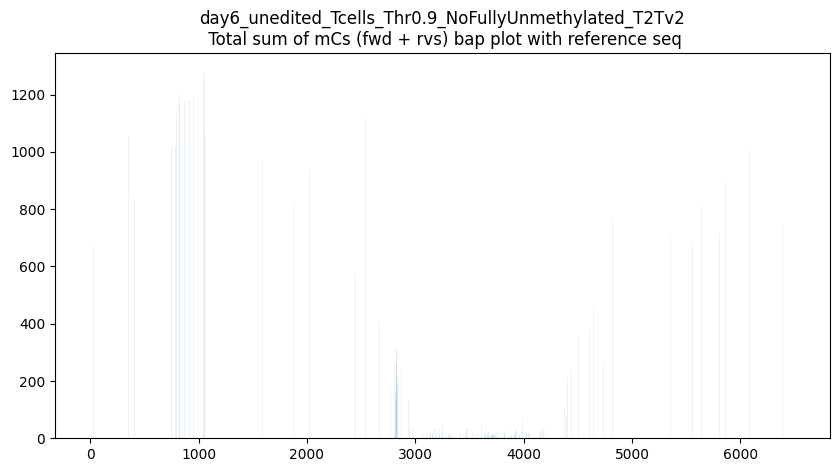

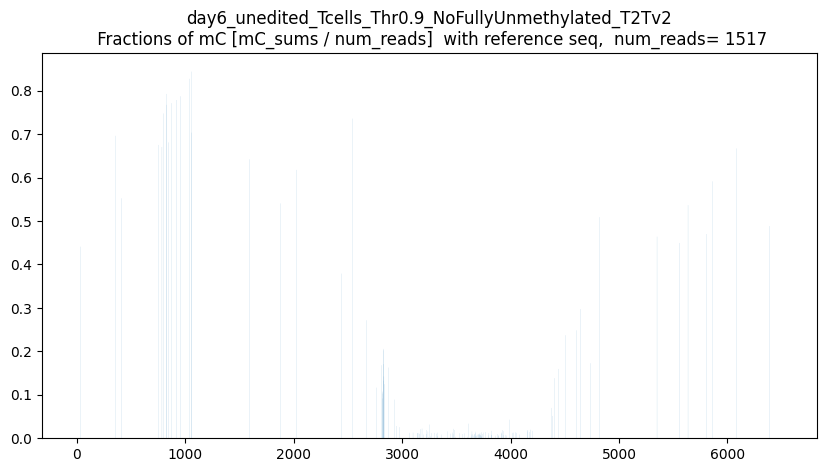

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



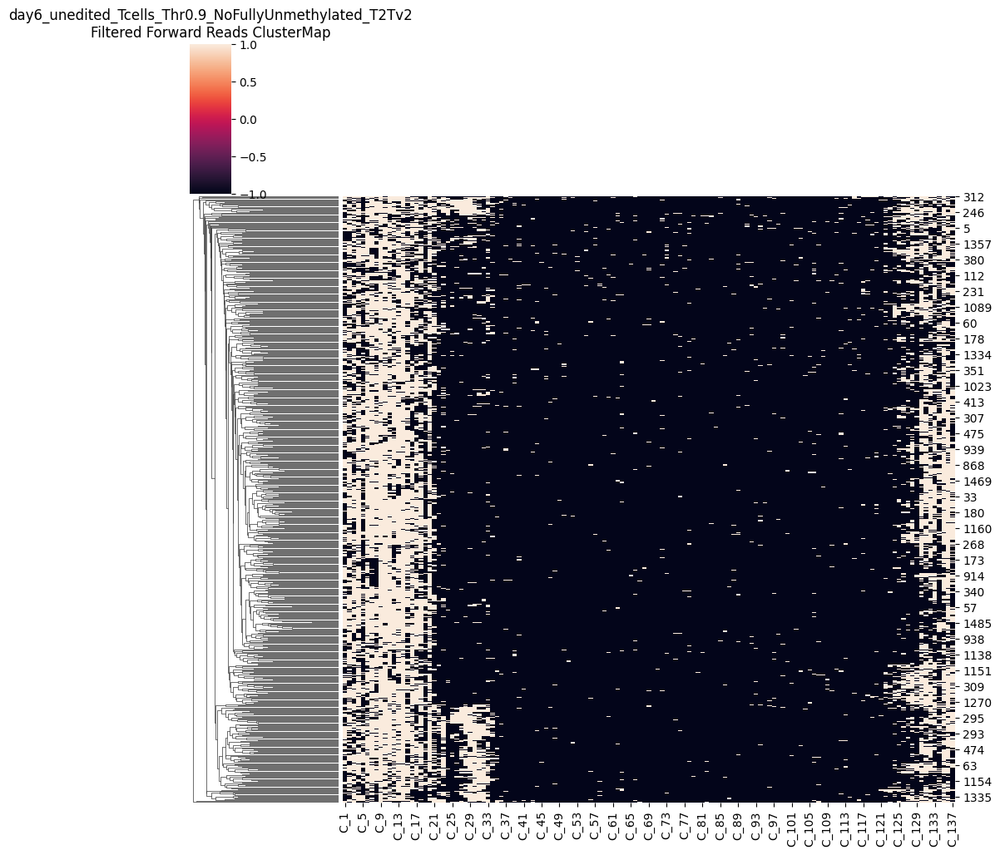

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



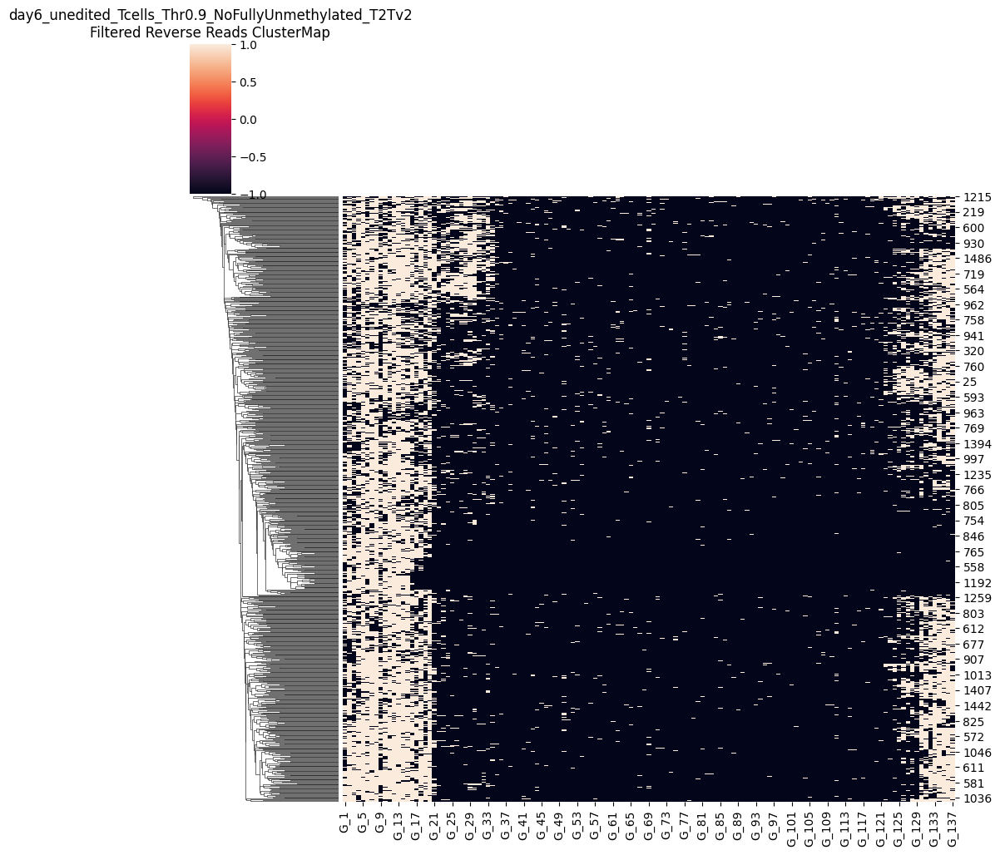

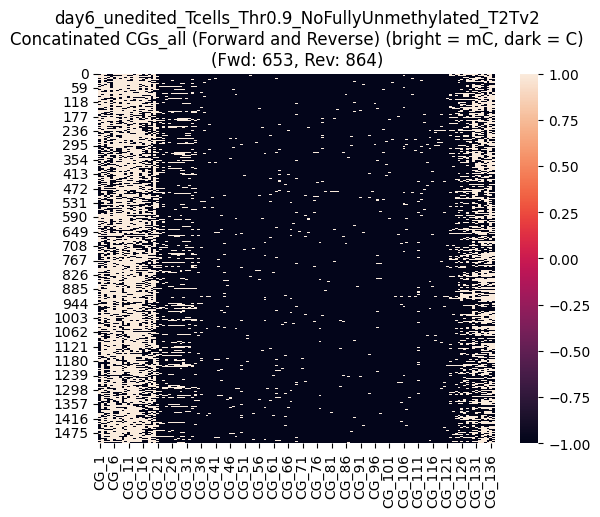

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



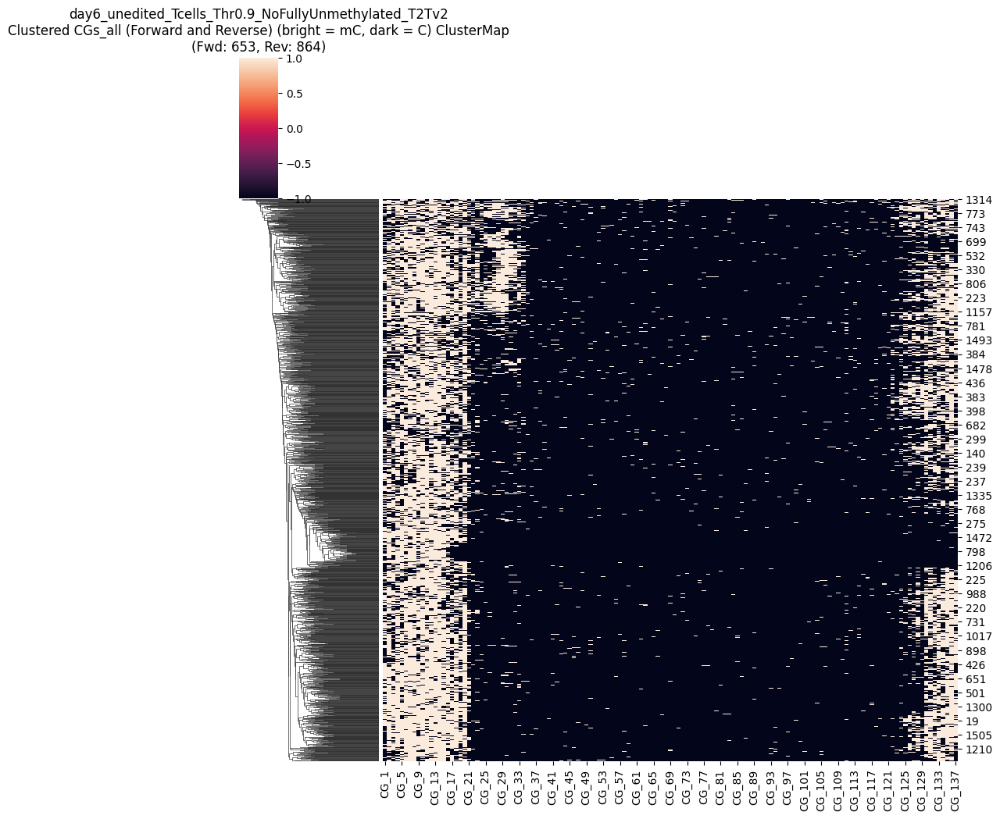

CGs_all saved as CG_137_removed_low50_methylated_padded_reads_day6_unedited_Tcells_Thr0.9_NoFullyUnmethylated_T2Tv2_mCthresh0.9_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD653_numRVS864.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


In [49]:
threshold_percent = 50
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np
 
padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
if padded_reads is not None:
    plot_padded_reads(padded_reads, ref_seq_list)
    save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)


# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")

CGs_all_unedited_mc09_remove_low50 = CGs_all
CGs_all_unedited_mc09_remove_low50 



Mean methylated CGs per read: 22.0
Maximum methylated CGs per read: 45.0
Threshold (10% of max): 2.20
Original number of reads: 1592
Number of reads after filtering: 1575
Removed 17 reads


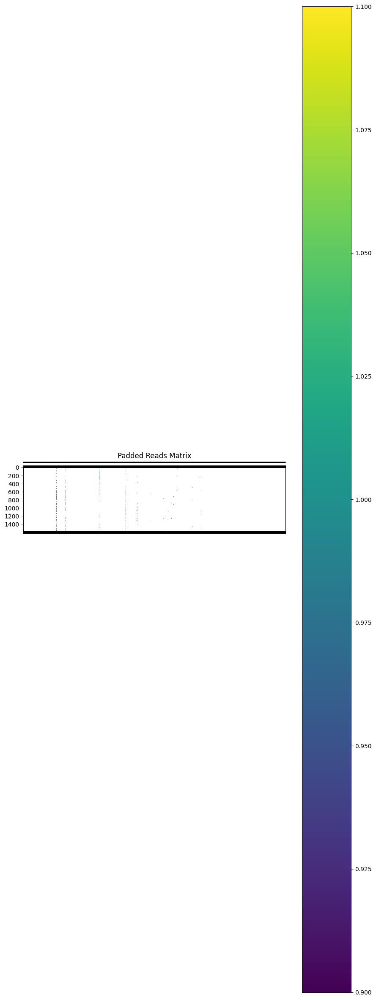

Padded reads saved to removed_low10_methylated_padded_reads_day6_unedited_Tcells_Thr0.9_NoFullyUnmethylated_T2Tv2_mCthresh0.9_t2t_v2_0_chr1:206583354-206589854_2025-08-03.npy
Padded reads loaded successfully.


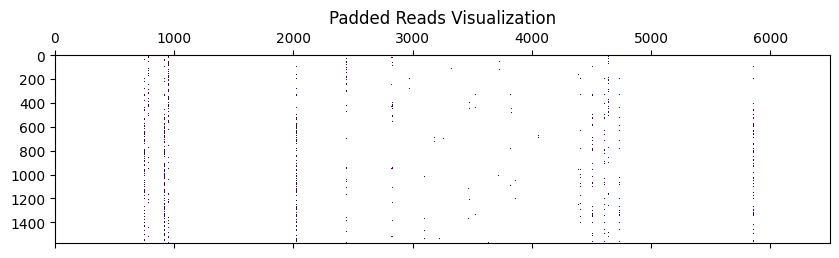

Visualization completed.
Region length: 6500
GTCATTGTATGGTTCCTGGGATAAGAGTAAGAACCGTGGTCCCTTGCTCTGTCAAAATCATAAACCTATTTTCTTTGTATTTTGACTTAATTACATAAGCTTGTTTTGGATTGGAAGGTCTATAGAGACTATTTTAGTGCCAAATGCTATTTAATCAATGCAGAAATAAGCCCTTGAGAGGTGCAGTGACTCAGCTGAGGACACACTGATAGTTTCTGGTAGATAAGTATGAAGCCTTGGAACTACTTCTCATATCATAAGCCCCTGGGTTCCCAAATCACCTCCCCAAGTACCTAATTCATCATCCTCTGCATACAAGAAATTTTTGCTCATTCCAATAAAAAGAATGTAGTACGGCAGGACAGGAGAAGTACAGGTTTTGGAATCAAACTAGGTTTAGATTCTGACCTGGTCGCTAGTTAGTGCATGGGCTTTGGTAAACAGCCTCTCAGCCTGTTTCCTTGTCTGCAAAATATGGATAGTTATCTTCACTTCATGAAGTTGTGTTGGTGAAATGGTATAATGTGTATAAAGCAACTGGAACACAACAAATGAGGCCATTTATTTAAAATAATCTTTAGTAAGTTATAAATTCACATATTTGCTTTTTTCTGAGGAATGCTTAGATTTTATCATAGATCTCTTTTCTAAATTGAGTAAATACATAGTGGATTTCTTTGTTTCCTTCCCCTCAGAATGTTGAAATTTGGCTGATTGTAACTATTACTTAAGACTCTATCCAGTAATTGTTCGTAAAATTTCTTTTCTTTTTTTTTTTTTGAGACGGAGTTTTGCTCTCGTCCCCCAGGCTGGAGTGCAATGGCGCGATCTTGGCTCACTGCAACCTCCGCCTCCCAGGTTCAAGTGATTCTCCCGCCTCAGCCTCCCAAGTAGCTGGGATTACAGGCACCTGCCACAACGCCCAGCCAATTTTTGTATTTTTAGTAGAGACGGG

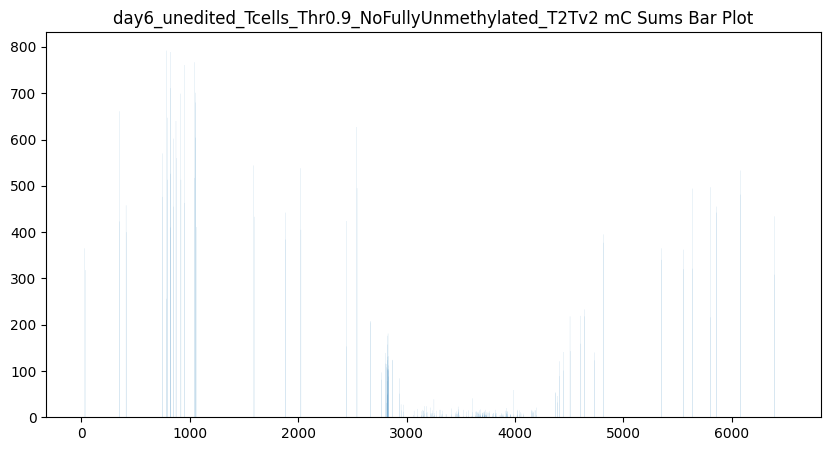

(mC_sums / len(CGs_all) = [0. 0. 0. ... 0. 0. 0.]


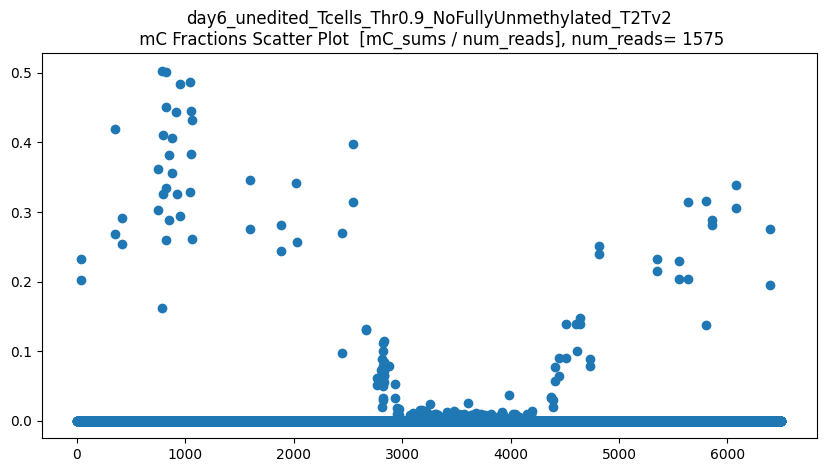

len(CGs_all) = 1575
CGs_all.shape = (1575, 137)
len(CGs_all_on_fwd_C_sums) = 6500
CGs_all_on_fwd_C_sums.shape = (6500,)


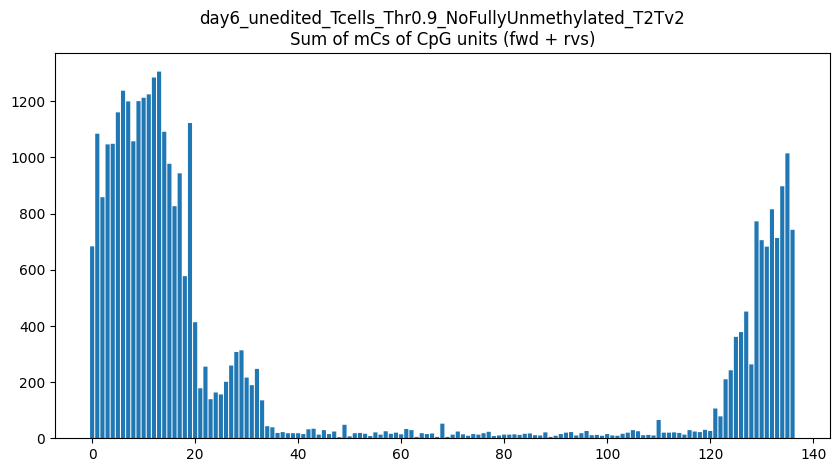

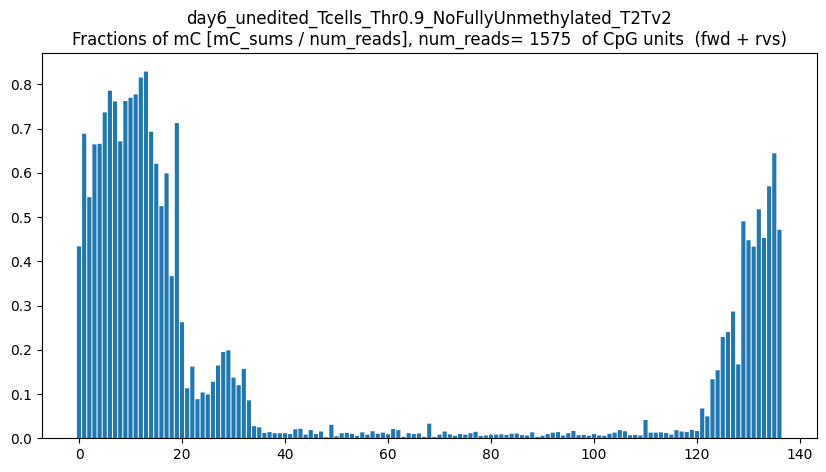

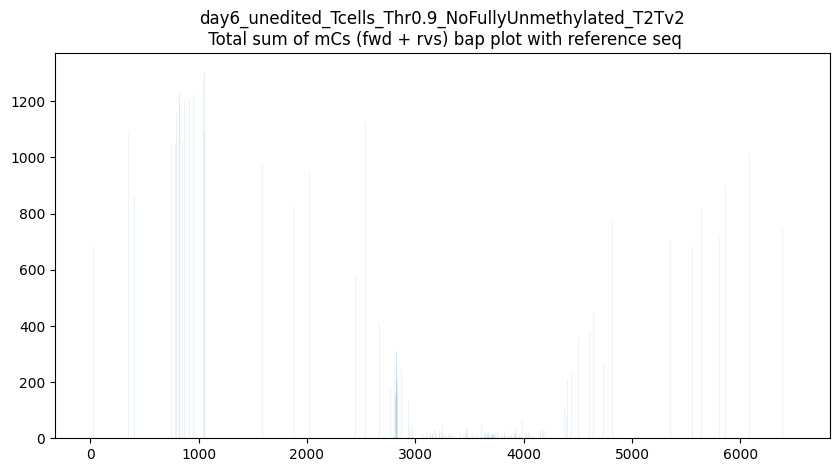

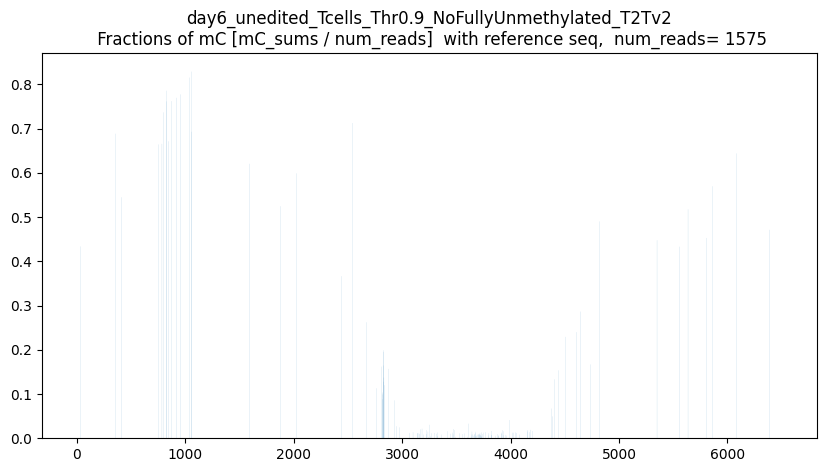

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



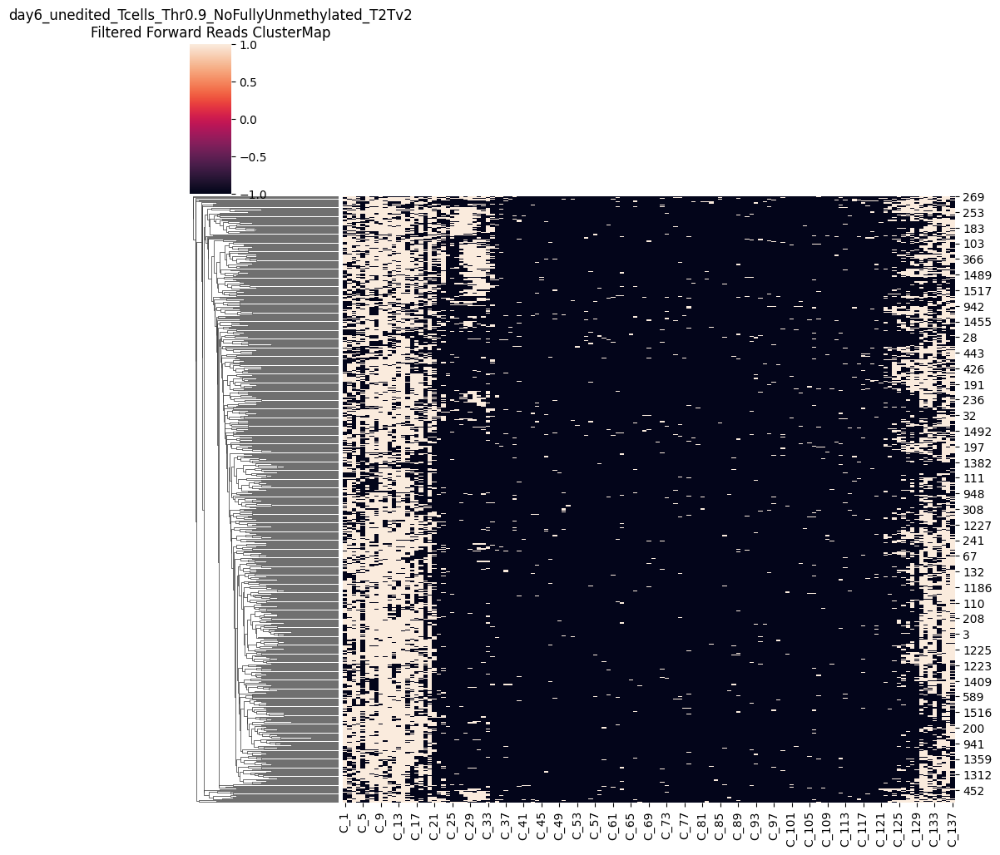

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



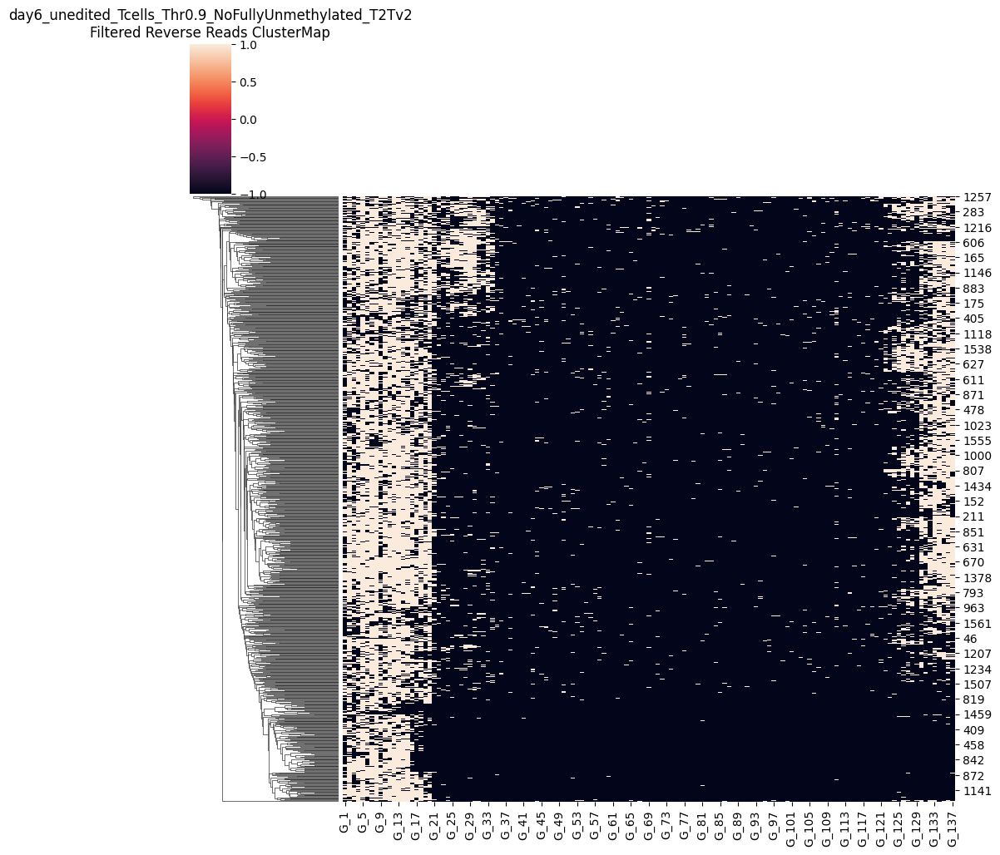

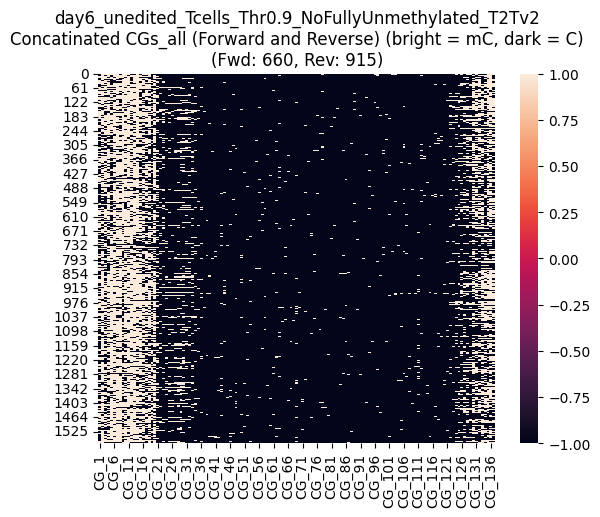

/home/michalula/miniconda3/envs/dimelo_v2_modkit_parsing/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



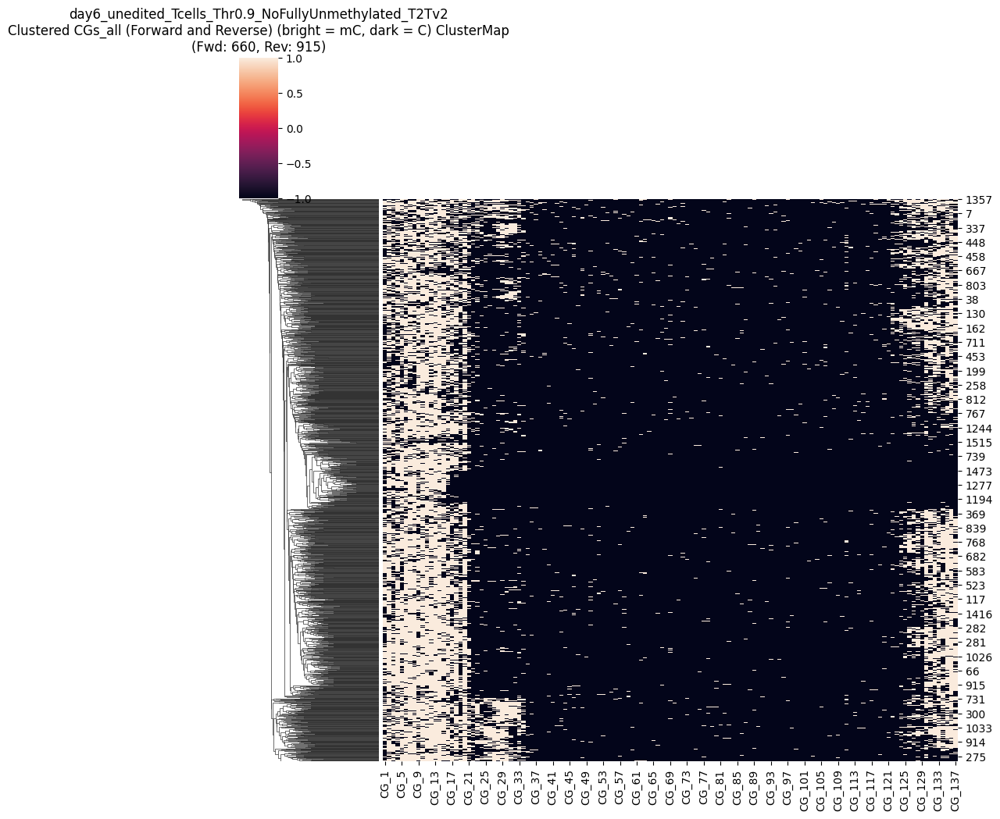

CGs_all saved as CG_137_removed_low10_methylated_padded_reads_day6_unedited_Tcells_Thr0.9_NoFullyUnmethylated_T2Tv2_mCthresh0.9_t2t_v2_0_chr1:206583354-206589854_2025-08-03_units_combined_numFWD660_numRVS915.npy in dimelo_v2_output
Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)


,CG_1,CG_2,CG_3,CG_4,CG_5,CG_6,CG_7,CG_8,CG_9,CG_10,...,CG_128,CG_129,CG_130,CG_131,CG_132,CG_133,CG_134,CG_135,CG_136,CG_137
0,1.0,1.0,NaN,1.0,NaN,1.0,NaN,1.0,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,1.0,1.0,NaN,NaN
1,NaN,1.0,1.0,1.0,NaN,1.0,1.0,1.0,NaN,NaN,...,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,1.0,NaN
2,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0
3,NaN,1.0,1.0,NaN,NaN,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,NaN,1.0,NaN,1.0,1.0,NaN
4,NaN,1.0,1.0,1.0,1.0,1.0,1.0,NaN,1.0,1.0,...,1.0,1.0,NaN,1.0,NaN,NaN,NaN,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1570,NaN,1.0,1.0,NaN,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,NaN
1571,NaN,NaN,1.0,NaN,1.0,1.0,1.0,1.0,1.0,1.0,...,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1572,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,...,NaN,NaN,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0
1573,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,1.0,1.0,NaN,1.0,1.0,1.0,NaN


In [50]:
threshold_percent = 10
filtered_reads_df, methylation_counts = remove_low_methylated_reads(reads_df, threshold_percent=threshold_percent)
filtered_reads_df

save_padded_reads_name_np_remove_low_methylated = 'removed_low'+str(threshold_percent)+'_methylated_' + save_padded_reads_name_np
 
padded_reads = create_padded_reads(filtered_reads_df, regions_dict, region_length)
if padded_reads is not None:
    plot_padded_reads(padded_reads, ref_seq_list)
    save_padded_reads(padded_reads, output_dir, save_padded_reads_name_np_remove_low_methylated)


# Processing and visualizing CpG units on forward and reverse strands 
try: 

    # Process pipeline
    CGs_all, C_fwd_df, G_revs_df, padded_reads_df, CG_pair_idx, CG_coordinates, CG_info_df = analize_forward_reverse_CGs_pipeline(
        experiment_name=experiment_name, save_folder_path=output_dir, 
        save_padded_reads_name_np=save_padded_reads_name_np_remove_low_methylated, 
        ref_genome_file=ref_genome_path, region_chr=region_chr, region_start=region_start, region_end=region_end
    )

    print("Pipeline executed successfully (analize_forward_reverse_CGs_pipeline function)")
    # return CGs_all, C_fwd_df, G_revs_df, padded_reads_df

except Exception as e:
    print(f"Error in main pipeline (analize_forward_reverse_CGs_pipeline function): {e}")

CGs_all_unedited_mc09_remove_low10 = CGs_all
CGs_all_unedited_mc09_remove_low10

In [ ]:
1+1

# Compare frequencies

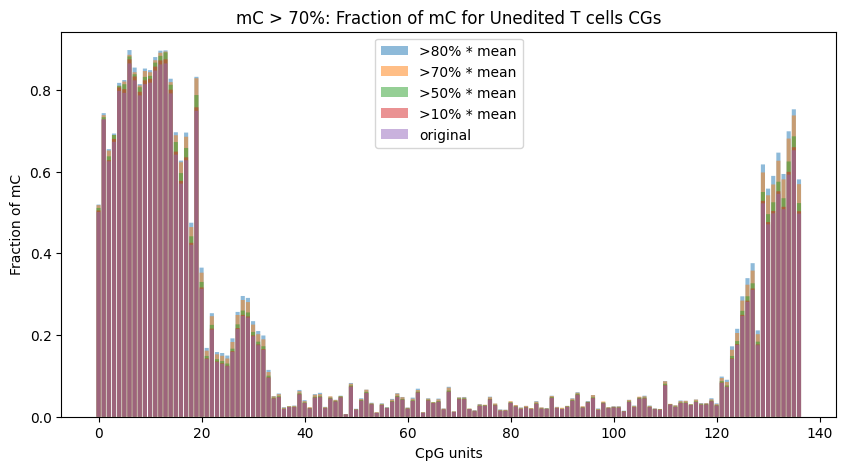

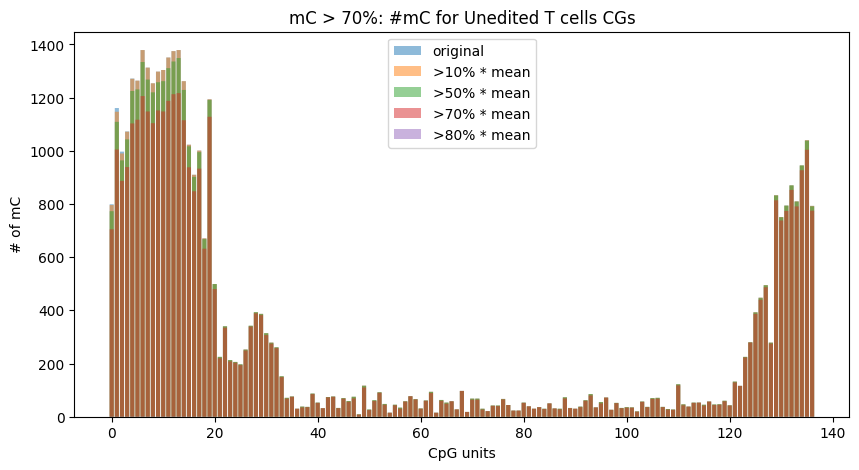

In [57]:
# CGs_all_unedited_remove_low80 vs. CGs_all_unedited_remove_low50 

# import matplotlib.pyplot as plt

# # Calculate the fraction of mC for both DataFrames
# CGs_all_unedited_cut['fraction_mC'] = CGs_all_unedited_cut['mC_sums'] / CGs_all_unedited_cut['num_reads']
# CGs_all_silenced_cut['fraction_mC'] = CGs_all_silenced_cut['mC_sums'] / CGs_all_silenced_cut['num_reads']


CGs_all_unedited_cut_sums = np.nansum(CGs_all_unedited_mc07_remove_low80.values, axis=0) 
CGs_all_unedited_cut_frac = CGs_all_unedited_cut_sums  / len(CGs_all_unedited_mc07_remove_low80) 


CGs_all_unedited_remove_low70_sums = np.nansum(CGs_all_unedited_mc07_remove_low70.values, axis=0) 
CGs_all_unedited_remove_low70_frac = CGs_all_unedited_remove_low70_sums  / len(CGs_all_unedited_mc07_remove_low70) 


CGs_all_silenced_cut_sums = np.nansum(CGs_all_unedited_mc07_remove_low50.values, axis=0) 
CGs_all_silenced_cut_frac = CGs_all_silenced_cut_sums  /len(CGs_all_unedited_mc07_remove_low50) 


CGs_all_unedited_remove_low10_sums = np.nansum(CGs_all_unedited_mc07_remove_low10.values, axis=0) 
CGs_all_unedited_remove_low10_frac = CGs_all_unedited_remove_low10_sums  / len(CGs_all_unedited_mc07_remove_low10) 

CGs_all_silenced_full_sums = np.nansum(CGs_all_unedited_mc07_original.values, axis=0) 
CGs_all_silenced_full_frac = CGs_all_silenced_full_sums / len(CGs_all_unedited_mc07_original) 



# Plot the fraction mC for CGs_all_unedited_cut
# plt.bar(CGs_all_unedited_cut.index, CGs_all_unedited_cut_frac, alpha=0.5, label='Unedited')

plt.figure(figsize=(10, 5))
# Plot the fraction mC for CGs_all_silenced_cut



plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_unedited_cut_frac, snap=False, alpha=0.5, label='>80% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low70_sums)), CGs_all_unedited_remove_low70_frac, snap=False, alpha=0.5, label='>70% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_silenced_cut_frac, snap=False, alpha=0.5, label='>50% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low10_sums)), CGs_all_unedited_remove_low10_frac, snap=False, alpha=0.5, label='>10% * mean')
plt.bar(np.arange(len(CGs_all_silenced_full_sums)), CGs_all_silenced_full_frac, snap=False, alpha=0.5, label='original')


# plt.title(f"{experiment_name}\nSum of mCs of CpG units (fwd + rvs)")
# plt.show()

# Add labels and title
plt.xlabel('CpG units')
plt.ylabel('Fraction of mC')
plt.title('mC > 70%: Fraction of mC for Unedited T cells CGs')
plt.legend()

# Show the plot
plt.show()
 

CGs_all_unedited_remove_low70_sums = np.nansum(CGs_all_unedited_mc07_remove_low70.values, axis=0) 
CGs_all_unedited_remove_low70_frac = CGs_all_unedited_remove_low70_sums # / len(CGs_all_unedited_mc07_remove_low70) 


CGs_all_silenced_cut_sums = np.nansum(CGs_all_unedited_mc07_remove_low50.values, axis=0) 
CGs_all_silenced_cut_frac = CGs_all_silenced_cut_sums # /len(CGs_all_unedited_mc07_remove_low50) 


CGs_all_unedited_remove_low10_sums = np.nansum(CGs_all_unedited_mc07_remove_low10.values, axis=0) 
CGs_all_unedited_remove_low10_frac = CGs_all_unedited_remove_low10_sums # / len(CGs_all_unedited_mc07_remove_low10) 

CGs_all_silenced_full_sums = np.nansum(CGs_all_unedited_mc07_original.values, axis=0) 
CGs_all_silenced_full_frac = CGs_all_silenced_full_sums # / len(CGs_all_unedited_mc07_original) 



# Plot the fraction mC for CGs_all_unedited_cut
# plt.bar(CGs_all_unedited_cut.index, CGs_all_unedited_cut_frac, alpha=0.5, label='Unedited')

plt.figure(figsize=(10, 5))
# Plot the fraction mC for CGs_all_silenced_cut


plt.bar(np.arange(len(CGs_all_silenced_full_sums)), CGs_all_silenced_full_frac, snap=False, alpha=0.5, label='original')
plt.bar(np.arange(len(CGs_all_unedited_remove_low10_sums)), CGs_all_unedited_remove_low10_frac, snap=False, alpha=0.5, label='>10% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_silenced_cut_frac, snap=False, alpha=0.5, label='>50% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low70_sums)), CGs_all_unedited_remove_low70_frac, snap=False, alpha=0.5, label='>70% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_unedited_cut_frac, snap=False, alpha=0.5, label='>80% * mean')



# plt.title(f"{experiment_name}\nSum of mCs of CpG units (fwd + rvs)")
# plt.show()

# Add labels and title
plt.xlabel('CpG units')
plt.ylabel('# of mC')
plt.title('mC > 70%: #mC for Unedited T cells CGs')
plt.legend()

# Show the plot
plt.show()

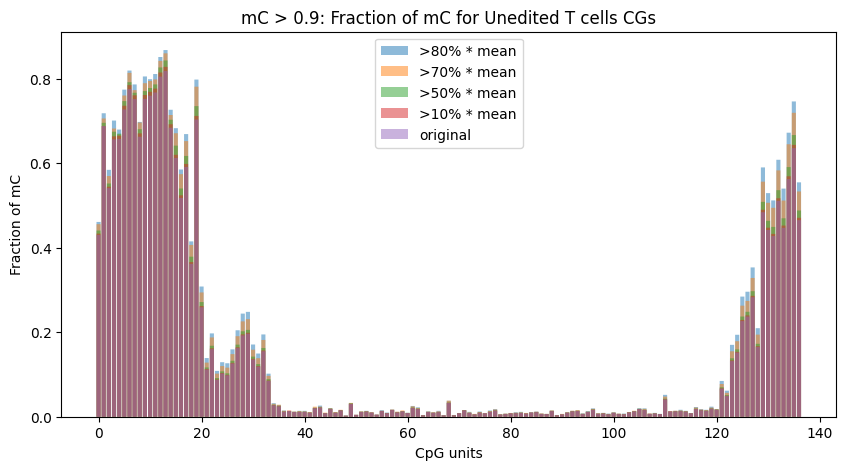

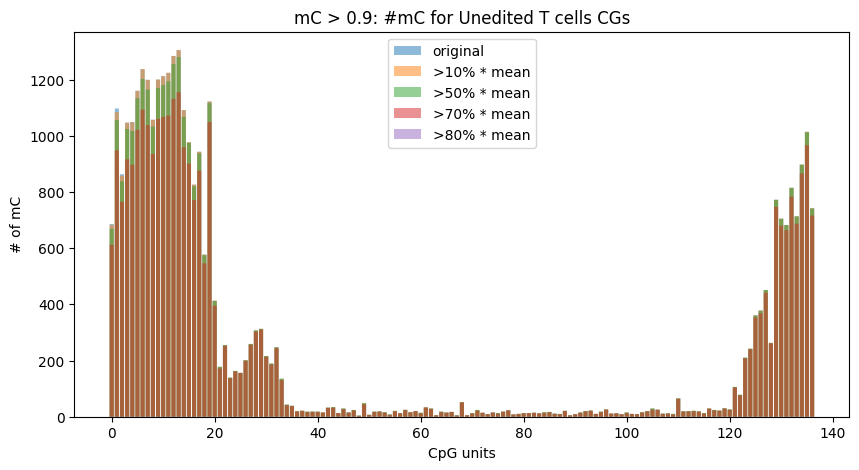

In [55]:
# CGs_all_unedited_remove_low80 vs. CGs_all_unedited_remove_low50 

# import matplotlib.pyplot as plt

# # Calculate the fraction of mC for both DataFrames
# CGs_all_unedited_cut['fraction_mC'] = CGs_all_unedited_cut['mC_sums'] / CGs_all_unedited_cut['num_reads']
# CGs_all_silenced_cut['fraction_mC'] = CGs_all_silenced_cut['mC_sums'] / CGs_all_silenced_cut['num_reads']


CGs_all_unedited_cut_sums = np.nansum(CGs_all_unedited_mc09_remove_low80.values, axis=0) 
CGs_all_unedited_cut_frac = CGs_all_unedited_cut_sums  / len(CGs_all_unedited_mc09_remove_low80) 


CGs_all_unedited_remove_low70_sums = np.nansum(CGs_all_unedited_mc09_remove_low70.values, axis=0) 
CGs_all_unedited_remove_low70_frac = CGs_all_unedited_remove_low70_sums  / len(CGs_all_unedited_mc09_remove_low70) 


CGs_all_silenced_cut_sums = np.nansum(CGs_all_unedited_mc09_remove_low50.values, axis=0) 
CGs_all_silenced_cut_frac = CGs_all_silenced_cut_sums  /len(CGs_all_unedited_mc09_remove_low50) 


CGs_all_unedited_remove_low10_sums = np.nansum(CGs_all_unedited_mc09_remove_low10.values, axis=0) 
CGs_all_unedited_remove_low10_frac = CGs_all_unedited_remove_low10_sums  / len(CGs_all_unedited_mc09_remove_low10) 

CGs_all_silenced_full_sums = np.nansum(CGs_all_unedited_mc09_original.values, axis=0) 
CGs_all_silenced_full_frac = CGs_all_silenced_full_sums / len(CGs_all_unedited_mc07_original) 



# Plot the fraction mC for CGs_all_unedited_cut
# plt.bar(CGs_all_unedited_cut.index, CGs_all_unedited_cut_frac, alpha=0.5, label='Unedited')

plt.figure(figsize=(10, 5))
# Plot the fraction mC for CGs_all_silenced_cut



plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_unedited_cut_frac, snap=False, alpha=0.5, label='>80% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low70_sums)), CGs_all_unedited_remove_low70_frac, snap=False, alpha=0.5, label='>70% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_silenced_cut_frac, snap=False, alpha=0.5, label='>50% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low10_sums)), CGs_all_unedited_remove_low10_frac, snap=False, alpha=0.5, label='>10% * mean')
plt.bar(np.arange(len(CGs_all_silenced_full_sums)), CGs_all_silenced_full_frac, snap=False, alpha=0.5, label='original')


# plt.title(f"{experiment_name}\nSum of mCs of CpG units (fwd + rvs)")
# plt.show()

# Add labels and title
plt.xlabel('CpG units')
plt.ylabel('Fraction of mC')
plt.title('mC > 0.9: Fraction of mC for Unedited T cells CGs')
plt.legend()

# Show the plot
plt.show()
 

CGs_all_unedited_remove_low70_sums = np.nansum(CGs_all_unedited_mc09_remove_low70.values, axis=0) 
CGs_all_unedited_remove_low70_frac = CGs_all_unedited_remove_low70_sums # / len(CGs_all_unedited_mc07_remove_low70) 


CGs_all_silenced_cut_sums = np.nansum(CGs_all_unedited_mc09_remove_low50.values, axis=0) 
CGs_all_silenced_cut_frac = CGs_all_silenced_cut_sums # /len(CGs_all_unedited_mc07_remove_low50) 


CGs_all_unedited_remove_low10_sums = np.nansum(CGs_all_unedited_mc09_remove_low10.values, axis=0) 
CGs_all_unedited_remove_low10_frac = CGs_all_unedited_remove_low10_sums # / len(CGs_all_unedited_mc07_remove_low10) 

CGs_all_silenced_full_sums = np.nansum(CGs_all_unedited_mc09_original.values, axis=0) 
CGs_all_silenced_full_frac = CGs_all_silenced_full_sums # / len(CGs_all_unedited_mc07_original) 



# Plot the fraction mC for CGs_all_unedited_cut
# plt.bar(CGs_all_unedited_cut.index, CGs_all_unedited_cut_frac, alpha=0.5, label='Unedited')

plt.figure(figsize=(10, 5))
# Plot the fraction mC for CGs_all_silenced_cut


plt.bar(np.arange(len(CGs_all_silenced_full_sums)), CGs_all_silenced_full_frac, snap=False, alpha=0.5, label='original')
plt.bar(np.arange(len(CGs_all_unedited_remove_low10_sums)), CGs_all_unedited_remove_low10_frac, snap=False, alpha=0.5, label='>10% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_silenced_cut_frac, snap=False, alpha=0.5, label='>50% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low70_sums)), CGs_all_unedited_remove_low70_frac, snap=False, alpha=0.5, label='>70% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_unedited_cut_frac, snap=False, alpha=0.5, label='>80% * mean')



# plt.title(f"{experiment_name}\nSum of mCs of CpG units (fwd + rvs)")
# plt.show()

# Add labels and title
plt.xlabel('CpG units')
plt.ylabel('# of mC')
plt.title('mC > 0.9: #mC for Unedited T cells CGs')
plt.legend()

# Show the plot
plt.show()

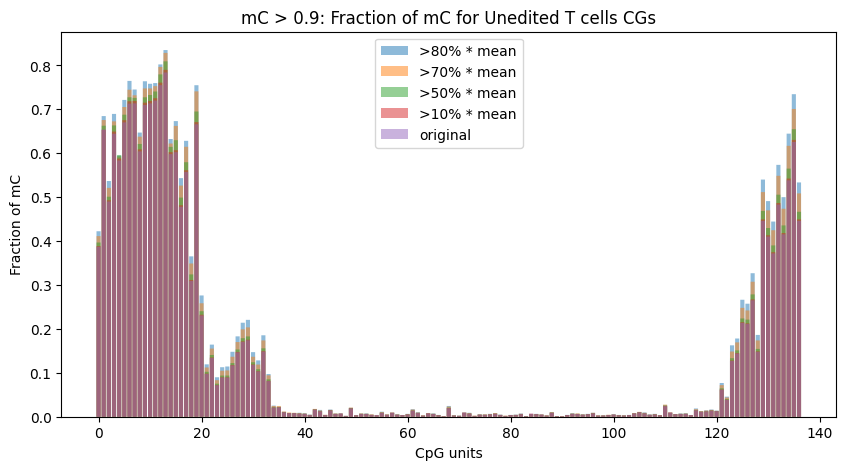

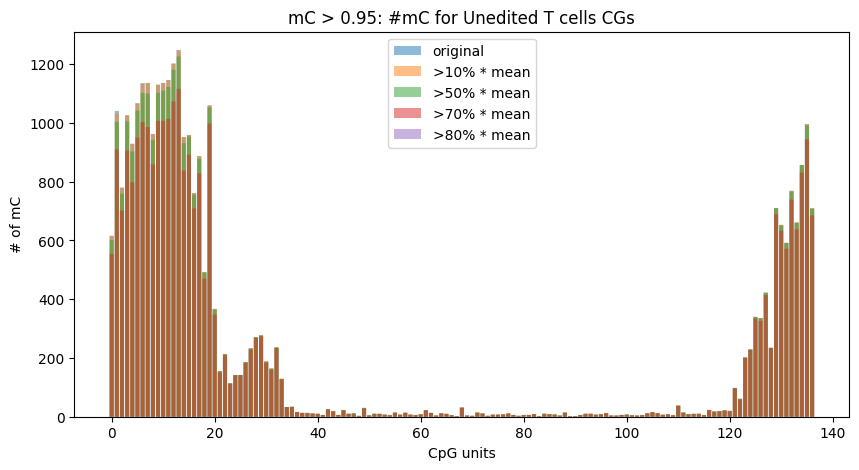

In [67]:
# CGs_all_unedited_remove_low80 vs. CGs_all_unedited_remove_low50 

# import matplotlib.pyplot as plt

# # Calculate the fraction of mC for both DataFrames
# CGs_all_unedited_cut['fraction_mC'] = CGs_all_unedited_cut['mC_sums'] / CGs_all_unedited_cut['num_reads']
# CGs_all_silenced_cut['fraction_mC'] = CGs_all_silenced_cut['mC_sums'] / CGs_all_silenced_cut['num_reads']


CGs_all_unedited_cut_sums = np.nansum(CGs_all_unedited_mc095_remove_low80.values, axis=0) 
CGs_all_unedited_cut_frac = CGs_all_unedited_cut_sums  / len(CGs_all_unedited_mc095_remove_low80) 


CGs_all_unedited_remove_low70_sums = np.nansum(CGs_all_unedited_mc095_remove_low70.values, axis=0) 
CGs_all_unedited_remove_low70_frac = CGs_all_unedited_remove_low70_sums  / len(CGs_all_unedited_mc095_remove_low70) 


CGs_all_silenced_cut_sums = np.nansum(CGs_all_unedited_mc095_remove_low50.values, axis=0) 
CGs_all_silenced_cut_frac = CGs_all_silenced_cut_sums  /len(CGs_all_unedited_mc095_remove_low50) 


CGs_all_unedited_remove_low10_sums = np.nansum(CGs_all_unedited_mc095_remove_low10.values, axis=0) 
CGs_all_unedited_remove_low10_frac = CGs_all_unedited_remove_low10_sums  / len(CGs_all_unedited_mc095_remove_low10) 

CGs_all_silenced_full_sums = np.nansum(CGs_all_unedited_mc095_original.values, axis=0) 
CGs_all_silenced_full_frac = CGs_all_silenced_full_sums / len(CGs_all_unedited_mc095_original) 



# Plot the fraction mC for CGs_all_unedited_cut
# plt.bar(CGs_all_unedited_cut.index, CGs_all_unedited_cut_frac, alpha=0.5, label='Unedited')

plt.figure(figsize=(10, 5))
# Plot the fraction mC for CGs_all_silenced_cut



plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_unedited_cut_frac, snap=False, alpha=0.5, label='>80% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low70_sums)), CGs_all_unedited_remove_low70_frac, snap=False, alpha=0.5, label='>70% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_silenced_cut_frac, snap=False, alpha=0.5, label='>50% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low10_sums)), CGs_all_unedited_remove_low10_frac, snap=False, alpha=0.5, label='>10% * mean')
plt.bar(np.arange(len(CGs_all_silenced_full_sums)), CGs_all_silenced_full_frac, snap=False, alpha=0.5, label='original')


# plt.title(f"{experiment_name}\nSum of mCs of CpG units (fwd + rvs)")
# plt.show()

# Add labels and title
plt.xlabel('CpG units')
plt.ylabel('Fraction of mC')
plt.title('mC > 0.9: Fraction of mC for Unedited T cells CGs')
plt.legend()

# Show the plot
plt.show()
 

CGs_all_unedited_remove_low70_sums = np.nansum(CGs_all_unedited_mc095_remove_low70.values, axis=0) 
CGs_all_unedited_remove_low70_frac = CGs_all_unedited_remove_low70_sums # / len(CGs_all_unedited_mc095_remove_low70) 


CGs_all_silenced_cut_sums = np.nansum(CGs_all_unedited_mc095_remove_low50.values, axis=0) 
CGs_all_silenced_cut_frac = CGs_all_silenced_cut_sums # /len(CGs_all_unedited_mc095_remove_low50) 


CGs_all_unedited_remove_low10_sums = np.nansum(CGs_all_unedited_mc095_remove_low10.values, axis=0) 
CGs_all_unedited_remove_low10_frac = CGs_all_unedited_remove_low10_sums # / len(CGs_all_unedited_mc095_remove_low10) 

CGs_all_silenced_full_sums = np.nansum(CGs_all_unedited_mc095_original.values, axis=0) 
CGs_all_silenced_full_frac = CGs_all_silenced_full_sums # / len(CGs_all_unedited_mc07_original) 



# Plot the fraction mC for CGs_all_unedited_cut
# plt.bar(CGs_all_unedited_cut.index, CGs_all_unedited_cut_frac, alpha=0.5, label='Unedited')

plt.figure(figsize=(10, 5))
# Plot the fraction mC for CGs_all_silenced_cut


plt.bar(np.arange(len(CGs_all_silenced_full_sums)), CGs_all_silenced_full_frac, snap=False, alpha=0.5, label='original')
plt.bar(np.arange(len(CGs_all_unedited_remove_low10_sums)), CGs_all_unedited_remove_low10_frac, snap=False, alpha=0.5, label='>10% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_silenced_cut_frac, snap=False, alpha=0.5, label='>50% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low70_sums)), CGs_all_unedited_remove_low70_frac, snap=False, alpha=0.5, label='>70% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_unedited_cut_frac, snap=False, alpha=0.5, label='>80% * mean')



# plt.title(f"{experiment_name}\nSum of mCs of CpG units (fwd + rvs)")
# plt.show()

# Add labels and title
plt.xlabel('CpG units')
plt.ylabel('# of mC')
plt.title('mC > 0.95: #mC for Unedited T cells CGs')
plt.legend()

# Show the plot
plt.show()

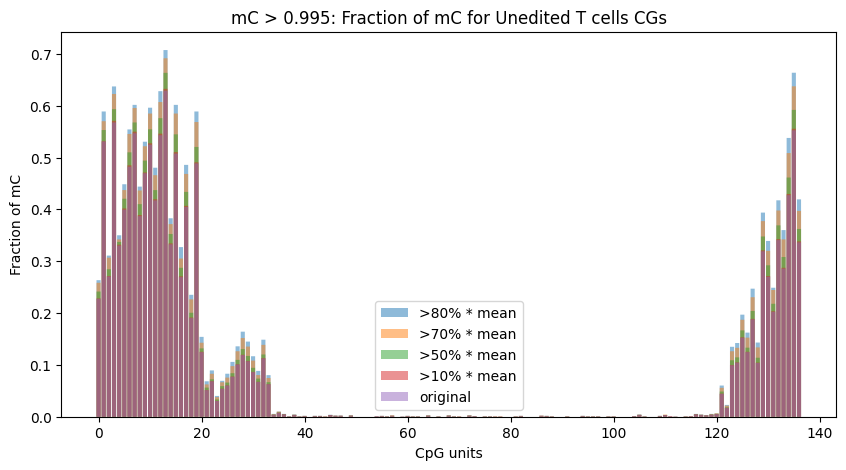

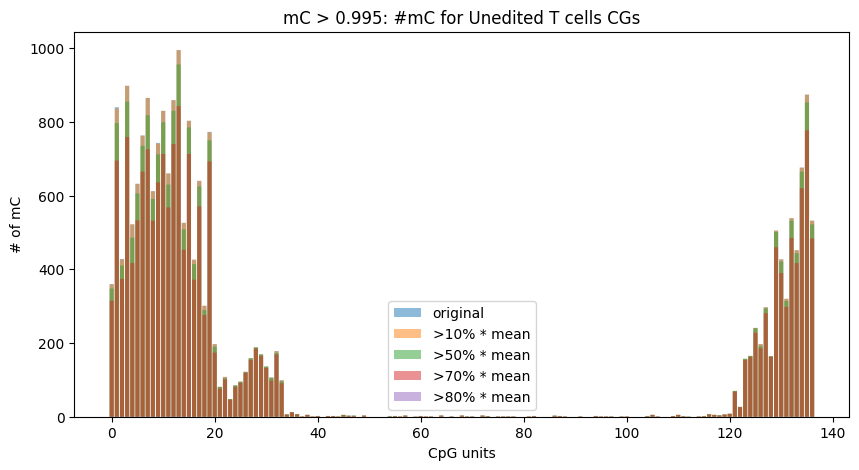

In [58]:
# CGs_all_unedited_remove_low80 vs. CGs_all_unedited_remove_low50 

# import matplotlib.pyplot as plt

# # Calculate the fraction of mC for both DataFrames
# CGs_all_unedited_cut['fraction_mC'] = CGs_all_unedited_cut['mC_sums'] / CGs_all_unedited_cut['num_reads']
# CGs_all_silenced_cut['fraction_mC'] = CGs_all_silenced_cut['mC_sums'] / CGs_all_silenced_cut['num_reads']


CGs_all_unedited_cut_sums = np.nansum(CGs_all_unedited_mc0995_remove_low80.values, axis=0) 
CGs_all_unedited_cut_frac = CGs_all_unedited_cut_sums  / len(CGs_all_unedited_mc0995_remove_low80) 


CGs_all_unedited_remove_low70_sums = np.nansum(CGs_all_unedited_mc0995_remove_low70.values, axis=0) 
CGs_all_unedited_remove_low70_frac = CGs_all_unedited_remove_low70_sums  / len(CGs_all_unedited_mc0995_remove_low70) 


CGs_all_silenced_cut_sums = np.nansum(CGs_all_unedited_mc0995_remove_low50.values, axis=0) 
CGs_all_silenced_cut_frac = CGs_all_silenced_cut_sums  /len(CGs_all_unedited_mc0995_remove_low50) 


CGs_all_unedited_remove_low10_sums = np.nansum(CGs_all_unedited_mc0995_remove_low10.values, axis=0) 
CGs_all_unedited_remove_low10_frac = CGs_all_unedited_remove_low10_sums  / len(CGs_all_unedited_mc0995_remove_low10) 

CGs_all_silenced_full_sums = np.nansum(CGs_all_unedited_mc0995_original.values, axis=0) 
CGs_all_silenced_full_frac = CGs_all_silenced_full_sums / len(CGs_all_unedited_mc0995_original) 



# Plot the fraction mC for CGs_all_unedited_cut
# plt.bar(CGs_all_unedited_cut.index, CGs_all_unedited_cut_frac, alpha=0.5, label='Unedited')

plt.figure(figsize=(10, 5))
# Plot the fraction mC for CGs_all_silenced_cut



plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_unedited_cut_frac, snap=False, alpha=0.5, label='>80% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low70_sums)), CGs_all_unedited_remove_low70_frac, snap=False, alpha=0.5, label='>70% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_silenced_cut_frac, snap=False, alpha=0.5, label='>50% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low10_sums)), CGs_all_unedited_remove_low10_frac, snap=False, alpha=0.5, label='>10% * mean')
plt.bar(np.arange(len(CGs_all_silenced_full_sums)), CGs_all_silenced_full_frac, snap=False, alpha=0.5, label='original')


# plt.title(f"{experiment_name}\nSum of mCs of CpG units (fwd + rvs)")
# plt.show()

# Add labels and title
plt.xlabel('CpG units')
plt.ylabel('Fraction of mC')
plt.title('mC > 0.995: Fraction of mC for Unedited T cells CGs')
plt.legend()

# Show the plot
plt.show()
 

CGs_all_unedited_remove_low70_sums = np.nansum(CGs_all_unedited_mc0995_remove_low70.values, axis=0) 
CGs_all_unedited_remove_low70_frac = CGs_all_unedited_remove_low70_sums # / len(CGs_all_unedited_mc07_remove_low70) 


CGs_all_silenced_cut_sums = np.nansum(CGs_all_unedited_mc0995_remove_low50.values, axis=0) 
CGs_all_silenced_cut_frac = CGs_all_silenced_cut_sums # /len(CGs_all_unedited_mc07_remove_low50) 


CGs_all_unedited_remove_low10_sums = np.nansum(CGs_all_unedited_mc0995_remove_low10.values, axis=0) 
CGs_all_unedited_remove_low10_frac = CGs_all_unedited_remove_low10_sums # / len(CGs_all_unedited_mc07_remove_low10) 

CGs_all_silenced_full_sums = np.nansum(CGs_all_unedited_mc0995_original.values, axis=0) 
CGs_all_silenced_full_frac = CGs_all_silenced_full_sums # / len(CGs_all_unedited_mc07_original) 



# Plot the fraction mC for CGs_all_unedited_cut
# plt.bar(CGs_all_unedited_cut.index, CGs_all_unedited_cut_frac, alpha=0.5, label='Unedited')

plt.figure(figsize=(10, 5))
# Plot the fraction mC for CGs_all_silenced_cut


plt.bar(np.arange(len(CGs_all_silenced_full_sums)), CGs_all_silenced_full_frac, snap=False, alpha=0.5, label='original')
plt.bar(np.arange(len(CGs_all_unedited_remove_low10_sums)), CGs_all_unedited_remove_low10_frac, snap=False, alpha=0.5, label='>10% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_silenced_cut_frac, snap=False, alpha=0.5, label='>50% * mean')
plt.bar(np.arange(len(CGs_all_unedited_remove_low70_sums)), CGs_all_unedited_remove_low70_frac, snap=False, alpha=0.5, label='>70% * mean')
plt.bar(np.arange(len(CGs_all_silenced_cut_sums)), CGs_all_unedited_cut_frac, snap=False, alpha=0.5, label='>80% * mean')



# plt.title(f"{experiment_name}\nSum of mCs of CpG units (fwd + rvs)")
# plt.show()

# Add labels and title
plt.xlabel('CpG units')
plt.ylabel('# of mC')
plt.title('mC > 0.995: #mC for Unedited T cells CGs')
plt.legend()

# Show the plot
plt.show()

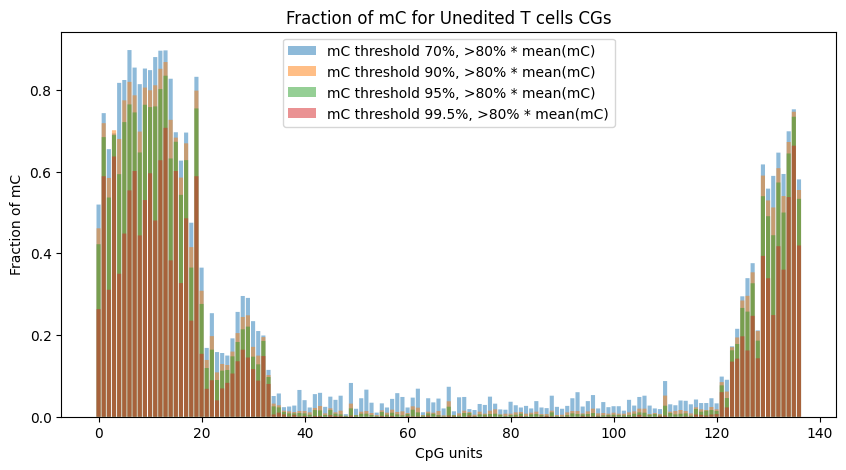

In [78]:
# CGs_all_unedited_remove_low80 vs. CGs_all_unedited_remove_low50 

# import matplotlib.pyplot as plt

# # Calculate the fraction of mC for both DataFrames
# CGs_all_unedited_cut['fraction_mC'] = CGs_all_unedited_cut['mC_sums'] / CGs_all_unedited_cut['num_reads']
# CGs_all_silenced_cut['fraction_mC'] = CGs_all_silenced_cut['mC_sums'] / CGs_all_silenced_cut['num_reads']


CGs_all_unedited_07_remove_low80_sums = np.nansum(CGs_all_unedited_mc07_remove_low80.values, axis=0) 
CGs_all_unedited_07_remove_low80_frac = CGs_all_unedited_07_remove_low80_sums / len(CGs_all_unedited_mc07_remove_low80) 

CGs_all_unedited_09_remove_low80_sums = np.nansum(CGs_all_unedited_mc09_remove_low80.values, axis=0) 
CGs_all_unedited_09_remove_low80_frac = CGs_all_unedited_09_remove_low80_sums  / len(CGs_all_unedited_mc09_remove_low80) 

CGs_all_unedited_095_remove_low80_sums = np.nansum(CGs_all_unedited_mc095_remove_low80.values, axis=0) 
CGs_all_unedited_095_remove_low80_frac = CGs_all_unedited_095_remove_low80_sums  /len(CGs_all_unedited_mc095_remove_low80) 

CGs_all_unedited_0995_remove_low80_sums = np.nansum(CGs_all_unedited_mc0995_remove_low80.values, axis=0) 
CGs_all_unedited_0995_remove_low80_frac = CGs_all_unedited_0995_remove_low80_sums  / len(CGs_all_unedited_mc0995_remove_low80) 

# CGs_all_unedited_cut_sums = np.nansum(CGs_all_unedited_mc0995_remove_low70.values, axis=0) 
# CGs_all_unedited_cut_frac = CGs_all_unedited_cut_sums  / len(CGs_all_unedited_mc0995_remove_low80) 



# Plot the fraction mC for CGs_all_unedited_cut
# plt.bar(CGs_all_unedited_cut.index, CGs_all_unedited_cut_frac, alpha=0.5, label='Unedited')

plt.figure(figsize=(10, 5))
# Plot the fraction mC for CGs_all_silenced_cut



plt.bar(np.arange(len(CGs_all_unedited_07_remove_low80_sums)), CGs_all_unedited_07_remove_low80_frac, snap=False, alpha=0.5, label='mC threshold 70%, >80% * mean(mC)')
plt.bar(np.arange(len(CGs_all_unedited_09_remove_low80_sums)), CGs_all_unedited_09_remove_low80_frac, snap=False, alpha=0.5, label='mC threshold 90%, >80% * mean(mC)')
plt.bar(np.arange(len(CGs_all_unedited_095_remove_low80_sums)), CGs_all_unedited_095_remove_low80_frac, snap=False, alpha=0.5, label='mC threshold 95%, >80% * mean(mC)')
plt.bar(np.arange(len(CGs_all_unedited_0995_remove_low80_sums)), CGs_all_unedited_0995_remove_low80_frac, snap=False, alpha=0.5, label='mC threshold 99.5%, >80% * mean(mC)')
# plt.bar(np.arange(len(CGs_all_unedited_07_remove_low70_sums)), CGs_all_unedited_07_remove_low70_frac, snap=False, alpha=0.5, label='mC threshold 70%, >80% * mean(mC)')


# plt.title(f"{experiment_name}\nSum of mCs of CpG units (fwd + rvs)")
# plt.show()

# Add labels and title
plt.xlabel('CpG units')
plt.ylabel('Fraction of mC')
plt.title('Fraction of mC for Unedited T cells CGs')
plt.legend()

# Show the plot
plt.show()
 


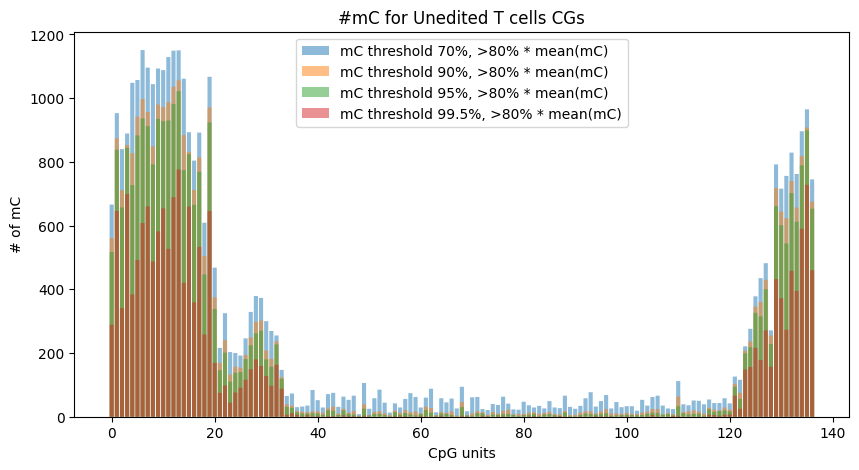

In [79]:
# CGs_all_unedited_remove_low80 vs. CGs_all_unedited_remove_low50 

# import matplotlib.pyplot as plt

# # Calculate the fraction of mC for both DataFrames
# CGs_all_unedited_cut['fraction_mC'] = CGs_all_unedited_cut['mC_sums'] / CGs_all_unedited_cut['num_reads']
# CGs_all_silenced_cut['fraction_mC'] = CGs_all_silenced_cut['mC_sums'] / CGs_all_silenced_cut['num_reads']


CGs_all_unedited_07_remove_low80_sums = np.nansum(CGs_all_unedited_mc07_remove_low80.values, axis=0) 
CGs_all_unedited_07_remove_low80_frac = CGs_all_unedited_07_remove_low80_sums  # / len(CGs_all_unedited_mc07_remove_low80) 

CGs_all_unedited_09_remove_low80_sums = np.nansum(CGs_all_unedited_mc09_remove_low80.values, axis=0) 
CGs_all_unedited_09_remove_low80_frac = CGs_all_unedited_09_remove_low80_sums  # / len(CGs_all_unedited_mc09_remove_low80) 

CGs_all_unedited_095_remove_low80_sums = np.nansum(CGs_all_unedited_mc095_remove_low80.values, axis=0) 
CGs_all_unedited_095_remove_low80_frac = CGs_all_unedited_095_remove_low80_sums  # /len(CGs_all_unedited_mc095_remove_low80) 

CGs_all_unedited_0995_remove_low80_sums = np.nansum(CGs_all_unedited_mc0995_remove_low80.values, axis=0) 
CGs_all_unedited_0995_remove_low80_frac = CGs_all_unedited_0995_remove_low80_sums  # / len(CGs_all_unedited_mc0995_remove_low80) 

# CGs_all_unedited_cut_sums = np.nansum(CGs_all_unedited_mc0995_remove_low70.values, axis=0) 
# CGs_all_unedited_cut_frac = CGs_all_unedited_cut_sums  / len(CGs_all_unedited_mc0995_remove_low80) 



# Plot the fraction mC for CGs_all_unedited_cut
# plt.bar(CGs_all_unedited_cut.index, CGs_all_unedited_cut_frac, alpha=0.5, label='Unedited')

plt.figure(figsize=(10, 5))
# Plot the fraction mC for CGs_all_silenced_cut



plt.bar(np.arange(len(CGs_all_unedited_07_remove_low80_sums)), CGs_all_unedited_07_remove_low80_frac, snap=False, alpha=0.5, label='mC threshold 70%, >80% * mean(mC)')
plt.bar(np.arange(len(CGs_all_unedited_09_remove_low80_sums)), CGs_all_unedited_09_remove_low80_frac, snap=False, alpha=0.5, label='mC threshold 90%, >80% * mean(mC)')
plt.bar(np.arange(len(CGs_all_unedited_095_remove_low80_sums)), CGs_all_unedited_095_remove_low80_frac, snap=False, alpha=0.5, label='mC threshold 95%, >80% * mean(mC)')
plt.bar(np.arange(len(CGs_all_unedited_0995_remove_low80_sums)), CGs_all_unedited_0995_remove_low80_frac, snap=False, alpha=0.5, label='mC threshold 99.5%, >80% * mean(mC)')
# plt.bar(np.arange(len(CGs_all_unedited_07_remove_low70_sums)), CGs_all_unedited_07_remove_low70_frac, snap=False, alpha=0.5, label='mC threshold 70%, >80% * mean(mC)')


# plt.title(f"{experiment_name}\nSum of mCs of CpG units (fwd + rvs)")
# plt.show()

# Add labels and title
plt.xlabel('CpG units')
plt.ylabel('# of mC')
plt.title('#mC for Unedited T cells CGs')
plt.legend()

# Show the plot
plt.show()
 
